d:\AlgoT\.venv\Lib\site-packages\mplfinance\_arg_validators.py:84: UserWarning: 


            POSSIBLE TO SEE DETAILS (Candles, Ohlc-Bars, Etc.)
   For more information see:
   - https://github.com/matplotlib/mplfinance/wiki/Plotting-Too-Much-Data
   
   TO SILENCE THIS WARNING, set `type='line'` in `mpf.plot()`
   OR set kwarg `warn_too_much_data=N` where N is an integer 
   LARGER than the number of data points you want to plot.

  warnings.warn('\n\n ================================================================= '+


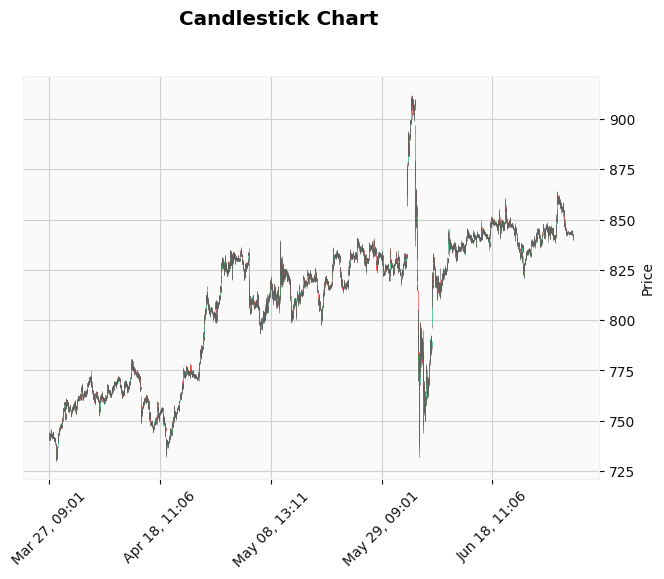

In [14]:
import mplfinance as mpf
import pandas as pd
data = pd.read_csv(r"D:\AlgoT\stock-pattern-main\stock-pattern-main\banknifty data\sbin.csv")
# Convert the Datetime column to datetime type and set it as the index
data['Datetime'] = pd.to_datetime(data['Datetime'])
data.set_index('Datetime', inplace=True)

# Drop any irrelevant columns
data.drop(columns=['Unnamed: 0', 'Ignore'], inplace=True)

# Create a candlestick chart
mpf.plot(data, type='candle', title='Candlestick Chart', style='yahoo', volume=False)


                           Hammer  Shooting Star  Engulfing Pattern  \
Datetime                                                              
2024-04-04 00:00:00+05:30     NaN            NaN             -100.0   
2024-04-15 00:00:00+05:30   100.0            NaN                NaN   
2024-04-16 00:00:00+05:30     NaN            NaN                NaN   
2024-04-19 00:00:00+05:30     NaN            NaN                NaN   
2024-04-23 00:00:00+05:30     NaN            NaN                NaN   
2024-04-25 00:00:00+05:30     NaN            NaN              100.0   
2024-04-30 00:00:00+05:30     NaN            NaN                NaN   
2024-05-02 00:00:00+05:30     NaN         -100.0                NaN   
2024-05-03 00:00:00+05:30     NaN            NaN                NaN   
2024-05-06 00:00:00+05:30     NaN            NaN                NaN   
2024-05-13 00:00:00+05:30   100.0            NaN                NaN   
2024-05-15 00:00:00+05:30     NaN            NaN                NaN   
2024-0

C:\Users\Aviral Mishra\AppData\Local\Temp\ipykernel_20344\1868557635.py:72: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  plt.tight_layout()
d:\AlgoT\.venv\Lib\site-packages\IPython\core\pylabtools.py:170: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.canvas.print_figure(bytes_io, **kw)


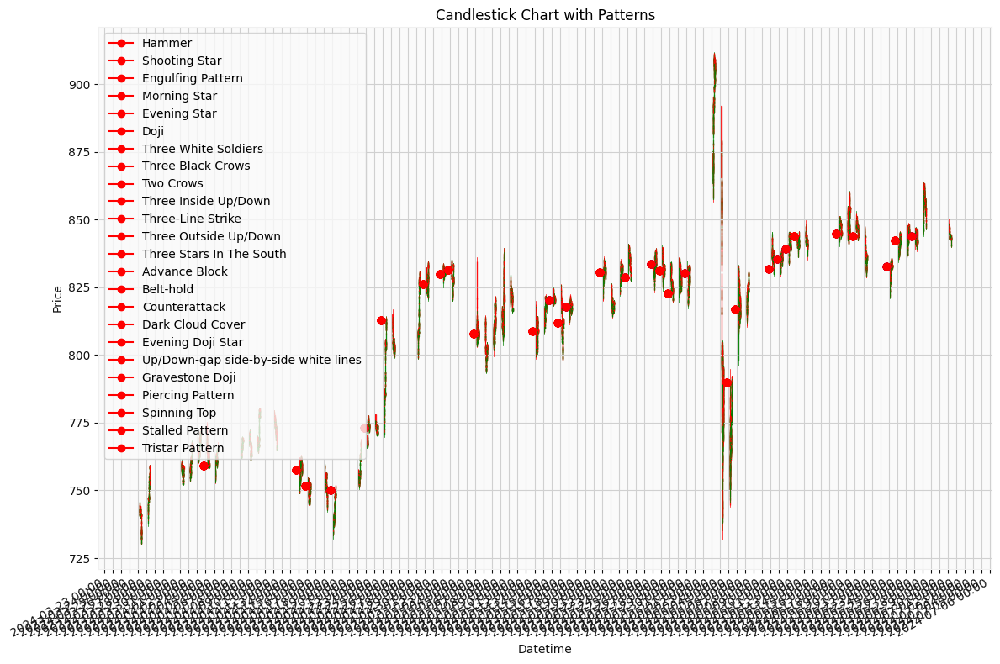


Pattern: Hammer
 - Date: 2024-04-04 00:00:00+05:30, Signal: nan
 - Date: 2024-04-15 00:00:00+05:30, Signal: 100.0
 - Date: 2024-04-16 00:00:00+05:30, Signal: nan
 - Date: 2024-04-19 00:00:00+05:30, Signal: nan
 - Date: 2024-04-23 00:00:00+05:30, Signal: nan
 - Date: 2024-04-25 00:00:00+05:30, Signal: nan
 - Date: 2024-04-30 00:00:00+05:30, Signal: nan
 - Date: 2024-05-02 00:00:00+05:30, Signal: nan
 - Date: 2024-05-03 00:00:00+05:30, Signal: nan
 - Date: 2024-05-06 00:00:00+05:30, Signal: nan
 - Date: 2024-05-13 00:00:00+05:30, Signal: 100.0
 - Date: 2024-05-15 00:00:00+05:30, Signal: nan
 - Date: 2024-05-16 00:00:00+05:30, Signal: nan
 - Date: 2024-05-17 00:00:00+05:30, Signal: nan
 - Date: 2024-05-21 00:00:00+05:30, Signal: nan
 - Date: 2024-05-24 00:00:00+05:30, Signal: nan
 - Date: 2024-05-27 00:00:00+05:30, Signal: nan
 - Date: 2024-05-28 00:00:00+05:30, Signal: nan
 - Date: 2024-05-29 00:00:00+05:30, Signal: nan
 - Date: 2024-05-31 00:00:00+05:30, Signal: nan
 - Date: 2024-06-05

In [15]:
# Recognize patterns using TA-Lib on daily data
patterns = {
    'Hammer': talib.CDLHAMMER,
    'Shooting Star': talib.CDLSHOOTINGSTAR,
    'Engulfing Pattern': talib.CDLENGULFING,
    'Morning Star': talib.CDLMORNINGSTAR,
    'Evening Star': talib.CDLEVENINGSTAR,
    'Doji': talib.CDLDOJI,
    'Three White Soldiers': talib.CDL3WHITESOLDIERS,
    'Three Black Crows': talib.CDL3BLACKCROWS,
    'Two Crows': talib.CDL2CROWS,
    'Three Inside Up/Down': talib.CDL3INSIDE,
    'Three-Line Strike': talib.CDL3LINESTRIKE,
    'Three Outside Up/Down': talib.CDL3OUTSIDE,
    'Three Stars In The South': talib.CDL3STARSINSOUTH,
    'Advance Block': talib.CDLADVANCEBLOCK,
    'Belt-hold': talib.CDLBELTHOLD,
    'Counterattack': talib.CDLCOUNTERATTACK,
    'Dark Cloud Cover': talib.CDLDARKCLOUDCOVER,
    'Evening Doji Star': talib.CDLEVENINGDOJISTAR,
    'Up/Down-gap side-by-side white lines': talib.CDLGAPSIDESIDEWHITE,
    'Gravestone Doji': talib.CDLGRAVESTONEDOJI,
    'Piercing Pattern': talib.CDLPIERCING,
    'Spinning Top': talib.CDLSPINNINGTOP,
    'Stalled Pattern': talib.CDLSTALLEDPATTERN,
    'Tristar Pattern': talib.CDLTRISTAR
}

# Apply pattern recognition on daily data
results = {}
for pattern_name, pattern_func in patterns.items():
    if pattern_func is not None:
        results[pattern_name] = pattern_func(daily_data['Open'], daily_data['High'], daily_data['Low'], daily_data['Close'])

# Convert results to a DataFrame for easier visualization
pattern_df = pd.DataFrame(results, index=daily_data.index)

# Extract the detected patterns
detected_patterns = pattern_df[pattern_df != 0].dropna(how='all')
print(detected_patterns)

# Prepare for plotting
ohlc = data.copy()
ohlc['Datetime'] = ohlc.index.map(mdates.date2num)
ohlc_data = ohlc[['Datetime', 'Open', 'High', 'Low', 'Close']].values

# Plot candlestick chart with pattern signals using original datetime index
fig, ax = plt.subplots(figsize=(12, 8))
candlestick_ohlc(ax, ohlc_data, width=0.01, colorup='green', colordown='red', alpha=0.8)

# Plot patterns
for pattern_name in patterns:
    if pattern_name in detected_patterns:
        signals = detected_patterns[pattern_name]
        for date, signal in signals.items():
            if signal != 0:
                color = 'blue' if signal > 0 else 'red'
                ax.plot(date, daily_data.loc[date, 'Close'], marker='o', color=color, label=pattern_name if date == signals.index[0] else "")

# Format x-axis
ax.xaxis.set_major_formatter(mdates.DateFormatter('%Y-%m-%d %H:%M'))
ax.xaxis.set_major_locator(mdates.DayLocator(interval=1))
fig.autofmt_xdate()

# Set labels and title
ax.set_xlabel('Datetime')
ax.set_ylabel('Price')
plt.title('Candlestick Chart with Patterns')
plt.legend()

# Display the chart
plt.tight_layout()
plt.show()

# Print out the list of patterns found with their datetime
for pattern_name in patterns:
    if pattern_name in detected_patterns:
        signals = detected_patterns[pattern_name]
        pattern_dates = signals[signals != 0].index
        if not pattern_dates.empty:
            print(f"\nPattern: {pattern_name}")
            for date in pattern_dates:
                print(f" - Date: {date}, Signal: {signals[date]}")
                


In [3]:
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.dates as mdates
from mplfinance.original_flavor import candlestick_ohlc
import matplotlib.dates as mpl_dates

Locator attempting to generate 2542 ticks ([19804.333333333332, ..., 19910.208333333332]), which exceeds Locator.MAXTICKS (1000).
Locator attempting to generate 2542 ticks ([19804.333333333332, ..., 19910.208333333332]), which exceeds Locator.MAXTICKS (1000).
Locator attempting to generate 2542 ticks ([19804.333333333332, ..., 19910.208333333332]), which exceeds Locator.MAXTICKS (1000).
Locator attempting to generate 2542 ticks ([19804.333333333332, ..., 19910.208333333332]), which exceeds Locator.MAXTICKS (1000).
Locator attempting to generate 2542 ticks ([19804.333333333332, ..., 19910.208333333332]), which exceeds Locator.MAXTICKS (1000).
Locator attempting to generate 2542 ticks ([19804.333333333332, ..., 19910.208333333332]), which exceeds Locator.MAXTICKS (1000).
Locator attempting to generate 2542 ticks ([19804.333333333332, ..., 19910.208333333332]), which exceeds Locator.MAXTICKS (1000).
Locator attempting to generate 2542 ticks ([19804.333333333332, ..., 19910.208333333332]),

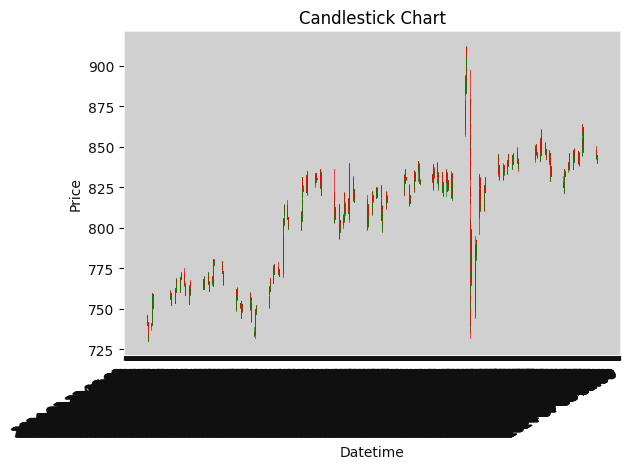

In [4]:


# Load the data
file_path = r"D:\AlgoT\stock-pattern-main\stock-pattern-main\banknifty data\sbin.csv"
data = pd.read_csv(file_path)

# Convert the Datetime column to datetime type and set it as the index
data['Datetime'] = pd.to_datetime(data['Datetime'])
data.set_index('Datetime', inplace=True)

# Drop any irrelevant columns
data.drop(columns=['Unnamed: 0', 'Ignore'], inplace=True)

# Prepare the data for candlestick chart
data_ohlc = data.copy()
data_ohlc['Datetime'] = data_ohlc.index.map(mpl_dates.date2num)
ohlc = data_ohlc[['Datetime', 'Open', 'High', 'Low', 'Close']].values

# Plot candlestick chart
fig, ax = plt.subplots()
candlestick_ohlc(ax, ohlc, width=0.01, colorup='green', colordown='red', alpha=0.8)

# Format x-axis
ax.xaxis.set_major_formatter(mdates.DateFormatter('%Y-%m-%d %H:%M'))
ax.xaxis.set_major_locator(mdates.HourLocator(interval=1))
fig.autofmt_xdate()

# Set labels and title
ax.set_xlabel('Datetime')
ax.set_ylabel('Price')
plt.title('Candlestick Chart')

# Display the chart
plt.tight_layout()
plt.show()


In [5]:
# Recognize patterns using TA-Lib
import talib
patterns = {
    'Hammer': talib.CDLHAMMER,
    'Shooting Star': talib.CDLSHOOTINGSTAR,
    'Engulfing Pattern': talib.CDLENGULFING,
    'Head and Shoulders': None  # Custom logic needed
}

# Apply pattern recognition
results = {}
for pattern_name, pattern_func in patterns.items():
    if pattern_func is not None:
        results[pattern_name] = pattern_func(data['Open'], data['High'], data['Low'], data['Close'])

# Convert results to a DataFrame for easier visualization
pattern_df = pd.DataFrame(results, index=data.index)

# Print out the first few rows to see the detected patterns
print(pattern_df.head())


                           Hammer  Shooting Star  Engulfing Pattern
Datetime                                                           
2024-03-27 09:01:00+05:30       0              0                  0
2024-03-27 09:02:00+05:30       0              0                  0
2024-03-27 09:03:00+05:30       0              0                  0
2024-03-27 09:04:00+05:30       0              0                  0
2024-03-27 09:05:00+05:30       0              0                  0


In [6]:
def identify_head_and_shoulders(data):
    # Placeholder for the custom logic to identify head and shoulders pattern
    # You may need to implement more sophisticated logic here
    return []

# Example usage
head_and_shoulders_signals = identify_head_and_shoulders(data)
print("Head and Shoulders Signals:", head_and_shoulders_signals)


Head and Shoulders Signals: []


In [7]:
# Add pattern signals to the chart
fig, ax = plt.subplots()
candlestick_ohlc(ax, ohlc, width=0.01, colorup='green', colordown='red', alpha=0.8)

# Plot patterns
for pattern_name in patterns:
    signals = pattern_df[pattern_name]
    for i, signal in enumerate(signals):
        if signal != 0:
            color = 'blue' if signal > 0 else 'red'
            ax.plot(data.index[i], data['Close'][i], marker='o', color=color)

# Format x-axis
ax.xaxis.set_major_formatter(mdates.DateFormatter('%Y-%m-%d %H:%M'))
ax.xaxis.set_major_locator(mdates.HourLocator(interval=1))
fig.autofmt_xdate()

# Set labels and title
ax.set_xlabel('Datetime')
ax.set_ylabel('Price')
plt.title('Candlestick Chart with Patterns')

# Display the chart
plt.tight_layout()
plt.show()


C:\Users\Aviral Mishra\AppData\Local\Temp\ipykernel_20344\961752372.py:11: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  ax.plot(data.index[i], data['Close'][i], marker='o', color=color)


KeyError: 'Head and Shoulders'

Error in callback <function flush_figures at 0x000002E2A868A840> (for post_execute), with arguments args (),kwargs {}:


KeyboardInterrupt: 

                           Hammer  Shooting Star  Engulfing Pattern  \
Datetime                                                              
2024-03-27 09:01:00+05:30       0              0                  0   
2024-03-27 09:02:00+05:30       0              0                  0   
2024-03-27 09:03:00+05:30       0              0                  0   
2024-03-27 09:04:00+05:30       0              0                  0   
2024-03-27 09:05:00+05:30       0              0                  0   

                           Morning Star  Evening Star  Doji  \
Datetime                                                      
2024-03-27 09:01:00+05:30             0             0     0   
2024-03-27 09:02:00+05:30             0             0     0   
2024-03-27 09:03:00+05:30             0             0     0   
2024-03-27 09:04:00+05:30             0             0     0   
2024-03-27 09:05:00+05:30             0             0     0   

                           Three White Soldiers  Three Black

C:\Users\Aviral Mishra\AppData\Local\Temp\ipykernel_20344\3147991975.py:58: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  ax.plot(data.index[i], data['Close'][i], marker='o', color=color)
Locator attempting to generate 2542 ticks ([19804.333333333332, ..., 19910.208333333332]), which exceeds Locator.MAXTICKS (1000).
Locator attempting to generate 2542 ticks ([19804.333333333332, ..., 19910.208333333332]), which exceeds Locator.MAXTICKS (1000).
Locator attempting to generate 2542 ticks ([19804.333333333332, ..., 19910.208333333332]), which exceeds Locator.MAXTICKS (1000).
Locator attempting to generate 2542 ticks ([19804.333333333332, ..., 19910.208333333332]), which exceeds Locator.MAXTICKS (1000).
Locator attempting to generate 2542 ticks ([19804.333333333332, ..., 19910.208333333332]), which exceeds

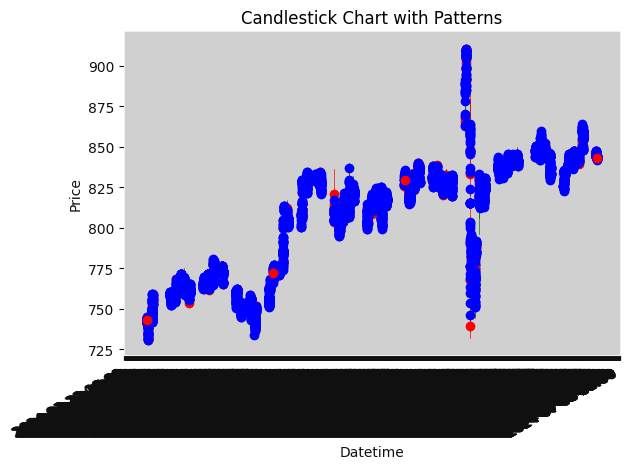

In [8]:
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.dates as mdates
from mplfinance.original_flavor import candlestick_ohlc
import matplotlib.dates as mpl_dates
import talib

# Load the data
file_path = r"D:\AlgoT\stock-pattern-main\stock-pattern-main\banknifty data\sbin.csv"
data = pd.read_csv(file_path)

# Convert the Datetime column to datetime type and set it as the index
data['Datetime'] = pd.to_datetime(data['Datetime'])
data.set_index('Datetime', inplace=True)

# Drop any irrelevant columns
data.drop(columns=['Unnamed: 0', 'Ignore'], inplace=True)

# Prepare the data for candlestick chart
data_ohlc = data.copy()
data_ohlc['Datetime'] = data_ohlc.index.map(mpl_dates.date2num)
ohlc = data_ohlc[['Datetime', 'Open', 'High', 'Low', 'Close']].values

# Recognize more patterns using TA-Lib
patterns = {
    'Hammer': talib.CDLHAMMER,
    'Shooting Star': talib.CDLSHOOTINGSTAR,
    'Engulfing Pattern': talib.CDLENGULFING,
    'Morning Star': talib.CDLMORNINGSTAR,
    'Evening Star': talib.CDLEVENINGSTAR,
    'Doji': talib.CDLDOJI,
    'Three White Soldiers': talib.CDL3WHITESOLDIERS,
    'Three Black Crows': talib.CDL3BLACKCROWS
}

# Apply pattern recognition
results = {}
for pattern_name, pattern_func in patterns.items():
    if pattern_func is not None:
        results[pattern_name] = pattern_func(data['Open'], data['High'], data['Low'], data['Close'])

# Convert results to a DataFrame for easier visualization
pattern_df = pd.DataFrame(results, index=data.index)

# Print out the first few rows to see the detected patterns
print(pattern_df.head())

# Plot candlestick chart with pattern signals
fig, ax = plt.subplots()
candlestick_ohlc(ax, ohlc, width=0.01, colorup='green', colordown='red', alpha=0.8)

# Plot patterns
for pattern_name in patterns:
    signals = pattern_df[pattern_name]
    for i, signal in enumerate(signals):
        if signal != 0:
            color = 'blue' if signal > 0 else 'red'
            ax.plot(data.index[i], data['Close'][i], marker='o', color=color)

# Format x-axis
ax.xaxis.set_major_formatter(mdates.DateFormatter('%Y-%m-%d %H:%M'))
ax.xaxis.set_major_locator(mdates.HourLocator(interval=1))
fig.autofmt_xdate()

# Set labels and title
ax.set_xlabel('Datetime')
ax.set_ylabel('Price')
plt.title('Candlestick Chart with Patterns')

# Display the chart
plt.tight_layout()
plt.show()


                           Hammer  Shooting Star  Engulfing Pattern  \
Datetime                                                              
2024-04-04 00:00:00+05:30     NaN            NaN             -100.0   
2024-04-15 00:00:00+05:30   100.0            NaN                NaN   
2024-04-16 00:00:00+05:30     NaN            NaN                NaN   
2024-04-19 00:00:00+05:30     NaN            NaN                NaN   
2024-04-23 00:00:00+05:30     NaN            NaN                NaN   
2024-04-25 00:00:00+05:30     NaN            NaN              100.0   
2024-04-30 00:00:00+05:30     NaN            NaN                NaN   
2024-05-02 00:00:00+05:30     NaN         -100.0                NaN   
2024-05-03 00:00:00+05:30     NaN            NaN                NaN   
2024-05-06 00:00:00+05:30     NaN            NaN                NaN   
2024-05-13 00:00:00+05:30   100.0            NaN                NaN   
2024-05-15 00:00:00+05:30     NaN            NaN                NaN   
2024-0

C:\Users\Aviral Mishra\AppData\Local\Temp\ipykernel_20344\99180429.py:76: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  ax.plot(daily_data.index[i], daily_data['Close'][i], marker='o', color=color, label=pattern_name if i == 0 else "")
C:\Users\Aviral Mishra\AppData\Local\Temp\ipykernel_20344\99180429.py:87: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend()


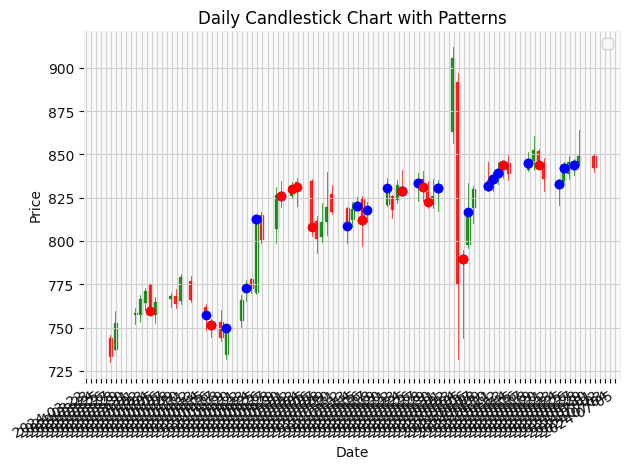

In [11]:
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.dates as mdates
from mplfinance.original_flavor import candlestick_ohlc
import talib

file_path = r"D:\AlgoT\stock-pattern-main\stock-pattern-main\banknifty data\sbin.csv"
data = pd.read_csv(file_path)

# Convert the Datetime column to datetime type
data['Datetime'] = pd.to_datetime(data['Datetime'])
data.set_index('Datetime', inplace=True)

# Aggregate data to daily frequency
daily_data = data.resample('D').agg({
    'Open': 'first',
    'High': 'max',
    'Low': 'min',
    'Close': 'last'
}).dropna()

# Prepare the data for candlestick chart
daily_data['Datetime'] = daily_data.index.map(mdates.date2num)
ohlc = daily_data[['Datetime', 'Open', 'High', 'Low', 'Close']].values

# Recognize patterns using TA-Lib
patterns = {
    'Hammer': talib.CDLHAMMER,
    'Shooting Star': talib.CDLSHOOTINGSTAR,
    'Engulfing Pattern': talib.CDLENGULFING,
    'Morning Star': talib.CDLMORNINGSTAR,
    'Evening Star': talib.CDLEVENINGSTAR,
    'Doji': talib.CDLDOJI,
    'Three White Soldiers': talib.CDL3WHITESOLDIERS,
    'Three Black Crows': talib.CDL3BLACKCROWS,
    'Two Crows': talib.CDL2CROWS,
    'Three Inside Up/Down': talib.CDL3INSIDE,
    'Three-Line Strike': talib.CDL3LINESTRIKE,
    'Three Outside Up/Down': talib.CDL3OUTSIDE,
    'Three Stars In The South': talib.CDL3STARSINSOUTH,
    'Advance Block': talib.CDLADVANCEBLOCK,
    'Belt-hold': talib.CDLBELTHOLD,
    'Counterattack': talib.CDLCOUNTERATTACK,
    'Dark Cloud Cover': talib.CDLDARKCLOUDCOVER,
    'Evening Doji Star': talib.CDLEVENINGDOJISTAR,
    'Up/Down-gap side-by-side white lines': talib.CDLGAPSIDESIDEWHITE,
    'Gravestone Doji': talib.CDLGRAVESTONEDOJI,
    'Piercing Pattern': talib.CDLPIERCING,
    'Spinning Top': talib.CDLSPINNINGTOP,
    'Stalled Pattern': talib.CDLSTALLEDPATTERN,
    'Tristar Pattern': talib.CDLTRISTAR
}

# Apply pattern recognition on daily data
results = {}
for pattern_name, pattern_func in patterns.items():
    if pattern_func is not None:
        results[pattern_name] = pattern_func(daily_data['Open'], daily_data['High'], daily_data['Low'], daily_data['Close'])

# Convert results to a DataFrame for easier visualization
pattern_df = pd.DataFrame(results, index=daily_data.index)

# Print out the detected patterns
print(pattern_df[pattern_df != 0].dropna(how='all'))

# Plot candlestick chart with pattern signals
fig, ax = plt.subplots()
candlestick_ohlc(ax, ohlc, width=0.6, colorup='green', colordown='red', alpha=0.8)

# Plot patterns
for pattern_name in patterns:
    signals = pattern_df[pattern_name]
    for i, signal in enumerate(signals):
        if signal != 0:
            color = 'blue' if signal > 0 else 'red'
            ax.plot(daily_data.index[i], daily_data['Close'][i], marker='o', color=color, label=pattern_name if i == 0 else "")

# Format x-axis
ax.xaxis.set_major_formatter(mdates.DateFormatter('%Y-%m-%d'))
ax.xaxis.set_major_locator(mdates.DayLocator(interval=1))
fig.autofmt_xdate()

# Set labels and title
ax.set_xlabel('Date')
ax.set_ylabel('Price')
plt.title('Daily Candlestick Chart with Patterns')
plt.legend()

# Display the chart
plt.tight_layout()
plt.show()


                           Hammer  Shooting Star  Engulfing Pattern  \
Datetime                                                              
2024-04-04 00:00:00+05:30     NaN            NaN             -100.0   
2024-04-15 00:00:00+05:30   100.0            NaN                NaN   
2024-04-16 00:00:00+05:30     NaN            NaN                NaN   
2024-04-19 00:00:00+05:30     NaN            NaN                NaN   
2024-04-23 00:00:00+05:30     NaN            NaN                NaN   
2024-04-25 00:00:00+05:30     NaN            NaN              100.0   
2024-04-30 00:00:00+05:30     NaN            NaN                NaN   
2024-05-02 00:00:00+05:30     NaN         -100.0                NaN   
2024-05-03 00:00:00+05:30     NaN            NaN                NaN   
2024-05-06 00:00:00+05:30     NaN            NaN                NaN   
2024-05-13 00:00:00+05:30   100.0            NaN                NaN   
2024-05-15 00:00:00+05:30     NaN            NaN                NaN   
2024-0

Locator attempting to generate 2542 ticks ([19804.333333333332, ..., 19910.208333333332]), which exceeds Locator.MAXTICKS (1000).
Locator attempting to generate 2542 ticks ([19804.333333333332, ..., 19910.208333333332]), which exceeds Locator.MAXTICKS (1000).
Locator attempting to generate 2542 ticks ([19804.333333333332, ..., 19910.208333333332]), which exceeds Locator.MAXTICKS (1000).
Locator attempting to generate 2542 ticks ([19804.333333333332, ..., 19910.208333333332]), which exceeds Locator.MAXTICKS (1000).
Locator attempting to generate 2542 ticks ([19804.333333333332, ..., 19910.208333333332]), which exceeds Locator.MAXTICKS (1000).
Locator attempting to generate 2542 ticks ([19804.333333333332, ..., 19910.208333333332]), which exceeds Locator.MAXTICKS (1000).
Locator attempting to generate 2542 ticks ([19804.333333333332, ..., 19910.208333333332]), which exceeds Locator.MAXTICKS (1000).
Locator attempting to generate 2542 ticks ([19804.333333333332, ..., 19910.208333333332]),

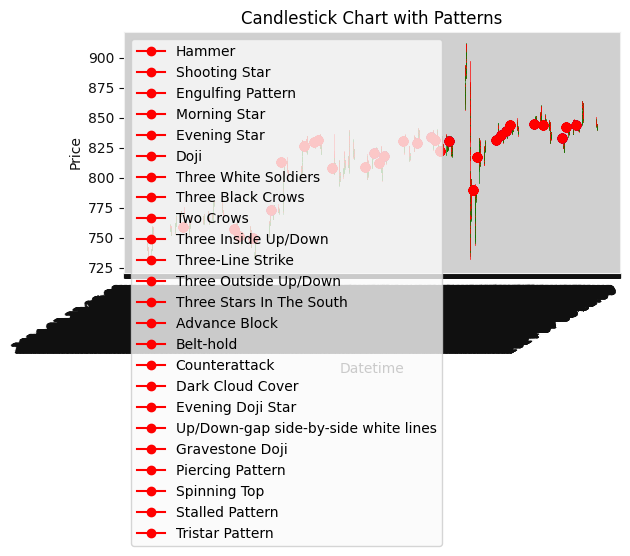


Pattern: Hammer
 - Date: 2024-04-04 00:00:00+05:30, Signal: nan
 - Date: 2024-04-15 00:00:00+05:30, Signal: 100.0
 - Date: 2024-04-16 00:00:00+05:30, Signal: nan
 - Date: 2024-04-19 00:00:00+05:30, Signal: nan
 - Date: 2024-04-23 00:00:00+05:30, Signal: nan
 - Date: 2024-04-25 00:00:00+05:30, Signal: nan
 - Date: 2024-04-30 00:00:00+05:30, Signal: nan
 - Date: 2024-05-02 00:00:00+05:30, Signal: nan
 - Date: 2024-05-03 00:00:00+05:30, Signal: nan
 - Date: 2024-05-06 00:00:00+05:30, Signal: nan
 - Date: 2024-05-13 00:00:00+05:30, Signal: 100.0
 - Date: 2024-05-15 00:00:00+05:30, Signal: nan
 - Date: 2024-05-16 00:00:00+05:30, Signal: nan
 - Date: 2024-05-17 00:00:00+05:30, Signal: nan
 - Date: 2024-05-21 00:00:00+05:30, Signal: nan
 - Date: 2024-05-24 00:00:00+05:30, Signal: nan
 - Date: 2024-05-27 00:00:00+05:30, Signal: nan
 - Date: 2024-05-28 00:00:00+05:30, Signal: nan
 - Date: 2024-05-29 00:00:00+05:30, Signal: nan
 - Date: 2024-05-31 00:00:00+05:30, Signal: nan
 - Date: 2024-06-05

In [13]:


# Aggregate data to daily frequency
daily_data = data.resample('D').agg({
    'Open': 'first',
    'High': 'max',
    'Low': 'min',
    'Close': 'last'
}).dropna()

# Recognize patterns using TA-Lib on daily data
patterns = {
    'Hammer': talib.CDLHAMMER,
    'Shooting Star': talib.CDLSHOOTINGSTAR,
    'Engulfing Pattern': talib.CDLENGULFING,
    'Morning Star': talib.CDLMORNINGSTAR,
    'Evening Star': talib.CDLEVENINGSTAR,
    'Doji': talib.CDLDOJI,
    'Three White Soldiers': talib.CDL3WHITESOLDIERS,
    'Three Black Crows': talib.CDL3BLACKCROWS,
    'Two Crows': talib.CDL2CROWS,
    'Three Inside Up/Down': talib.CDL3INSIDE,
    'Three-Line Strike': talib.CDL3LINESTRIKE,
    'Three Outside Up/Down': talib.CDL3OUTSIDE,
    'Three Stars In The South': talib.CDL3STARSINSOUTH,
    'Advance Block': talib.CDLADVANCEBLOCK,
    'Belt-hold': talib.CDLBELTHOLD,
    'Counterattack': talib.CDLCOUNTERATTACK,
    'Dark Cloud Cover': talib.CDLDARKCLOUDCOVER,
    'Evening Doji Star': talib.CDLEVENINGDOJISTAR,
    'Up/Down-gap side-by-side white lines': talib.CDLGAPSIDESIDEWHITE,
    'Gravestone Doji': talib.CDLGRAVESTONEDOJI,
    'Piercing Pattern': talib.CDLPIERCING,
    'Spinning Top': talib.CDLSPINNINGTOP,
    'Stalled Pattern': talib.CDLSTALLEDPATTERN,
    'Tristar Pattern': talib.CDLTRISTAR
}

# Apply pattern recognition on daily data
results = {}
for pattern_name, pattern_func in patterns.items():
    if pattern_func is not None:
        results[pattern_name] = pattern_func(daily_data['Open'], daily_data['High'], daily_data['Low'], daily_data['Close'])

# Convert results to a DataFrame for easier visualization
pattern_df = pd.DataFrame(results, index=daily_data.index)

# Extract the detected patterns
detected_patterns = pattern_df[pattern_df != 0].dropna(how='all')
print(detected_patterns)

# Prepare for plotting
ohlc = data.copy()
ohlc['Datetime'] = ohlc.index.map(mdates.date2num)
ohlc_data = ohlc[['Datetime', 'Open', 'High', 'Low', 'Close']].values

# Plot candlestick chart with pattern signals using original datetime index
fig, ax = plt.subplots()
candlestick_ohlc(ax, ohlc_data, width=0.01, colorup='green', colordown='red', alpha=0.8)

# Plot patterns
for pattern_name in patterns:
    if pattern_name in detected_patterns:
        signals = detected_patterns[pattern_name]
        for date, signal in signals.items():
            if signal != 0:
                color = 'blue' if signal > 0 else 'red'
                ax.plot(date, daily_data.loc[date, 'Close'], marker='o', color=color, label=pattern_name if date == signals.index[0] else "")

# Format x-axis
ax.xaxis.set_major_formatter(mdates.DateFormatter('%Y-%m-%d %H:%M'))
ax.xaxis.set_major_locator(mdates.HourLocator(interval=1))
fig.autofmt_xdate()

# Set labels and title
ax.set_xlabel('Datetime')
ax.set_ylabel('Price')
plt.title('Candlestick Chart with Patterns')
plt.legend()

# Display the chart
plt.tight_layout()
plt.show()

# Print out the list of patterns found with their datetime
for pattern_name in patterns:
    if pattern_name in detected_patterns:
        signals = detected_patterns[pattern_name]
        pattern_dates = signals[signals != 0].index
        if not pattern_dates.empty:
            print(f"\nPattern: {pattern_name}")
            for date in pattern_dates:
                print(f" - Date: {date}, Signal: {signals[date]}")


C:\Users\Aviral Mishra\AppData\Local\Temp\ipykernel_12708\1136630366.py:15: FutureWarning: 'T' is deprecated and will be removed in a future version, please use 'min' instead.
  data_15min = data.resample('15T').agg({


                             Open    High     Low   Close
Datetime                                                 
2024-03-27 09:00:00+05:30  744.05  744.90  740.35  741.45
2024-03-27 09:15:00+05:30  741.65  743.20  741.30  742.40
2024-03-27 09:30:00+05:30  742.45  742.95  740.45  741.70
2024-03-27 09:45:00+05:30  741.70  744.00  741.45  742.95
2024-03-27 10:00:00+05:30  742.95  745.85  742.55  743.75


C:\Users\Aviral Mishra\AppData\Local\Temp\ipykernel_12708\1136630366.py:29: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  if data['High'][i] > data['High'][i-1] and data['High'][i] > data['High'][i+1]:
C:\Users\Aviral Mishra\AppData\Local\Temp\ipykernel_12708\1136630366.py:31: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  if data['Low'][i] < data['Low'][i-1] and data['Low'][i] < data['Low'][i+1]:
C:\Users\Aviral Mishra\AppData\Local\Temp\ipykernel_12708\1136630366.py:32: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (cons

[{'left_shoulder': (46, Timestamp('2024-03-28 14:00:00+0530', tz='UTC+05:30'), 759.55), 'head': (52, Timestamp('2024-04-01 09:00:00+0530', tz='UTC+05:30'), 761.5), 'right_shoulder': (55, Timestamp('2024-04-01 09:45:00+0530', tz='UTC+05:30'), 760.5), 'neckline_level': 750.6}, {'left_shoulder': (61, Timestamp('2024-04-01 11:15:00+0530', tz='UTC+05:30'), 757.0), 'head': (63, Timestamp('2024-04-01 11:45:00+0530', tz='UTC+05:30'), 757.95), 'right_shoulder': (71, Timestamp('2024-04-01 13:45:00+0530', tz='UTC+05:30'), 756.7), 'neckline_level': 755.6}, {'left_shoulder': (79, Timestamp('2024-04-02 09:15:00+0530', tz='UTC+05:30'), 760.25), 'head': (88, Timestamp('2024-04-02 11:30:00+0530', tz='UTC+05:30'), 762.6), 'right_shoulder': (93, Timestamp('2024-04-02 12:45:00+0530', tz='UTC+05:30'), 762.3), 'neckline_level': 754.475}, {'left_shoulder': (99, Timestamp('2024-04-02 14:15:00+0530', tz='UTC+05:30'), 767.45), 'head': (102, Timestamp('2024-04-02 15:00:00+0530', tz='UTC+05:30'), 768.75), 'right_

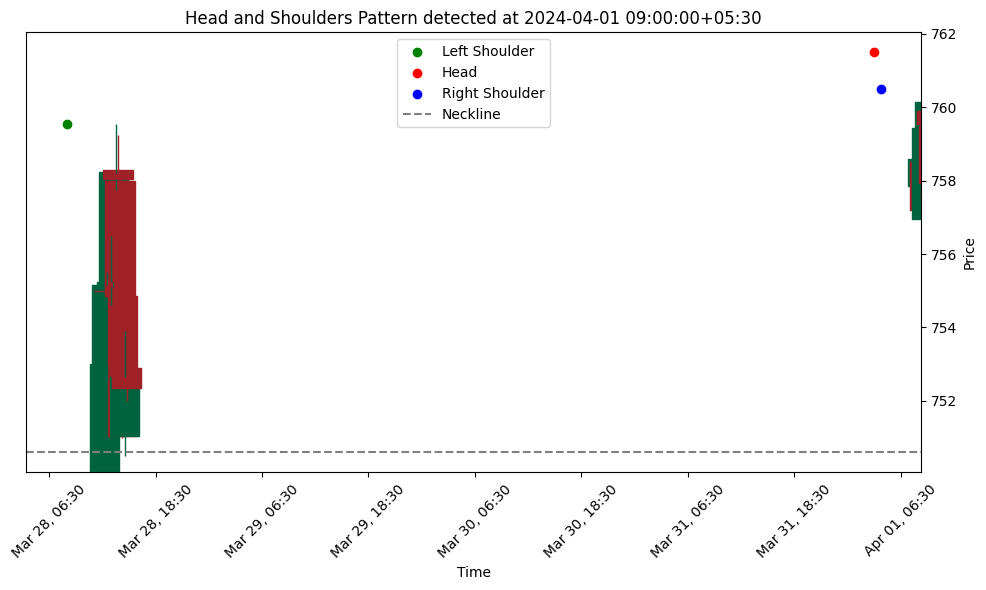

Left Shoulder: (61, Timestamp('2024-04-01 11:15:00+0530', tz='UTC+05:30'), 757.0), Head: (63, Timestamp('2024-04-01 11:45:00+0530', tz='UTC+05:30'), 757.95), Right Shoulder: (71, Timestamp('2024-04-01 13:45:00+0530', tz='UTC+05:30'), 756.7), Neckline Level: 755.6
                             Open    High     Low   Close
Datetime                                                 
2024-04-01 10:00:00+05:30  759.90  760.25  758.80  759.55
2024-04-01 10:15:00+05:30  759.50  759.85  757.40  757.95
2024-04-01 10:30:00+05:30  757.85  758.25  756.50  757.50
2024-04-01 10:45:00+05:30  757.50  758.15  754.50  755.70
2024-04-01 11:00:00+05:30  755.70  756.75  754.50  755.00
2024-04-01 11:15:00+05:30  754.85  757.00  754.60  756.00
2024-04-01 11:30:00+05:30  756.20  756.80  754.60  756.25
2024-04-01 11:45:00+05:30  756.25  757.95  755.65  757.10
2024-04-01 12:00:00+05:30  756.80  757.10  755.45  756.10
2024-04-01 12:15:00+05:30  756.05  756.50  755.50  756.00
2024-04-01 12:30:00+05:30  756.20  756.2

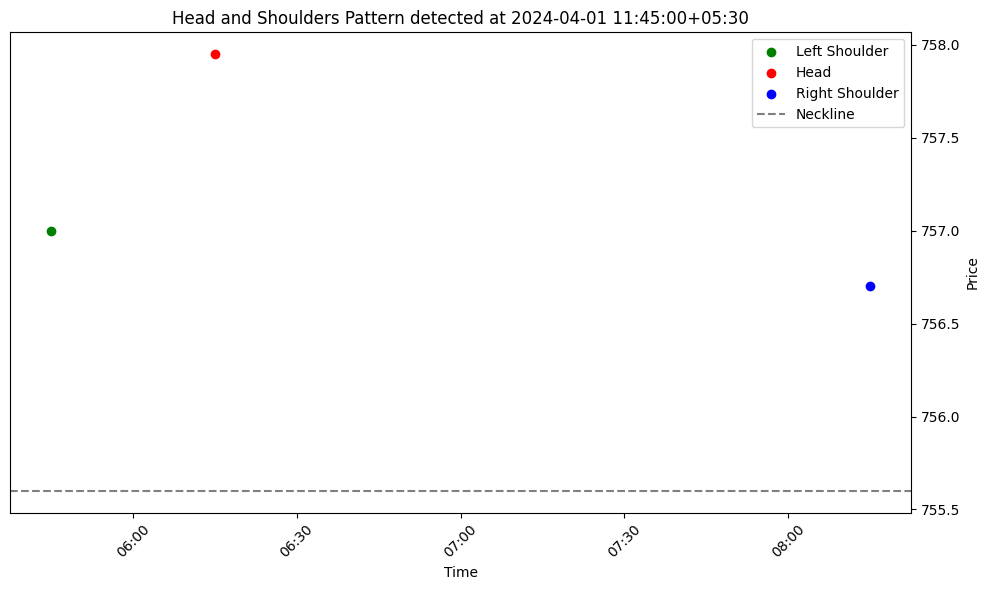

Left Shoulder: (79, Timestamp('2024-04-02 09:15:00+0530', tz='UTC+05:30'), 760.25), Head: (88, Timestamp('2024-04-02 11:30:00+0530', tz='UTC+05:30'), 762.6), Right Shoulder: (93, Timestamp('2024-04-02 12:45:00+0530', tz='UTC+05:30'), 762.3), Neckline Level: 754.475
                             Open    High     Low   Close
Datetime                                                 
2024-04-01 14:30:00+05:30  756.85  757.90  756.10  757.35
2024-04-01 14:45:00+05:30  757.45  758.00  757.05  757.60
2024-04-01 15:00:00+05:30  757.65  759.50  757.45  758.00
2024-04-01 15:15:00+05:30  758.15  758.30  757.40  758.30
2024-04-02 09:00:00+05:30  757.95  758.65  756.00  757.00
2024-04-02 09:15:00+05:30  757.00  760.25  757.00  758.60
2024-04-02 09:30:00+05:30  758.55  759.25  756.70  756.80
2024-04-02 09:45:00+05:30  756.90  757.95  754.80  756.05
2024-04-02 10:00:00+05:30  756.05  756.05  753.35  754.85
2024-04-02 10:15:00+05:30  754.85  757.25  754.40  756.90
2024-04-02 10:30:00+05:30  756.90  757

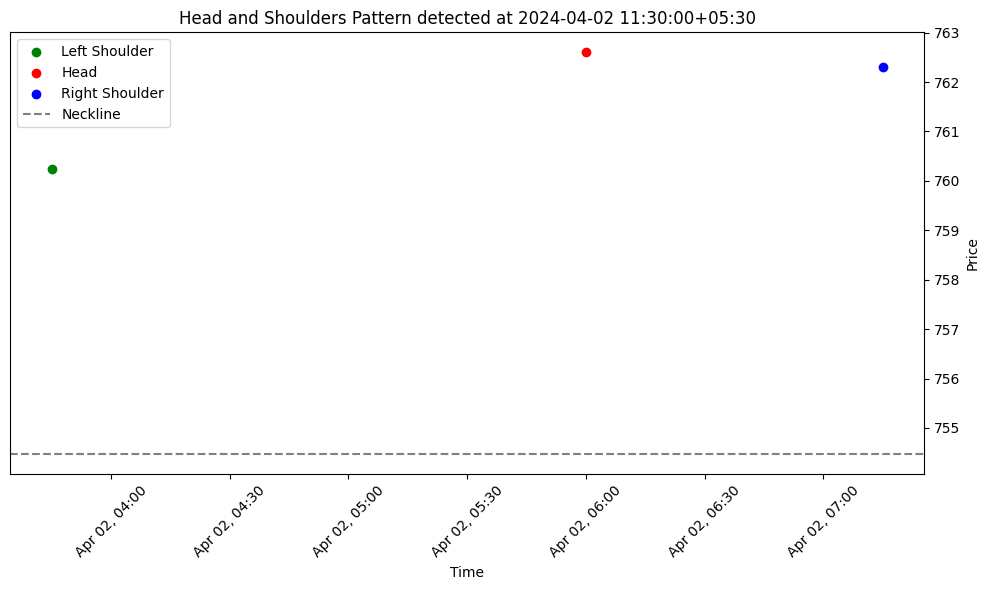

Left Shoulder: (99, Timestamp('2024-04-02 14:15:00+0530', tz='UTC+05:30'), 767.45), Head: (102, Timestamp('2024-04-02 15:00:00+0530', tz='UTC+05:30'), 768.75), Right Shoulder: (108, Timestamp('2024-04-03 10:00:00+0530', tz='UTC+05:30'), 765.0), Neckline Level: 762.075
                             Open    High     Low   Close
Datetime                                                 
2024-04-02 13:00:00+05:30  762.00  762.25  761.10  761.95
2024-04-02 13:15:00+05:30  761.90  763.50  761.90  762.90
2024-04-02 13:30:00+05:30  762.90  762.90  761.40  761.75
2024-04-02 13:45:00+05:30  761.75  763.00  760.45  762.25
2024-04-02 14:00:00+05:30  762.25  764.40  762.00  764.30
2024-04-02 14:15:00+05:30  764.15  767.45  764.15  765.75
2024-04-02 14:30:00+05:30  765.30  765.65  763.70  764.25
2024-04-02 14:45:00+05:30  764.25  767.00  763.85  766.90
2024-04-02 15:00:00+05:30  766.90  768.75  765.55  765.55
2024-04-02 15:15:00+05:30  765.55  766.40  765.20  766.40
2024-04-03 09:00:00+05:30  764.55  

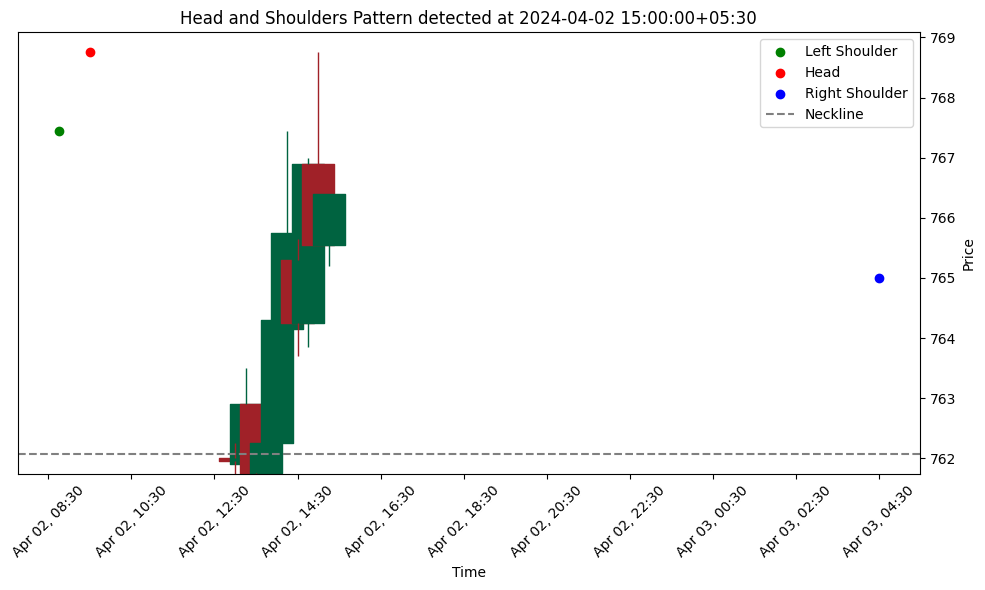

Left Shoulder: (127, Timestamp('2024-04-03 14:45:00+0530', tz='UTC+05:30'), 772.35), Head: (130, Timestamp('2024-04-04 09:00:00+0530', tz='UTC+05:30'), 775.3), Right Shoulder: (132, Timestamp('2024-04-04 09:30:00+0530', tz='UTC+05:30'), 769.65), Neckline Level: 762.05
                             Open    High     Low   Close
Datetime                                                 
2024-04-03 13:30:00+05:30  768.60  770.00  768.20  769.65
2024-04-03 13:45:00+05:30  769.65  770.00  768.05  769.75
2024-04-03 14:00:00+05:30  769.80  771.90  769.25  771.30
2024-04-03 14:15:00+05:30  771.35  771.90  769.40  770.85
2024-04-03 14:30:00+05:30  770.95  771.95  770.05  771.65
2024-04-03 14:45:00+05:30  771.70  772.35  769.60  771.20
2024-04-03 15:00:00+05:30  771.05  771.90  770.00  771.25
2024-04-03 15:15:00+05:30  771.25  772.60  770.30  771.05
2024-04-04 09:00:00+05:30  775.00  775.30  767.80  768.90
2024-04-04 09:15:00+05:30  768.80  769.25  767.00  768.40
2024-04-04 09:30:00+05:30  768.55  

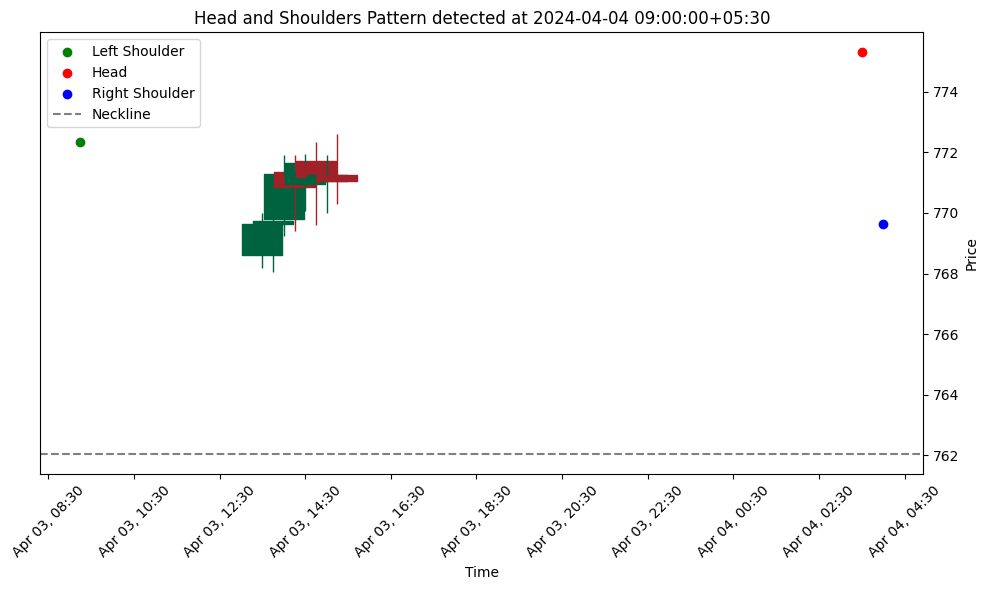

Left Shoulder: (144, Timestamp('2024-04-04 12:30:00+0530', tz='UTC+05:30'), 763.9), Head: (147, Timestamp('2024-04-04 13:15:00+0530', tz='UTC+05:30'), 764.95), Right Shoulder: (152, Timestamp('2024-04-04 14:30:00+0530', tz='UTC+05:30'), 762.3), Neckline Level: 768.825
                             Open    High     Low   Close
Datetime                                                 
2024-04-04 11:15:00+05:30  762.75  762.95  761.00  762.75
2024-04-04 11:30:00+05:30  762.50  762.70  759.60  760.30
2024-04-04 11:45:00+05:30  760.35  760.80  758.10  759.20
2024-04-04 12:00:00+05:30  759.10  760.45  758.55  759.95
2024-04-04 12:15:00+05:30  759.80  763.30  759.60  763.30
2024-04-04 12:30:00+05:30  763.25  763.90  761.80  762.30
2024-04-04 12:45:00+05:30  762.05  763.50  761.25  762.30
2024-04-04 13:00:00+05:30  762.20  763.50  761.85  763.20
2024-04-04 13:15:00+05:30  763.25  764.95  762.90  764.45
2024-04-04 13:30:00+05:30  764.40  764.50  762.15  763.00
2024-04-04 13:45:00+05:30  763.00  

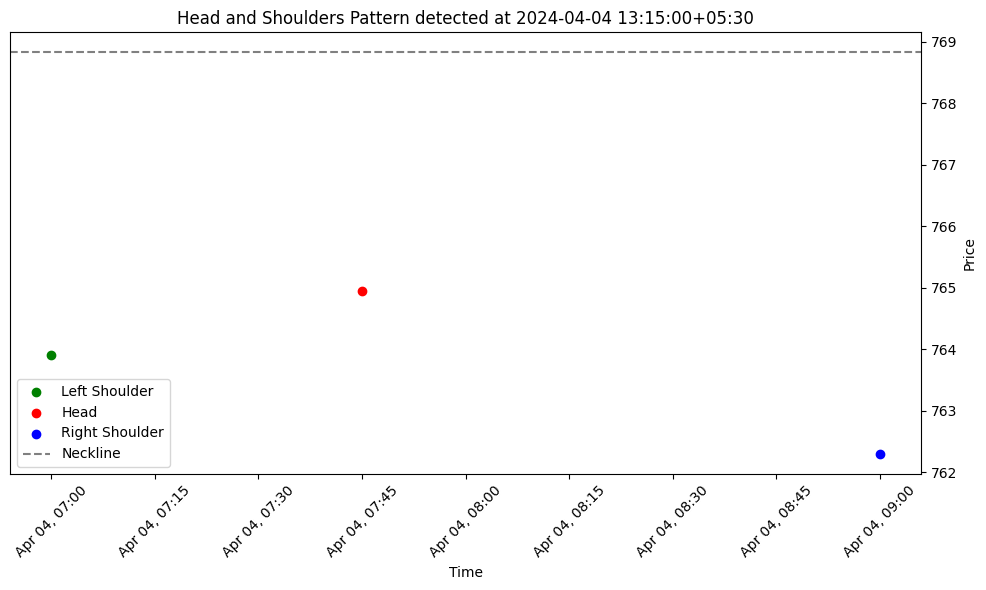

Left Shoulder: (155, Timestamp('2024-04-04 15:15:00+0530', tz='UTC+05:30'), 760.9), Head: (163, Timestamp('2024-04-05 10:45:00+0530', tz='UTC+05:30'), 764.7), Right Shoulder: (175, Timestamp('2024-04-05 13:45:00+0530', tz='UTC+05:30'), 762.95), Neckline Level: 759.675
                             Open    High     Low   Close
Datetime                                                 
2024-04-04 14:00:00+05:30  761.35  762.20  760.70  761.45
2024-04-04 14:15:00+05:30  761.30  762.00  760.15  761.10
2024-04-04 14:30:00+05:30  761.15  762.30  760.55  761.00
2024-04-04 14:45:00+05:30  760.90  761.05  758.10  758.45
2024-04-04 15:00:00+05:30  758.45  760.00  758.20  759.90
2024-04-04 15:15:00+05:30  759.95  760.90  759.30  759.30
2024-04-05 09:00:00+05:30  757.85  757.95  752.60  756.50
2024-04-05 09:15:00+05:30  756.60  758.90  754.45  757.30
2024-04-05 09:30:00+05:30  757.35  762.40  757.05  760.35
2024-04-05 09:45:00+05:30  760.30  763.00  759.80  761.25
2024-04-05 10:00:00+05:30  761.35  

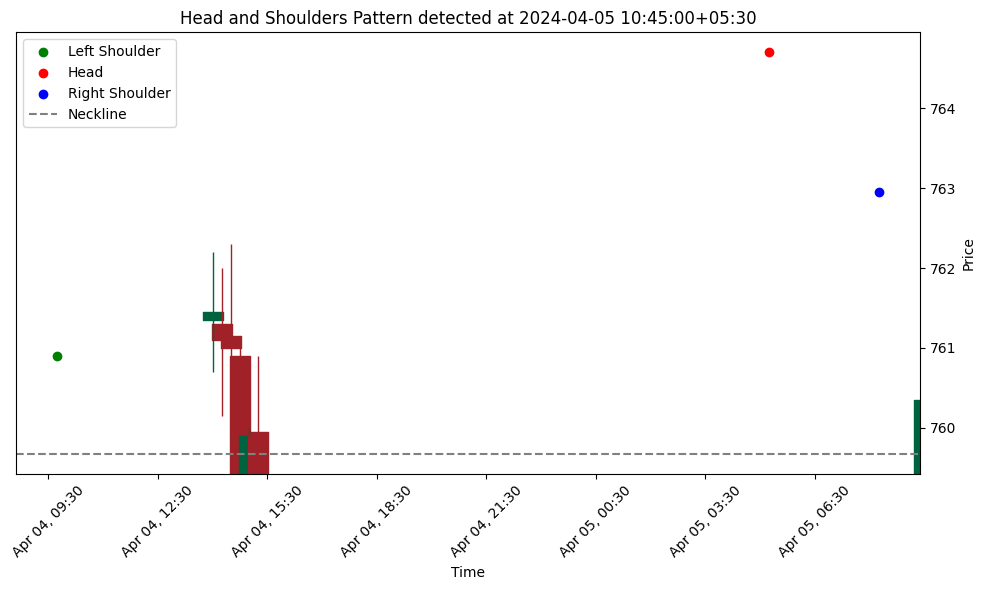

Left Shoulder: (180, Timestamp('2024-04-05 15:00:00+0530', tz='UTC+05:30'), 767.7), Head: (182, Timestamp('2024-04-08 09:00:00+0530', tz='UTC+05:30'), 768.3), Right Shoulder: (185, Timestamp('2024-04-08 09:45:00+0530', tz='UTC+05:30'), 766.45), Neckline Level: 755.35
                             Open    High     Low   Close
Datetime                                                 
2024-04-05 13:45:00+05:30  761.00  762.95  760.50  761.35
2024-04-05 14:00:00+05:30  761.35  762.20  760.55  761.35
2024-04-05 14:15:00+05:30  761.55  761.70  760.30  761.25
2024-04-05 14:30:00+05:30  761.25  763.15  761.05  762.95
2024-04-05 14:45:00+05:30  762.90  765.45  762.50  764.95
2024-04-05 15:00:00+05:30  764.90  767.70  764.20  765.40
2024-04-05 15:15:00+05:30  765.15  766.30  764.75  764.75
2024-04-08 09:00:00+05:30  766.90  768.30  764.80  765.25
2024-04-08 09:15:00+05:30  765.45  767.95  764.00  764.85
2024-04-08 09:30:00+05:30  765.05  766.10  764.35  765.70
2024-04-08 09:45:00+05:30  765.85  7

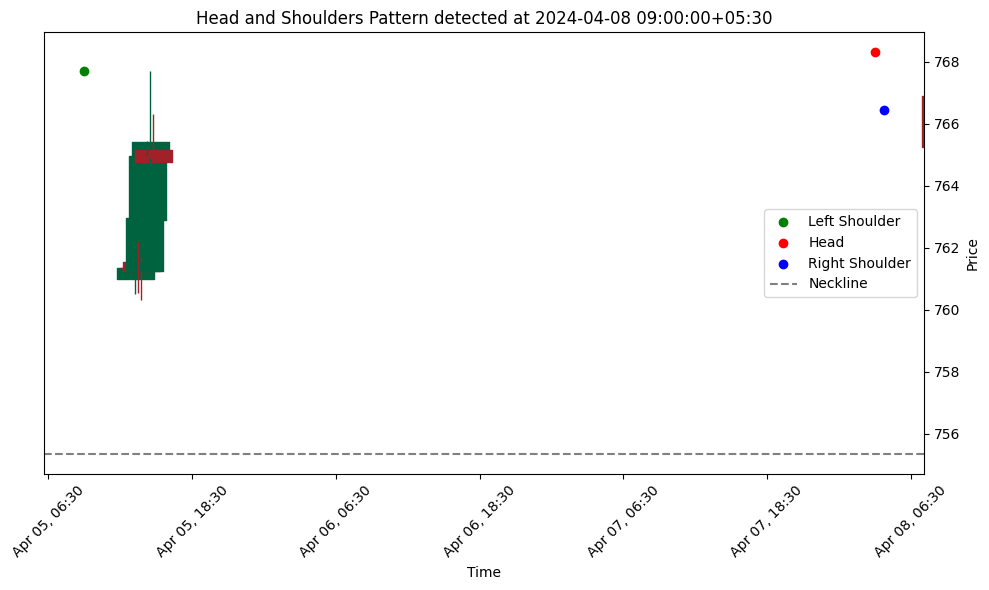

Left Shoulder: (197, Timestamp('2024-04-08 12:45:00+0530', tz='UTC+05:30'), 768.0), Head: (203, Timestamp('2024-04-08 14:15:00+0530', tz='UTC+05:30'), 770.0), Right Shoulder: (208, Timestamp('2024-04-09 09:00:00+0530', tz='UTC+05:30'), 769.9), Neckline Level: 762.15
                             Open    High     Low   Close
Datetime                                                 
2024-04-08 11:30:00+05:30  762.60  763.00  762.00  762.60
2024-04-08 11:45:00+05:30  762.55  763.00  761.80  762.75
2024-04-08 12:00:00+05:30  762.85  764.35  762.65  763.85
2024-04-08 12:15:00+05:30  763.95  766.40  763.85  766.25
2024-04-08 12:30:00+05:30  766.30  766.40  764.60  765.95
2024-04-08 12:45:00+05:30  765.85  768.00  765.60  767.25
2024-04-08 13:00:00+05:30  767.35  767.90  764.15  764.90
2024-04-08 13:15:00+05:30  764.70  767.50  764.20  767.25
2024-04-08 13:30:00+05:30  767.40  767.40  766.10  766.45
2024-04-08 13:45:00+05:30  766.50  767.80  765.30  766.70
2024-04-08 14:00:00+05:30  766.65  76

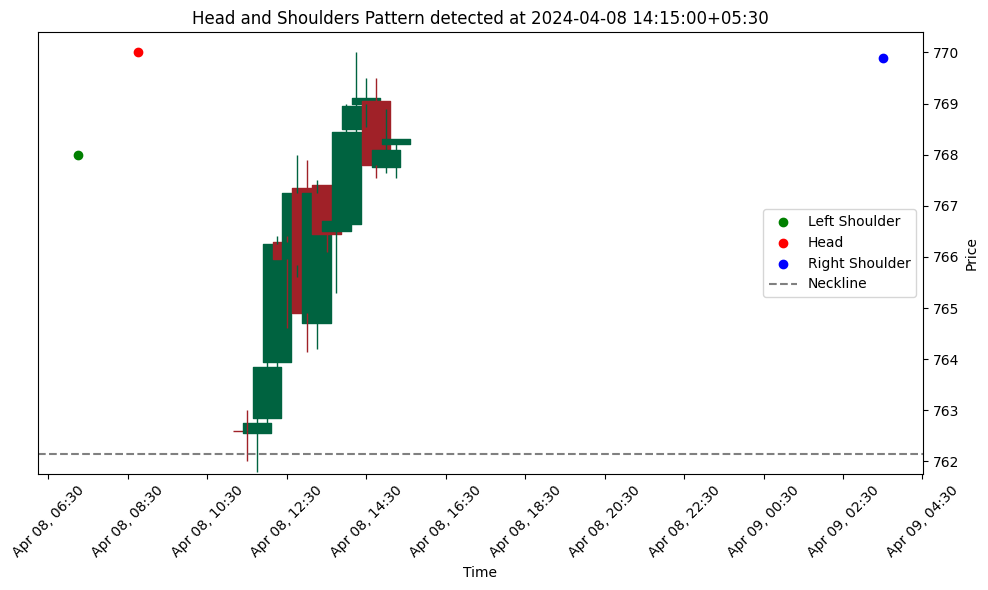

Left Shoulder: (211, Timestamp('2024-04-09 09:45:00+0530', tz='UTC+05:30'), 771.3), Head: (213, Timestamp('2024-04-09 10:15:00+0530', tz='UTC+05:30'), 772.45), Right Shoulder: (215, Timestamp('2024-04-09 10:45:00+0530', tz='UTC+05:30'), 772.15), Neckline Level: 761.825
                             Open    High     Low   Close
Datetime                                                 
2024-04-08 15:00:00+05:30  767.75  768.90  767.65  768.10
2024-04-08 15:15:00+05:30  768.20  768.30  767.55  768.30
2024-04-09 09:00:00+05:30  768.30  769.90  766.25  768.15
2024-04-09 09:15:00+05:30  768.35  769.00  766.85  767.85
2024-04-09 09:30:00+05:30  767.85  769.50  767.75  769.10
2024-04-09 09:45:00+05:30  769.10  771.30  769.05  770.00
2024-04-09 10:00:00+05:30  770.00  770.85  768.25  769.30
2024-04-09 10:15:00+05:30  769.30  772.45  768.50  770.95
2024-04-09 10:30:00+05:30  770.75  771.90  770.45  771.15
2024-04-09 10:45:00+05:30  770.95  772.15  770.00  770.45
2024-04-09 11:00:00+05:30  770.45 

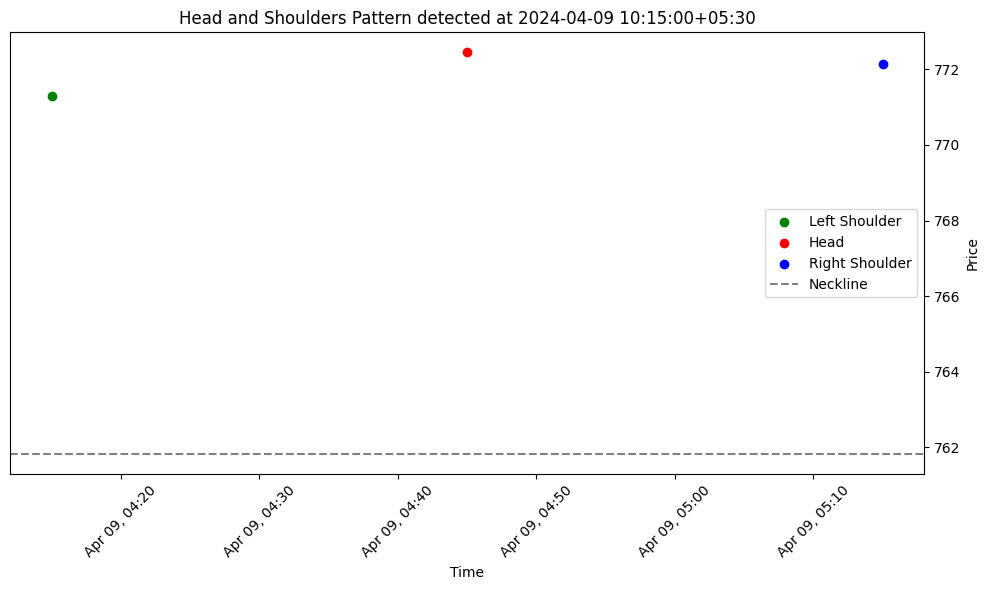

Left Shoulder: (232, Timestamp('2024-04-09 15:00:00+0530', tz='UTC+05:30'), 766.9), Head: (235, Timestamp('2024-04-10 09:15:00+0530', tz='UTC+05:30'), 770.2), Right Shoulder: (239, Timestamp('2024-04-10 10:15:00+0530', tz='UTC+05:30'), 769.8), Neckline Level: 769.0
                             Open    High     Low   Close
Datetime                                                 
2024-04-09 13:45:00+05:30  763.00  763.40  761.10  761.70
2024-04-09 14:00:00+05:30  761.70  765.00  761.60  764.65
2024-04-09 14:15:00+05:30  764.55  764.80  762.70  763.15
2024-04-09 14:30:00+05:30  763.20  763.75  762.25  762.80
2024-04-09 14:45:00+05:30  762.80  764.15  762.50  763.80
2024-04-09 15:00:00+05:30  763.75  766.90  763.50  766.00
2024-04-09 15:15:00+05:30  765.85  766.00  764.20  764.20
2024-04-10 09:00:00+05:30  765.70  768.70  764.40  767.00
2024-04-10 09:15:00+05:30  766.80  770.20  766.50  767.75
2024-04-10 09:30:00+05:30  767.90  769.85  767.65  768.30
2024-04-10 09:45:00+05:30  768.25  768

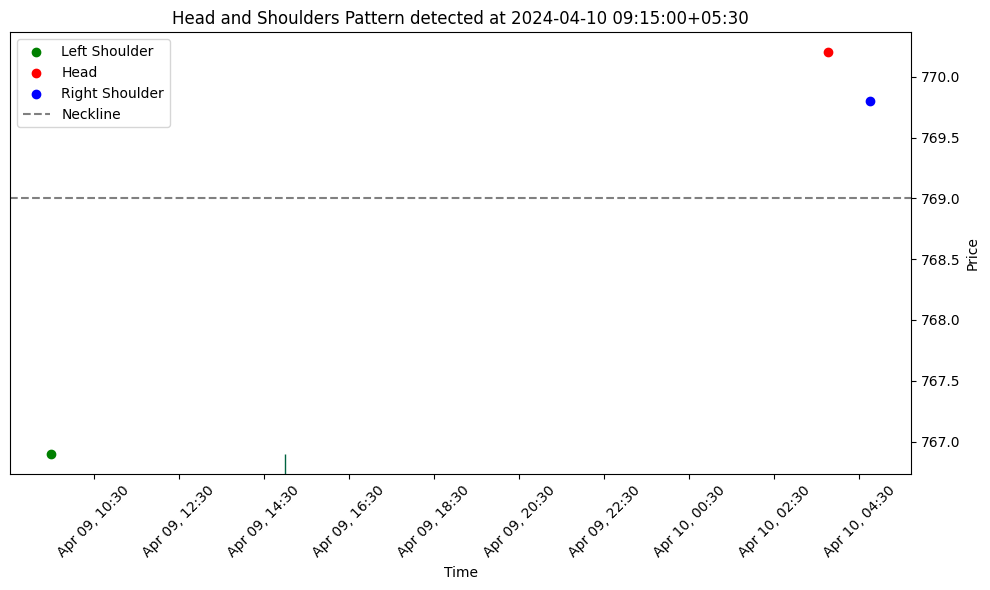

Left Shoulder: (271, Timestamp('2024-04-12 11:45:00+0530', tz='UTC+05:30'), 774.45), Head: (273, Timestamp('2024-04-12 12:15:00+0530', tz='UTC+05:30'), 775.3), Right Shoulder: (275, Timestamp('2024-04-12 12:45:00+0530', tz='UTC+05:30'), 774.25), Neckline Level: 771.125
                             Open    High     Low   Close
Datetime                                                 
2024-04-12 10:30:00+05:30  775.00  775.05  772.75  773.95
2024-04-12 10:45:00+05:30  773.90  775.90  773.65  775.45
2024-04-12 11:00:00+05:30  775.45  776.00  774.15  774.45
2024-04-12 11:15:00+05:30  774.35  775.00  773.90  774.00
2024-04-12 11:30:00+05:30  774.00  774.35  773.70  774.10
2024-04-12 11:45:00+05:30  774.15  774.45  774.00  774.15
2024-04-12 12:00:00+05:30  774.15  774.15  772.35  773.80
2024-04-12 12:15:00+05:30  773.80  775.30  772.20  772.20
2024-04-12 12:30:00+05:30  772.30  773.60  771.85  773.10
2024-04-12 12:45:00+05:30  773.00  774.25  772.80  773.60
2024-04-12 13:00:00+05:30  773.60 

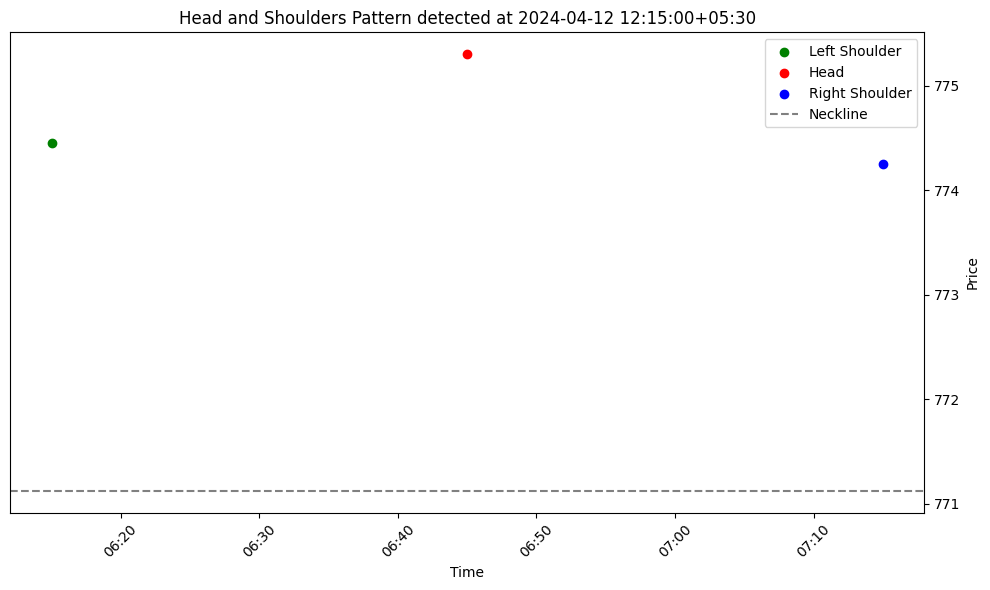

Left Shoulder: (298, Timestamp('2024-04-15 12:00:00+0530', tz='UTC+05:30'), 761.8), Head: (302, Timestamp('2024-04-15 13:00:00+0530', tz='UTC+05:30'), 763.3), Right Shoulder: (304, Timestamp('2024-04-15 13:30:00+0530', tz='UTC+05:30'), 762.75), Neckline Level: 756.775
                             Open    High     Low   Close
Datetime                                                 
2024-04-15 10:45:00+05:30  758.40  759.00  757.00  757.40
2024-04-15 11:00:00+05:30  757.50  759.65  756.30  758.85
2024-04-15 11:15:00+05:30  758.85  759.50  758.00  758.85
2024-04-15 11:30:00+05:30  759.00  761.00  758.30  760.95
2024-04-15 11:45:00+05:30  760.95  761.50  758.90  760.80
2024-04-15 12:00:00+05:30  760.55  761.80  760.10  760.95
2024-04-15 12:15:00+05:30  760.95  761.25  759.45  759.95
2024-04-15 12:30:00+05:30  759.95  761.40  759.10  759.60
2024-04-15 12:45:00+05:30  759.60  762.00  758.70  761.30
2024-04-15 13:00:00+05:30  761.30  763.30  761.00  761.55
2024-04-15 13:15:00+05:30  761.80  

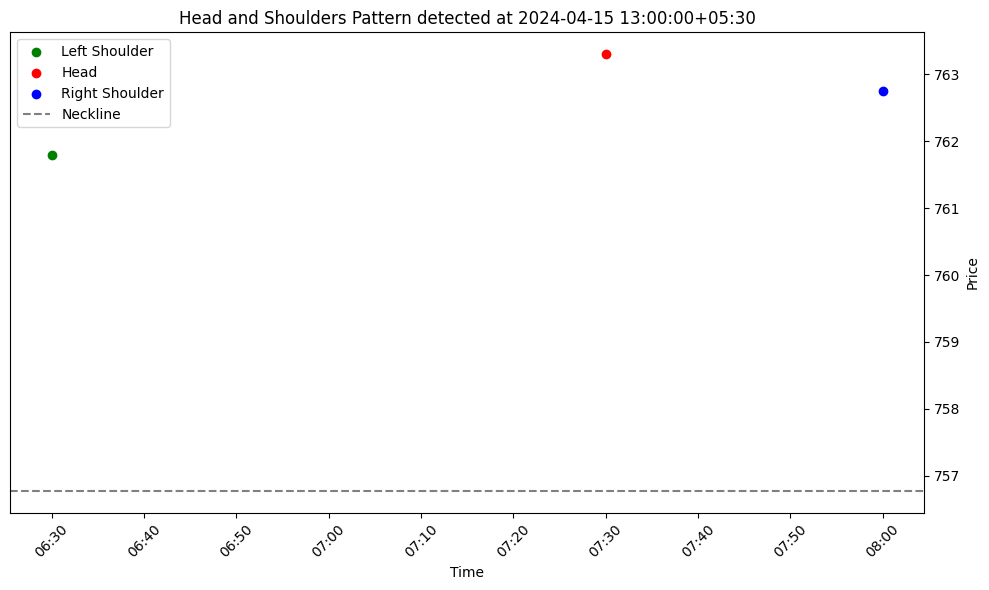

Left Shoulder: (333, Timestamp('2024-04-16 14:15:00+0530', tz='UTC+05:30'), 751.9), Head: (338, Timestamp('2024-04-18 09:00:00+0530', tz='UTC+05:30'), 759.95), Right Shoulder: (341, Timestamp('2024-04-18 09:45:00+0530', tz='UTC+05:30'), 754.95), Neckline Level: 747.4
                             Open    High     Low   Close
Datetime                                                 
2024-04-16 13:00:00+05:30  747.10  749.40  746.15  748.85
2024-04-16 13:15:00+05:30  748.90  750.70  748.00  750.30
2024-04-16 13:30:00+05:30  750.50  751.35  749.00  749.30
2024-04-16 13:45:00+05:30  749.35  750.00  748.50  749.30
2024-04-16 14:00:00+05:30  749.55  750.00  748.60  749.70
2024-04-16 14:15:00+05:30  749.70  751.90  749.65  751.50
2024-04-16 14:30:00+05:30  751.60  751.80  748.05  749.55
2024-04-16 14:45:00+05:30  749.60  752.80  749.15  752.15
2024-04-16 15:00:00+05:30  752.40  753.00  750.70  752.50
2024-04-16 15:15:00+05:30  752.40  753.00  751.70  751.70
2024-04-18 09:00:00+05:30  753.15  7

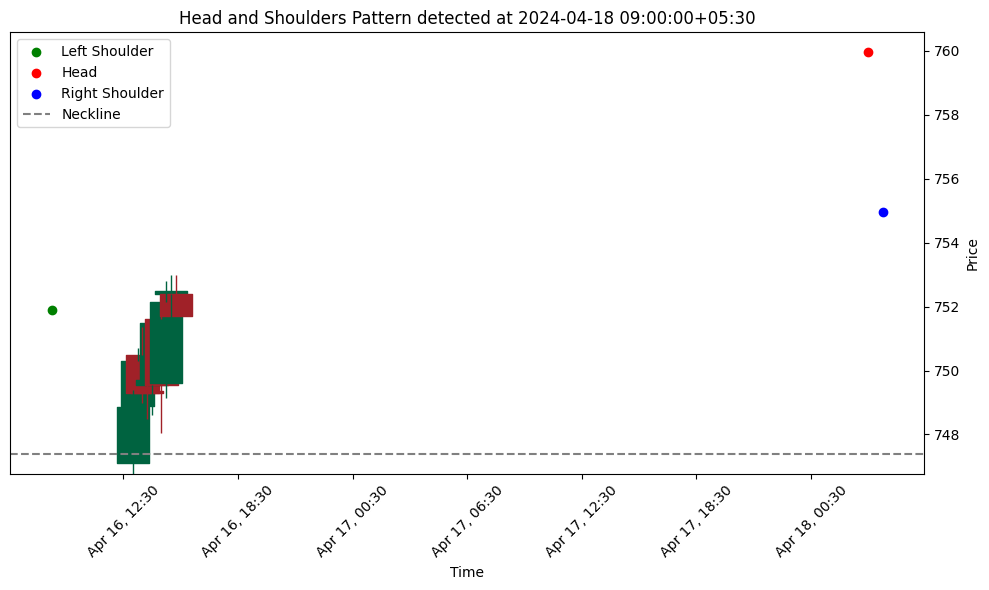

Left Shoulder: (351, Timestamp('2024-04-18 12:15:00+0530', tz='UTC+05:30'), 756.75), Head: (353, Timestamp('2024-04-18 12:45:00+0530', tz='UTC+05:30'), 756.9), Right Shoulder: (358, Timestamp('2024-04-18 14:00:00+0530', tz='UTC+05:30'), 752.3), Neckline Level: 749.675
                             Open    High     Low   Close
Datetime                                                 
2024-04-18 11:00:00+05:30  755.15  755.25  753.45  753.65
2024-04-18 11:15:00+05:30  753.70  754.60  753.15  753.90
2024-04-18 11:30:00+05:30  753.90  756.55  753.70  756.15
2024-04-18 11:45:00+05:30  756.10  756.30  754.40  754.50
2024-04-18 12:00:00+05:30  754.50  755.90  754.05  755.15
2024-04-18 12:15:00+05:30  755.15  756.75  754.50  756.25
2024-04-18 12:30:00+05:30  756.25  756.60  755.00  756.40
2024-04-18 12:45:00+05:30  756.40  756.90  755.65  755.85
2024-04-18 13:00:00+05:30  755.85  756.25  750.70  752.35
2024-04-18 13:15:00+05:30  752.35  753.80  747.55  750.85
2024-04-18 13:30:00+05:30  750.50  

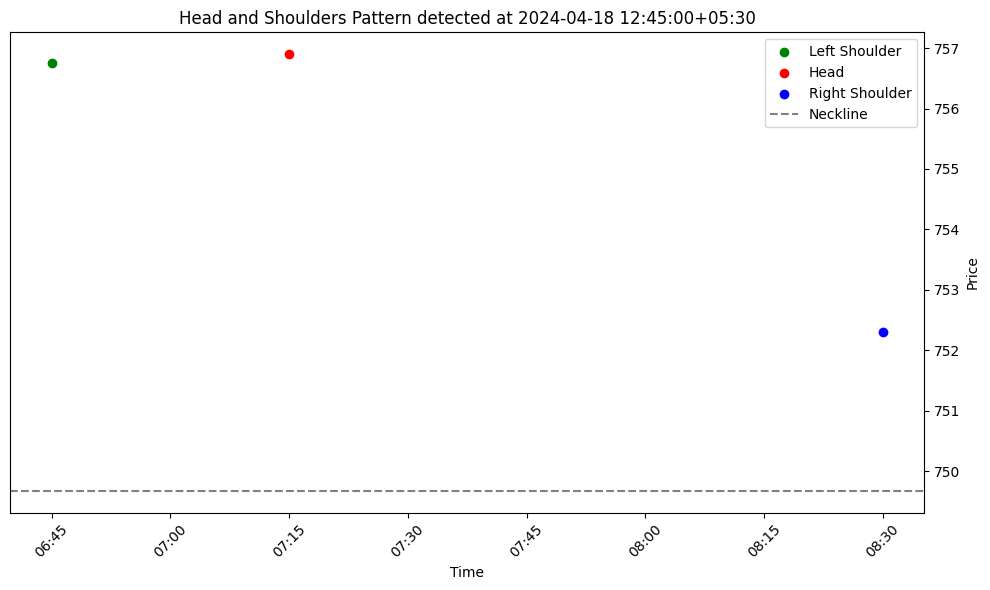

Left Shoulder: (388, Timestamp('2024-04-19 15:00:00+0530', tz='UTC+05:30'), 752.0), Head: (390, Timestamp('2024-04-22 09:00:00+0530', tz='UTC+05:30'), 757.85), Right Shoulder: (394, Timestamp('2024-04-22 10:00:00+0530', tz='UTC+05:30'), 755.0), Neckline Level: 736.675
                             Open    High     Low   Close
Datetime                                                 
2024-04-19 13:45:00+05:30  747.90  749.95  747.30  748.60
2024-04-19 14:00:00+05:30  748.40  748.65  746.35  747.05
2024-04-19 14:15:00+05:30  746.95  749.00  746.85  748.65
2024-04-19 14:30:00+05:30  748.30  749.40  747.00  748.35
2024-04-19 14:45:00+05:30  748.35  751.95  748.05  751.50
2024-04-19 15:00:00+05:30  751.50  752.00  749.60  749.90
2024-04-19 15:15:00+05:30  749.60  751.00  749.50  750.00
2024-04-22 09:00:00+05:30  754.15  757.85  753.15  753.75
2024-04-22 09:15:00+05:30  753.55  754.20  751.05  752.60
2024-04-22 09:30:00+05:30  752.50  754.45  752.00  753.70
2024-04-22 09:45:00+05:30  753.70  

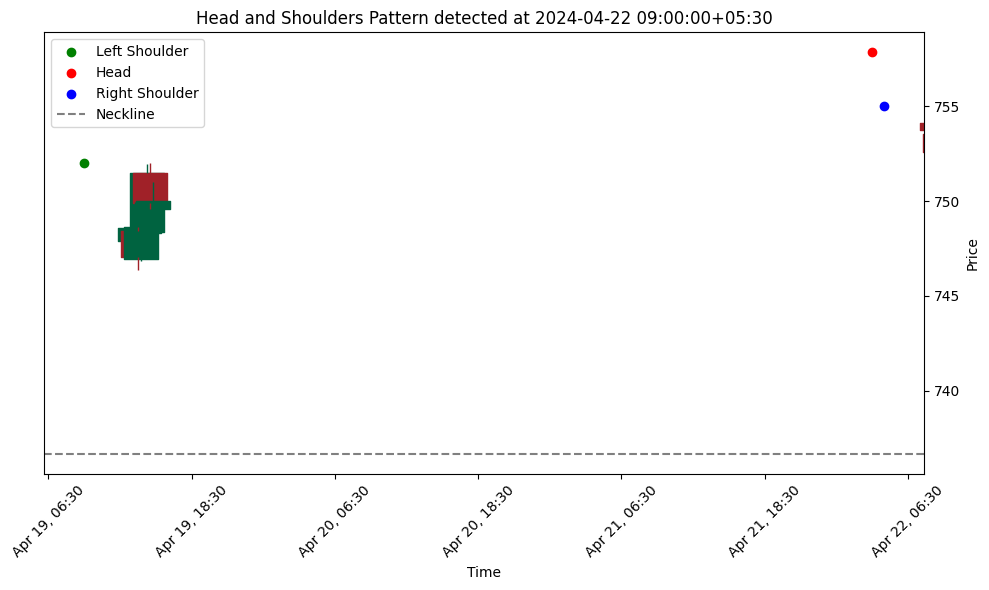

Left Shoulder: (416, Timestamp('2024-04-23 09:00:00+0530', tz='UTC+05:30'), 770.35), Head: (419, Timestamp('2024-04-23 09:45:00+0530', tz='UTC+05:30'), 776.9), Right Shoulder: (422, Timestamp('2024-04-23 10:30:00+0530', tz='UTC+05:30'), 774.7), Neckline Level: 752.725
                             Open    High     Low   Close
Datetime                                                 
2024-04-22 14:15:00+05:30  761.00  763.85  760.80  763.50
2024-04-22 14:30:00+05:30  763.50  764.55  762.85  763.85
2024-04-22 14:45:00+05:30  763.90  766.10  763.50  766.00
2024-04-22 15:00:00+05:30  766.05  768.90  766.00  768.00
2024-04-22 15:15:00+05:30  768.00  769.00  766.10  766.10
2024-04-23 09:00:00+05:30  770.35  770.35  765.55  766.60
2024-04-23 09:15:00+05:30  766.70  768.90  765.65  768.20
2024-04-23 09:30:00+05:30  768.15  773.00  767.25  773.00
2024-04-23 09:45:00+05:30  772.90  776.90  771.70  774.75
2024-04-23 10:00:00+05:30  774.70  775.00  772.15  772.15
2024-04-23 10:15:00+05:30  772.40  

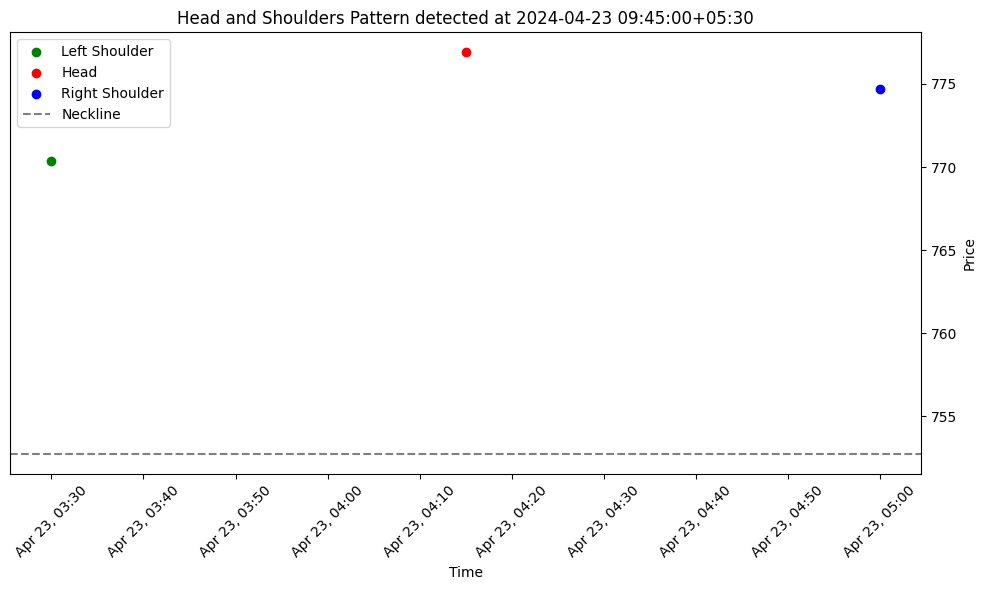

Left Shoulder: (422, Timestamp('2024-04-23 10:30:00+0530', tz='UTC+05:30'), 774.7), Head: (428, Timestamp('2024-04-23 12:00:00+0530', tz='UTC+05:30'), 777.7), Right Shoulder: (433, Timestamp('2024-04-23 13:15:00+0530', tz='UTC+05:30'), 775.45), Neckline Level: 763.15
                             Open    High     Low   Close
Datetime                                                 
2024-04-23 09:15:00+05:30  766.70  768.90  765.65  768.20
2024-04-23 09:30:00+05:30  768.15  773.00  767.25  773.00
2024-04-23 09:45:00+05:30  772.90  776.90  771.70  774.75
2024-04-23 10:00:00+05:30  774.70  775.00  772.15  772.15
2024-04-23 10:15:00+05:30  772.40  774.00  771.65  772.20
2024-04-23 10:30:00+05:30  772.30  774.70  772.00  774.55
2024-04-23 10:45:00+05:30  774.40  774.65  772.00  772.90
2024-04-23 11:00:00+05:30  772.75  773.30  771.20  772.85
2024-04-23 11:15:00+05:30  772.85  774.00  772.50  773.00
2024-04-23 11:30:00+05:30  772.95  775.00  772.20  774.25
2024-04-23 11:45:00+05:30  774.30  7

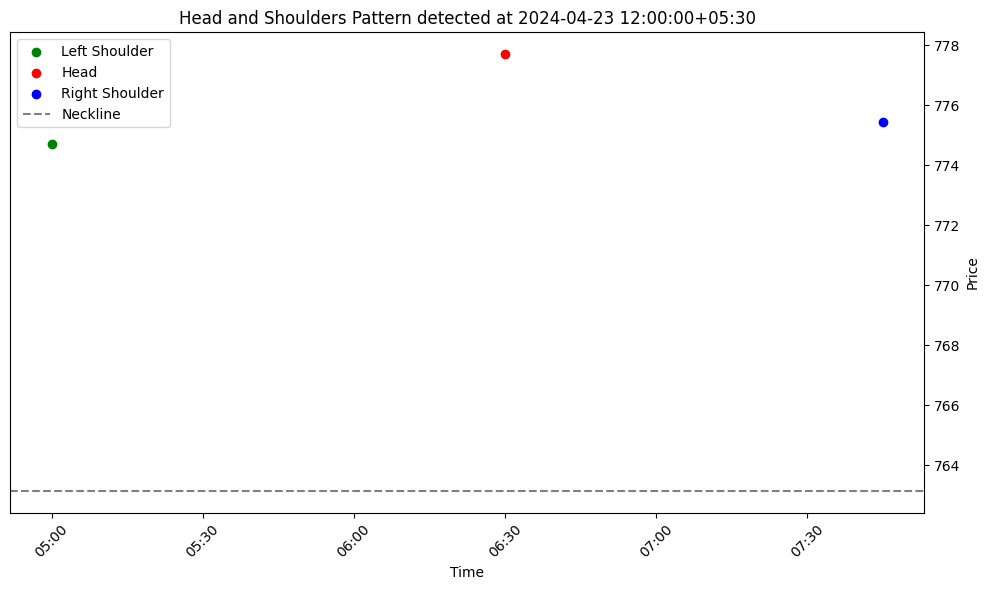

Left Shoulder: (439, Timestamp('2024-04-23 14:45:00+0530', tz='UTC+05:30'), 774.5), Head: (442, Timestamp('2024-04-24 09:00:00+0530', tz='UTC+05:30'), 778.5), Right Shoulder: (444, Timestamp('2024-04-24 09:30:00+0530', tz='UTC+05:30'), 775.45), Neckline Level: 772.35
                             Open    High     Low   Close
Datetime                                                 
2024-04-23 13:30:00+05:30  774.00  774.45  772.90  773.80
2024-04-23 13:45:00+05:30  773.50  774.90  773.30  773.75
2024-04-23 14:00:00+05:30  773.75  774.85  773.65  774.30
2024-04-23 14:15:00+05:30  774.35  774.35  772.65  772.90
2024-04-23 14:30:00+05:30  772.80  774.40  772.55  773.15
2024-04-23 14:45:00+05:30  773.25  774.50  771.60  773.00
2024-04-23 15:00:00+05:30  772.90  773.85  771.15  772.05
2024-04-23 15:15:00+05:30  772.00  774.00  771.80  773.00
2024-04-24 09:00:00+05:30  777.95  778.50  773.30  774.60
2024-04-24 09:15:00+05:30  774.50  775.20  774.00  774.80
2024-04-24 09:30:00+05:30  774.90  7

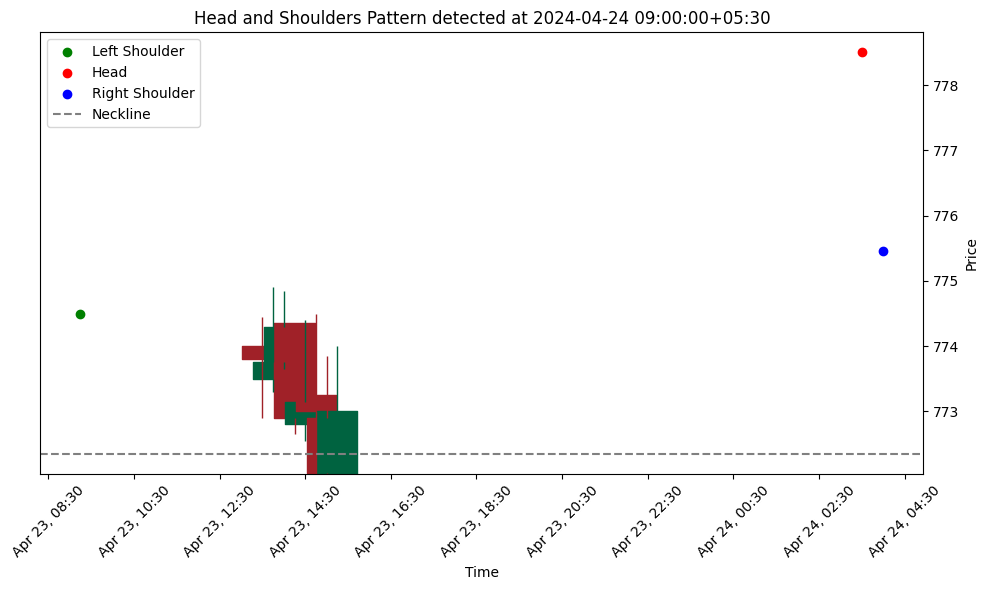

Left Shoulder: (492, Timestamp('2024-04-25 15:00:00+0530', tz='UTC+05:30'), 814.4), Head: (494, Timestamp('2024-04-26 09:00:00+0530', tz='UTC+05:30'), 816.9), Right Shoulder: (496, Timestamp('2024-04-26 09:30:00+0530', tz='UTC+05:30'), 811.55), Neckline Level: 775.2
                             Open    High     Low   Close
Datetime                                                 
2024-04-25 13:45:00+05:30  803.85  805.15  801.75  802.95
2024-04-25 14:00:00+05:30  802.85  808.90  802.20  808.65
2024-04-25 14:15:00+05:30  808.80  812.60  808.55  809.10
2024-04-25 14:30:00+05:30  809.15  812.60  809.00  811.40
2024-04-25 14:45:00+05:30  811.40  813.60  810.50  813.20
2024-04-25 15:00:00+05:30  813.10  814.40  811.90  812.50
2024-04-25 15:15:00+05:30  812.50  812.90  811.80  812.70
2024-04-26 09:00:00+05:30  815.00  816.90  807.80  811.25
2024-04-26 09:15:00+05:30  811.05  811.45  808.50  809.65
2024-04-26 09:30:00+05:30  809.60  811.55  807.00  809.50
2024-04-26 09:45:00+05:30  809.75  80

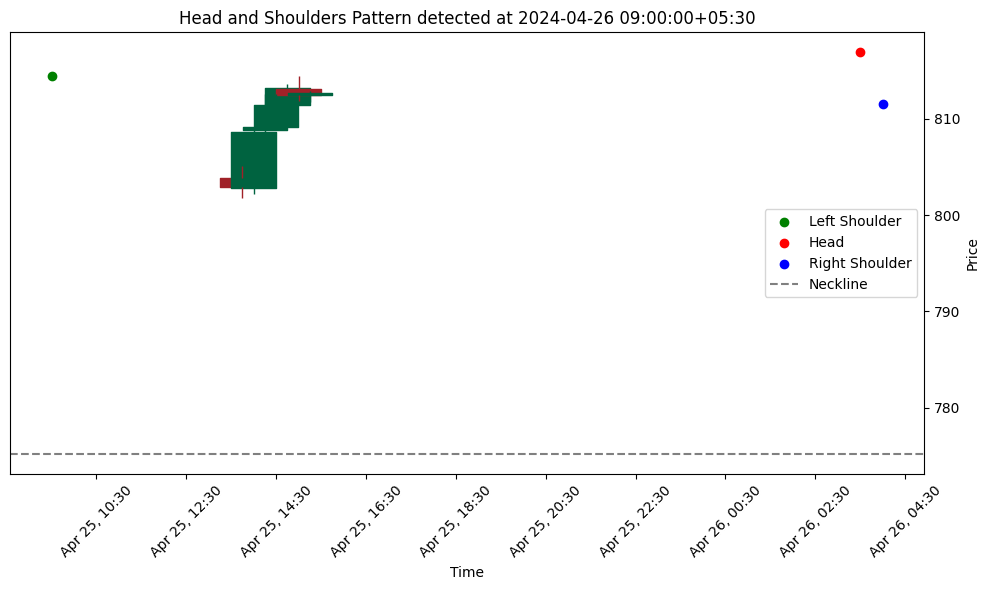

Left Shoulder: (501, Timestamp('2024-04-26 10:45:00+0530', tz='UTC+05:30'), 805.0), Head: (506, Timestamp('2024-04-26 12:00:00+0530', tz='UTC+05:30'), 806.45), Right Shoulder: (508, Timestamp('2024-04-26 12:30:00+0530', tz='UTC+05:30'), 806.2), Neckline Level: 795.925
                             Open    High     Low   Close
Datetime                                                 
2024-04-26 09:30:00+05:30  809.60  811.55  807.00  809.50
2024-04-26 09:45:00+05:30  809.75  809.75  805.00  806.40
2024-04-26 10:00:00+05:30  806.30  808.20  805.00  805.20
2024-04-26 10:15:00+05:30  805.50  806.00  803.20  804.90
2024-04-26 10:30:00+05:30  804.65  804.90  803.00  804.70
2024-04-26 10:45:00+05:30  804.70  805.00  802.00  802.70
2024-04-26 11:00:00+05:30  802.65  804.90  801.65  804.65
2024-04-26 11:15:00+05:30  804.65  805.00  804.00  804.75
2024-04-26 11:30:00+05:30  804.75  806.30  804.50  804.55
2024-04-26 11:45:00+05:30  804.70  806.40  804.00  805.70
2024-04-26 12:00:00+05:30  805.70  

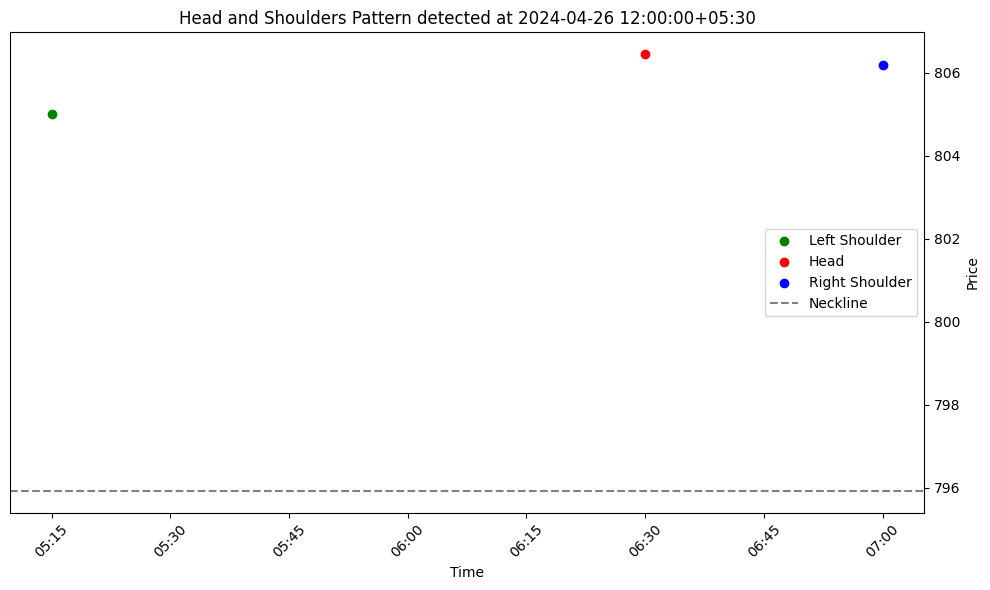

Left Shoulder: (516, Timestamp('2024-04-26 14:30:00+0530', tz='UTC+05:30'), 804.75), Head: (521, Timestamp('2024-04-29 09:15:00+0530', tz='UTC+05:30'), 810.1), Right Shoulder: (525, Timestamp('2024-04-29 10:15:00+0530', tz='UTC+05:30'), 809.5), Neckline Level: 801.9
                             Open    High     Low   Close
Datetime                                                 
2024-04-26 13:15:00+05:30  802.25  802.50  799.80  802.05
2024-04-26 13:30:00+05:30  802.05  802.45  800.40  801.70
2024-04-26 13:45:00+05:30  801.80  803.00  801.10  802.55
2024-04-26 14:00:00+05:30  802.55  804.25  802.10  802.70
2024-04-26 14:15:00+05:30  802.70  804.00  802.05  804.00
2024-04-26 14:30:00+05:30  804.05  804.75  802.20  802.45
2024-04-26 14:45:00+05:30  802.35  803.60  798.90  800.45
2024-04-26 15:00:00+05:30  800.25  803.30  800.05  803.30
2024-04-26 15:15:00+05:30  803.20  803.30  801.30  801.30
2024-04-29 09:00:00+05:30  807.25  809.60  805.15  808.10
2024-04-29 09:15:00+05:30  808.20  81

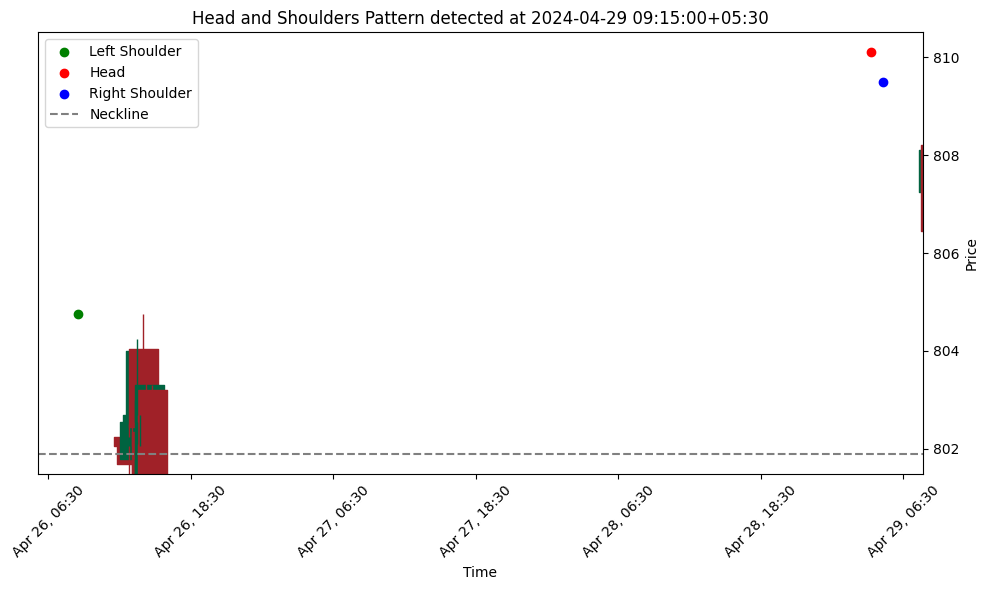

Left Shoulder: (546, Timestamp('2024-04-30 09:00:00+0530', tz='UTC+05:30'), 827.5), Head: (549, Timestamp('2024-04-30 09:45:00+0530', tz='UTC+05:30'), 832.4), Right Shoulder: (552, Timestamp('2024-04-30 10:30:00+0530', tz='UTC+05:30'), 828.95), Neckline Level: 824.075
                             Open    High     Low   Close
Datetime                                                 
2024-04-29 14:15:00+05:30  830.30  830.70  828.25  828.60
2024-04-29 14:30:00+05:30  828.65  829.00  825.65  827.55
2024-04-29 14:45:00+05:30  827.55  829.00  826.05  827.05
2024-04-29 15:00:00+05:30  827.00  828.60  822.50  824.40
2024-04-29 15:15:00+05:30  824.90  826.50  824.00  826.50
2024-04-30 09:00:00+05:30  826.50  827.50  822.75  824.30
2024-04-30 09:15:00+05:30  824.25  826.20  823.10  824.20
2024-04-30 09:30:00+05:30  824.25  831.10  824.20  829.90
2024-04-30 09:45:00+05:30  829.90  832.40  825.30  826.20
2024-04-30 10:00:00+05:30  826.50  827.00  824.20  826.85
2024-04-30 10:15:00+05:30  826.90  

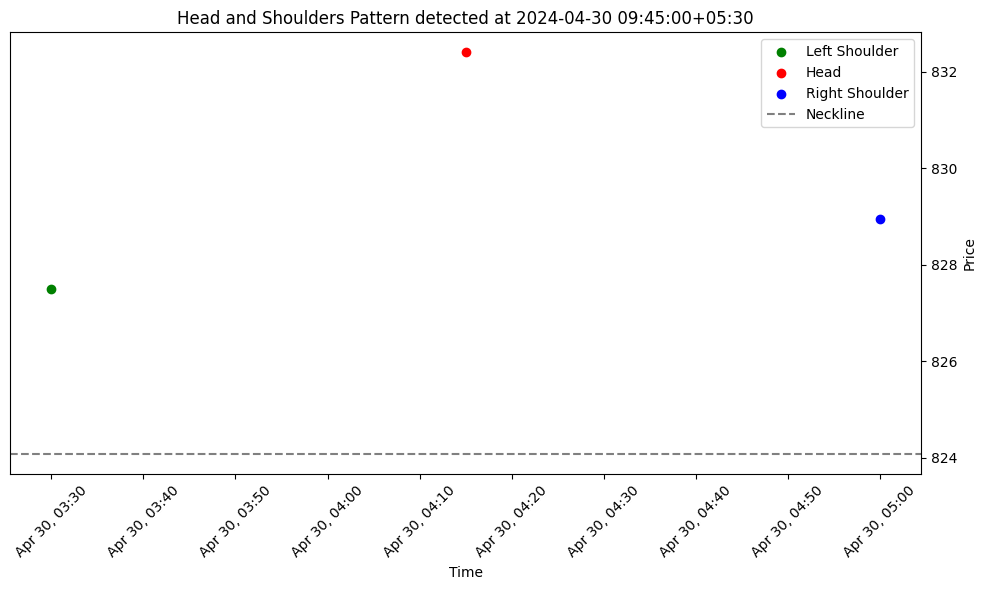

Left Shoulder: (560, Timestamp('2024-04-30 12:30:00+0530', tz='UTC+05:30'), 829.35), Head: (565, Timestamp('2024-04-30 13:45:00+0530', tz='UTC+05:30'), 834.85), Right Shoulder: (572, Timestamp('2024-05-02 09:00:00+0530', tz='UTC+05:30'), 833.4), Neckline Level: 823.85
                             Open    High     Low   Close
Datetime                                                 
2024-04-30 11:15:00+05:30  823.85  824.75  822.00  824.35
2024-04-30 11:30:00+05:30  824.65  824.70  821.70  823.50
2024-04-30 11:45:00+05:30  823.25  825.30  822.55  825.30
2024-04-30 12:00:00+05:30  825.45  825.95  823.40  824.15
2024-04-30 12:15:00+05:30  824.25  828.90  824.00  826.90
2024-04-30 12:30:00+05:30  826.80  829.35  826.60  827.10
2024-04-30 12:45:00+05:30  827.15  827.60  825.20  825.80
2024-04-30 13:00:00+05:30  825.80  826.80  824.15  825.55
2024-04-30 13:15:00+05:30  825.60  827.65  825.20  827.05
2024-04-30 13:30:00+05:30  827.15  830.45  826.65  827.40
2024-04-30 13:45:00+05:30  827.40  

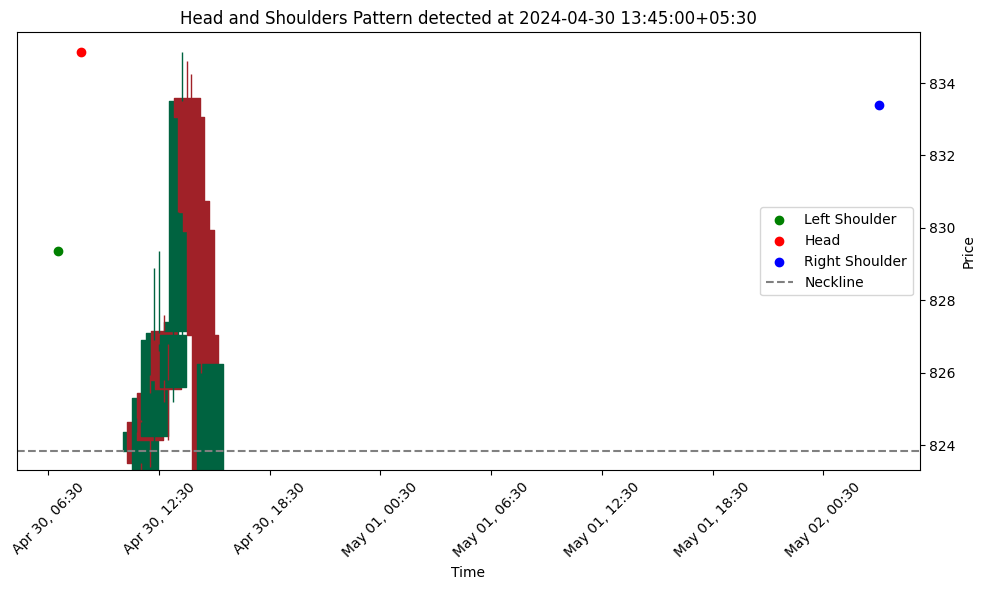

Left Shoulder: (575, Timestamp('2024-05-02 09:45:00+0530', tz='UTC+05:30'), 833.75), Head: (577, Timestamp('2024-05-02 10:15:00+0530', tz='UTC+05:30'), 833.9), Right Shoulder: (581, Timestamp('2024-05-02 11:15:00+0530', tz='UTC+05:30'), 833.0), Neckline Level: 822.025
                             Open    High     Low   Close
Datetime                                                 
2024-04-30 15:00:00+05:30  827.05  828.55  820.65  821.40
2024-04-30 15:15:00+05:30  821.35  826.25  819.90  826.25
2024-05-02 09:00:00+05:30  826.60  833.40  825.00  828.95
2024-05-02 09:15:00+05:30  828.95  830.80  828.00  830.00
2024-05-02 09:30:00+05:30  829.95  832.40  829.00  831.95
2024-05-02 09:45:00+05:30  831.95  833.75  831.35  833.35
2024-05-02 10:00:00+05:30  833.35  833.50  831.15  832.10
2024-05-02 10:15:00+05:30  832.05  833.90  831.85  832.60
2024-05-02 10:30:00+05:30  832.90  833.00  830.60  830.80
2024-05-02 10:45:00+05:30  830.80  831.50  829.50  830.45
2024-05-02 11:00:00+05:30  830.50  

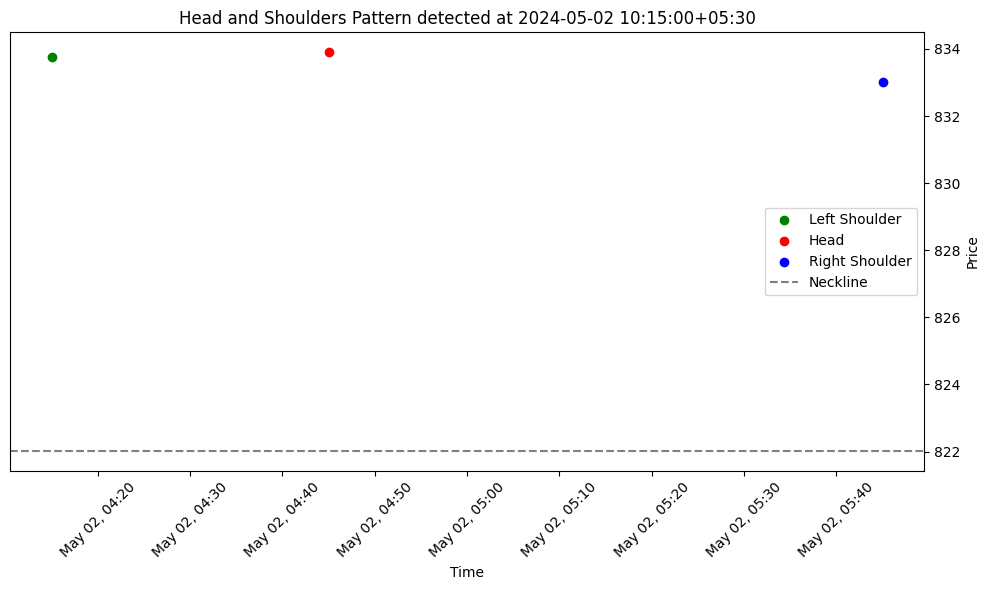

Left Shoulder: (588, Timestamp('2024-05-02 13:00:00+0530', tz='UTC+05:30'), 832.0), Head: (590, Timestamp('2024-05-02 13:30:00+0530', tz='UTC+05:30'), 832.4), Right Shoulder: (593, Timestamp('2024-05-02 14:15:00+0530', tz='UTC+05:30'), 831.0), Neckline Level: 829.3
                             Open    High     Low   Close
Datetime                                                 
2024-05-02 11:45:00+05:30  830.45  830.90  829.70  830.00
2024-05-02 12:00:00+05:30  830.00  830.50  829.60  830.20
2024-05-02 12:15:00+05:30  830.20  831.45  830.00  830.20
2024-05-02 12:30:00+05:30  830.05  831.00  829.00  830.40
2024-05-02 12:45:00+05:30  830.40  830.75  829.95  830.25
2024-05-02 13:00:00+05:30  830.30  832.00  830.00  831.70
2024-05-02 13:15:00+05:30  831.60  831.75  829.90  830.65
2024-05-02 13:30:00+05:30  830.65  832.40  829.90  830.00
2024-05-02 13:45:00+05:30  830.00  830.50  829.60  829.85
2024-05-02 14:00:00+05:30  829.80  830.90  829.35  829.65
2024-05-02 14:15:00+05:30  829.65  831

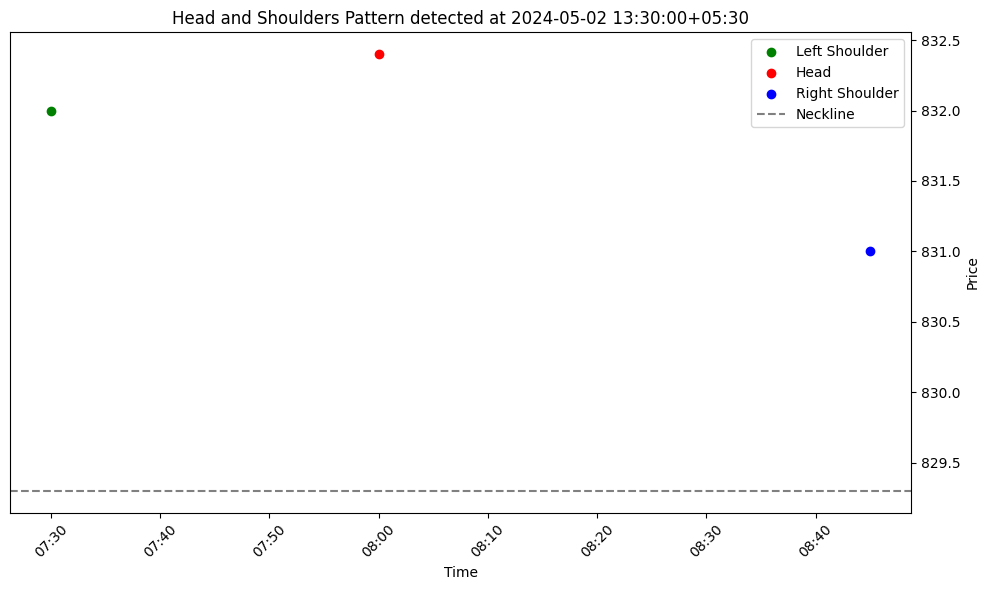

Left Shoulder: (595, Timestamp('2024-05-02 14:45:00+0530', tz='UTC+05:30'), 830.75), Head: (599, Timestamp('2024-05-03 09:15:00+0530', tz='UTC+05:30'), 836.2), Right Shoulder: (611, Timestamp('2024-05-03 12:15:00+0530', tz='UTC+05:30'), 828.2), Neckline Level: 828.275
                             Open    High     Low   Close
Datetime                                                 
2024-05-02 13:30:00+05:30  830.65  832.40  829.90  830.00
2024-05-02 13:45:00+05:30  830.00  830.50  829.60  829.85
2024-05-02 14:00:00+05:30  829.80  830.90  829.35  829.65
2024-05-02 14:15:00+05:30  829.65  831.00  829.25  829.50
2024-05-02 14:30:00+05:30  829.50  830.65  829.45  830.00
2024-05-02 14:45:00+05:30  830.00  830.75  829.15  830.20
2024-05-02 15:00:00+05:30  830.15  830.55  829.80  830.05
2024-05-02 15:15:00+05:30  830.05  830.45  829.95  830.05
2024-05-03 09:00:00+05:30  833.80  834.80  831.45  833.05
2024-05-03 09:15:00+05:30  833.05  836.20  833.00  833.45
2024-05-03 09:30:00+05:30  833.45  

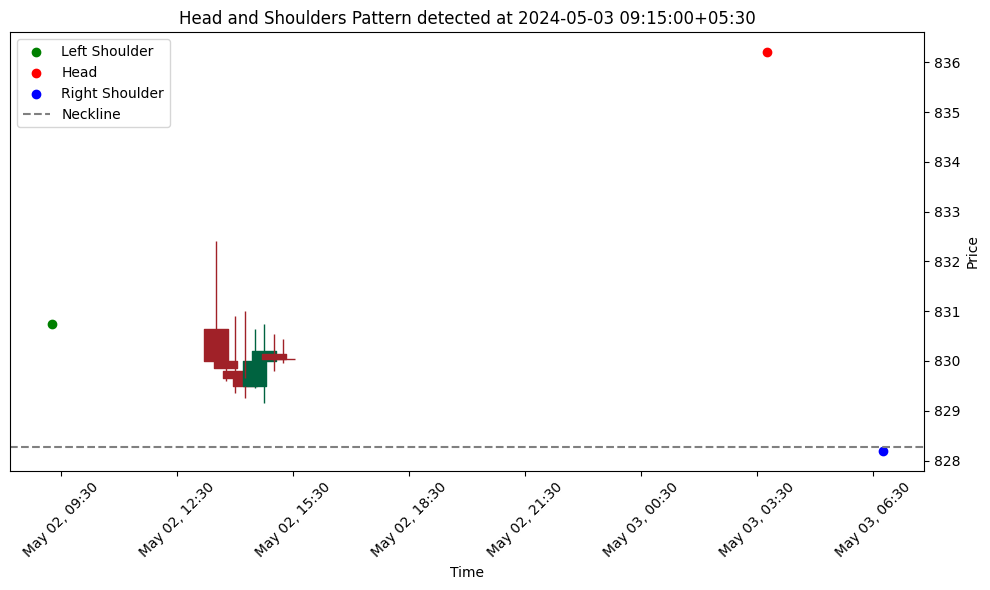

Left Shoulder: (662, Timestamp('2024-05-07 12:00:00+0530', tz='UTC+05:30'), 801.25), Head: (667, Timestamp('2024-05-07 13:15:00+0530', tz='UTC+05:30'), 804.8), Right Shoulder: (670, Timestamp('2024-05-07 14:00:00+0530', tz='UTC+05:30'), 804.0), Neckline Level: 806.65
                             Open    High     Low   Close
Datetime                                                 
2024-05-07 10:45:00+05:30  802.55  803.00  797.05  797.50
2024-05-07 11:00:00+05:30  797.80  798.05  793.20  794.60
2024-05-07 11:15:00+05:30  795.00  796.95  794.10  796.35
2024-05-07 11:30:00+05:30  796.45  799.50  796.15  799.00
2024-05-07 11:45:00+05:30  799.25  799.50  797.85  798.90
2024-05-07 12:00:00+05:30  798.85  801.25  798.00  800.00
2024-05-07 12:15:00+05:30  799.85  800.00  795.50  795.90
2024-05-07 12:30:00+05:30  795.90  797.20  795.25  797.15
2024-05-07 12:45:00+05:30  797.20  799.60  796.80  798.40
2024-05-07 13:00:00+05:30  798.45  801.70  797.60  799.95
2024-05-07 13:15:00+05:30  799.85  8

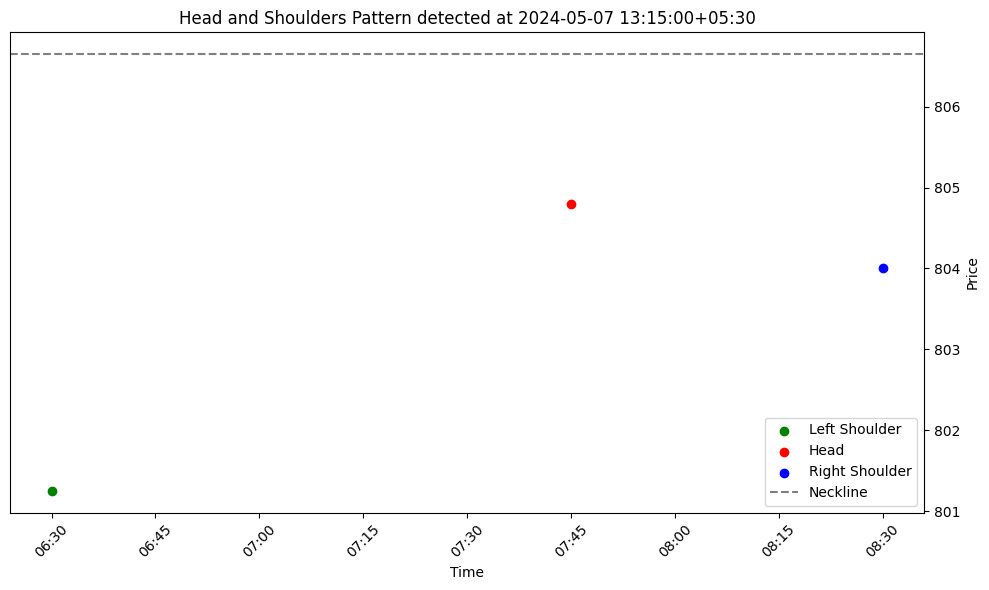

Left Shoulder: (678, Timestamp('2024-05-08 09:30:00+0530', tz='UTC+05:30'), 811.0), Head: (680, Timestamp('2024-05-08 10:00:00+0530', tz='UTC+05:30'), 812.9), Right Shoulder: (684, Timestamp('2024-05-08 11:00:00+0530', tz='UTC+05:30'), 812.35), Neckline Level: 799.4749999999999
                             Open    High     Low   Close
Datetime                                                 
2024-05-07 14:45:00+05:30  803.70  804.90  801.00  802.00
2024-05-07 15:00:00+05:30  802.10  802.70  800.15  802.60
2024-05-07 15:15:00+05:30  802.55  803.85  801.90  801.90
2024-05-08 09:00:00+05:30  802.60  808.25  799.50  803.65
2024-05-08 09:15:00+05:30  803.45  808.90  803.05  804.90
2024-05-08 09:30:00+05:30  804.90  811.00  804.75  810.20
2024-05-08 09:45:00+05:30  810.05  810.80  807.30  808.00
2024-05-08 10:00:00+05:30  807.95  812.90  806.65  807.15
2024-05-08 10:15:00+05:30  807.10  807.50  804.45  804.90
2024-05-08 10:30:00+05:30  804.80  807.25  803.70  806.50
2024-05-08 10:45:00+05:30

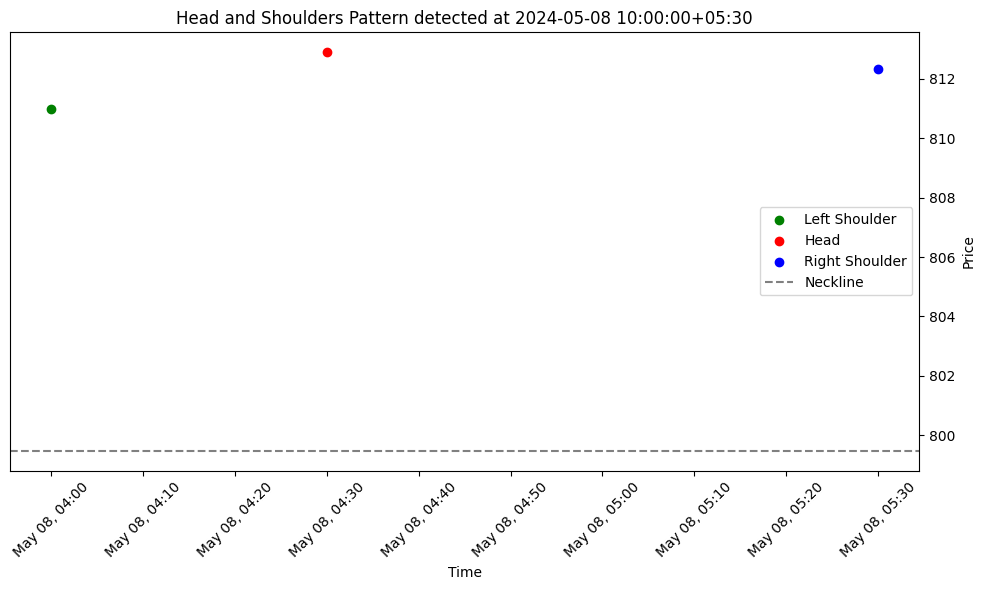

Left Shoulder: (691, Timestamp('2024-05-08 12:45:00+0530', tz='UTC+05:30'), 820.0), Head: (693, Timestamp('2024-05-08 13:15:00+0530', tz='UTC+05:30'), 822.0), Right Shoulder: (698, Timestamp('2024-05-08 14:30:00+0530', tz='UTC+05:30'), 815.0), Neckline Level: 810.425
                             Open    High     Low   Close
Datetime                                                 
2024-05-08 11:30:00+05:30  811.75  813.50  809.20  810.45
2024-05-08 11:45:00+05:30  810.40  812.50  810.15  810.15
2024-05-08 12:00:00+05:30  810.20  812.90  810.10  812.05
2024-05-08 12:15:00+05:30  812.00  814.85  811.50  814.65
2024-05-08 12:30:00+05:30  814.50  819.35  813.70  819.30
2024-05-08 12:45:00+05:30  819.00  820.00  815.15  815.60
2024-05-08 13:00:00+05:30  815.60  819.30  815.45  819.25
2024-05-08 13:15:00+05:30  819.00  822.00  818.30  821.40
2024-05-08 13:30:00+05:30  821.50  821.50  815.55  817.65
2024-05-08 13:45:00+05:30  817.60  818.00  814.30  815.40
2024-05-08 14:00:00+05:30  815.55  8

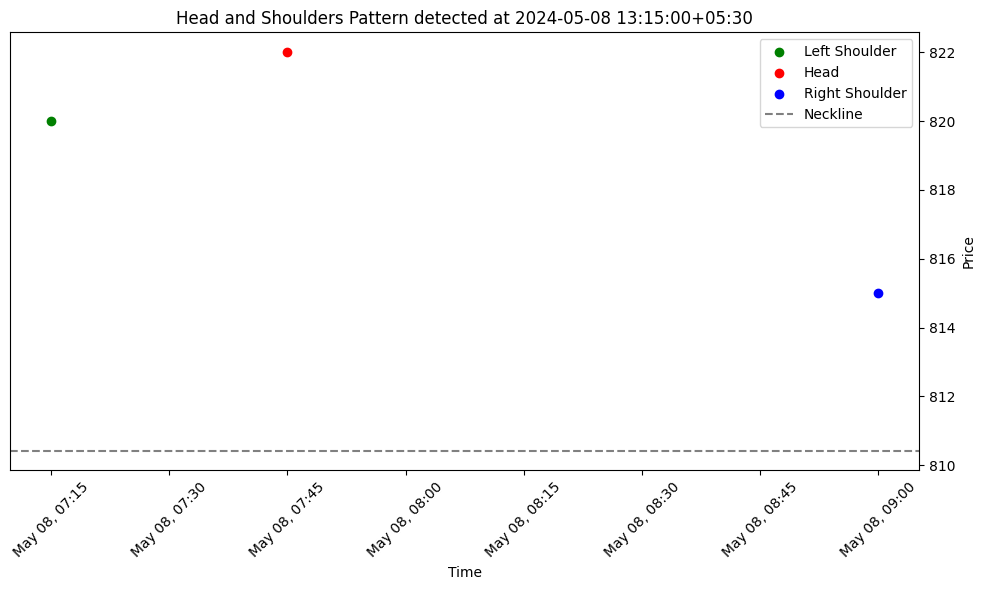

Left Shoulder: (698, Timestamp('2024-05-08 14:30:00+0530', tz='UTC+05:30'), 815.0), Head: (702, Timestamp('2024-05-09 09:00:00+0530', tz='UTC+05:30'), 818.25), Right Shoulder: (704, Timestamp('2024-05-09 09:30:00+0530', tz='UTC+05:30'), 816.8), Neckline Level: 808.8
                             Open    High     Low   Close
Datetime                                                 
2024-05-08 13:15:00+05:30  819.00  822.00  818.30  821.40
2024-05-08 13:30:00+05:30  821.50  821.50  815.55  817.65
2024-05-08 13:45:00+05:30  817.60  818.00  814.30  815.40
2024-05-08 14:00:00+05:30  815.55  816.20  810.75  813.90
2024-05-08 14:15:00+05:30  813.50  814.00  811.05  812.70
2024-05-08 14:30:00+05:30  812.70  815.00  812.20  813.75
2024-05-08 14:45:00+05:30  813.95  814.25  807.55  810.70
2024-05-08 15:00:00+05:30  810.90  811.50  809.85  811.25
2024-05-08 15:15:00+05:30  811.20  811.55  810.80  810.80
2024-05-09 09:00:00+05:30  811.40  818.25  810.05  813.60
2024-05-09 09:15:00+05:30  813.60  81

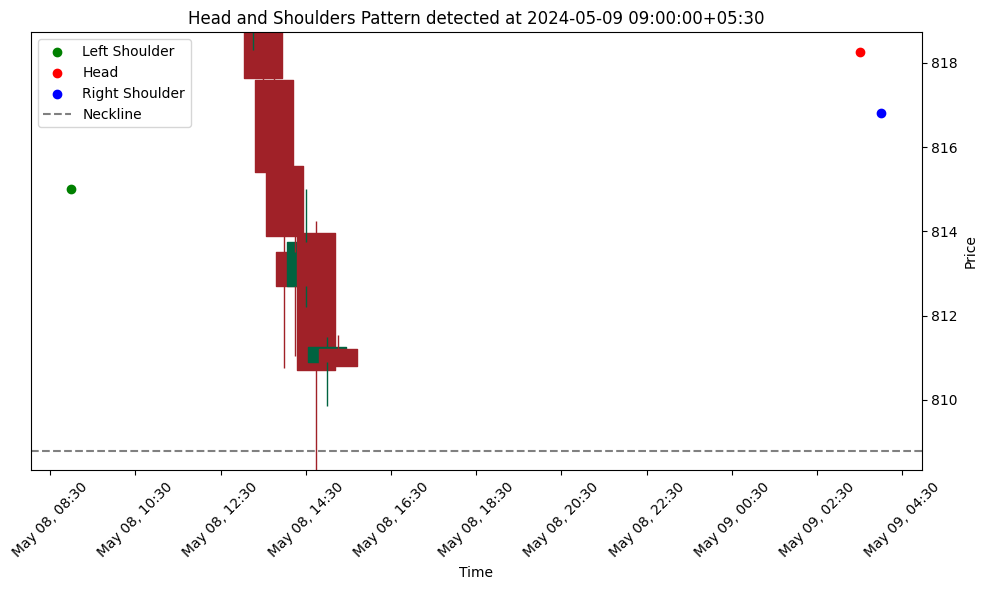

Left Shoulder: (714, Timestamp('2024-05-09 12:00:00+0530', tz='UTC+05:30'), 817.0), Head: (721, Timestamp('2024-05-09 13:45:00+0530', tz='UTC+05:30'), 839.65), Right Shoulder: (726, Timestamp('2024-05-09 15:00:00+0530', tz='UTC+05:30'), 822.8), Neckline Level: 812.65
                             Open    High     Low   Close
Datetime                                                 
2024-05-09 10:45:00+05:30  812.55  812.75  809.05  809.85
2024-05-09 11:00:00+05:30  809.85  810.00  805.85  807.90
2024-05-09 11:15:00+05:30  807.90  810.00  806.90  809.30
2024-05-09 11:30:00+05:30  809.35  814.50  809.00  813.20
2024-05-09 11:45:00+05:30  813.20  815.30  811.20  814.90
2024-05-09 12:00:00+05:30  814.70  817.00  813.30  813.65
2024-05-09 12:15:00+05:30  813.65  813.85  809.65  812.00
2024-05-09 12:30:00+05:30  812.00  812.90  805.70  805.95
2024-05-09 12:45:00+05:30  806.20  810.30  803.55  808.75
2024-05-09 13:00:00+05:30  808.75  811.65  807.60  810.00
2024-05-09 13:15:00+05:30  810.00  8

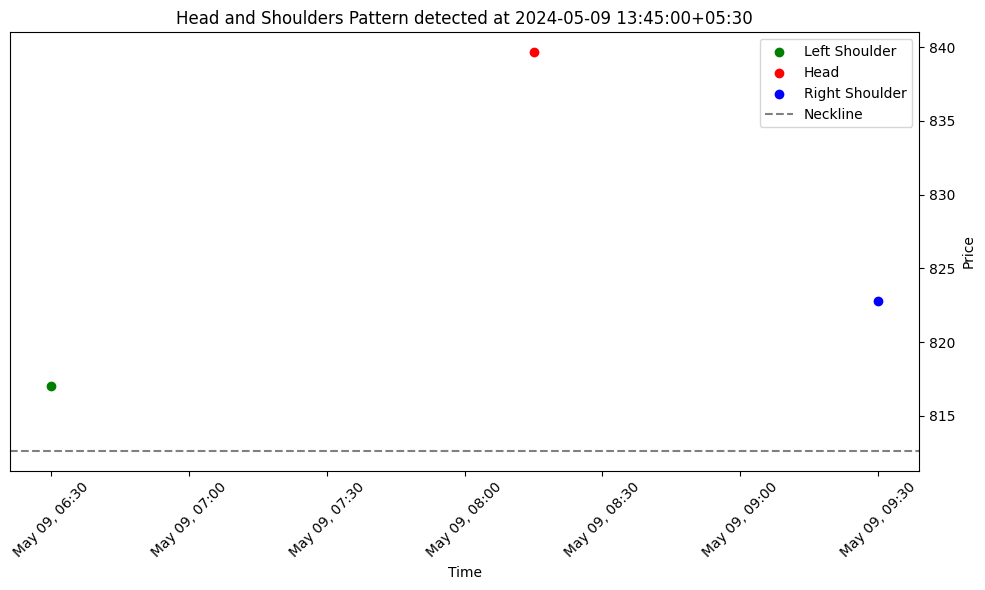

Left Shoulder: (726, Timestamp('2024-05-09 15:00:00+0530', tz='UTC+05:30'), 822.8), Head: (728, Timestamp('2024-05-10 09:00:00+0530', tz='UTC+05:30'), 832.05), Right Shoulder: (731, Timestamp('2024-05-10 09:45:00+0530', tz='UTC+05:30'), 828.15), Neckline Level: 819.575
                             Open    High     Low   Close
Datetime                                                 
2024-05-09 13:45:00+05:30  815.05  839.65  808.65  837.00
2024-05-09 14:00:00+05:30  837.65  839.55  826.40  828.80
2024-05-09 14:15:00+05:30  828.65  831.40  818.65  818.80
2024-05-09 14:30:00+05:30  818.80  827.95  816.65  820.55
2024-05-09 14:45:00+05:30  820.75  821.90  817.75  818.60
2024-05-09 15:00:00+05:30  818.60  822.80  818.00  820.30
2024-05-09 15:15:00+05:30  820.50  821.00  819.80  819.80
2024-05-10 09:00:00+05:30  827.40  832.05  816.65  823.15
2024-05-10 09:15:00+05:30  823.10  826.25  817.05  820.10
2024-05-10 09:30:00+05:30  819.90  823.70  819.35  823.30
2024-05-10 09:45:00+05:30  823.45 

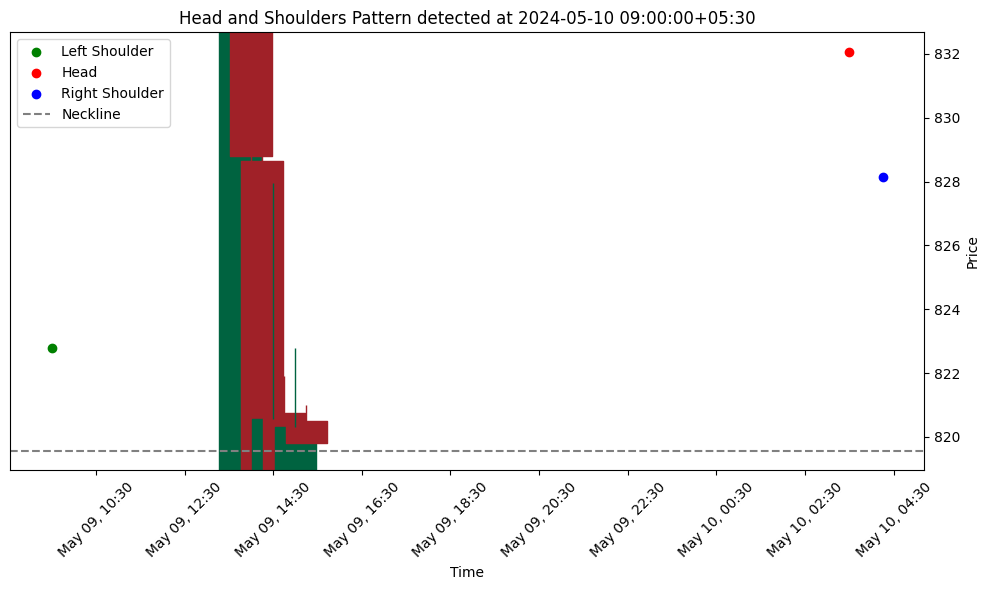

Left Shoulder: (774, Timestamp('2024-05-13 14:00:00+0530', tz='UTC+05:30'), 814.5), Head: (780, Timestamp('2024-05-14 09:00:00+0530', tz='UTC+05:30'), 818.0), Right Shoulder: (786, Timestamp('2024-05-14 10:30:00+0530', tz='UTC+05:30'), 815.6), Neckline Level: 803.675
                             Open    High     Low   Close
Datetime                                                 
2024-05-13 12:45:00+05:30  809.70  809.80  807.70  808.60
2024-05-13 13:00:00+05:30  808.30  808.85  803.40  804.10
2024-05-13 13:15:00+05:30  804.10  804.25  800.30  803.30
2024-05-13 13:30:00+05:30  803.25  812.00  803.00  811.45
2024-05-13 13:45:00+05:30  811.40  813.00  809.35  812.00
2024-05-13 14:00:00+05:30  812.00  814.50  810.05  812.30
2024-05-13 14:15:00+05:30  812.30  814.30  810.40  812.40
2024-05-13 14:30:00+05:30  812.65  812.75  809.35  810.45
2024-05-13 14:45:00+05:30  810.50  810.75  807.20  809.20
2024-05-13 15:00:00+05:30  809.40  809.85  807.90  808.90
2024-05-13 15:15:00+05:30  809.00  8

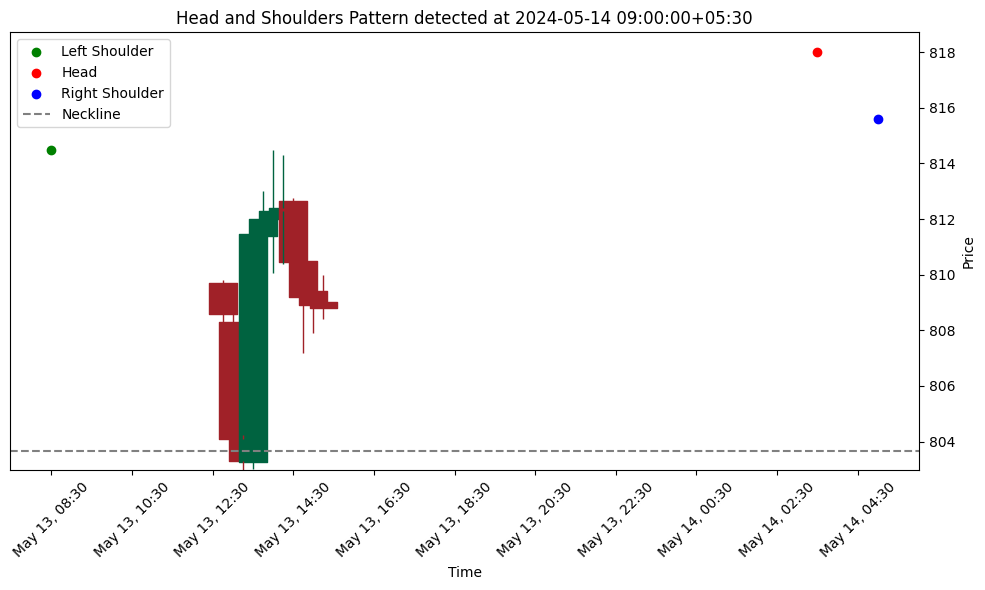

Left Shoulder: (791, Timestamp('2024-05-14 11:45:00+0530', tz='UTC+05:30'), 814.9), Head: (794, Timestamp('2024-05-14 12:30:00+0530', tz='UTC+05:30'), 822.4), Right Shoulder: (797, Timestamp('2024-05-14 13:15:00+0530', tz='UTC+05:30'), 819.85), Neckline Level: 813.85
                             Open    High     Low   Close
Datetime                                                 
2024-05-14 10:30:00+05:30  813.95  815.60  812.70  813.70
2024-05-14 10:45:00+05:30  813.70  814.25  812.75  813.65
2024-05-14 11:00:00+05:30  813.60  814.40  812.15  812.55
2024-05-14 11:15:00+05:30  812.55  813.50  811.70  812.70
2024-05-14 11:30:00+05:30  812.65  813.90  812.00  813.35
2024-05-14 11:45:00+05:30  813.30  814.90  812.60  813.70
2024-05-14 12:00:00+05:30  813.75  814.05  812.60  813.40
2024-05-14 12:15:00+05:30  813.40  817.30  813.40  816.55
2024-05-14 12:30:00+05:30  816.55  822.40  816.25  820.65
2024-05-14 12:45:00+05:30  820.75  821.40  818.10  818.40
2024-05-14 13:00:00+05:30  818.35  8

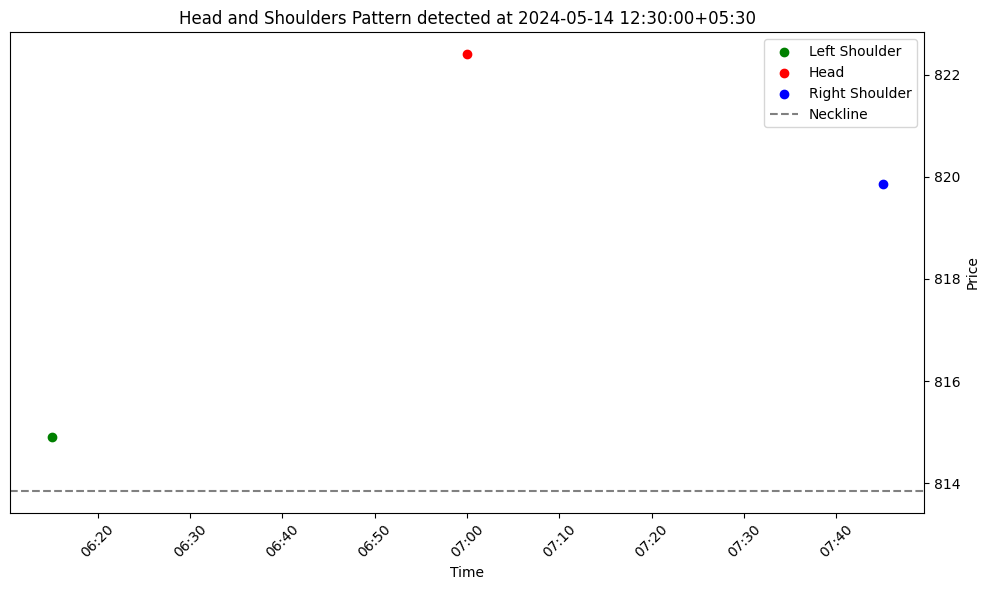

Left Shoulder: (797, Timestamp('2024-05-14 13:15:00+0530', tz='UTC+05:30'), 819.85), Head: (800, Timestamp('2024-05-14 14:00:00+0530', tz='UTC+05:30'), 820.0), Right Shoulder: (803, Timestamp('2024-05-14 14:45:00+0530', tz='UTC+05:30'), 819.8), Neckline Level: 816.675
                             Open    High     Low   Close
Datetime                                                 
2024-05-14 12:00:00+05:30  813.75  814.05  812.60  813.40
2024-05-14 12:15:00+05:30  813.40  817.30  813.40  816.55
2024-05-14 12:30:00+05:30  816.55  822.40  816.25  820.65
2024-05-14 12:45:00+05:30  820.75  821.40  818.10  818.40
2024-05-14 13:00:00+05:30  818.35  818.60  816.00  818.00
2024-05-14 13:15:00+05:30  817.90  819.85  817.90  818.25
2024-05-14 13:30:00+05:30  818.45  819.70  818.05  818.90
2024-05-14 13:45:00+05:30  818.90  819.80  818.55  819.30
2024-05-14 14:00:00+05:30  819.25  820.00  816.15  819.90
2024-05-14 14:15:00+05:30  819.85  819.85  817.55  817.90
2024-05-14 14:30:00+05:30  817.85  

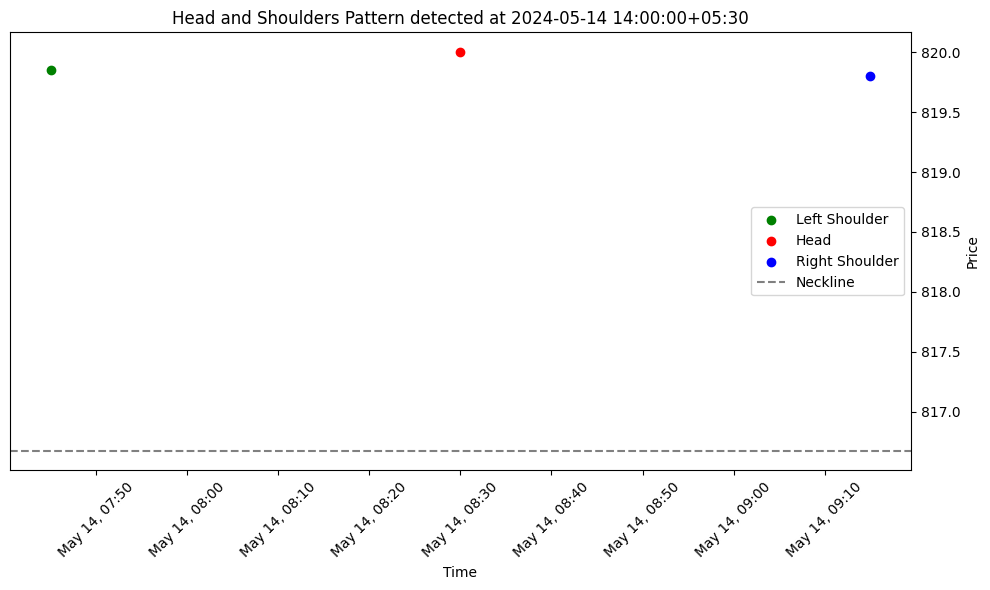

Left Shoulder: (803, Timestamp('2024-05-14 14:45:00+0530', tz='UTC+05:30'), 819.8), Head: (806, Timestamp('2024-05-15 09:00:00+0530', tz='UTC+05:30'), 825.3), Right Shoulder: (814, Timestamp('2024-05-15 11:00:00+0530', tz='UTC+05:30'), 825.1), Neckline Level: 816.9
                             Open    High     Low   Close
Datetime                                                 
2024-05-14 13:30:00+05:30  818.45  819.70  818.05  818.90
2024-05-14 13:45:00+05:30  818.90  819.80  818.55  819.30
2024-05-14 14:00:00+05:30  819.25  820.00  816.15  819.90
2024-05-14 14:15:00+05:30  819.85  819.85  817.55  817.90
2024-05-14 14:30:00+05:30  817.85  818.20  817.20  817.80
2024-05-14 14:45:00+05:30  817.70  819.80  817.25  819.15
2024-05-14 15:00:00+05:30  819.05  819.40  817.35  817.75
2024-05-14 15:15:00+05:30  818.00  818.20  815.75  818.20
2024-05-15 09:00:00+05:30  820.20  825.30  819.90  823.10
2024-05-15 09:15:00+05:30  823.05  824.30  822.25  822.95
2024-05-15 09:30:00+05:30  822.90  823

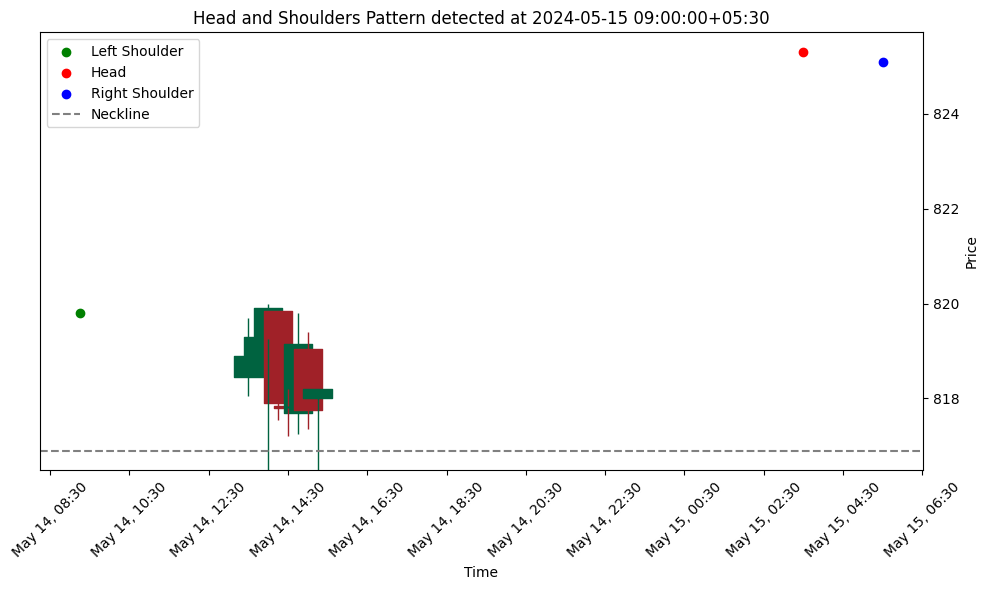

Left Shoulder: (864, Timestamp('2024-05-17 10:30:00+0530', tz='UTC+05:30'), 821.7), Head: (866, Timestamp('2024-05-17 11:00:00+0530', tz='UTC+05:30'), 822.45), Right Shoulder: (868, Timestamp('2024-05-17 11:30:00+0530', tz='UTC+05:30'), 820.4), Neckline Level: 806.2
                             Open    High     Low   Close
Datetime                                                 
2024-05-17 09:15:00+05:30  813.25  817.60  812.60  813.15
2024-05-17 09:30:00+05:30  813.10  819.45  812.85  818.45
2024-05-17 09:45:00+05:30  818.80  819.85  816.10  819.10
2024-05-17 10:00:00+05:30  819.20  821.25  817.20  820.55
2024-05-17 10:15:00+05:30  821.10  821.40  819.15  819.85
2024-05-17 10:30:00+05:30  819.85  821.70  819.50  819.95
2024-05-17 10:45:00+05:30  819.95  821.65  819.25  821.50
2024-05-17 11:00:00+05:30  821.45  822.45  818.30  819.25
2024-05-17 11:15:00+05:30  819.30  819.50  818.00  819.20
2024-05-17 11:30:00+05:30  818.95  820.40  818.80  820.10
2024-05-17 11:45:00+05:30  820.15  82

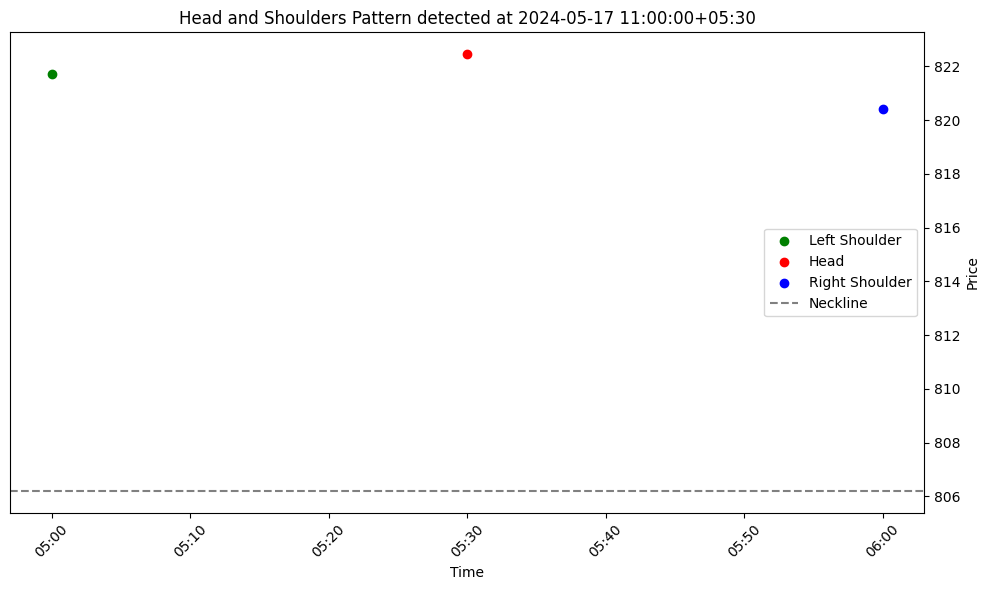

Left Shoulder: (884, Timestamp('2024-05-21 09:00:00+0530', tz='UTC+05:30'), 828.45), Head: (888, Timestamp('2024-05-21 10:00:00+0530', tz='UTC+05:30'), 836.3), Right Shoulder: (894, Timestamp('2024-05-21 11:30:00+0530', tz='UTC+05:30'), 833.0), Neckline Level: 816.175
                             Open    High     Low   Close
Datetime                                                 
2024-05-17 14:15:00+05:30  816.20  818.00  815.90  817.75
2024-05-17 14:30:00+05:30  817.70  818.00  816.50  816.70
2024-05-17 14:45:00+05:30  816.50  817.80  816.05  817.60
2024-05-17 15:00:00+05:30  817.55  819.90  817.50  817.85
2024-05-17 15:15:00+05:30  817.55  818.00  817.20  817.85
2024-05-21 09:00:00+05:30  821.50  828.45  820.05  826.85
2024-05-21 09:15:00+05:30  826.75  827.20  823.50  826.40
2024-05-21 09:30:00+05:30  826.50  829.90  824.55  829.40
2024-05-21 09:45:00+05:30  829.35  831.65  828.50  831.50
2024-05-21 10:00:00+05:30  831.65  836.30  831.00  834.60
2024-05-21 10:15:00+05:30  834.30  

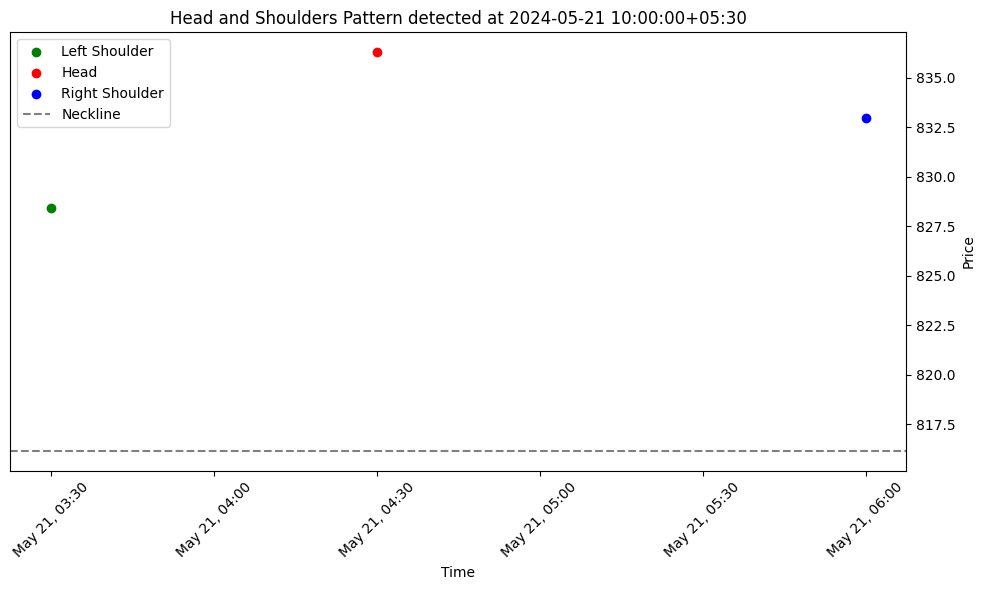

Left Shoulder: (894, Timestamp('2024-05-21 11:30:00+0530', tz='UTC+05:30'), 833.0), Head: (898, Timestamp('2024-05-21 12:30:00+0530', tz='UTC+05:30'), 834.8), Right Shoulder: (900, Timestamp('2024-05-21 13:00:00+0530', tz='UTC+05:30'), 834.5), Neckline Level: 815.825
                             Open    High     Low   Close
Datetime                                                 
2024-05-21 10:15:00+05:30  834.30  835.00  828.10  829.50
2024-05-21 10:30:00+05:30  829.55  830.05  827.35  828.70
2024-05-21 10:45:00+05:30  828.75  831.50  828.60  831.05
2024-05-21 11:00:00+05:30  831.25  832.50  830.60  831.45
2024-05-21 11:15:00+05:30  831.35  832.85  831.20  831.45
2024-05-21 11:30:00+05:30  831.45  833.00  831.20  832.20
2024-05-21 11:45:00+05:30  832.45  832.55  830.70  832.35
2024-05-21 12:00:00+05:30  832.50  832.95  830.50  830.70
2024-05-21 12:15:00+05:30  830.60  833.95  830.50  833.55
2024-05-21 12:30:00+05:30  833.60  834.80  833.35  834.00
2024-05-21 12:45:00+05:30  834.20  8

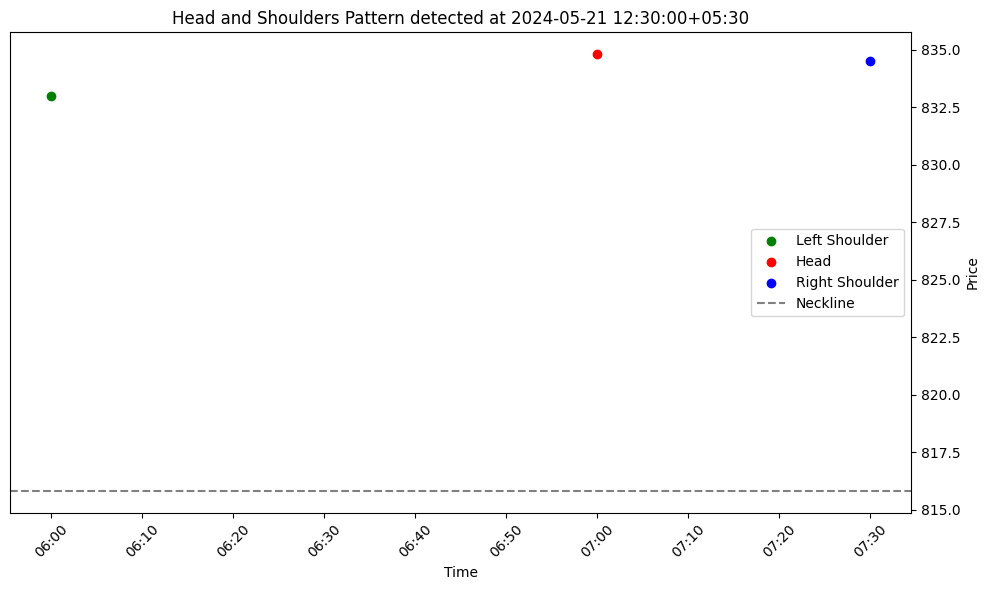

Left Shoulder: (945, Timestamp('2024-05-23 11:15:00+0530', tz='UTC+05:30'), 833.4), Head: (950, Timestamp('2024-05-23 12:30:00+0530', tz='UTC+05:30'), 834.2), Right Shoulder: (956, Timestamp('2024-05-23 14:00:00+0530', tz='UTC+05:30'), 834.0), Neckline Level: 817.0
                             Open    High     Low   Close
Datetime                                                 
2024-05-23 10:00:00+05:30  827.65  834.40  826.80  833.70
2024-05-23 10:15:00+05:30  833.65  835.50  830.00  831.30
2024-05-23 10:30:00+05:30  831.15  832.60  830.05  831.25
2024-05-23 10:45:00+05:30  831.35  832.40  831.10  831.70
2024-05-23 11:00:00+05:30  831.70  832.90  831.20  832.60
2024-05-23 11:15:00+05:30  832.90  833.40  832.00  832.80
2024-05-23 11:30:00+05:30  832.85  832.90  830.25  832.35
2024-05-23 11:45:00+05:30  832.45  832.45  830.20  831.60
2024-05-23 12:00:00+05:30  831.70  832.75  831.50  831.90
2024-05-23 12:15:00+05:30  832.05  834.00  831.45  833.95
2024-05-23 12:30:00+05:30  834.00  834

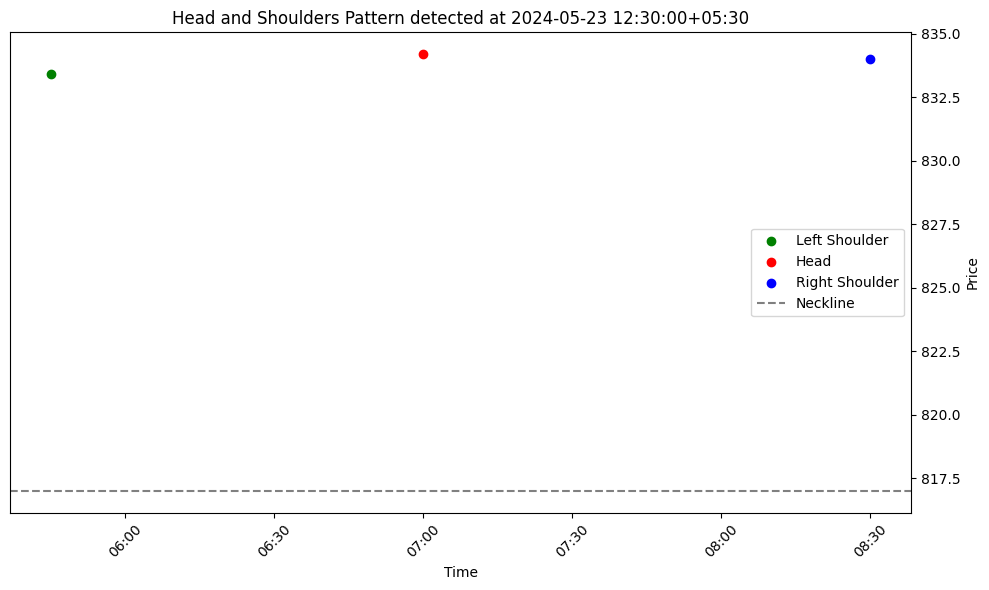

Left Shoulder: (959, Timestamp('2024-05-23 14:45:00+0530', tz='UTC+05:30'), 833.7), Head: (963, Timestamp('2024-05-24 09:15:00+0530', tz='UTC+05:30'), 841.25), Right Shoulder: (973, Timestamp('2024-05-24 11:45:00+0530', tz='UTC+05:30'), 836.7), Neckline Level: 830.075
                             Open    High     Low   Close
Datetime                                                 
2024-05-23 13:30:00+05:30  830.85  832.20  829.55  830.90
2024-05-23 13:45:00+05:30  830.95  832.40  830.90  832.35
2024-05-23 14:00:00+05:30  832.40  834.00  832.05  832.50
2024-05-23 14:15:00+05:30  832.80  833.00  831.00  831.80
2024-05-23 14:30:00+05:30  831.60  832.60  830.50  832.15
2024-05-23 14:45:00+05:30  831.90  833.70  831.70  832.60
2024-05-23 15:00:00+05:30  832.60  833.40  829.10  829.70
2024-05-23 15:15:00+05:30  829.30  832.10  829.00  832.10
2024-05-24 09:00:00+05:30  829.85  838.80  829.00  838.05
2024-05-24 09:15:00+05:30  838.30  841.25  836.65  839.00
2024-05-24 09:30:00+05:30  838.95  

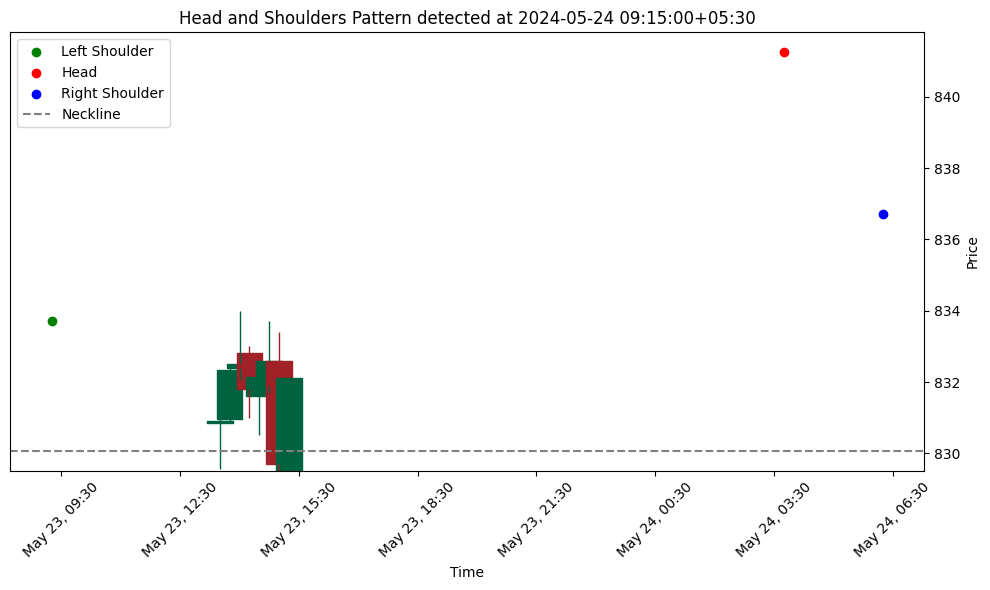

Left Shoulder: (973, Timestamp('2024-05-24 11:45:00+0530', tz='UTC+05:30'), 836.7), Head: (977, Timestamp('2024-05-24 12:45:00+0530', tz='UTC+05:30'), 837.9), Right Shoulder: (982, Timestamp('2024-05-24 14:00:00+0530', tz='UTC+05:30'), 834.95), Neckline Level: 833.25
                             Open    High     Low   Close
Datetime                                                 
2024-05-24 10:30:00+05:30  837.60  838.40  836.35  837.15
2024-05-24 10:45:00+05:30  837.25  837.75  836.10  836.20
2024-05-24 11:00:00+05:30  835.20  837.20  834.35  836.55
2024-05-24 11:15:00+05:30  836.35  836.80  833.30  833.45
2024-05-24 11:30:00+05:30  833.30  836.00  833.10  835.40
2024-05-24 11:45:00+05:30  835.50  836.70  834.30  835.55
2024-05-24 12:00:00+05:30  835.55  836.50  834.05  834.80
2024-05-24 12:15:00+05:30  834.75  835.65  834.25  834.80
2024-05-24 12:30:00+05:30  834.90  836.40  834.25  836.25
2024-05-24 12:45:00+05:30  836.05  837.90  835.20  835.80
2024-05-24 13:00:00+05:30  835.80  8

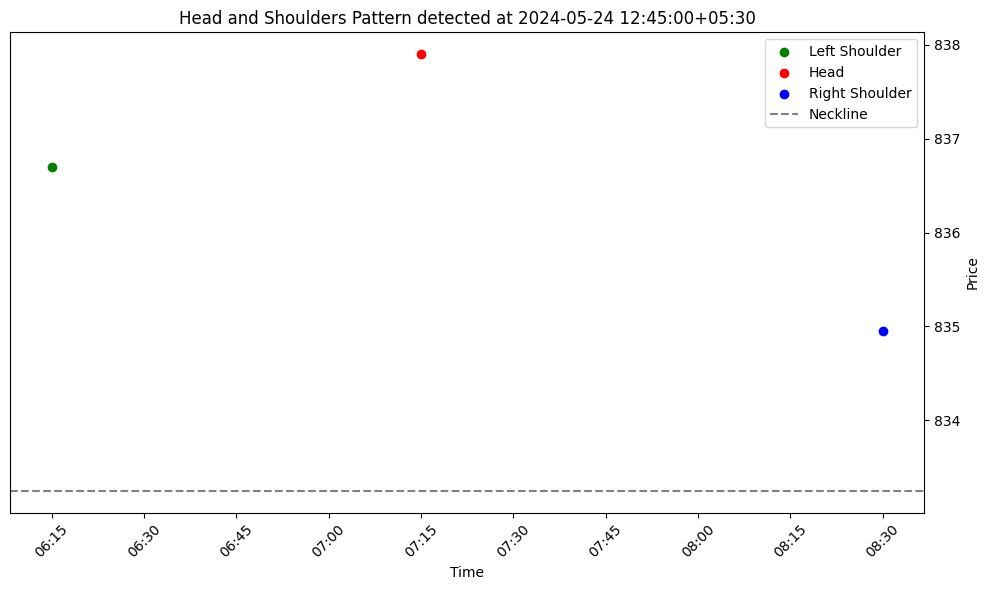

Left Shoulder: (994, Timestamp('2024-05-27 10:30:00+0530', tz='UTC+05:30'), 831.0), Head: (1001, Timestamp('2024-05-27 12:15:00+0530', tz='UTC+05:30'), 838.7), Right Shoulder: (1004, Timestamp('2024-05-27 13:00:00+0530', tz='UTC+05:30'), 837.5), Neckline Level: 829.6
                             Open    High     Low   Close
Datetime                                                 
2024-05-27 09:15:00+05:30  832.05  832.90  830.00  832.60
2024-05-27 09:30:00+05:30  832.60  832.75  825.20  825.85
2024-05-27 09:45:00+05:30  826.00  829.20  823.00  827.70
2024-05-27 10:00:00+05:30  828.00  830.55  827.00  829.00
2024-05-27 10:15:00+05:30  829.20  830.95  828.35  830.70
2024-05-27 10:30:00+05:30  830.70  831.00  829.30  830.65
2024-05-27 10:45:00+05:30  830.70  830.80  829.30  829.35
2024-05-27 11:00:00+05:30  829.30  830.05  828.50  828.50
2024-05-27 11:15:00+05:30  828.70  829.90  828.20  829.30
2024-05-27 11:30:00+05:30  829.30  833.00  829.15  832.65
2024-05-27 11:45:00+05:30  832.75  8

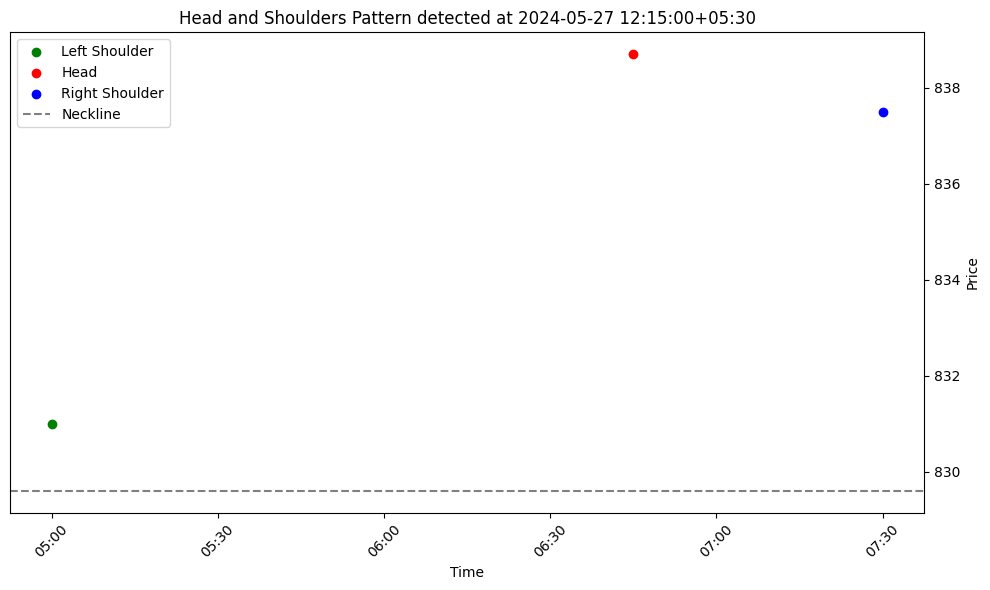

Left Shoulder: (1006, Timestamp('2024-05-27 13:30:00+0530', tz='UTC+05:30'), 837.2), Head: (1009, Timestamp('2024-05-27 14:15:00+0530', tz='UTC+05:30'), 839.4), Right Shoulder: (1011, Timestamp('2024-05-27 14:45:00+0530', tz='UTC+05:30'), 837.5), Neckline Level: 831.35
                             Open    High     Low   Close
Datetime                                                 
2024-05-27 12:15:00+05:30  837.65  838.70  836.05  836.30
2024-05-27 12:30:00+05:30  836.25  836.85  834.50  835.50
2024-05-27 12:45:00+05:30  835.50  836.90  835.10  836.30
2024-05-27 13:00:00+05:30  836.30  837.50  835.85  836.50
2024-05-27 13:15:00+05:30  836.45  836.50  835.25  836.05
2024-05-27 13:30:00+05:30  836.20  837.20  835.40  837.00
2024-05-27 13:45:00+05:30  837.00  837.00  835.80  836.45
2024-05-27 14:00:00+05:30  836.45  838.00  835.60  837.90
2024-05-27 14:15:00+05:30  837.90  839.40  836.20  836.30
2024-05-27 14:30:00+05:30  836.30  836.95  832.50  835.85
2024-05-27 14:45:00+05:30  835.85 

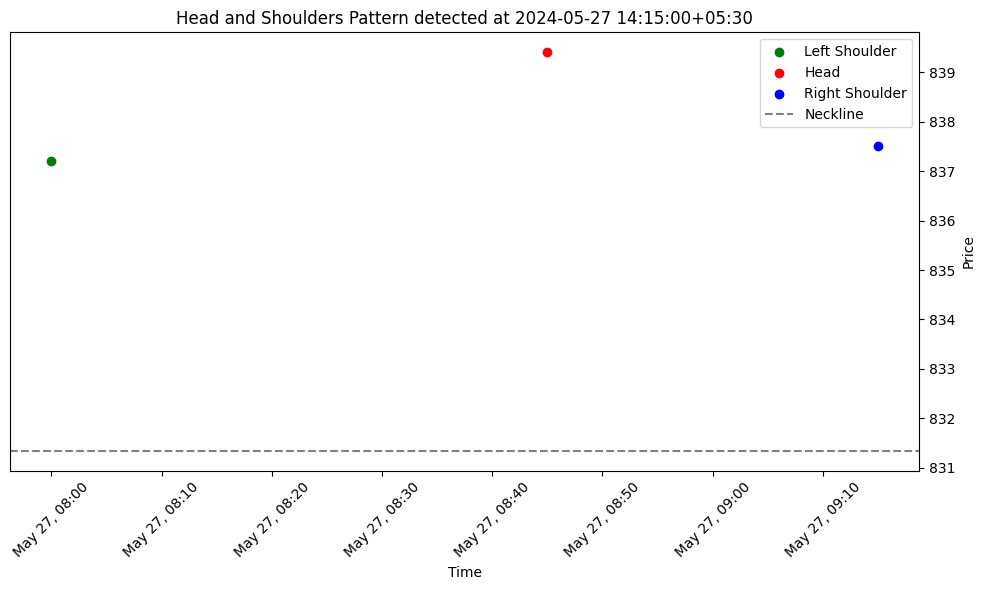

Left Shoulder: (1011, Timestamp('2024-05-27 14:45:00+0530', tz='UTC+05:30'), 837.5), Head: (1014, Timestamp('2024-05-28 09:00:00+0530', tz='UTC+05:30'), 840.7), Right Shoulder: (1019, Timestamp('2024-05-28 10:15:00+0530', tz='UTC+05:30'), 836.65), Neckline Level: 835.425
                             Open    High     Low   Close
Datetime                                                 
2024-05-27 13:30:00+05:30  836.20  837.20  835.40  837.00
2024-05-27 13:45:00+05:30  837.00  837.00  835.80  836.45
2024-05-27 14:00:00+05:30  836.45  838.00  835.60  837.90
2024-05-27 14:15:00+05:30  837.90  839.40  836.20  836.30
2024-05-27 14:30:00+05:30  836.30  836.95  832.50  835.85
2024-05-27 14:45:00+05:30  835.85  837.50  830.75  833.95
2024-05-27 15:00:00+05:30  834.05  834.95  832.10  833.20
2024-05-27 15:15:00+05:30  833.20  833.70  832.50  833.70
2024-05-28 09:00:00+05:30  835.85  840.70  834.05  839.70
2024-05-28 09:15:00+05:30  839.80  839.80  832.25  834.20
2024-05-28 09:30:00+05:30  834.0

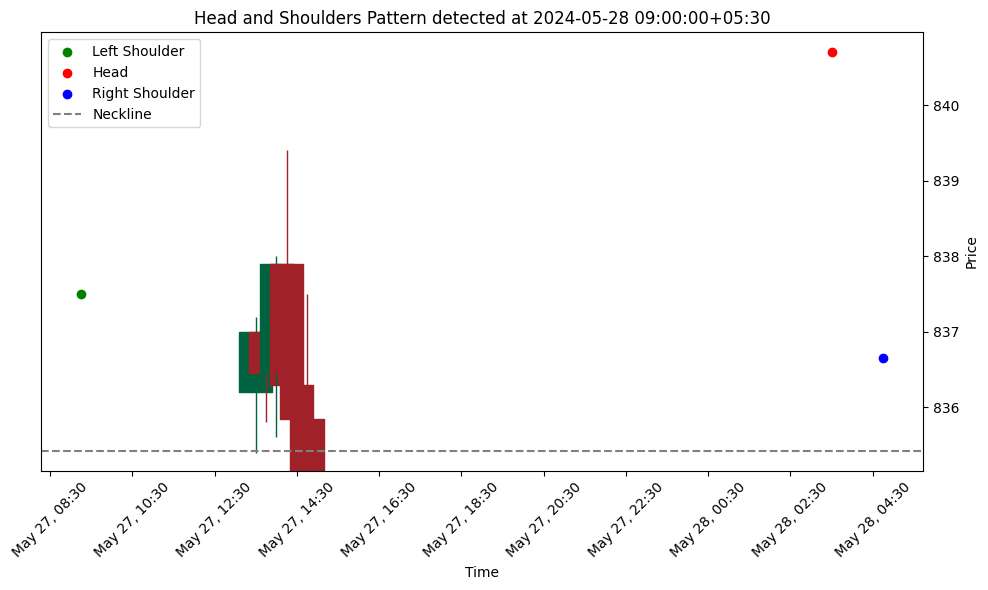

Left Shoulder: (1034, Timestamp('2024-05-28 14:00:00+0530', tz='UTC+05:30'), 833.5), Head: (1041, Timestamp('2024-05-29 09:15:00+0530', tz='UTC+05:30'), 834.45), Right Shoulder: (1050, Timestamp('2024-05-29 11:30:00+0530', tz='UTC+05:30'), 827.9), Neckline Level: 825.4749999999999
                             Open    High     Low   Close
Datetime                                                 
2024-05-28 12:45:00+05:30  832.85  833.90  831.80  832.50
2024-05-28 13:00:00+05:30  832.50  834.00  832.20  833.70
2024-05-28 13:15:00+05:30  833.70  834.00  831.10  833.00
2024-05-28 13:30:00+05:30  833.05  833.75  832.25  832.35
2024-05-28 13:45:00+05:30  832.30  833.20  831.60  832.55
2024-05-28 14:00:00+05:30  832.80  833.50  832.10  832.65
2024-05-28 14:15:00+05:30  832.80  833.10  831.35  832.10
2024-05-28 14:30:00+05:30  831.95  833.00  830.45  831.45
2024-05-28 14:45:00+05:30  831.45  832.50  830.40  831.65
2024-05-28 15:00:00+05:30  831.65  832.20  829.10  829.75
2024-05-28 15:15:00+05

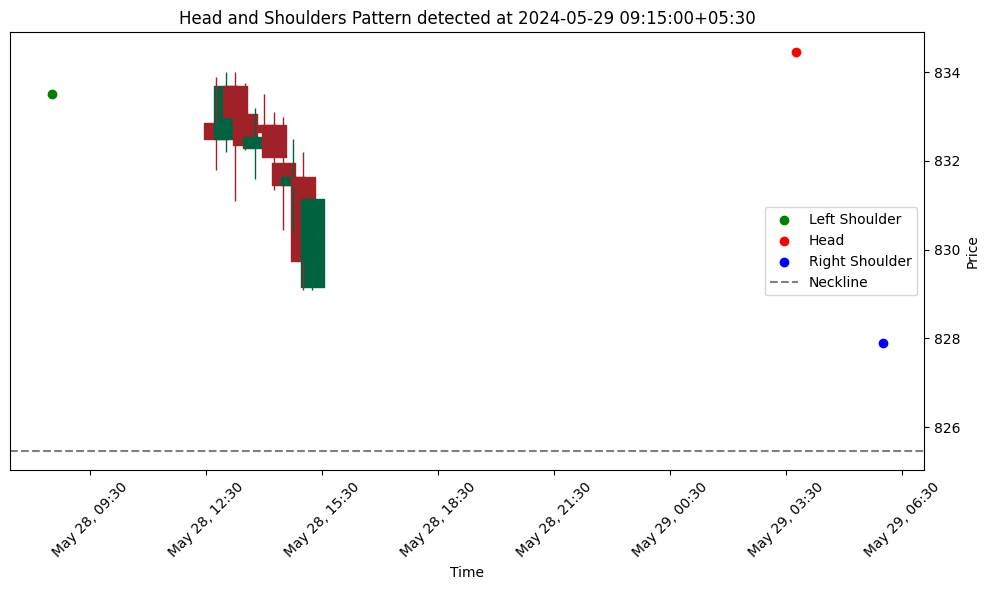

Left Shoulder: (1058, Timestamp('2024-05-29 13:30:00+0530', tz='UTC+05:30'), 828.0), Head: (1066, Timestamp('2024-05-30 09:00:00+0530', tz='UTC+05:30'), 836.0), Right Shoulder: (1071, Timestamp('2024-05-30 10:15:00+0530', tz='UTC+05:30'), 828.6), Neckline Level: 824.575
                             Open    High     Low   Close
Datetime                                                 
2024-05-29 12:15:00+05:30  826.15  827.00  826.00  826.55
2024-05-29 12:30:00+05:30  826.90  827.50  825.90  826.00
2024-05-29 12:45:00+05:30  826.20  827.00  825.35  826.95
2024-05-29 13:00:00+05:30  826.60  827.20  826.00  826.65
2024-05-29 13:15:00+05:30  826.70  827.40  826.40  827.05
2024-05-29 13:30:00+05:30  827.15  828.00  826.50  827.05
2024-05-29 13:45:00+05:30  827.00  827.30  823.35  824.85
2024-05-29 14:00:00+05:30  824.95  825.50  824.30  825.25
2024-05-29 14:15:00+05:30  825.15  825.40  823.40  823.70
2024-05-29 14:30:00+05:30  823.70  825.00  819.30  820.90
2024-05-29 14:45:00+05:30  821.00

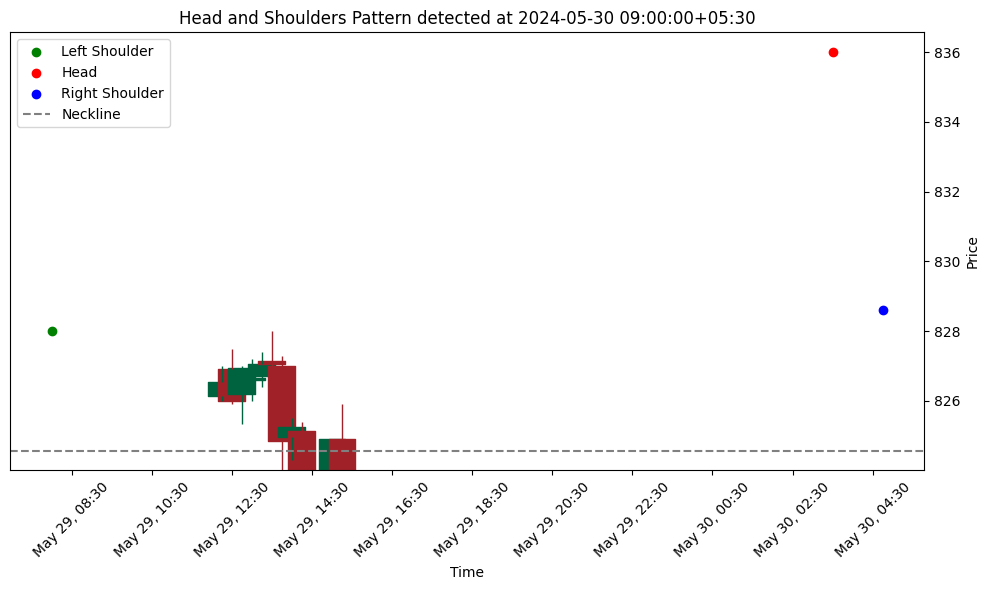

Left Shoulder: (1132, Timestamp('2024-06-03 12:30:00+0530', tz='UTC+05:30'), 911.5), Head: (1134, Timestamp('2024-06-03 13:00:00+0530', tz='UTC+05:30'), 912.0), Right Shoulder: (1136, Timestamp('2024-06-03 13:30:00+0530', tz='UTC+05:30'), 910.0), Neckline Level: 817.675
                             Open    High     Low   Close
Datetime                                                 
2024-06-03 11:15:00+05:30  891.50  896.00  889.30  894.50
2024-06-03 11:30:00+05:30  894.50  896.80  892.55  896.65
2024-06-03 11:45:00+05:30  896.75  899.90  896.65  898.65
2024-06-03 12:00:00+05:30  898.80  903.85  897.35  903.80
2024-06-03 12:15:00+05:30  904.00  909.30  903.50  908.50
2024-06-03 12:30:00+05:30  908.50  911.50  907.20  907.60
2024-06-03 12:45:00+05:30  907.30  910.45  906.00  909.10
2024-06-03 13:00:00+05:30  909.25  912.00  907.60  909.85
2024-06-03 13:15:00+05:30  909.85  909.95  900.00  906.35
2024-06-03 13:30:00+05:30  906.60  910.00  906.60  907.80
2024-06-03 13:45:00+05:30  907.80

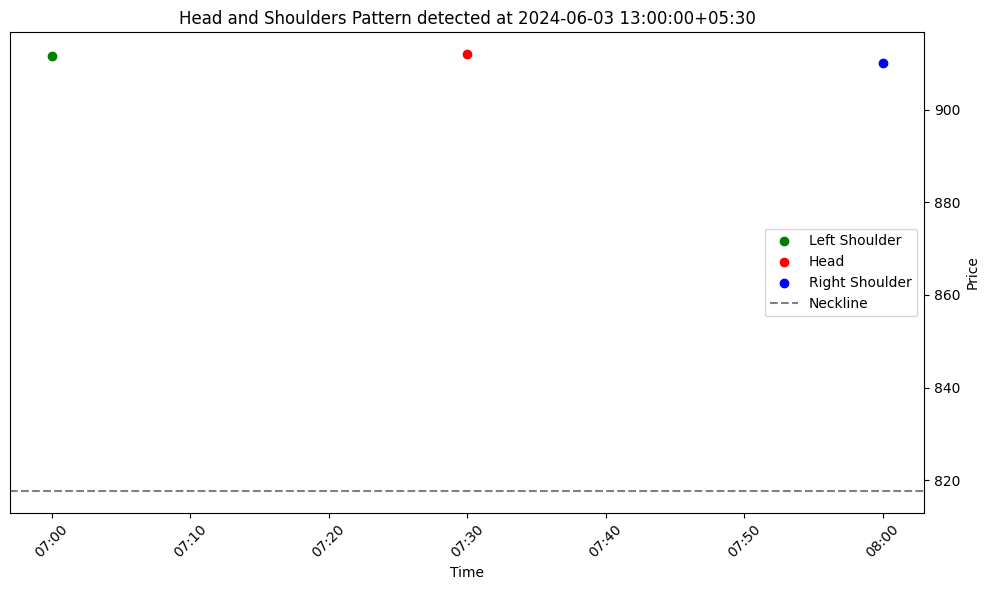

Left Shoulder: (1158, Timestamp('2024-06-04 12:30:00+0530', tz='UTC+05:30'), 788.9), Head: (1160, Timestamp('2024-06-04 13:00:00+0530', tz='UTC+05:30'), 799.3), Right Shoulder: (1162, Timestamp('2024-06-04 13:30:00+0530', tz='UTC+05:30'), 796.55), Neckline Level: 901.55
                             Open    High     Low   Close
Datetime                                                 
2024-06-04 11:15:00+05:30  798.70  805.60  785.35  790.95
2024-06-04 11:30:00+05:30  791.40  793.85  773.25  780.35
2024-06-04 11:45:00+05:30  780.85  784.00  754.45  779.75
2024-06-04 12:00:00+05:30  779.55  779.75  731.95  745.05
2024-06-04 12:15:00+05:30  745.30  772.95  742.00  772.90
2024-06-04 12:30:00+05:30  772.90  788.90  771.75  785.05
2024-06-04 12:45:00+05:30  784.55  788.75  776.45  788.50
2024-06-04 13:00:00+05:30  788.75  799.30  786.70  794.85
2024-06-04 13:15:00+05:30  795.25  795.25  776.55  780.95
2024-06-04 13:30:00+05:30  780.90  796.55  780.80  795.00
2024-06-04 13:45:00+05:30  795.00

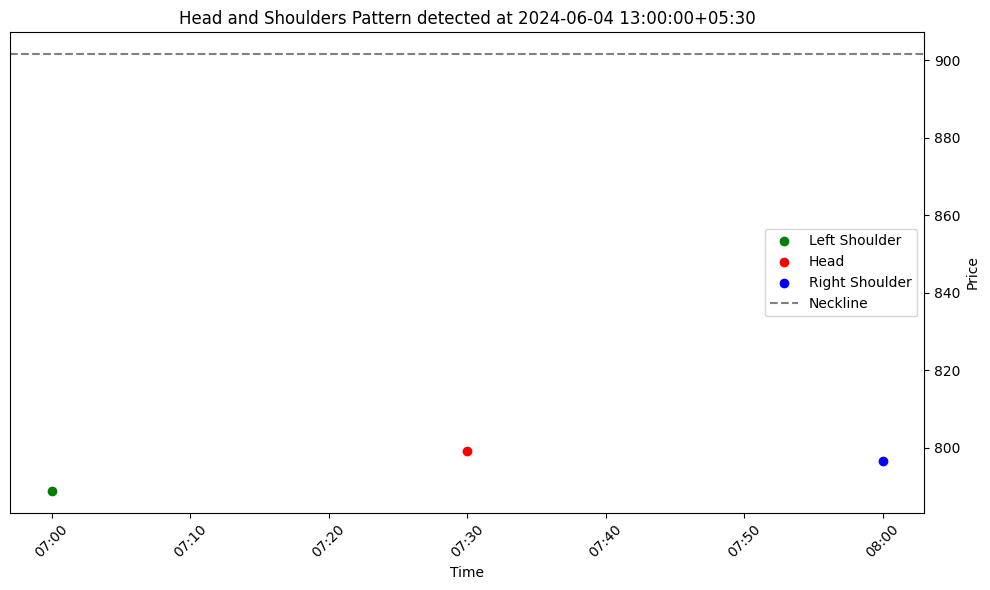

Left Shoulder: (1174, Timestamp('2024-06-05 10:00:00+0530', tz='UTC+05:30'), 764.9), Head: (1179, Timestamp('2024-06-05 11:15:00+0530', tz='UTC+05:30'), 778.35), Right Shoulder: (1182, Timestamp('2024-06-05 12:00:00+0530', tz='UTC+05:30'), 772.5), Neckline Level: 754.25
                             Open    High     Low   Close
Datetime                                                 
2024-06-04 15:15:00+05:30  779.95  784.60  775.20  775.20
2024-06-05 09:00:00+05:30  790.90  795.00  744.05  766.75
2024-06-05 09:15:00+05:30  766.95  769.95  756.00  762.95
2024-06-05 09:30:00+05:30  762.60  763.45  752.95  758.00
2024-06-05 09:45:00+05:30  757.75  764.05  754.30  762.10
2024-06-05 10:00:00+05:30  762.20  764.90  751.25  751.75
2024-06-05 10:15:00+05:30  751.75  753.70  750.00  753.30
2024-06-05 10:30:00+05:30  753.60  759.40  750.40  759.40
2024-06-05 10:45:00+05:30  759.70  770.45  757.75  769.15
2024-06-05 11:00:00+05:30  768.75  778.00  765.75  777.90
2024-06-05 11:15:00+05:30  777.90

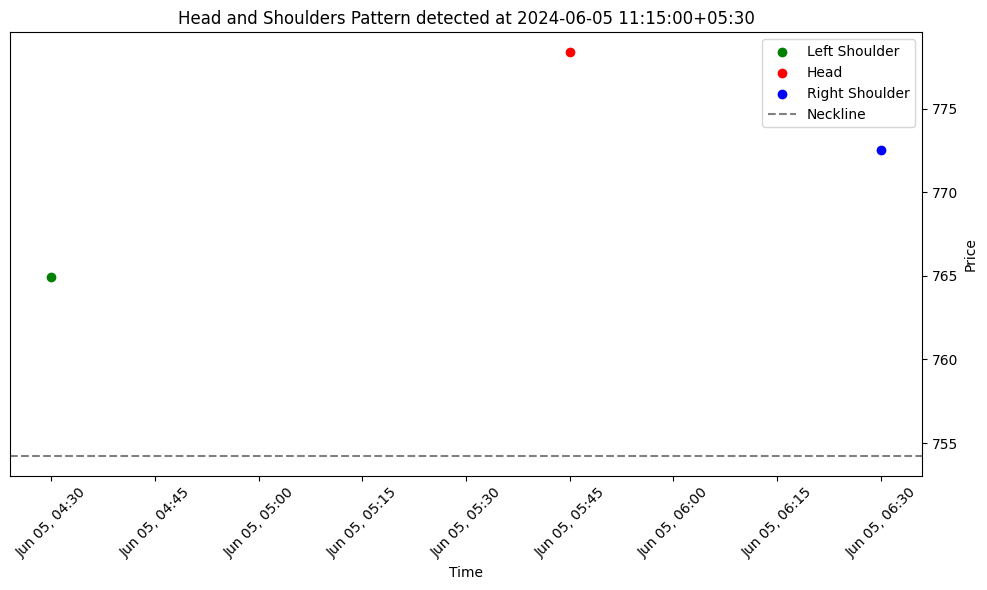

Left Shoulder: (1197, Timestamp('2024-06-06 09:15:00+0530', tz='UTC+05:30'), 824.0), Head: (1201, Timestamp('2024-06-06 10:15:00+0530', tz='UTC+05:30'), 833.35), Right Shoulder: (1214, Timestamp('2024-06-06 13:30:00+0530', tz='UTC+05:30'), 822.5), Neckline Level: 751.475
                             Open    High     Low   Close
Datetime                                                 
2024-06-05 14:30:00+05:30  790.90  791.90  782.60  786.40
2024-06-05 14:45:00+05:30  786.30  792.45  785.95  789.70
2024-06-05 15:00:00+05:30  789.70  790.30  787.00  787.10
2024-06-05 15:15:00+05:30  787.25  789.75  785.80  789.75
2024-06-06 09:00:00+05:30  798.00  817.70  796.00  815.20
2024-06-06 09:15:00+05:30  815.35  824.00  814.40  819.45
2024-06-06 09:30:00+05:30  819.50  819.70  811.75  815.70
2024-06-06 09:45:00+05:30  816.00  822.00  815.75  821.10
2024-06-06 10:00:00+05:30  821.10  830.00  820.70  829.50
2024-06-06 10:15:00+05:30  829.35  833.35  829.00  831.35
2024-06-06 10:30:00+05:30  831.0

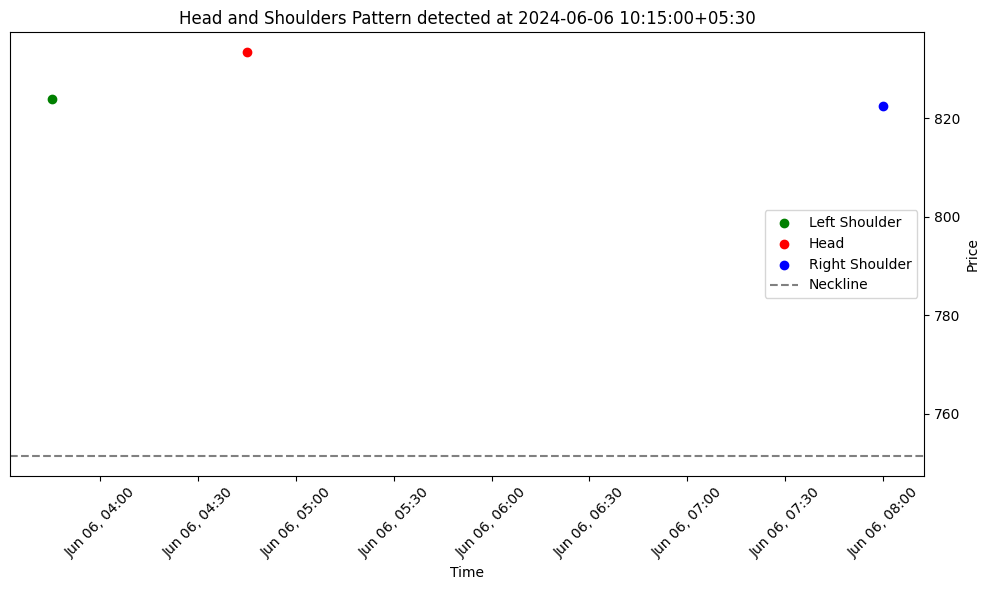

Left Shoulder: (1219, Timestamp('2024-06-06 14:45:00+0530', tz='UTC+05:30'), 819.0), Head: (1222, Timestamp('2024-06-07 09:00:00+0530', tz='UTC+05:30'), 826.0), Right Shoulder: (1225, Timestamp('2024-06-07 09:45:00+0530', tz='UTC+05:30'), 820.5), Neckline Level: 769.85
                             Open    High     Low   Close
Datetime                                                 
2024-06-06 13:30:00+05:30  820.65  822.50  817.20  819.65
2024-06-06 13:45:00+05:30  819.80  821.65  817.10  817.95
2024-06-06 14:00:00+05:30  818.20  818.40  814.40  815.05
2024-06-06 14:15:00+05:30  815.00  816.30  811.90  813.95
2024-06-06 14:30:00+05:30  813.75  816.95  813.75  815.95
2024-06-06 14:45:00+05:30  816.00  819.00  815.70  817.40
2024-06-06 15:00:00+05:30  817.45  817.85  814.20  817.70
2024-06-06 15:15:00+05:30  817.55  817.70  816.30  816.95
2024-06-07 09:00:00+05:30  819.90  826.00  810.50  816.50
2024-06-07 09:15:00+05:30  816.50  818.55  815.75  817.80
2024-06-07 09:30:00+05:30  817.80 

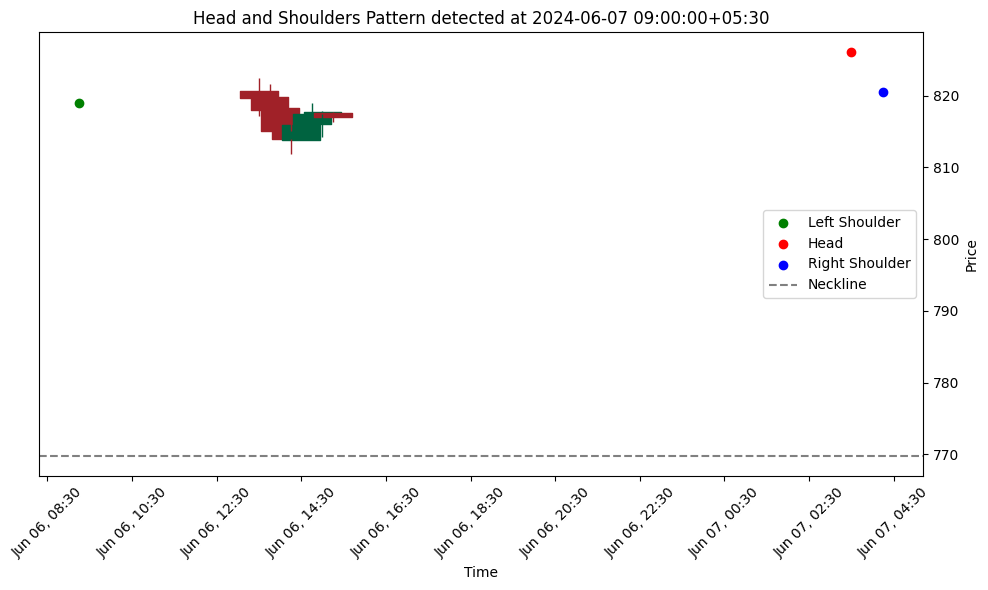

Left Shoulder: (1232, Timestamp('2024-06-07 11:30:00+0530', tz='UTC+05:30'), 826.0), Head: (1236, Timestamp('2024-06-07 12:30:00+0530', tz='UTC+05:30'), 827.0), Right Shoulder: (1238, Timestamp('2024-06-07 13:00:00+0530', tz='UTC+05:30'), 825.45), Neckline Level: 813.125
                             Open    High     Low   Close
Datetime                                                 
2024-06-07 10:15:00+05:30  817.95  822.50  817.05  819.90
2024-06-07 10:30:00+05:30  819.90  821.20  819.00  821.20
2024-06-07 10:45:00+05:30  821.20  823.60  820.00  821.80
2024-06-07 11:00:00+05:30  821.80  822.45  820.20  820.45
2024-06-07 11:15:00+05:30  820.70  824.40  820.05  822.95
2024-06-07 11:30:00+05:30  822.65  826.00  822.05  823.65
2024-06-07 11:45:00+05:30  823.65  824.50  822.40  823.20
2024-06-07 12:00:00+05:30  823.25  823.35  820.40  822.65
2024-06-07 12:15:00+05:30  822.40  824.95  822.00  824.75
2024-06-07 12:30:00+05:30  824.80  827.00  824.00  824.25
2024-06-07 12:45:00+05:30  824.5

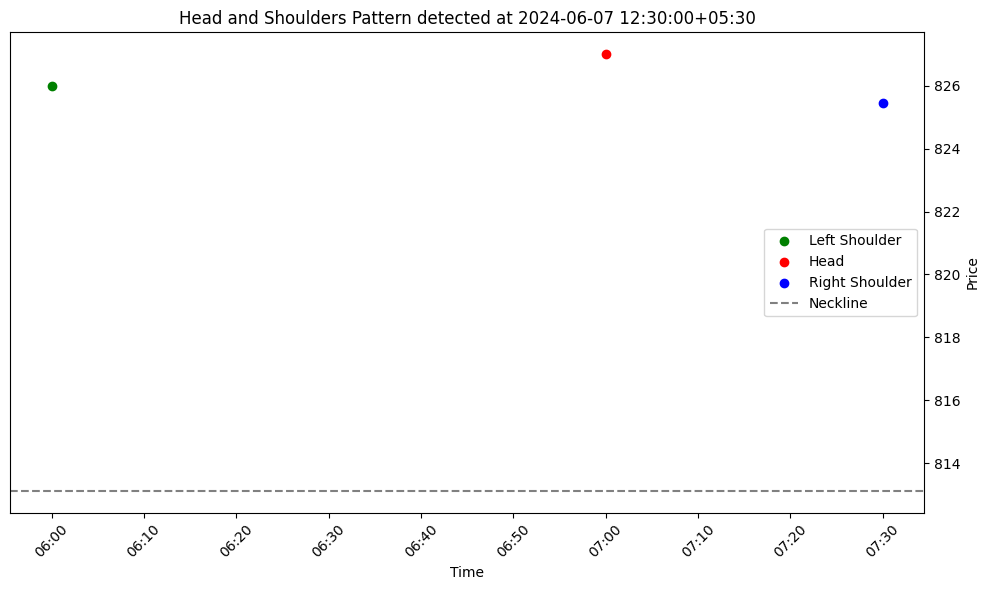

Left Shoulder: (1262, Timestamp('2024-06-10 12:30:00+0530', tz='UTC+05:30'), 838.0), Head: (1266, Timestamp('2024-06-10 13:30:00+0530', tz='UTC+05:30'), 838.8), Right Shoulder: (1274, Timestamp('2024-06-11 09:00:00+0530', tz='UTC+05:30'), 836.8), Neckline Level: 827.125
                             Open    High     Low   Close
Datetime                                                 
2024-06-10 11:15:00+05:30  837.70  838.50  835.65  836.20
2024-06-10 11:30:00+05:30  836.05  837.50  835.60  836.20
2024-06-10 11:45:00+05:30  836.10  836.50  833.60  834.00
2024-06-10 12:00:00+05:30  833.90  835.20  833.55  834.30
2024-06-10 12:15:00+05:30  834.35  836.50  834.05  836.35
2024-06-10 12:30:00+05:30  836.35  838.00  836.00  836.45
2024-06-10 12:45:00+05:30  836.40  837.30  835.55  835.75
2024-06-10 13:00:00+05:30  835.60  837.40  835.20  837.15
2024-06-10 13:15:00+05:30  836.90  838.40  836.30  838.05
2024-06-10 13:30:00+05:30  837.80  838.80  836.75  838.40
2024-06-10 13:45:00+05:30  838.35

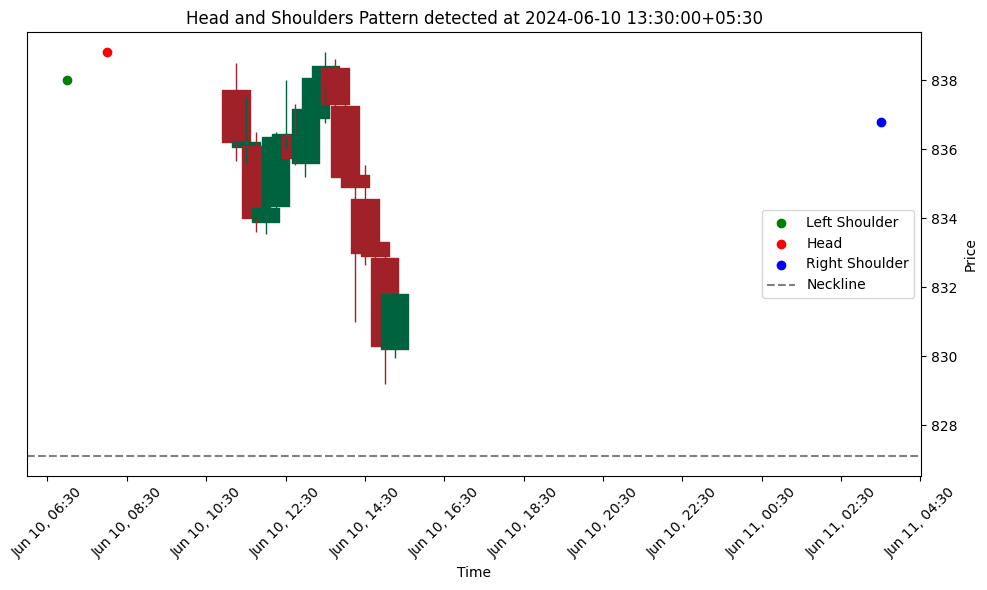

Left Shoulder: (1277, Timestamp('2024-06-11 09:45:00+0530', tz='UTC+05:30'), 837.3), Head: (1279, Timestamp('2024-06-11 10:15:00+0530', tz='UTC+05:30'), 837.55), Right Shoulder: (1282, Timestamp('2024-06-11 11:00:00+0530', tz='UTC+05:30'), 836.5), Neckline Level: 834.275
                             Open    High     Low   Close
Datetime                                                 
2024-06-10 15:00:00+05:30  832.85  833.05  829.20  830.30
2024-06-10 15:15:00+05:30  830.20  831.80  829.95  831.80
2024-06-11 09:00:00+05:30  834.30  836.80  829.05  833.85
2024-06-11 09:15:00+05:30  833.95  834.80  830.00  831.60
2024-06-11 09:30:00+05:30  831.70  835.00  831.45  833.20
2024-06-11 09:45:00+05:30  833.35  837.30  832.50  835.50
2024-06-11 10:00:00+05:30  835.50  836.00  834.20  835.80
2024-06-11 10:15:00+05:30  835.60  837.55  834.00  836.00
2024-06-11 10:30:00+05:30  836.00  836.60  835.10  835.40
2024-06-11 10:45:00+05:30  835.40  835.90  834.25  835.30
2024-06-11 11:00:00+05:30  835.6

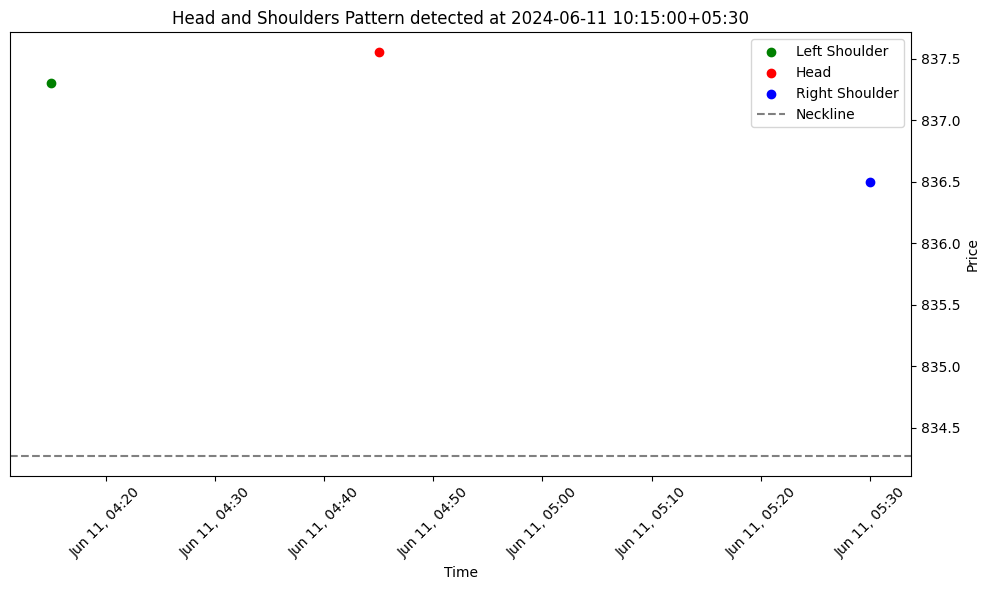

Left Shoulder: (1285, Timestamp('2024-06-11 11:45:00+0530', tz='UTC+05:30'), 836.55), Head: (1288, Timestamp('2024-06-11 12:30:00+0530', tz='UTC+05:30'), 839.6), Right Shoulder: (1292, Timestamp('2024-06-11 13:30:00+0530', tz='UTC+05:30'), 838.6), Neckline Level: 830.1
                             Open    High     Low   Close
Datetime                                                 
2024-06-11 10:30:00+05:30  836.00  836.60  835.10  835.40
2024-06-11 10:45:00+05:30  835.40  835.90  834.25  835.30
2024-06-11 11:00:00+05:30  835.65  836.50  835.00  836.00
2024-06-11 11:15:00+05:30  836.00  836.20  834.90  835.70
2024-06-11 11:30:00+05:30  835.70  836.15  834.70  834.80
2024-06-11 11:45:00+05:30  834.65  836.55  834.50  836.10
2024-06-11 12:00:00+05:30  836.30  836.50  835.00  835.45
2024-06-11 12:15:00+05:30  835.50  836.35  834.50  836.35
2024-06-11 12:30:00+05:30  836.35  839.60  835.10  837.35
2024-06-11 12:45:00+05:30  837.25  838.80  837.05  837.15
2024-06-11 13:00:00+05:30  837.15 

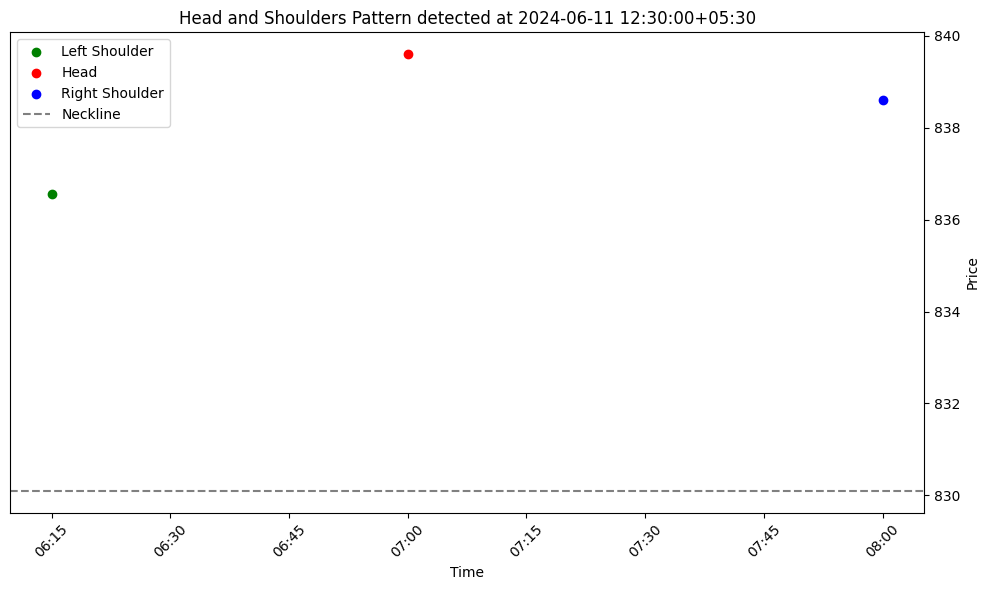

Left Shoulder: (1303, Timestamp('2024-06-12 09:45:00+0530', tz='UTC+05:30'), 842.0), Head: (1307, Timestamp('2024-06-12 10:45:00+0530', tz='UTC+05:30'), 845.55), Right Shoulder: (1310, Timestamp('2024-06-12 11:30:00+0530', tz='UTC+05:30'), 843.4), Neckline Level: 834.5
                             Open    High     Low   Close
Datetime                                                 
2024-06-11 15:00:00+05:30  836.05  836.40  834.30  834.85
2024-06-11 15:15:00+05:30  835.15  835.55  834.70  835.55
2024-06-12 09:00:00+05:30  837.10  837.45  833.00  834.65
2024-06-12 09:15:00+05:30  834.65  838.00  834.00  837.80
2024-06-12 09:30:00+05:30  837.70  839.30  836.35  839.30
2024-06-12 09:45:00+05:30  839.25  842.00  839.00  841.00
2024-06-12 10:00:00+05:30  841.40  841.50  839.00  840.45
2024-06-12 10:15:00+05:30  840.45  843.00  839.50  842.75
2024-06-12 10:30:00+05:30  842.75  844.95  842.20  844.45
2024-06-12 10:45:00+05:30  844.40  845.55  843.40  845.30
2024-06-12 11:00:00+05:30  845.30 

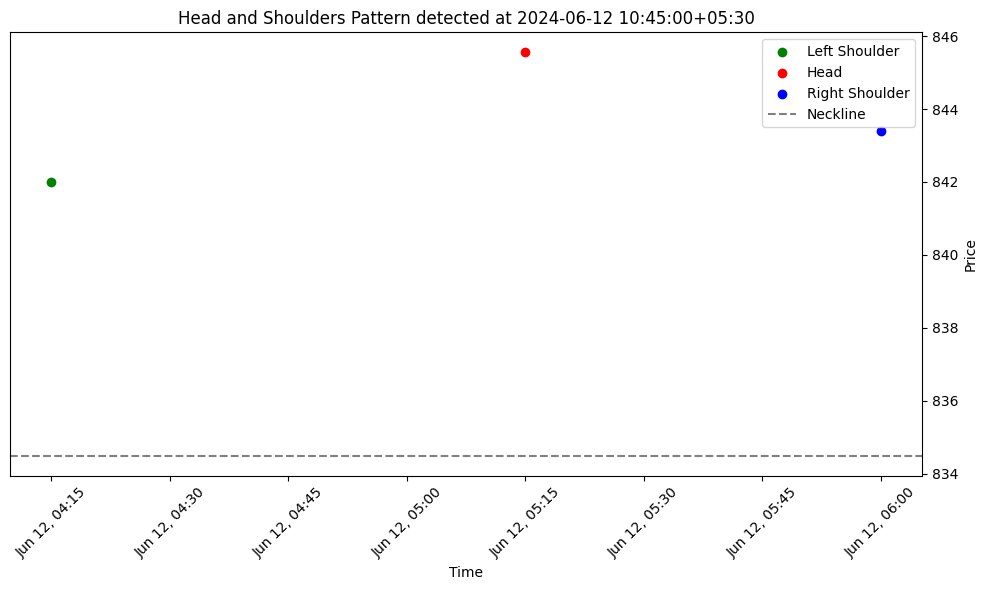

Left Shoulder: (1310, Timestamp('2024-06-12 11:30:00+0530', tz='UTC+05:30'), 843.4), Head: (1312, Timestamp('2024-06-12 12:00:00+0530', tz='UTC+05:30'), 843.6), Right Shoulder: (1315, Timestamp('2024-06-12 12:45:00+0530', tz='UTC+05:30'), 842.2), Neckline Level: 834.925
                             Open    High     Low   Close
Datetime                                                 
2024-06-12 10:15:00+05:30  840.45  843.00  839.50  842.75
2024-06-12 10:30:00+05:30  842.75  844.95  842.20  844.45
2024-06-12 10:45:00+05:30  844.40  845.55  843.40  845.30
2024-06-12 11:00:00+05:30  845.30  845.35  841.50  842.05
2024-06-12 11:15:00+05:30  841.90  842.80  841.00  842.10
2024-06-12 11:30:00+05:30  842.15  843.40  841.50  842.50
2024-06-12 11:45:00+05:30  842.30  842.50  840.70  840.95
2024-06-12 12:00:00+05:30  841.35  843.60  841.00  842.95
2024-06-12 12:15:00+05:30  842.80  843.25  841.45  841.60
2024-06-12 12:30:00+05:30  841.50  842.00  840.00  840.60
2024-06-12 12:45:00+05:30  840.60

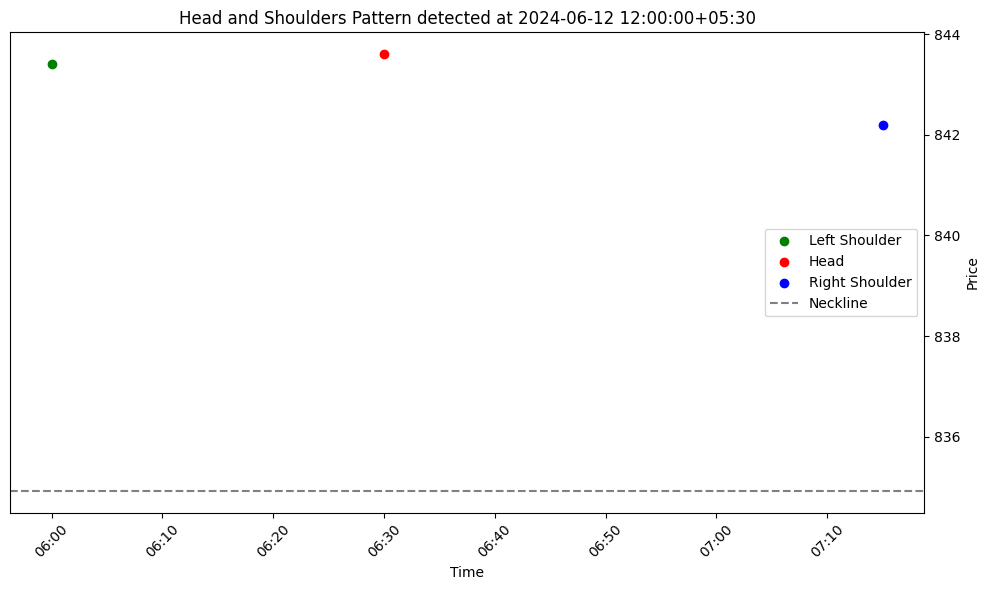

Left Shoulder: (1315, Timestamp('2024-06-12 12:45:00+0530', tz='UTC+05:30'), 842.2), Head: (1317, Timestamp('2024-06-12 13:15:00+0530', tz='UTC+05:30'), 842.45), Right Shoulder: (1322, Timestamp('2024-06-12 14:30:00+0530', tz='UTC+05:30'), 841.0), Neckline Level: 832.85
                             Open    High     Low   Close
Datetime                                                 
2024-06-12 11:30:00+05:30  842.15  843.40  841.50  842.50
2024-06-12 11:45:00+05:30  842.30  842.50  840.70  840.95
2024-06-12 12:00:00+05:30  841.35  843.60  841.00  842.95
2024-06-12 12:15:00+05:30  842.80  843.25  841.45  841.60
2024-06-12 12:30:00+05:30  841.50  842.00  840.00  840.60
2024-06-12 12:45:00+05:30  840.60  842.20  840.60  841.90
2024-06-12 13:00:00+05:30  841.70  841.95  840.50  841.40
2024-06-12 13:15:00+05:30  841.40  842.45  841.25  841.40
2024-06-12 13:30:00+05:30  841.25  841.70  839.50  840.50
2024-06-12 13:45:00+05:30  840.60  840.95  838.55  839.45
2024-06-12 14:00:00+05:30  839.45

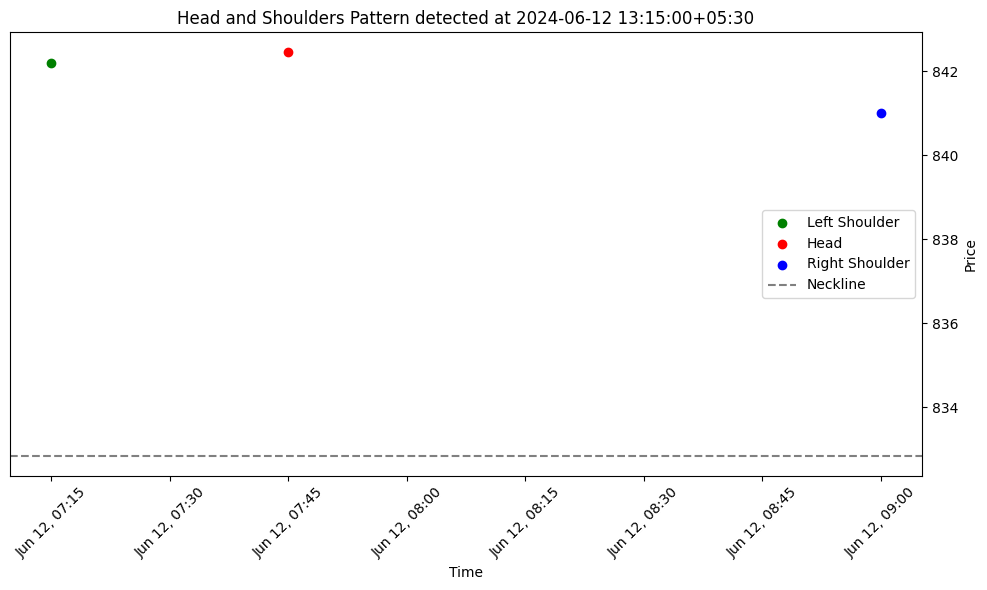

Left Shoulder: (1324, Timestamp('2024-06-12 15:00:00+0530', tz='UTC+05:30'), 840.0), Head: (1326, Timestamp('2024-06-13 09:00:00+0530', tz='UTC+05:30'), 845.0), Right Shoulder: (1329, Timestamp('2024-06-13 09:45:00+0530', tz='UTC+05:30'), 843.6), Neckline Level: 840.35
                             Open    High     Low   Close
Datetime                                                 
2024-06-12 13:45:00+05:30  840.60  840.95  838.55  839.45
2024-06-12 14:00:00+05:30  839.45  840.85  839.00  839.65
2024-06-12 14:15:00+05:30  839.65  840.50  838.80  839.95
2024-06-12 14:30:00+05:30  839.80  841.00  839.20  839.60
2024-06-12 14:45:00+05:30  839.80  839.90  838.10  838.90
2024-06-12 15:00:00+05:30  839.10  840.00  838.15  838.90
2024-06-12 15:15:00+05:30  839.00  839.10  838.50  839.10
2024-06-13 09:00:00+05:30  844.15  845.00  841.15  843.00
2024-06-13 09:15:00+05:30  842.85  842.95  840.50  841.35
2024-06-13 09:30:00+05:30  841.15  841.85  839.50  841.55
2024-06-13 09:45:00+05:30  841.55 

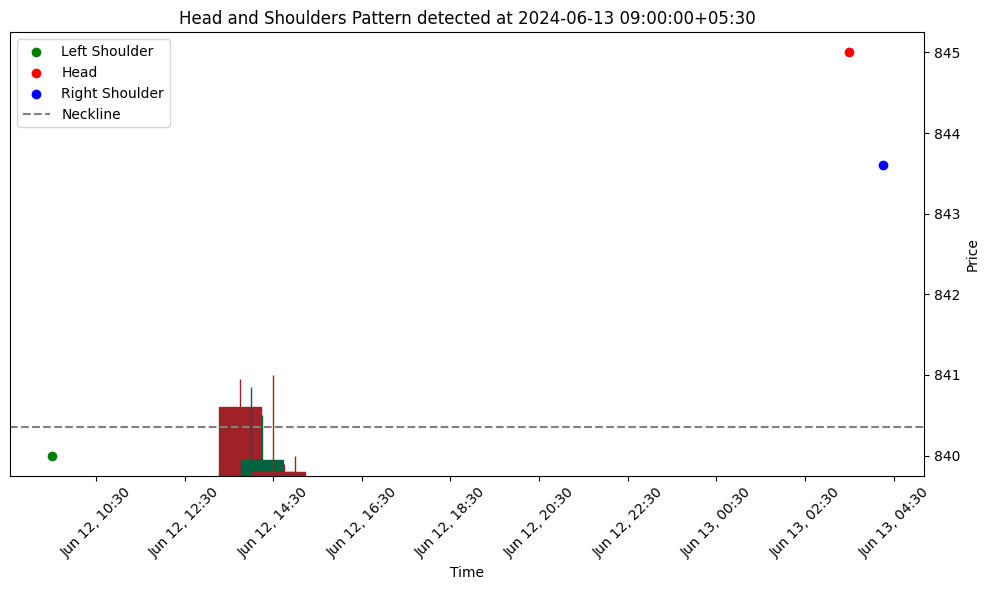

Left Shoulder: (1332, Timestamp('2024-06-13 10:30:00+0530', tz='UTC+05:30'), 842.25), Head: (1337, Timestamp('2024-06-13 11:45:00+0530', tz='UTC+05:30'), 844.5), Right Shoulder: (1339, Timestamp('2024-06-13 12:15:00+0530', tz='UTC+05:30'), 842.95), Neckline Level: 838.675
                             Open    High     Low   Close
Datetime                                                 
2024-06-13 09:15:00+05:30  842.85  842.95  840.50  841.35
2024-06-13 09:30:00+05:30  841.15  841.85  839.50  841.55
2024-06-13 09:45:00+05:30  841.55  843.60  841.35  842.90
2024-06-13 10:00:00+05:30  842.75  842.90  841.30  841.60
2024-06-13 10:15:00+05:30  841.60  841.80  840.95  841.30
2024-06-13 10:30:00+05:30  841.30  842.25  840.50  840.60
2024-06-13 10:45:00+05:30  840.75  841.50  840.00  840.60
2024-06-13 11:00:00+05:30  840.55  840.70  836.10  840.00
2024-06-13 11:15:00+05:30  840.05  842.20  840.00  840.75
2024-06-13 11:30:00+05:30  840.75  844.00  840.50  844.00
2024-06-13 11:45:00+05:30  843.

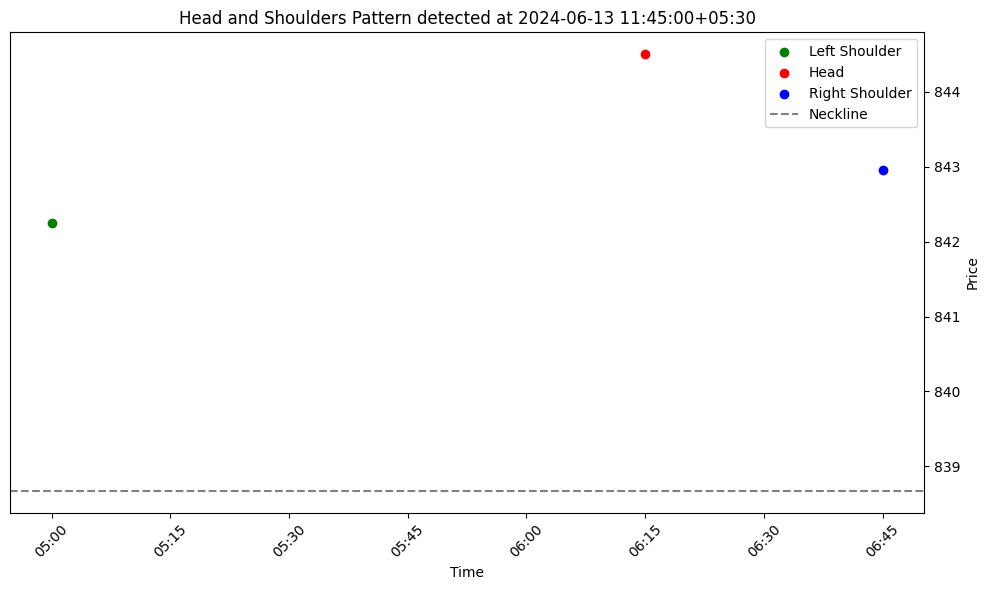

Left Shoulder: (1350, Timestamp('2024-06-13 15:00:00+0530', tz='UTC+05:30'), 845.9), Head: (1352, Timestamp('2024-06-14 09:00:00+0530', tz='UTC+05:30'), 849.9), Right Shoulder: (1355, Timestamp('2024-06-14 09:45:00+0530', tz='UTC+05:30'), 845.8), Neckline Level: 841.25
                             Open    High     Low   Close
Datetime                                                 
2024-06-13 13:45:00+05:30  840.65  841.25  840.00  840.70
2024-06-13 14:00:00+05:30  840.40  840.85  839.10  840.40
2024-06-13 14:15:00+05:30  840.05  840.65  839.35  840.45
2024-06-13 14:30:00+05:30  840.15  841.30  839.80  840.70
2024-06-13 14:45:00+05:30  840.60  844.90  840.35  844.65
2024-06-13 15:00:00+05:30  844.70  845.90  844.10  844.65
2024-06-13 15:15:00+05:30  844.60  845.00  843.90  843.90
2024-06-14 09:00:00+05:30  845.30  849.90  841.10  842.55
2024-06-14 09:15:00+05:30  842.65  843.25  840.35  840.90
2024-06-14 09:30:00+05:30  840.60  843.20  840.05  843.05
2024-06-14 09:45:00+05:30  843.05 

KeyboardInterrupt: 

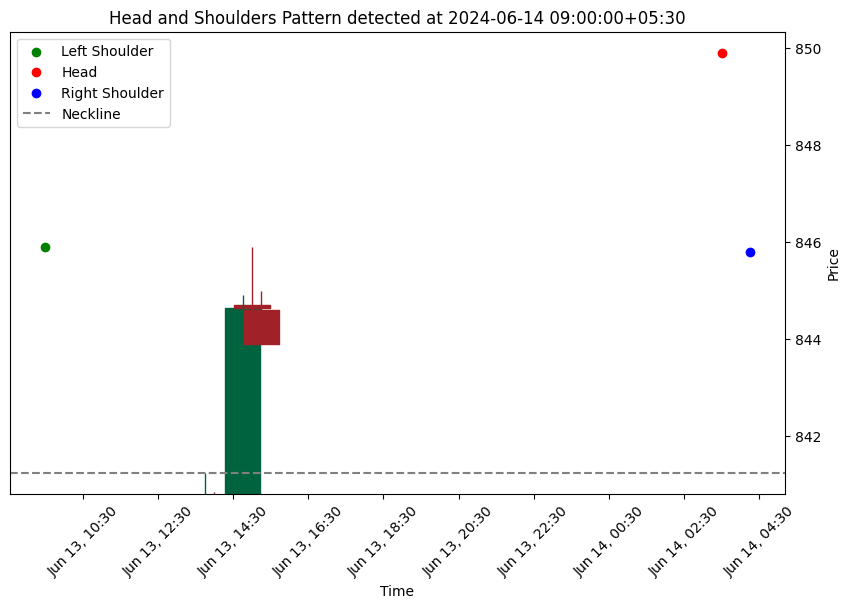

In [8]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import mplfinance as mpf

# Load your 1-minute OHLC data
file_path = r"D:\AlgoT\stock-pattern-main\stock-pattern-main\banknifty data\sbin.csv"
data = pd.read_csv(file_path)

# Ensure your data has columns: 'Datetime', 'Open', 'High', 'Low', 'Close', 'Ignore'
data['Datetime'] = pd.to_datetime(data['Datetime'])

# Resample to 15-minute intervals
data.set_index('Datetime', inplace=True)
data_15min = data.resample('15T').agg({
    'Open': 'first',
    'High': 'max',
    'Low': 'min',
    'Close': 'last'
}).dropna()

# Verify the resampled data
print(data_15min.head())

def find_peaks_and_troughs(data):
    peaks = []
    troughs = []
    for i in range(1, len(data) - 1):
        if data['High'][i] > data['High'][i-1] and data['High'][i] > data['High'][i+1]:
            peaks.append((i, data.index[i], data['High'][i]))
        if data['Low'][i] < data['Low'][i-1] and data['Low'][i] < data['Low'][i+1]:
            troughs.append((i, data.index[i], data['Low'][i]))
    return peaks, troughs

def detect_head_and_shoulders(peaks, troughs):
    patterns = []
    for i in range(1, len(peaks) - 1):
        left_shoulder = peaks[i-1]
        head = peaks[i]
        right_shoulder = peaks[i+1]
        if left_shoulder[2] < head[2] and right_shoulder[2] < head[2] and \
           abs(left_shoulder[2] - right_shoulder[2]) < 0.01 * head[2]:  # Adjust tolerance as needed
            neckline_level = (troughs[i-1][2] + troughs[i][2]) / 2
            patterns.append({
                'left_shoulder': left_shoulder,
                'head': head,
                'right_shoulder': right_shoulder,
                'neckline_level': neckline_level
            })
    return patterns

# Find peaks and troughs in 15-minute data
peaks, troughs = find_peaks_and_troughs(data_15min)

# Detect Head and Shoulders patterns in 15-minute data
patterns = detect_head_and_shoulders(peaks, troughs)

# Verify the detected patterns
print(patterns)

# Display detected patterns and plot the chart
for pattern in patterns:
    print(f"Left Shoulder: {pattern['left_shoulder']}, Head: {pattern['head']}, Right Shoulder: {pattern['right_shoulder']}, Neckline Level: {pattern['neckline_level']}")
    
    start_index = max(0, pattern['left_shoulder'][0] - 5)
    end_index = min(len(data_15min) - 1, pattern['right_shoulder'][0] + 5)
    pattern_data = data_15min.iloc[start_index:end_index]
    
    # Verify the pattern data
    print(pattern_data)
    
    # Plot the candlestick chart
    fig, ax = plt.subplots(figsize=(10, 6))
    mpf.plot(pattern_data, type='candle', ax=ax, style='charles', show_nontrading=True)
    
    # Annotate the chart with pattern points
    ax.scatter(pattern['left_shoulder'][1], pattern['left_shoulder'][2], color='green', label='Left Shoulder', marker='o')
    ax.scatter(pattern['head'][1], pattern['head'][2], color='red', label='Head', marker='o')
    ax.scatter(pattern['right_shoulder'][1], pattern['right_shoulder'][2], color='blue', label='Right Shoulder', marker='o')
    ax.axhline(y=pattern['neckline_level'], color='gray', linestyle='--', label='Neckline')
    ax.set_xlabel('Time')
    ax.set_ylabel('Price')
    ax.legend()
    ax.set_title(f"Head and Shoulders Pattern detected at {pattern['head'][1]}")
    plt.xticks(rotation=45)
    plt.tight_layout()
    plt.show()



In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

file_path = r"D:\AlgoT\stock-pattern-main\stock-pattern-main\banknifty data\sbin.csv"
data = pd.read_csv(file_path)
# Ensure your data has columns: 'Datetime', 'Open', 'High', 'Low', 'Close', 'Ignore'
data['Datetime'] = pd.to_datetime(data['Datetime'])

# Resample to 15-minute intervals
data.set_index('Datetime', inplace=True)
data_15min = data.resample('15T').agg({
    'Open': 'first',
    'High': 'max',
    'Low': 'min',
    'Close': 'last'
}).dropna()

def find_peaks_and_troughs(data):
    peaks = []
    troughs = []
    for i in range(1, len(data) - 1):
        if data['High'][i] > data['High'][i-1] and data['High'][i] > data['High'][i+1]:
            peaks.append((i, data.index[i], data['High'][i]))
        if data['Low'][i] < data['Low'][i-1] and data['Low'][i] < data['Low'][i+1]:
            troughs.append((i, data.index[i], data['Low'][i]))
    return peaks, troughs

def detect_head_and_shoulders(peaks, troughs):
    patterns = []
    for i in range(1, len(peaks) - 1):
        left_shoulder = peaks[i-1]
        head = peaks[i]
        right_shoulder = peaks[i+1]
        if left_shoulder[2] < head[2] and right_shoulder[2] < head[2] and \
           abs(left_shoulder[2] - right_shoulder[2]) < 0.01 * head[2]:  # Adjust tolerance as needed
            neckline_level = (troughs[i-1][2] + troughs[i][2]) / 2
            patterns.append({
                'left_shoulder': left_shoulder,
                'head': head,
                'right_shoulder': right_shoulder,
                'neckline_level': neckline_level
            })
    return patterns

# Find peaks and troughs in 15-minute data
peaks, troughs = find_peaks_and_troughs(data_15min)

# Detect Head and Shoulders patterns in 15-minute data
patterns = detect_head_and_shoulders(peaks, troughs)

# Display detected patterns and plot the chart
for pattern in patterns:
    print(f"Left Shoulder: {pattern['left_shoulder']}, Head: {pattern['head']}, Right Shoulder: {pattern['right_shoulder']}, Neckline Level: {pattern['neckline_level']}")
    
    start_index = max(0, pattern['left_shoulder'][0] - 5)
    end_index = min(len(data_15min) - 1, pattern['right_shoulder'][0] + 5)
    pattern_data = data_15min.iloc[start_index:end_index]
    
    plt.figure(figsize=(10, 6))
    plt.plot(pattern_data.index, pattern_data['Close'], label='Close Price')
    plt.scatter(pattern['left_shoulder'][1], pattern['left_shoulder'][2], color='green', label='Left Shoulder')
    plt.scatter(pattern['head'][1], pattern['head'][2], color='red', label='Head')
    plt.scatter(pattern['right_shoulder'][1], pattern['right_shoulder'][2], color='blue', label='Right Shoulder')
    plt.axhline(y=pattern['neckline_level'], color='gray', linestyle='--', label='Neckline')
    plt.xlabel('Time')
    plt.ylabel('Price')
    plt.legend()
    plt.title(f"Head and Shoulders Pattern detected at {pattern['head'][1]}")
    plt.xticks(rotation=45)
    plt.tight_layout()
    plt.show()

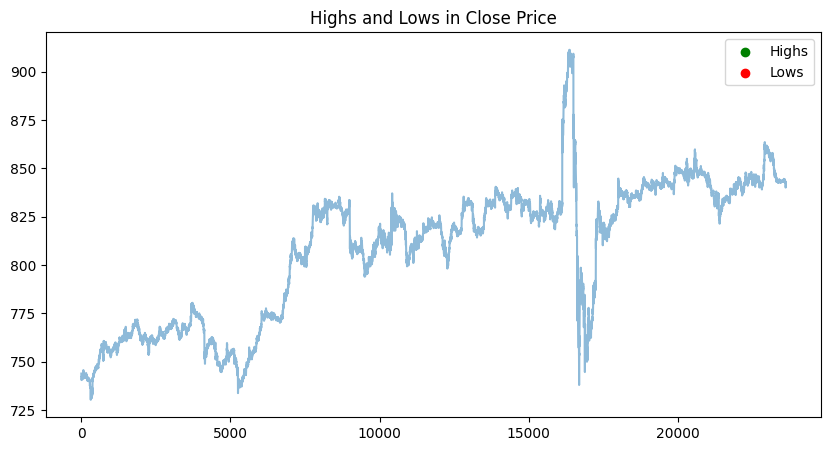

In [13]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import peakutils

# Load your data
file_path = r"D:\AlgoT\stock-pattern-main\stock-pattern-main\banknifty data\sbin.csv"
data = pd.read_csv(file_path)

# Example: Using close prices to detect peaks and troughs
close_prices = data['Close']

# Indexes of peaks
peak_indexes = peakutils.indexes(np.array(close_prices), thres=1, min_dist=50)
trough_indexes = peakutils.indexes(np.array(-close_prices), thres=1, min_dist=50)

# Plotting
plt.figure(figsize=(10, 5))
plt.plot(close_prices, alpha=0.5)
plt.scatter(peak_indexes, close_prices[peak_indexes], color='green', label='Highs')
plt.scatter(trough_indexes, close_prices[trough_indexes], color='red', label='Lows')
plt.legend()
plt.title('Highs and Lows in Close Price')
plt.show()


C:\Users\Aviral Mishra\AppData\Local\Temp\ipykernel_12708\489320741.py:12: FutureWarning: 'T' is deprecated and will be removed in a future version, please use 'min' instead.
  data_15min = data.resample('15T').agg({
C:\Users\Aviral Mishra\AppData\Local\Temp\ipykernel_12708\489320741.py:25: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  peaks = [(idx, data.index[idx], data['High'][idx]) for idx in peak_indexes]
C:\Users\Aviral Mishra\AppData\Local\Temp\ipykernel_12708\489320741.py:26: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  troughs = [(idx, data.index[idx], data['Low'][idx]) for idx in trough_indexes]


Left Shoulder: (552, Timestamp('2024-04-30 10:30:00+0530', tz='UTC+05:30'), 828.95), Head: (565, Timestamp('2024-04-30 13:45:00+0530', tz='UTC+05:30'), 834.85), Right Shoulder: (577, Timestamp('2024-05-02 10:15:00+0530', tz='UTC+05:30'), 833.9), Neckline Level: 738.325


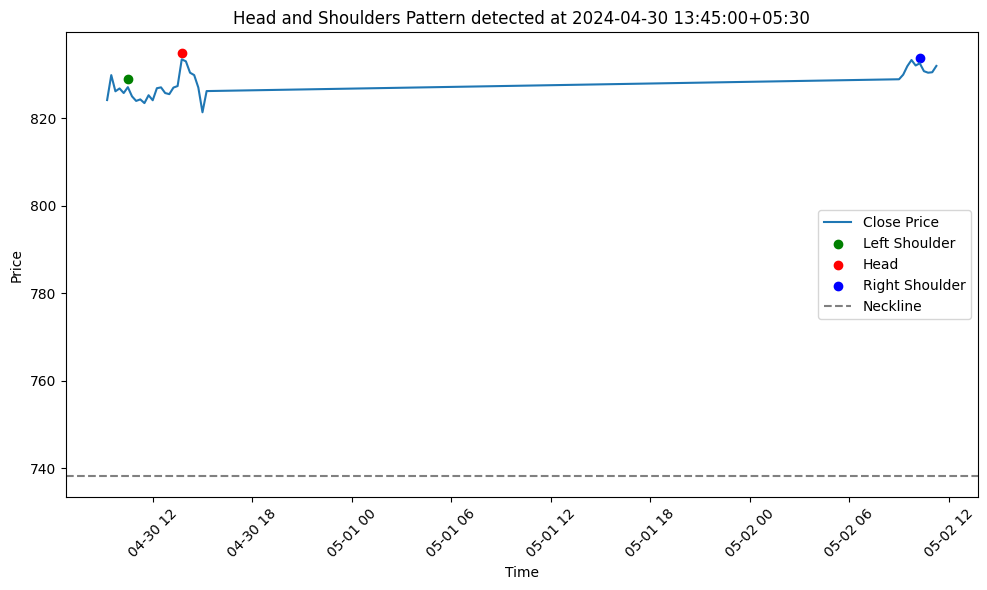

Left Shoulder: (588, Timestamp('2024-05-02 13:00:00+0530', tz='UTC+05:30'), 832.0), Head: (600, Timestamp('2024-05-03 09:30:00+0530', tz='UTC+05:30'), 835.4), Right Shoulder: (611, Timestamp('2024-05-03 12:15:00+0530', tz='UTC+05:30'), 828.2), Neckline Level: 752.725


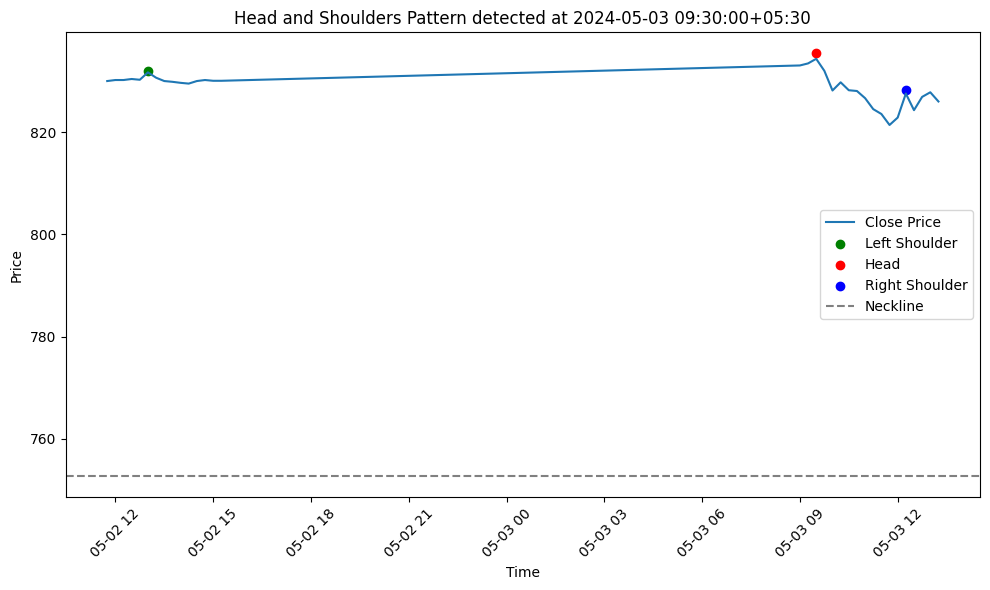

Left Shoulder: (611, Timestamp('2024-05-03 12:15:00+0530', tz='UTC+05:30'), 828.2), Head: (623, Timestamp('2024-05-03 15:15:00+0530', tz='UTC+05:30'), 831.45), Right Shoulder: (693, Timestamp('2024-05-08 13:15:00+0530', tz='UTC+05:30'), 822.0), Neckline Level: 763.775


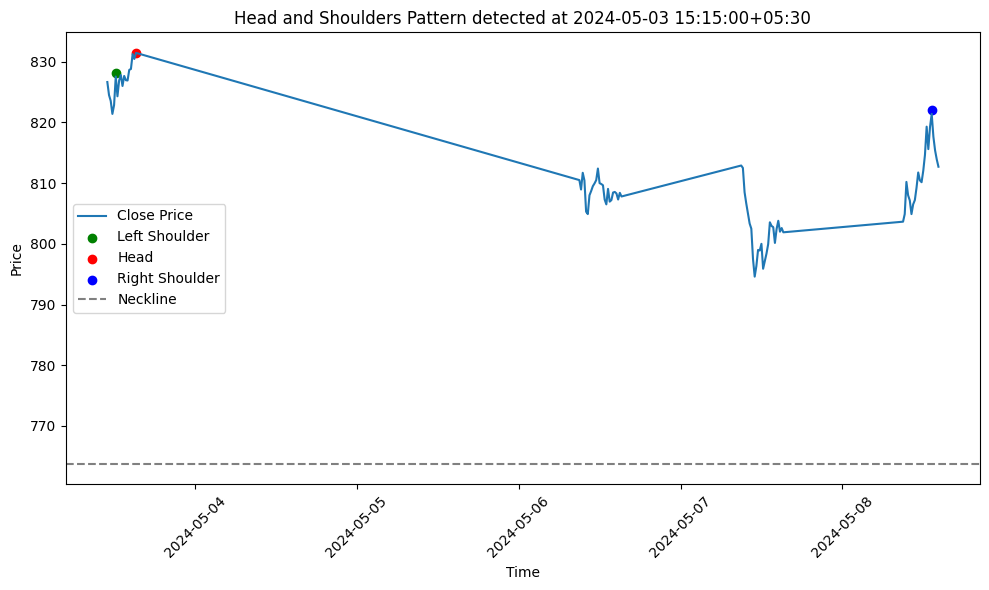

Left Shoulder: (693, Timestamp('2024-05-08 13:15:00+0530', tz='UTC+05:30'), 822.0), Head: (721, Timestamp('2024-05-09 13:45:00+0530', tz='UTC+05:30'), 839.65), Right Shoulder: (741, Timestamp('2024-05-10 12:15:00+0530', tz='UTC+05:30'), 824.95), Neckline Level: 755.35


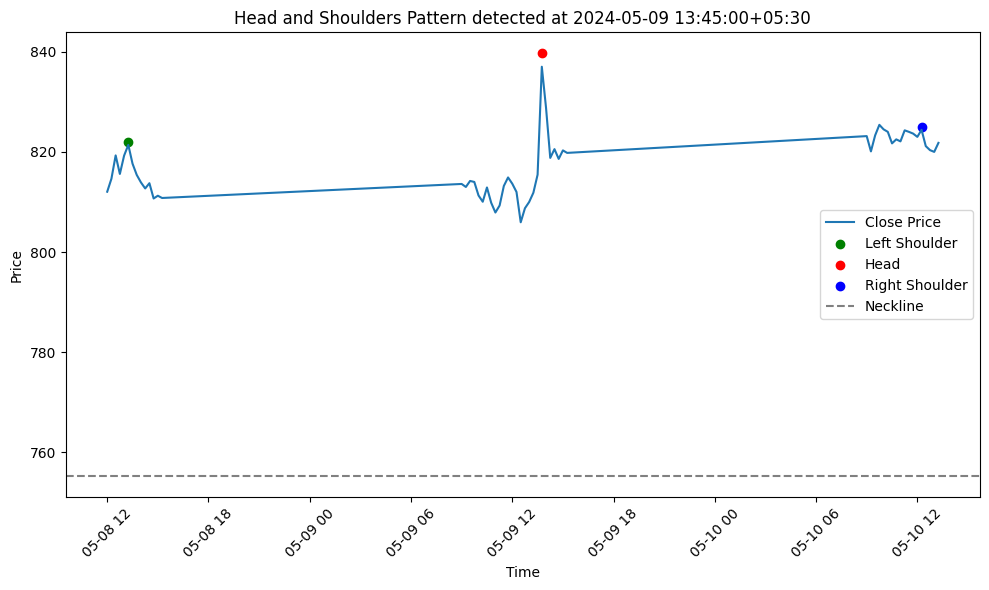

Left Shoulder: (806, Timestamp('2024-05-15 09:00:00+0530', tz='UTC+05:30'), 825.3), Head: (832, Timestamp('2024-05-16 09:00:00+0530', tz='UTC+05:30'), 826.15), Right Shoulder: (865, Timestamp('2024-05-17 10:45:00+0530', tz='UTC+05:30'), 821.65), Neckline Level: 764.775


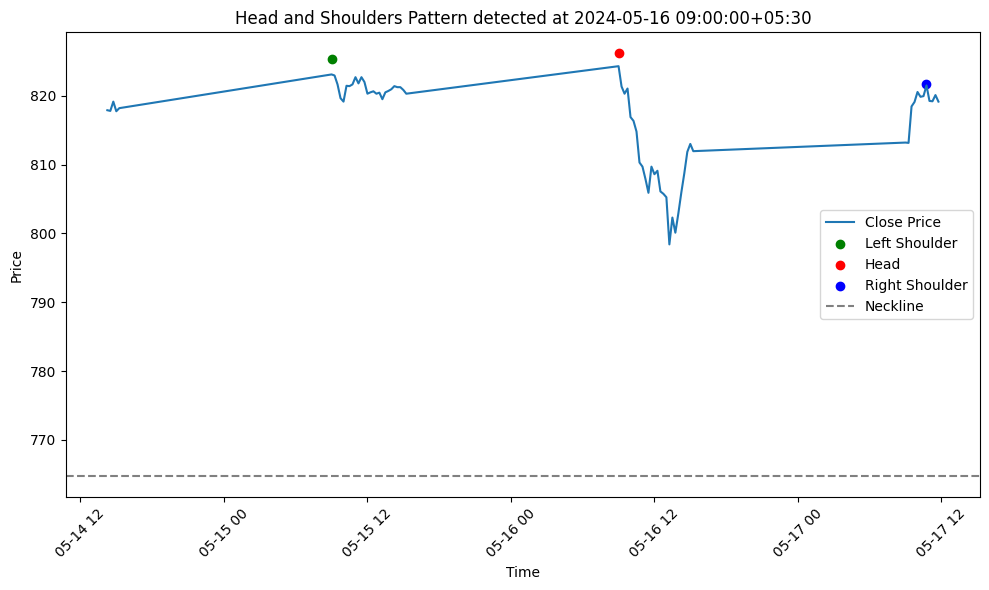

Left Shoulder: (949, Timestamp('2024-05-23 12:15:00+0530', tz='UTC+05:30'), 834.0), Head: (964, Timestamp('2024-05-24 09:30:00+0530', tz='UTC+05:30'), 840.95), Right Shoulder: (976, Timestamp('2024-05-24 12:30:00+0530', tz='UTC+05:30'), 836.4), Neckline Level: 753.925


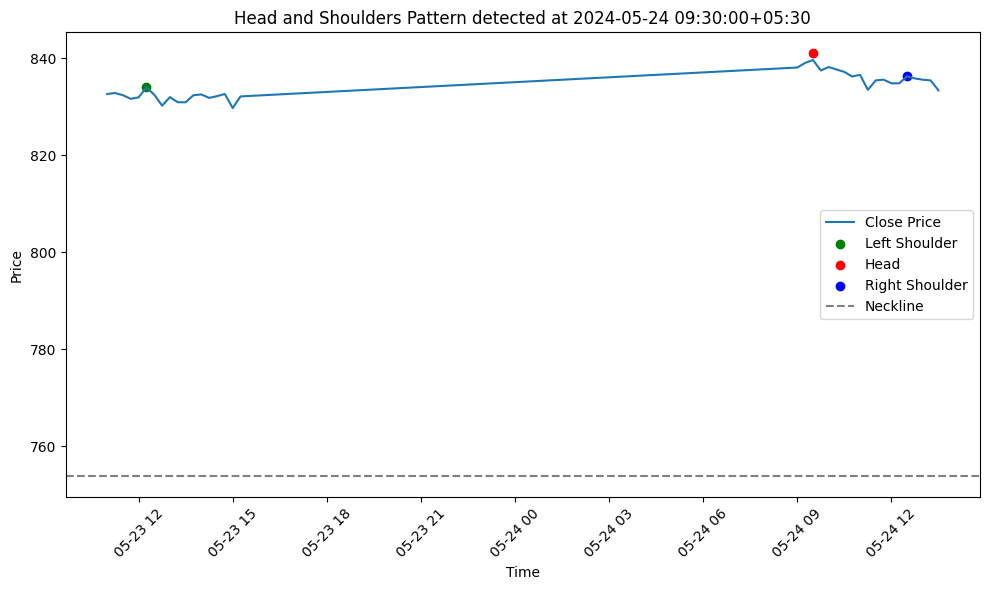

Left Shoulder: (1000, Timestamp('2024-05-27 12:00:00+0530', tz='UTC+05:30'), 838.0), Head: (1014, Timestamp('2024-05-28 09:00:00+0530', tz='UTC+05:30'), 840.7), Right Shoulder: (1030, Timestamp('2024-05-28 13:00:00+0530', tz='UTC+05:30'), 834.0), Neckline Level: 741.775


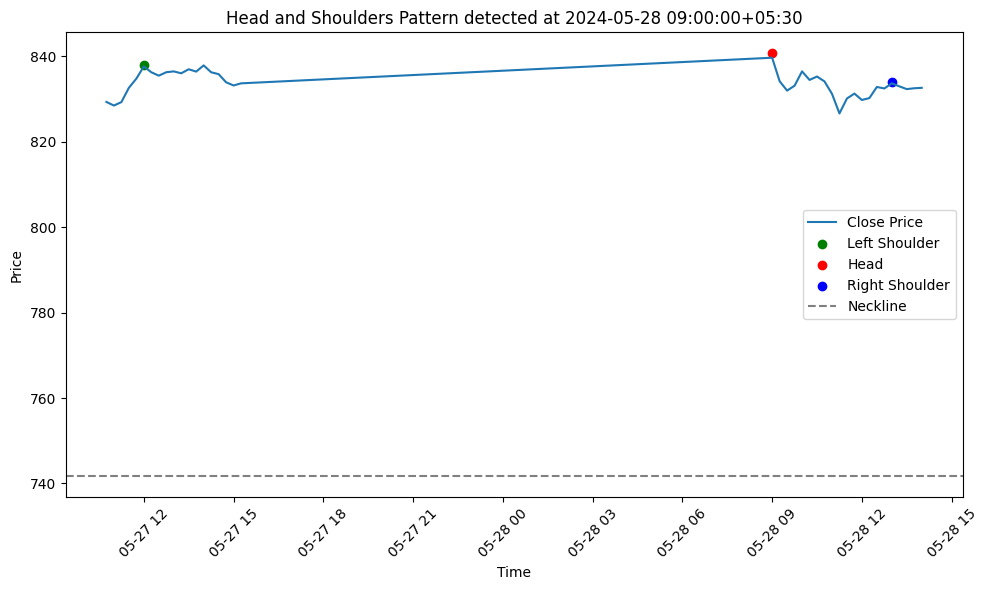

Left Shoulder: (1030, Timestamp('2024-05-28 13:00:00+0530', tz='UTC+05:30'), 834.0), Head: (1041, Timestamp('2024-05-29 09:15:00+0530', tz='UTC+05:30'), 834.45), Right Shoulder: (1055, Timestamp('2024-05-29 12:45:00+0530', tz='UTC+05:30'), 827.0), Neckline Level: 746.95


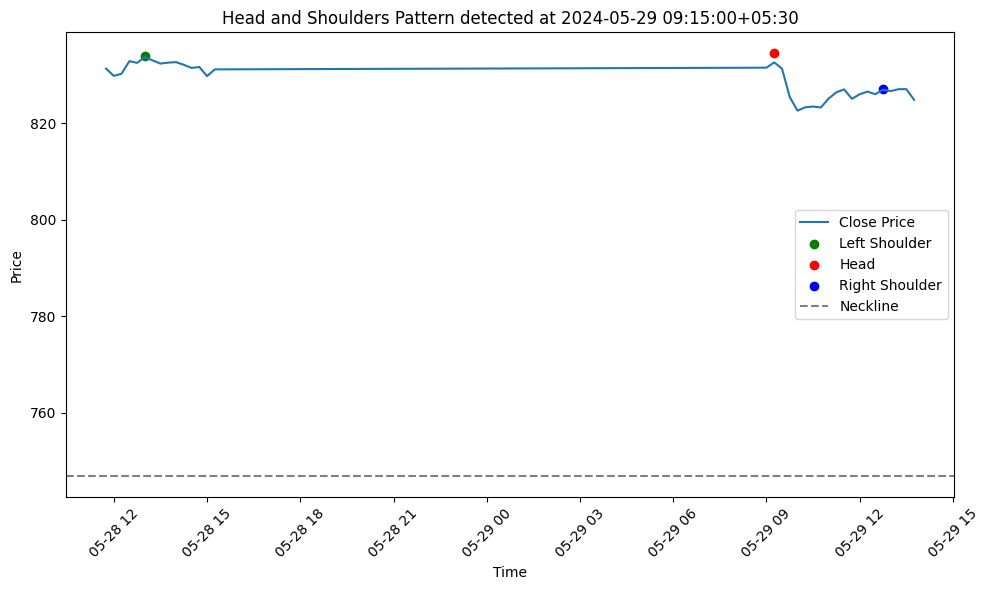

Left Shoulder: (1055, Timestamp('2024-05-29 12:45:00+0530', tz='UTC+05:30'), 827.0), Head: (1066, Timestamp('2024-05-30 09:00:00+0530', tz='UTC+05:30'), 836.0), Right Shoulder: (1083, Timestamp('2024-05-30 13:15:00+0530', tz='UTC+05:30'), 831.65), Neckline Level: 765.975


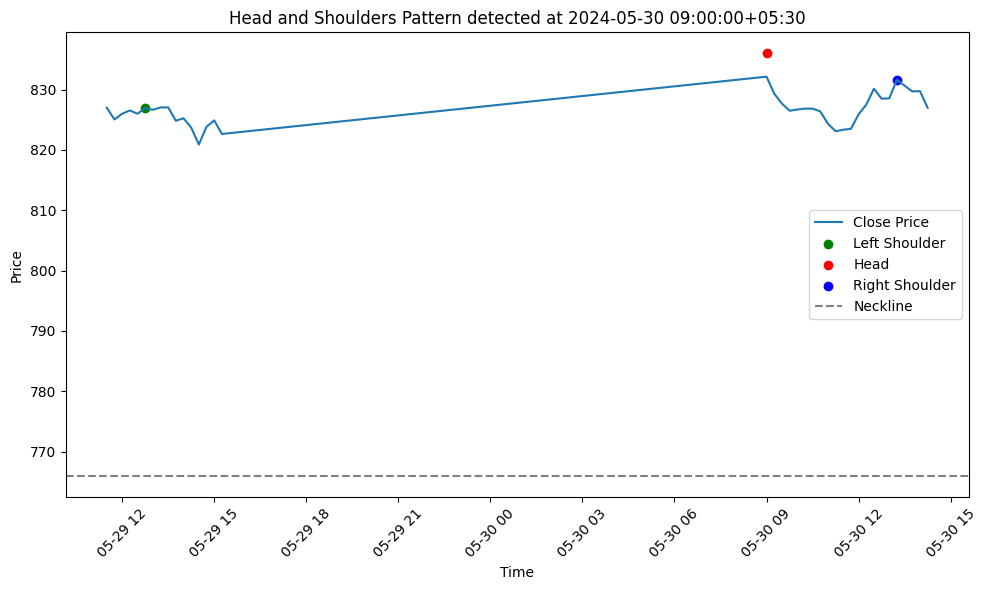

Left Shoulder: (1292, Timestamp('2024-06-11 13:30:00+0530', tz='UTC+05:30'), 838.6), Head: (1307, Timestamp('2024-06-12 10:45:00+0530', tz='UTC+05:30'), 845.55), Right Shoulder: (1321, Timestamp('2024-06-12 14:15:00+0530', tz='UTC+05:30'), 840.5), Neckline Level: 802.225


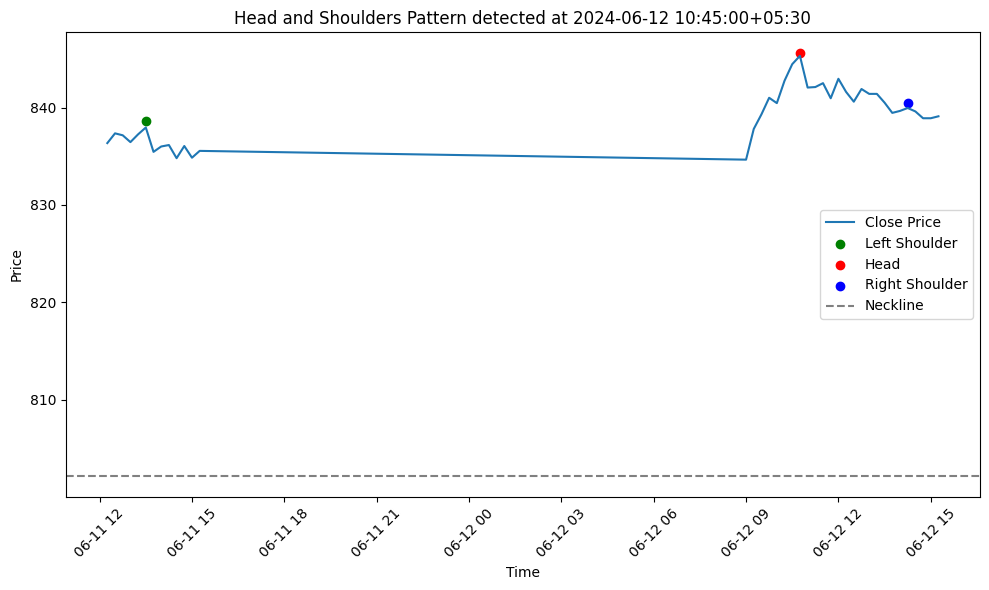

Left Shoulder: (1336, Timestamp('2024-06-13 11:30:00+0530', tz='UTC+05:30'), 844.0), Head: (1349, Timestamp('2024-06-13 14:45:00+0530', tz='UTC+05:30'), 844.9), Right Shoulder: (1361, Timestamp('2024-06-14 11:15:00+0530', tz='UTC+05:30'), 843.75), Neckline Level: 812.75


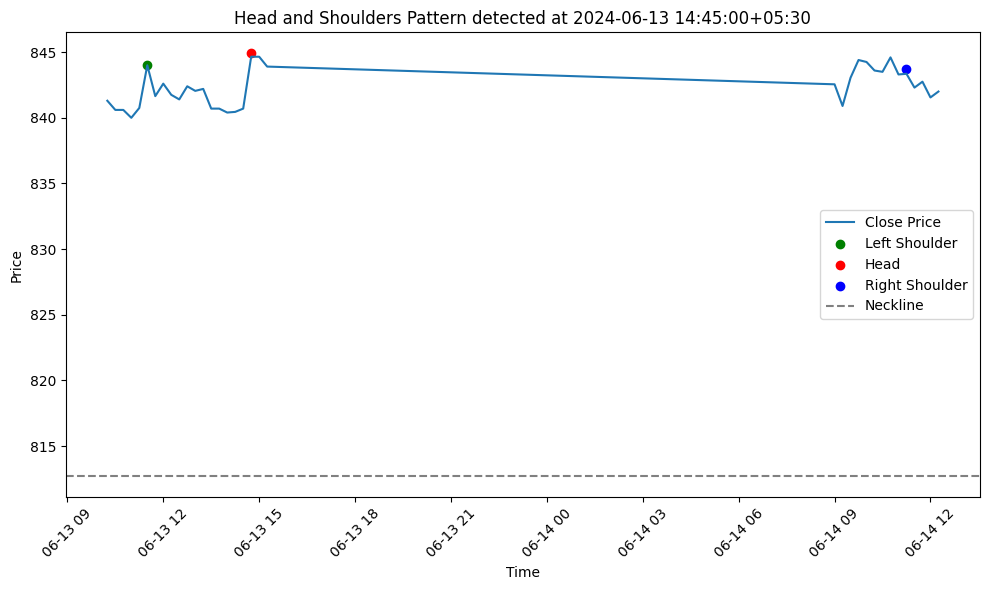

Left Shoulder: (1361, Timestamp('2024-06-14 11:15:00+0530', tz='UTC+05:30'), 843.75), Head: (1380, Timestamp('2024-06-18 09:30:00+0530', tz='UTC+05:30'), 851.0), Right Shoulder: (1394, Timestamp('2024-06-18 13:00:00+0530', tz='UTC+05:30'), 848.75), Neckline Level: 809.525


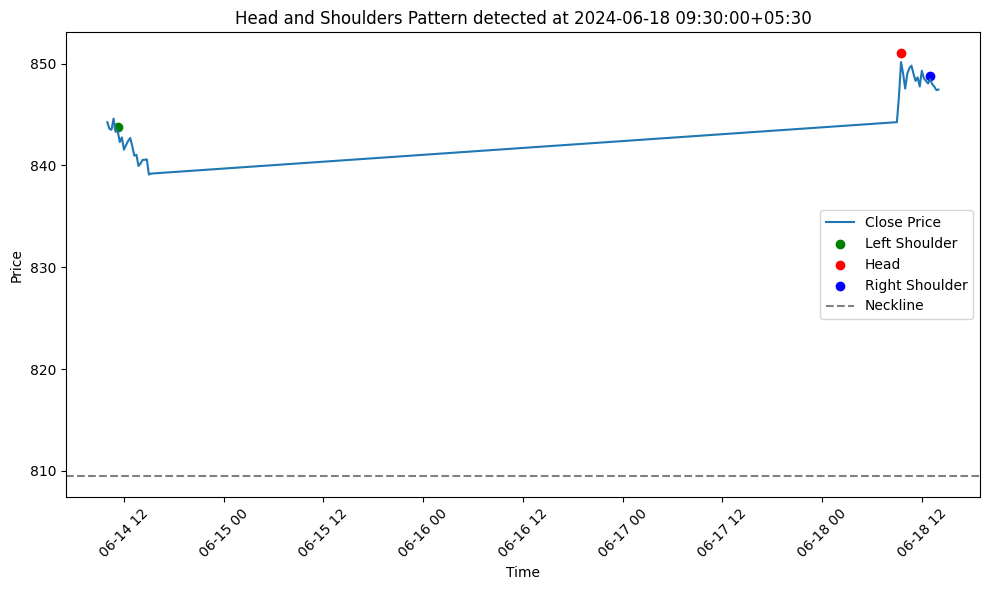

Left Shoulder: (1407, Timestamp('2024-06-19 09:45:00+0530', tz='UTC+05:30'), 855.0), Head: (1425, Timestamp('2024-06-19 14:15:00+0530', tz='UTC+05:30'), 860.6), Right Shoulder: (1439, Timestamp('2024-06-20 11:15:00+0530', tz='UTC+05:30'), 851.25), Neckline Level: 812.625


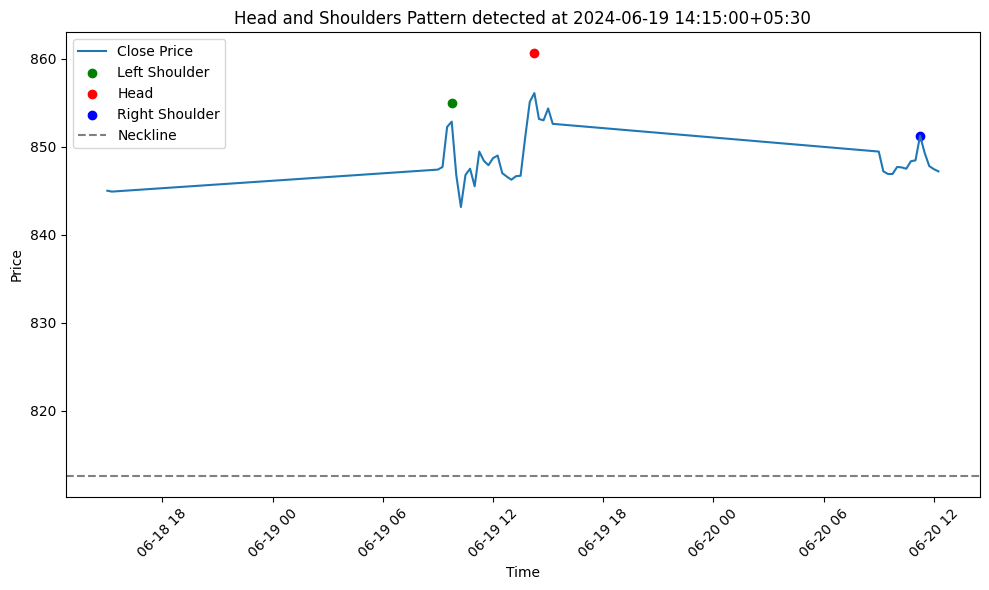

Left Shoulder: (1543, Timestamp('2024-06-26 11:15:00+0530', tz='UTC+05:30'), 847.95), Head: (1556, Timestamp('2024-06-26 14:30:00+0530', tz='UTC+05:30'), 848.8), Right Shoulder: (1567, Timestamp('2024-06-27 10:45:00+0530', tz='UTC+05:30'), 847.4), Neckline Level: 775.475


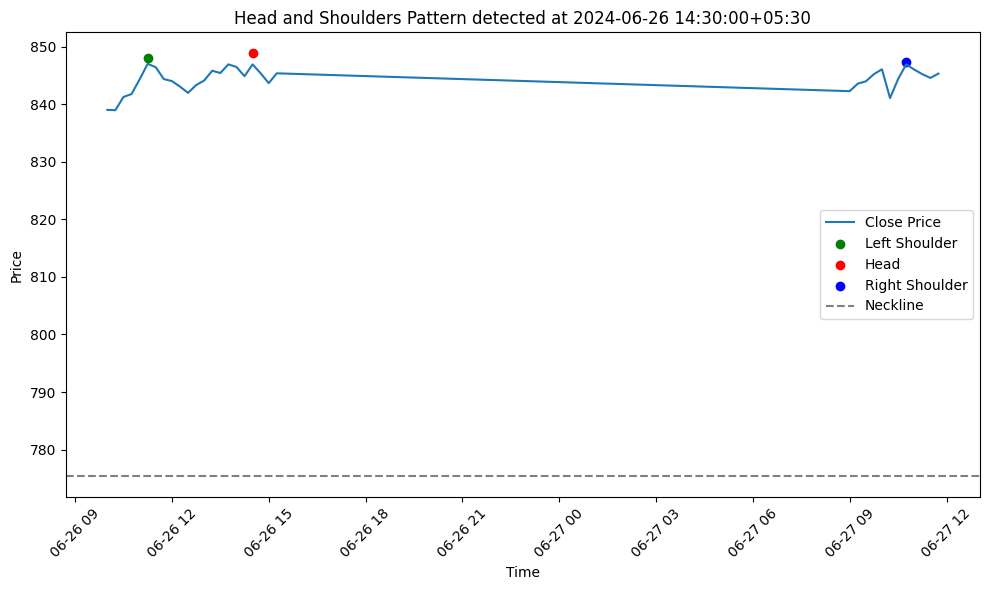

In [15]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import peakutils

file_path = r"D:\AlgoT\stock-pattern-main\stock-pattern-main\banknifty data\sbin.csv"
data = pd.read_csv(file_path)
data['Datetime'] = pd.to_datetime(data['Datetime'])

# Resample to 15-minute intervals
data.set_index('Datetime', inplace=True)
data_15min = data.resample('15T').agg({
    'Open': 'first',
    'High': 'max',
    'Low': 'min',
    'Close': 'last'
}).dropna()

def find_peaks_and_troughs(data):
    # Using peakutils for robust peak detection
    close_prices = data['Close']
    peak_indexes = peakutils.indexes(np.array(close_prices), thres=0.5, min_dist=10)
    trough_indexes = peakutils.indexes(np.array(-close_prices), thres=0.5, min_dist=10)
    
    peaks = [(idx, data.index[idx], data['High'][idx]) for idx in peak_indexes]
    troughs = [(idx, data.index[idx], data['Low'][idx]) for idx in trough_indexes]
    return peaks, troughs

def detect_head_and_shoulders(peaks, troughs):
    patterns = []
    for i in range(1, len(peaks) - 1):
        left_shoulder = peaks[i-1]
        head = peaks[i]
        right_shoulder = peaks[i+1]
        if left_shoulder[2] < head[2] and right_shoulder[2] < head[2] and \
           abs(left_shoulder[2] - right_shoulder[2]) < 0.01 * head[2]:  # Adjust tolerance as needed
            neckline_level = (troughs[i-1][2] + troughs[i][2]) / 2
            patterns.append({
                'left_shoulder': left_shoulder,
                'head': head,
                'right_shoulder': right_shoulder,
                'neckline_level': neckline_level
            })
    return patterns

# Find peaks and troughs in 15-minute data
peaks, troughs = find_peaks_and_troughs(data_15min)

# Detect Head and Shoulders patterns in 15-minute data
patterns = detect_head_and_shoulders(peaks, troughs)

# Display detected patterns and plot the chart
for pattern in patterns:
    print(f"Left Shoulder: {pattern['left_shoulder']}, Head: {pattern['head']}, Right Shoulder: {pattern['right_shoulder']}, Neckline Level: {pattern['neckline_level']}")

    start_index = max(0, pattern['left_shoulder'][0] - 5)
    end_index = min(len(data_15min) - 1, pattern['right_shoulder'][0] + 5)
    pattern_data = data_15min.iloc[start_index:end_index]

    plt.figure(figsize=(10, 6))
    plt.plot(pattern_data.index, pattern_data['Close'], label='Close Price')
    plt.scatter(pattern['left_shoulder'][1], pattern['left_shoulder'][2], color='green', label='Left Shoulder')
    plt.scatter(pattern['head'][1], pattern['head'][2], color='red', label='Head')
    plt.scatter(pattern['right_shoulder'][1], pattern['right_shoulder'][2], color='blue', label='Right Shoulder')
    plt.axhline(y=pattern['neckline_level'], color='gray', linestyle='--', label='Neckline')
    plt.xlabel('Time')
    plt.ylabel('Price')
    plt.legend()
    plt.title(f"Head and Shoulders Pattern detected at {pattern['head'][1]}")
    plt.xticks(rotation=45)
    plt.tight_layout()
    plt.show()


C:\Users\Aviral Mishra\AppData\Local\Temp\ipykernel_12708\683599524.py:13: FutureWarning: 'T' is deprecated and will be removed in a future version, please use 'min' instead.
  data_15min = data.resample('15T').agg({
C:\Users\Aviral Mishra\AppData\Local\Temp\ipykernel_12708\683599524.py:25: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  peaks = [(idx, data.index[idx], data['High'][idx]) for idx in peak_indexes]
C:\Users\Aviral Mishra\AppData\Local\Temp\ipykernel_12708\683599524.py:26: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  troughs = [(idx, data.index[idx], data['Low'][idx]) for idx in trough_indexes]


Left Shoulder: (552, Timestamp('2024-04-30 10:30:00+0530', tz='UTC+05:30'), 828.95), Head: (565, Timestamp('2024-04-30 13:45:00+0530', tz='UTC+05:30'), 834.85), Right Shoulder: (577, Timestamp('2024-05-02 10:15:00+0530', tz='UTC+05:30'), 833.9), Neckline Level: 738.325


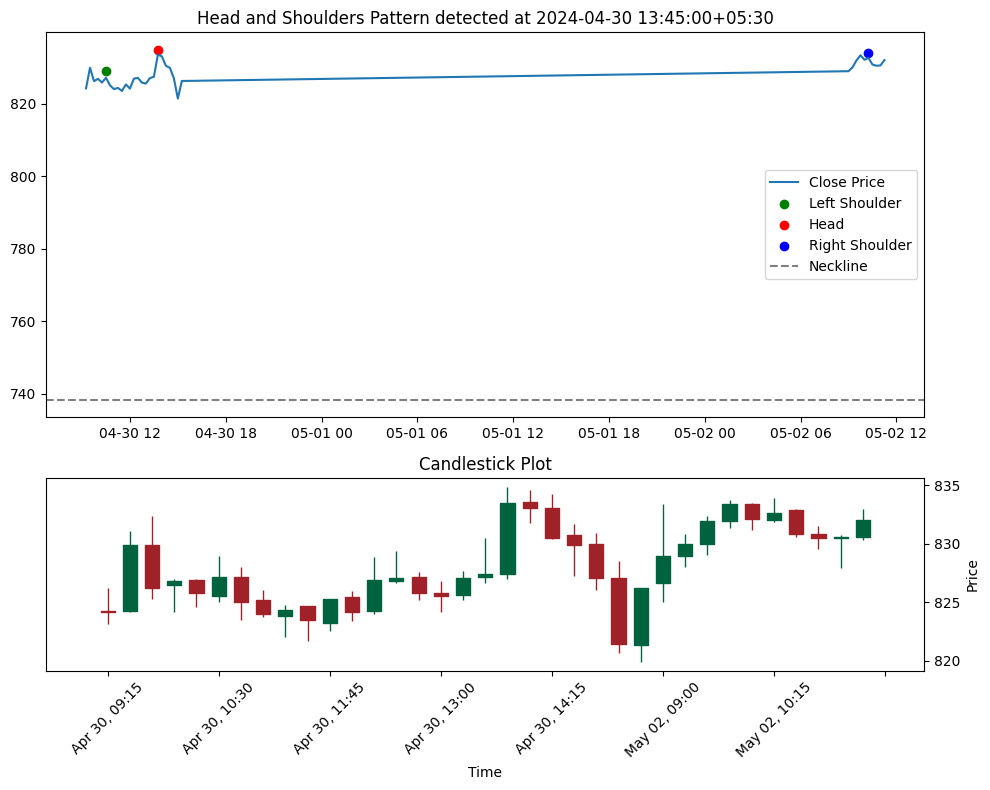

Left Shoulder: (588, Timestamp('2024-05-02 13:00:00+0530', tz='UTC+05:30'), 832.0), Head: (600, Timestamp('2024-05-03 09:30:00+0530', tz='UTC+05:30'), 835.4), Right Shoulder: (611, Timestamp('2024-05-03 12:15:00+0530', tz='UTC+05:30'), 828.2), Neckline Level: 752.725


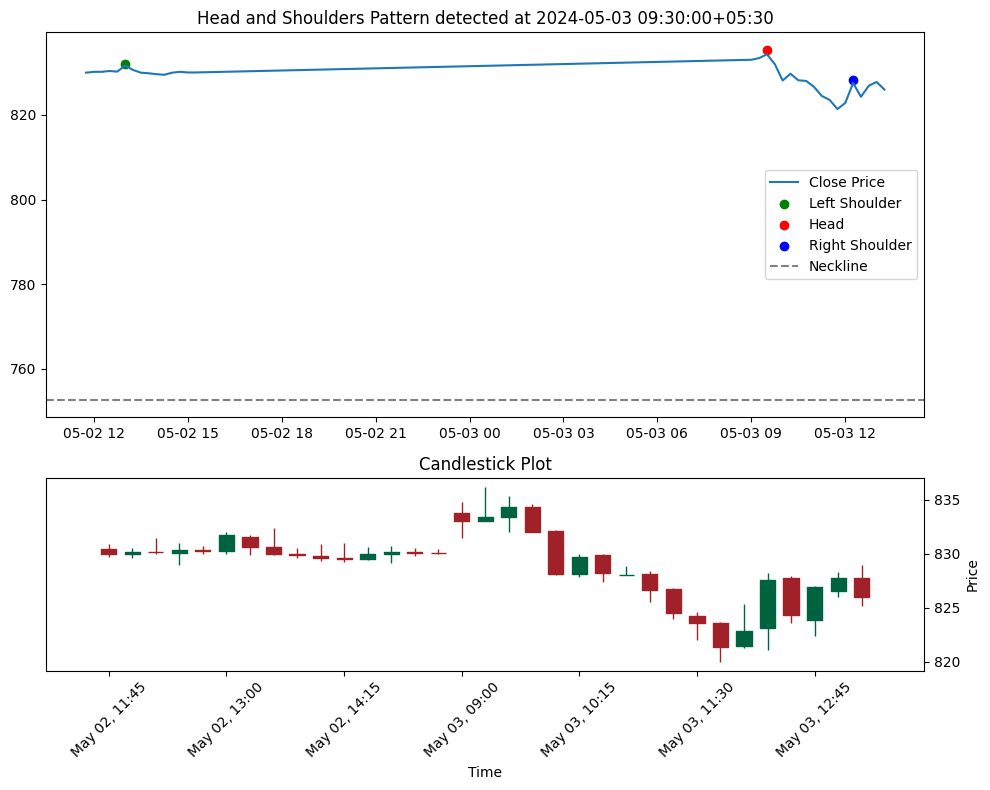

Left Shoulder: (611, Timestamp('2024-05-03 12:15:00+0530', tz='UTC+05:30'), 828.2), Head: (623, Timestamp('2024-05-03 15:15:00+0530', tz='UTC+05:30'), 831.45), Right Shoulder: (693, Timestamp('2024-05-08 13:15:00+0530', tz='UTC+05:30'), 822.0), Neckline Level: 763.775


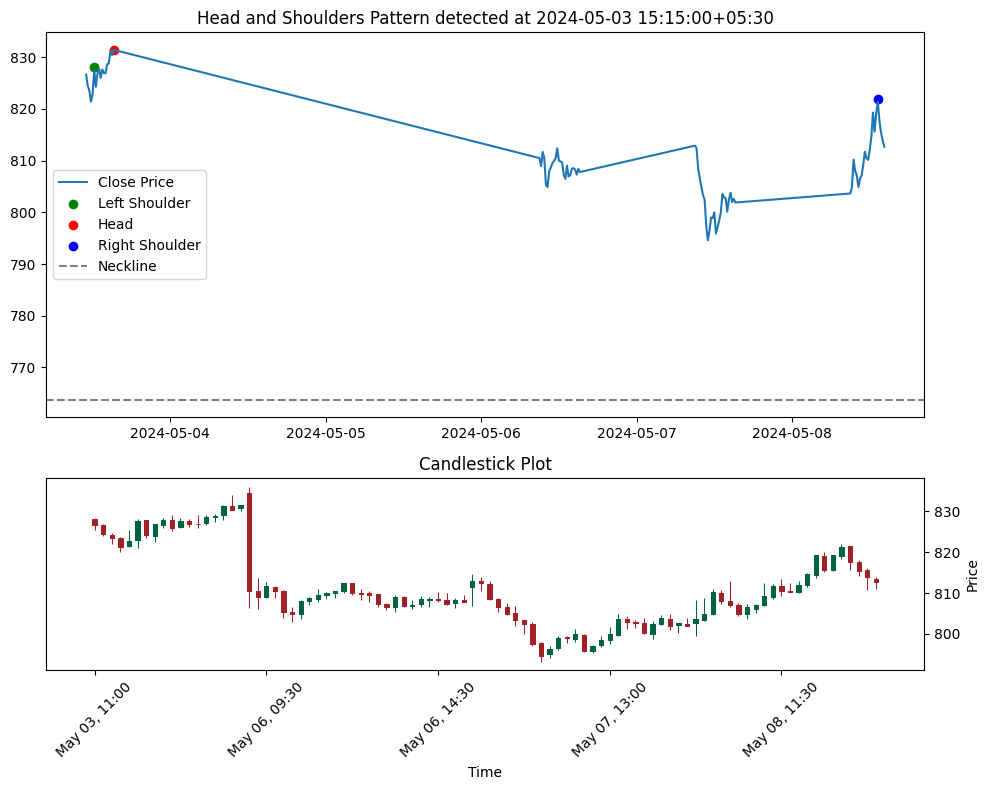

Left Shoulder: (693, Timestamp('2024-05-08 13:15:00+0530', tz='UTC+05:30'), 822.0), Head: (721, Timestamp('2024-05-09 13:45:00+0530', tz='UTC+05:30'), 839.65), Right Shoulder: (741, Timestamp('2024-05-10 12:15:00+0530', tz='UTC+05:30'), 824.95), Neckline Level: 755.35


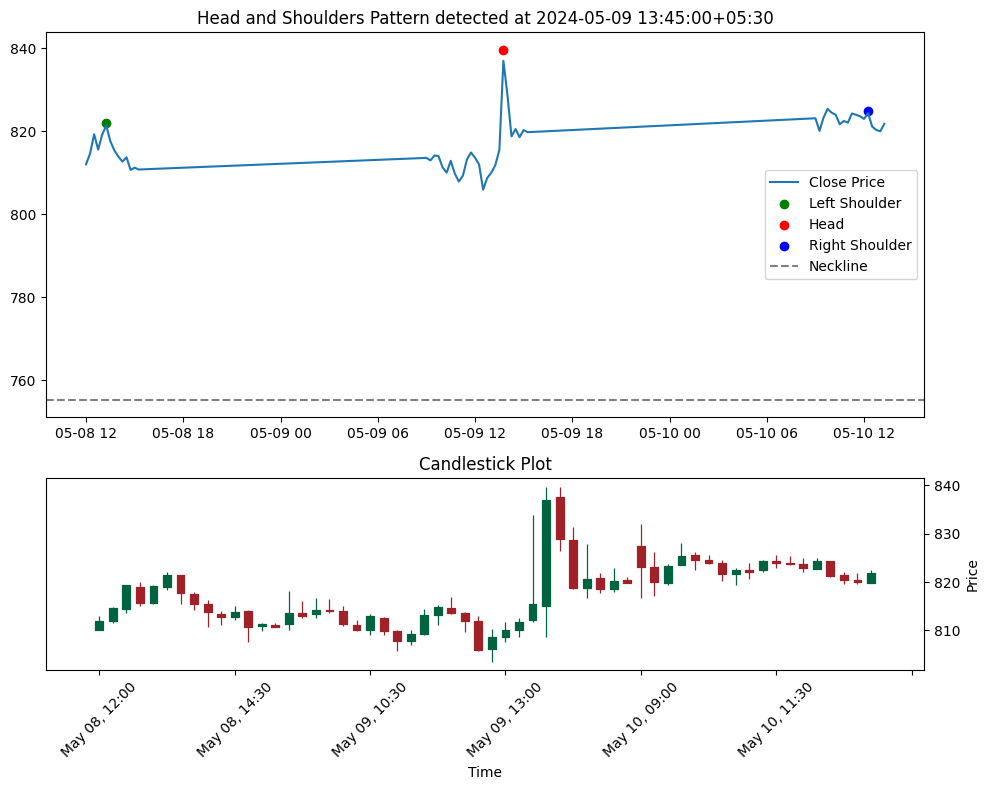

Left Shoulder: (806, Timestamp('2024-05-15 09:00:00+0530', tz='UTC+05:30'), 825.3), Head: (832, Timestamp('2024-05-16 09:00:00+0530', tz='UTC+05:30'), 826.15), Right Shoulder: (865, Timestamp('2024-05-17 10:45:00+0530', tz='UTC+05:30'), 821.65), Neckline Level: 764.775


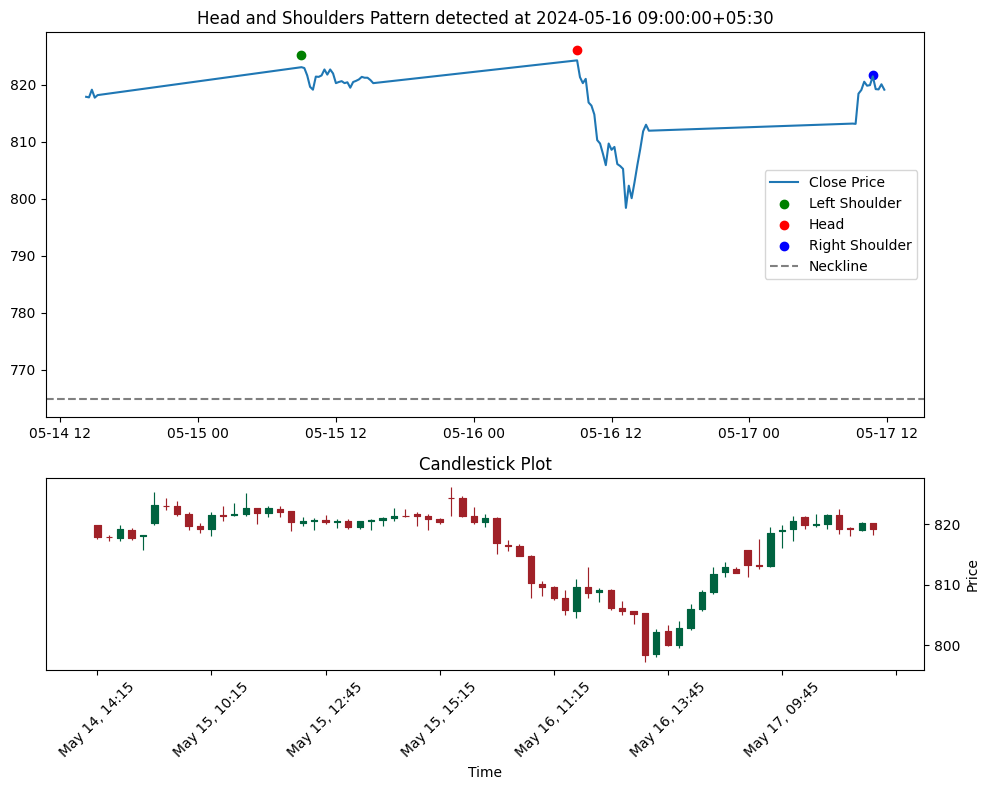

Left Shoulder: (949, Timestamp('2024-05-23 12:15:00+0530', tz='UTC+05:30'), 834.0), Head: (964, Timestamp('2024-05-24 09:30:00+0530', tz='UTC+05:30'), 840.95), Right Shoulder: (976, Timestamp('2024-05-24 12:30:00+0530', tz='UTC+05:30'), 836.4), Neckline Level: 753.925


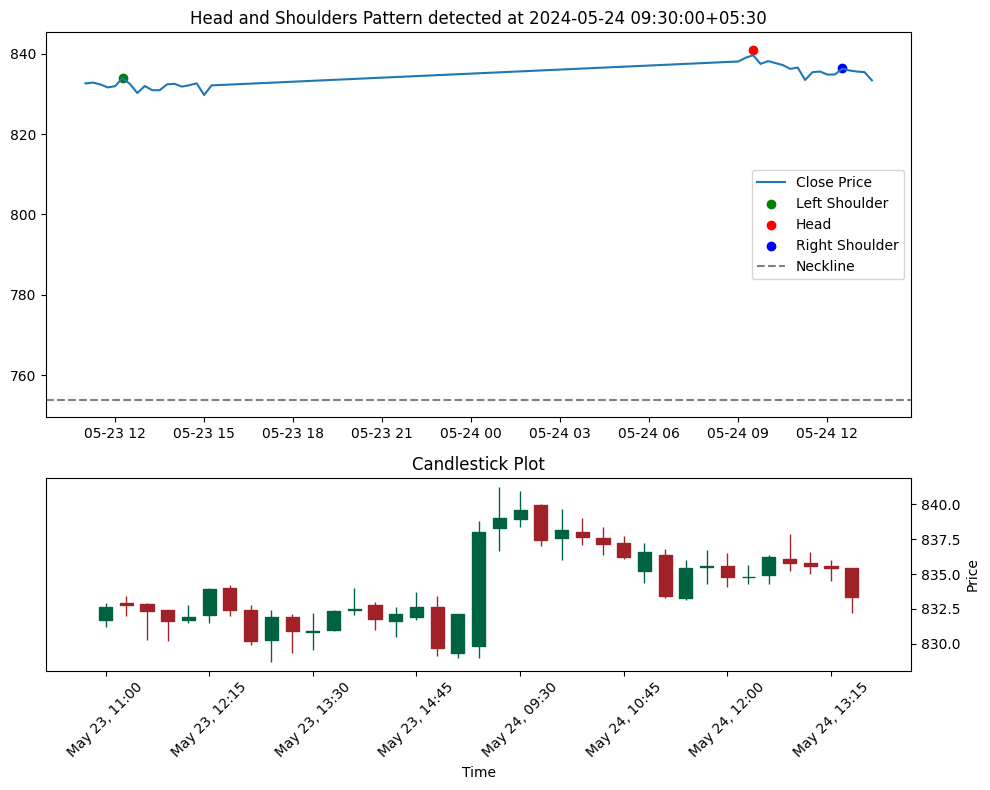

Left Shoulder: (1000, Timestamp('2024-05-27 12:00:00+0530', tz='UTC+05:30'), 838.0), Head: (1014, Timestamp('2024-05-28 09:00:00+0530', tz='UTC+05:30'), 840.7), Right Shoulder: (1030, Timestamp('2024-05-28 13:00:00+0530', tz='UTC+05:30'), 834.0), Neckline Level: 741.775


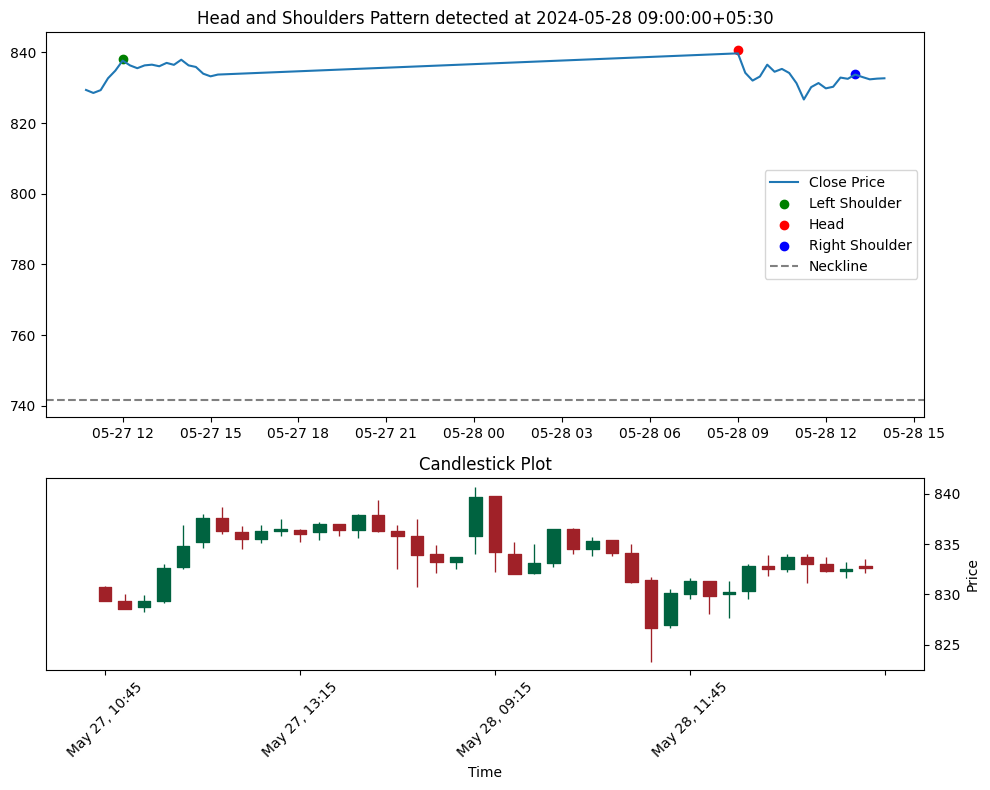

Left Shoulder: (1030, Timestamp('2024-05-28 13:00:00+0530', tz='UTC+05:30'), 834.0), Head: (1041, Timestamp('2024-05-29 09:15:00+0530', tz='UTC+05:30'), 834.45), Right Shoulder: (1055, Timestamp('2024-05-29 12:45:00+0530', tz='UTC+05:30'), 827.0), Neckline Level: 746.95


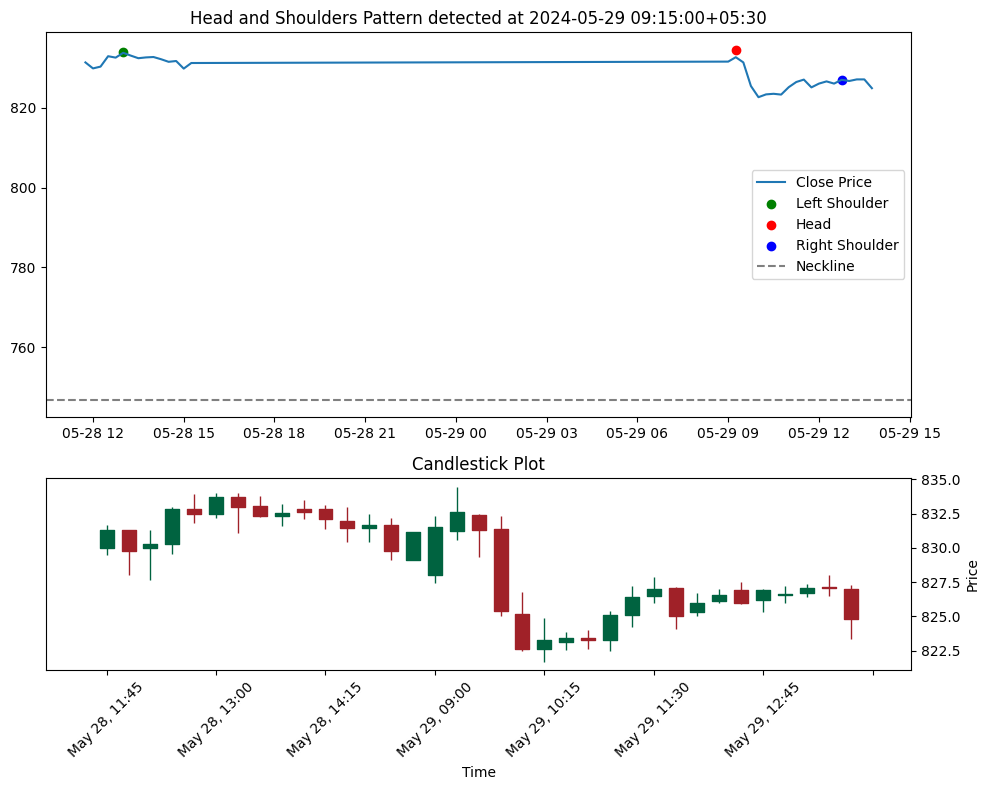

Left Shoulder: (1055, Timestamp('2024-05-29 12:45:00+0530', tz='UTC+05:30'), 827.0), Head: (1066, Timestamp('2024-05-30 09:00:00+0530', tz='UTC+05:30'), 836.0), Right Shoulder: (1083, Timestamp('2024-05-30 13:15:00+0530', tz='UTC+05:30'), 831.65), Neckline Level: 765.975


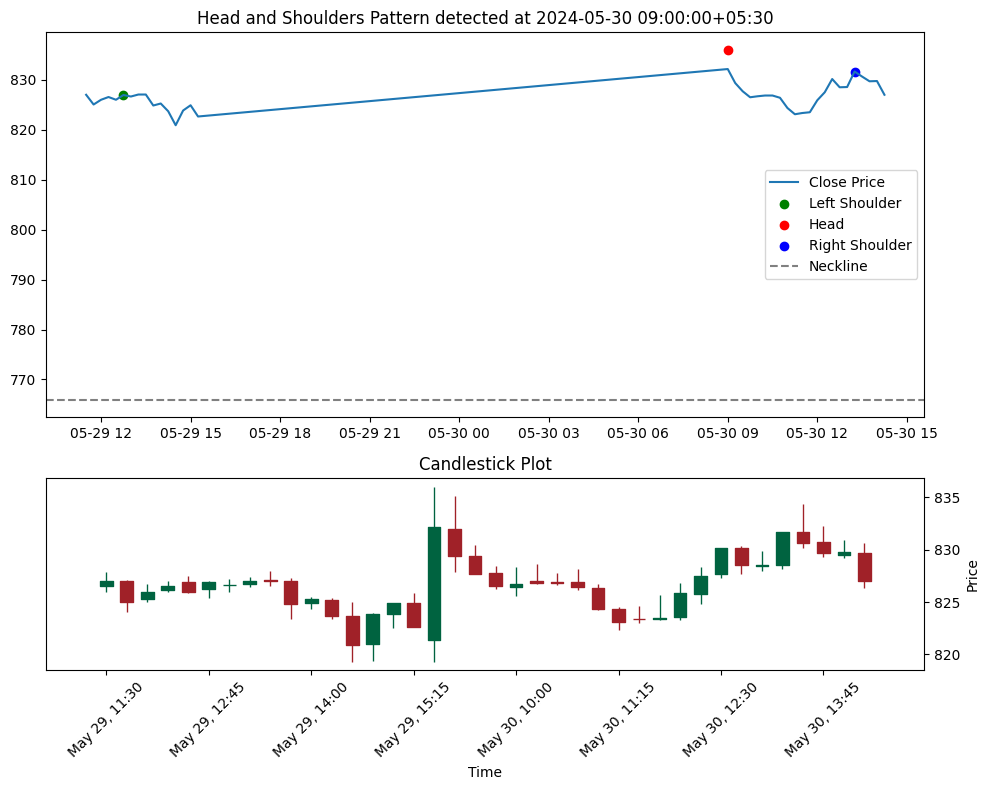

Left Shoulder: (1292, Timestamp('2024-06-11 13:30:00+0530', tz='UTC+05:30'), 838.6), Head: (1307, Timestamp('2024-06-12 10:45:00+0530', tz='UTC+05:30'), 845.55), Right Shoulder: (1321, Timestamp('2024-06-12 14:15:00+0530', tz='UTC+05:30'), 840.5), Neckline Level: 802.225


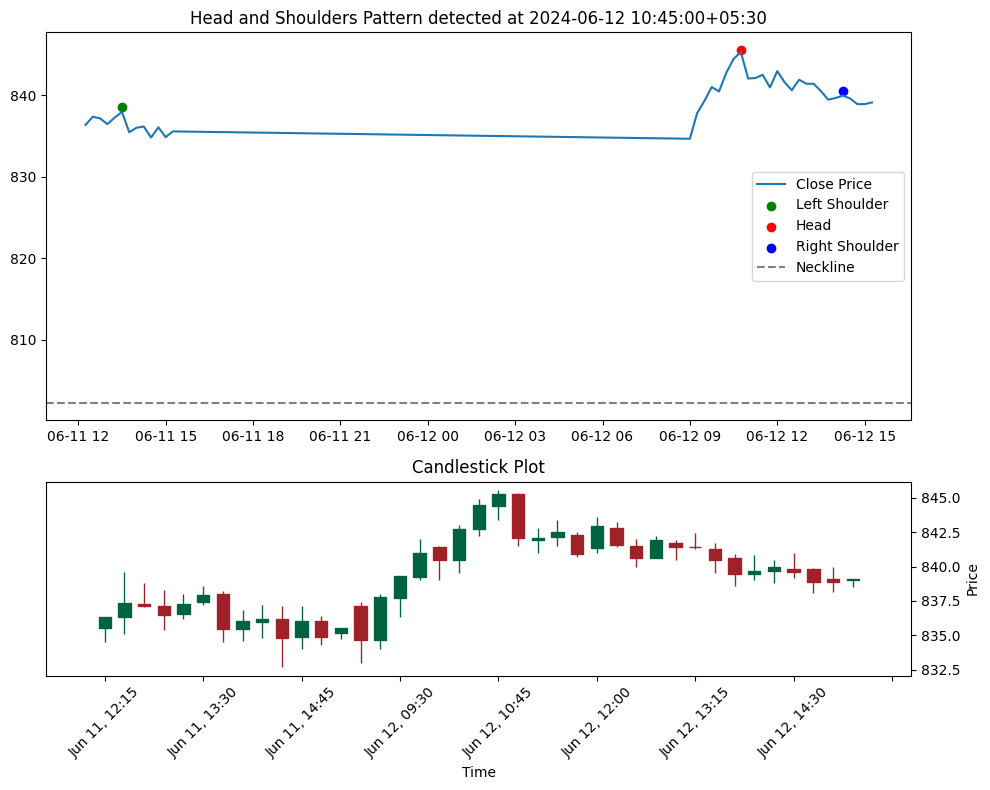

Left Shoulder: (1336, Timestamp('2024-06-13 11:30:00+0530', tz='UTC+05:30'), 844.0), Head: (1349, Timestamp('2024-06-13 14:45:00+0530', tz='UTC+05:30'), 844.9), Right Shoulder: (1361, Timestamp('2024-06-14 11:15:00+0530', tz='UTC+05:30'), 843.75), Neckline Level: 812.75


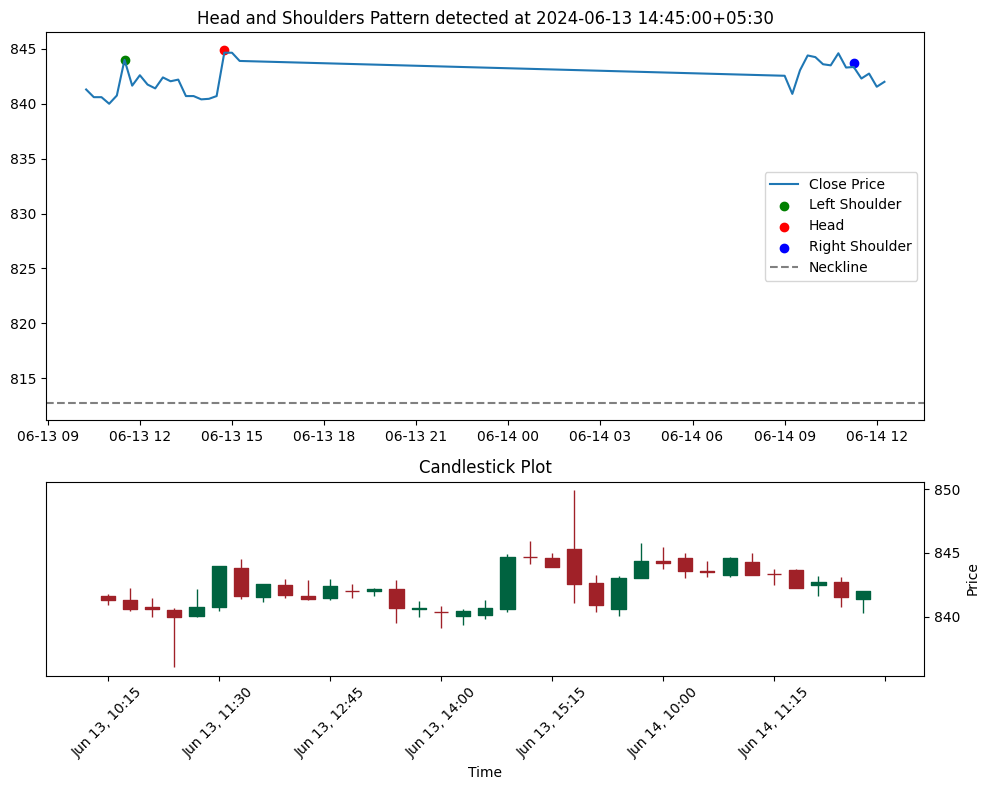

Left Shoulder: (1361, Timestamp('2024-06-14 11:15:00+0530', tz='UTC+05:30'), 843.75), Head: (1380, Timestamp('2024-06-18 09:30:00+0530', tz='UTC+05:30'), 851.0), Right Shoulder: (1394, Timestamp('2024-06-18 13:00:00+0530', tz='UTC+05:30'), 848.75), Neckline Level: 809.525


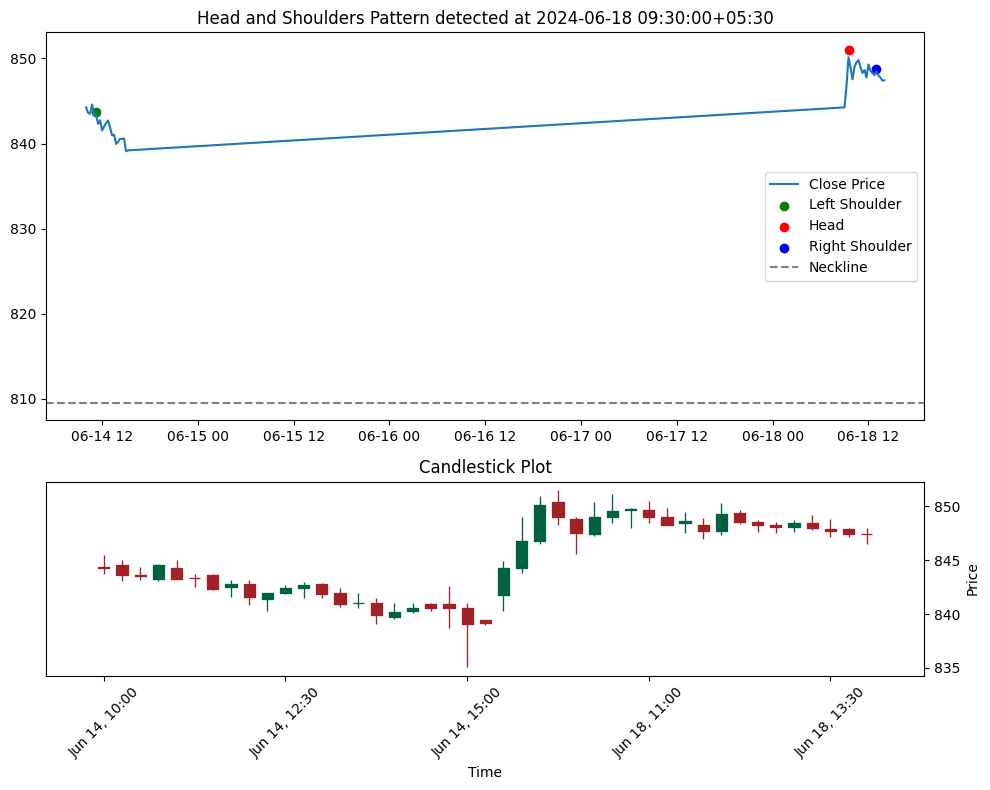

Left Shoulder: (1407, Timestamp('2024-06-19 09:45:00+0530', tz='UTC+05:30'), 855.0), Head: (1425, Timestamp('2024-06-19 14:15:00+0530', tz='UTC+05:30'), 860.6), Right Shoulder: (1439, Timestamp('2024-06-20 11:15:00+0530', tz='UTC+05:30'), 851.25), Neckline Level: 812.625


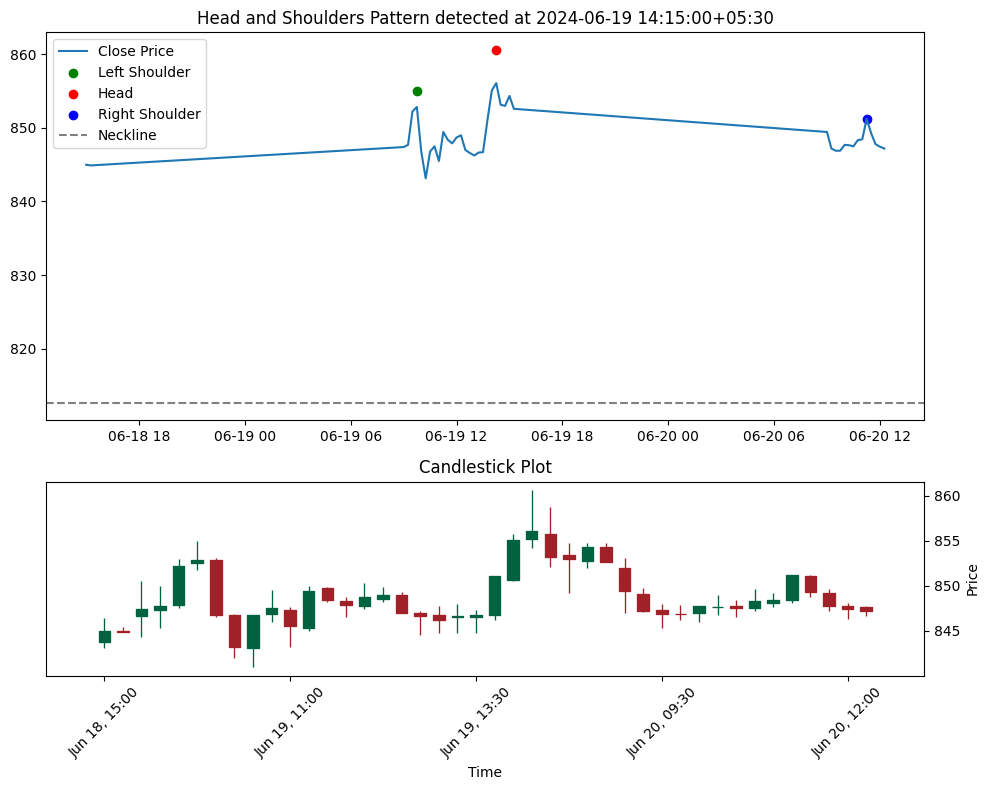

Left Shoulder: (1543, Timestamp('2024-06-26 11:15:00+0530', tz='UTC+05:30'), 847.95), Head: (1556, Timestamp('2024-06-26 14:30:00+0530', tz='UTC+05:30'), 848.8), Right Shoulder: (1567, Timestamp('2024-06-27 10:45:00+0530', tz='UTC+05:30'), 847.4), Neckline Level: 775.475


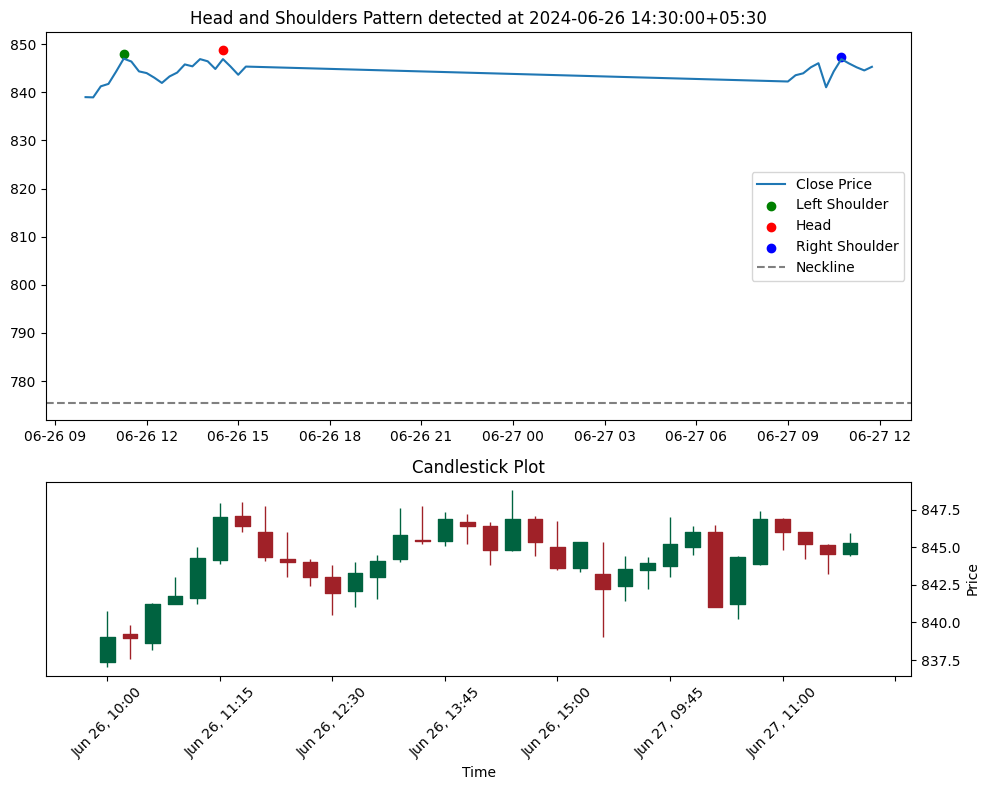

In [19]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import mplfinance as mpf
import peakutils

file_path = r"D:\AlgoT\stock-pattern-main\stock-pattern-main\banknifty data\sbin.csv"
data = pd.read_csv(file_path)
data['Datetime'] = pd.to_datetime(data['Datetime'])

# Resample to 15-minute intervals
data.set_index('Datetime', inplace=True)
data_15min = data.resample('15T').agg({
    'Open': 'first',
    'High': 'max',
    'Low': 'min',
    'Close': 'last'
}).dropna()

def find_peaks_and_troughs(data):
    close_prices = data['Close']
    peak_indexes = peakutils.indexes(np.array(close_prices), thres=0.5, min_dist=10)
    trough_indexes = peakutils.indexes(np.array(-close_prices), thres=0.5, min_dist=10)
    
    peaks = [(idx, data.index[idx], data['High'][idx]) for idx in peak_indexes]
    troughs = [(idx, data.index[idx], data['Low'][idx]) for idx in trough_indexes]
    return peaks, troughs

def detect_head_and_shoulders(peaks, troughs):
    patterns = []
    for i in range(1, len(peaks) - 1):
        left_shoulder = peaks[i-1]
        head = peaks[i]
        right_shoulder = peaks[i+1]
        if left_shoulder[2] < head[2] and right_shoulder[2] < head[2] and \
           abs(left_shoulder[2] - right_shoulder[2]) < 0.01 * head[2]:  # Adjust tolerance as needed
            neckline_level = (troughs[i-1][2] + troughs[i][2]) / 2
            patterns.append({
                'left_shoulder': left_shoulder,
                'head': head,
                'right_shoulder': right_shoulder,
                'neckline_level': neckline_level
            })
    return patterns

# Find peaks and troughs in 15-minute data
peaks, troughs = find_peaks_and_troughs(data_15min)

# Detect Head and Shoulders patterns in 15-minute data
patterns = detect_head_and_shoulders(peaks, troughs)

# Display detected patterns and plot the chart
for pattern in patterns:
    print(f"Left Shoulder: {pattern['left_shoulder']}, Head: {pattern['head']}, Right Shoulder: {pattern['right_shoulder']}, Neckline Level: {pattern['neckline_level']}")

    start_index = max(0, pattern['left_shoulder'][0] - 5)
    end_index = min(len(data_15min) - 1, pattern['right_shoulder'][0] + 5)
    pattern_data = data_15min.iloc[start_index:end_index]

    # Setup figure and subplots
    fig, (ax, ax2) = plt.subplots(2, 1, figsize=(10, 8), gridspec_kw={'height_ratios': [2, 1]})

    # First subplot for the pattern
    ax.plot(pattern_data.index, pattern_data['Close'], label='Close Price')
    ax.scatter(pattern['left_shoulder'][1], pattern['left_shoulder'][2], color='green', label='Left Shoulder')
    ax.scatter(pattern['head'][1], pattern['head'][2], color='red', label='Head')
    ax.scatter(pattern['right_shoulder'][1], pattern['right_shoulder'][2], color='blue', label='Right Shoulder')
    ax.axhline(y=pattern['neckline_level'], color='gray', linestyle='--', label='Neckline')
    ax.set_title(f"Head and Shoulders Pattern detected at {pattern['head'][1]}")
    ax.legend()

    # Second subplot for candlestick
    mpf.plot(pattern_data, type='candle', ax=ax2, style='charles')
    ax2.set_xlabel('Time')
    ax2.set_ylabel('Price')
    ax2.set_title('Candlestick Plot')

    plt.xticks(rotation=45)
    plt.tight_layout()
    plt.show()


C:\Users\Aviral Mishra\AppData\Local\Temp\ipykernel_19148\2489250554.py:14: FutureWarning: 'T' is deprecated and will be removed in a future version, please use 'min' instead.
  data_15min = data.resample('15T').agg({
C:\Users\Aviral Mishra\AppData\Local\Temp\ipykernel_19148\2489250554.py:27: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  peaks = [(idx, data.index[idx], data['High'][idx]) for idx in peak_indexes]
C:\Users\Aviral Mishra\AppData\Local\Temp\ipykernel_19148\2489250554.py:28: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  troughs = [(idx, data.index[idx], data['Low'][idx]) for idx in trough_indexes]


Left Shoulder: (693, Timestamp('2024-05-08 13:15:00+0530', tz='UTC+05:30'), 822.0), Head: (721, Timestamp('2024-05-09 13:45:00+0530', tz='UTC+05:30'), 839.65), Right Shoulder: (741, Timestamp('2024-05-10 12:15:00+0530', tz='UTC+05:30'), 824.95), Neckline Level: 755.35


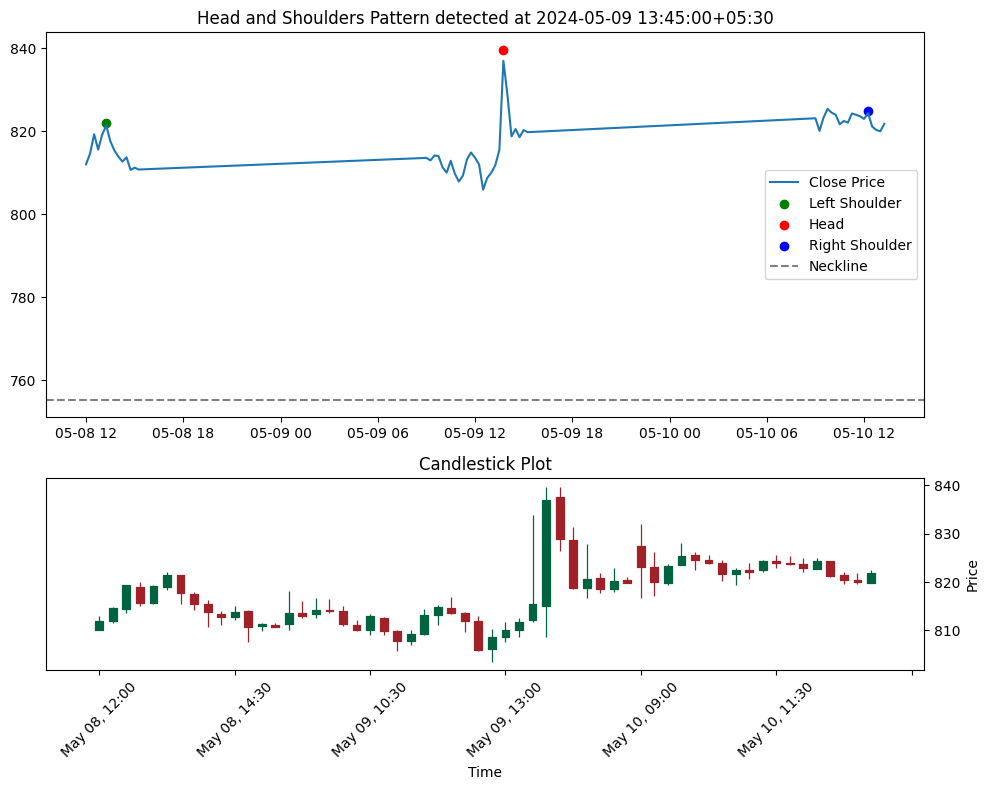

Left Shoulder: (806, Timestamp('2024-05-15 09:00:00+0530', tz='UTC+05:30'), 825.3), Head: (832, Timestamp('2024-05-16 09:00:00+0530', tz='UTC+05:30'), 826.15), Right Shoulder: (865, Timestamp('2024-05-17 10:45:00+0530', tz='UTC+05:30'), 821.65), Neckline Level: 764.775


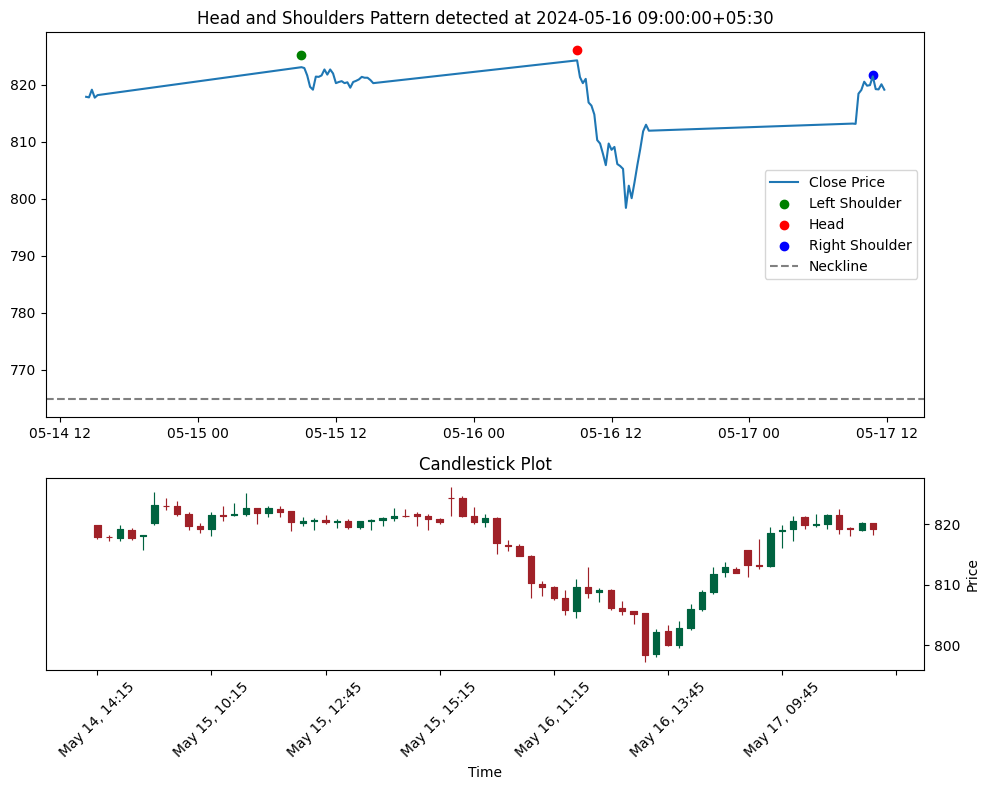

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import mplfinance as mpf
import peakutils

# Load the data
file_path = r"D:\AlgoT\stock-pattern-main\stock-pattern-main\banknifty data\sbin.csv"
data = pd.read_csv(file_path)
data['Datetime'] = pd.to_datetime(data['Datetime'])

# Resample to 15-minute intervals
data.set_index('Datetime', inplace=True)
data_15min = data.resample('15T').agg({
    'Open': 'first',
    'High': 'max',
    'Low': 'min',
    'Close': 'last'
}).dropna()

# Function to find peaks and troughs in the data
def find_peaks_and_troughs(data):
    close_prices = data['Close']
    peak_indexes = peakutils.indexes(np.array(close_prices), thres=0.5, min_dist=10)
    trough_indexes = peakutils.indexes(np.array(-close_prices), thres=0.5, min_dist=10)
    
    peaks = [(idx, data.index[idx], data['High'][idx]) for idx in peak_indexes]
    troughs = [(idx, data.index[idx], data['Low'][idx]) for idx in trough_indexes]
    return peaks, troughs

# Function to detect Head and Shoulders patterns
def detect_head_and_shoulders(peaks, troughs):
    patterns = []
    for i in range(1, len(peaks) - 1):
        left_shoulder = peaks[i-1]
        head = peaks[i]
        right_shoulder = peaks[i+1]
        
        # Calculate time duration between shoulders
        left_duration = (head[1] - left_shoulder[1]).total_seconds() / 3600  # in hours
        right_duration = (right_shoulder[1] - head[1]).total_seconds() / 3600  # in hours
        
        # Check if the durations are within the 1:1.5 ratio
        if min(left_duration, right_duration) * 1.5 < max(left_duration, right_duration):
            continue
        
        # Check if head is higher than shoulders and shoulders are approximately equal in height
        if left_shoulder[2] < head[2] and right_shoulder[2] < head[2] and \
           abs(left_shoulder[2] - right_shoulder[2]) < 0.01 * head[2]:  # Adjust tolerance as needed
            neckline_level = (troughs[i-1][2] + troughs[i][2]) / 2
            patterns.append({
                'left_shoulder': left_shoulder,
                'head': head,
                'right_shoulder': right_shoulder,
                'neckline_level': neckline_level
            })
    return patterns

# Find peaks and troughs in 15-minute data
peaks, troughs = find_peaks_and_troughs(data_15min)

# Detect Head and Shoulders patterns in 15-minute data
patterns = detect_head_and_shoulders(peaks, troughs)

# Display detected patterns and plot the chart
for pattern in patterns:
    print(f"Left Shoulder: {pattern['left_shoulder']}, Head: {pattern['head']}, Right Shoulder: {pattern['right_shoulder']}, Neckline Level: {pattern['neckline_level']}")

    start_index = max(0, pattern['left_shoulder'][0] - 5)
    end_index = min(len(data_15min) - 1, pattern['right_shoulder'][0] + 5)
    pattern_data = data_15min.iloc[start_index:end_index]

    # Setup figure and subplots
    fig, (ax, ax2) = plt.subplots(2, 1, figsize=(10, 8), gridspec_kw={'height_ratios': [2, 1]})

    # First subplot for the pattern
    ax.plot(pattern_data.index, pattern_data['Close'], label='Close Price')
    ax.scatter(pattern['left_shoulder'][1], pattern['left_shoulder'][2], color='green', label='Left Shoulder')
    ax.scatter(pattern['head'][1], pattern['head'][2], color='red', label='Head')
    ax.scatter(pattern['right_shoulder'][1], pattern['right_shoulder'][2], color='blue', label='Right Shoulder')
    ax.axhline(y=pattern['neckline_level'], color='gray', linestyle='--', label='Neckline')
    ax.set_title(f"Head and Shoulders Pattern detected at {pattern['head'][1]}")
    ax.legend()

    # Second subplot for candlestick
    mpf.plot(pattern_data, type='candle', ax=ax2, style='charles')
    ax2.set_xlabel('Time')
    ax2.set_ylabel('Price')
    ax2.set_title('Candlestick Plot')

    plt.xticks(rotation=45)
    plt.tight_layout()
    plt.show()



C:\Users\Aviral Mishra\AppData\Local\Temp\ipykernel_19148\2793771378.py:14: FutureWarning: 'T' is deprecated and will be removed in a future version, please use 'min' instead.
  data_15min = data.resample('15T').agg({
C:\Users\Aviral Mishra\AppData\Local\Temp\ipykernel_19148\2793771378.py:27: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  peaks = [(idx, data.index[idx], data['High'][idx]) for idx in peak_indexes]
C:\Users\Aviral Mishra\AppData\Local\Temp\ipykernel_19148\2793771378.py:28: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  troughs = [(idx, data.index[idx], data['Low'][idx]) for idx in trough_indexes]


Left Shoulder: (693, Timestamp('2024-05-08 13:15:00+0530', tz='UTC+05:30'), 822.0), Head: (721, Timestamp('2024-05-09 13:45:00+0530', tz='UTC+05:30'), 839.65), Right Shoulder: (741, Timestamp('2024-05-10 12:15:00+0530', tz='UTC+05:30'), 824.95), Neckline Level: 808.65


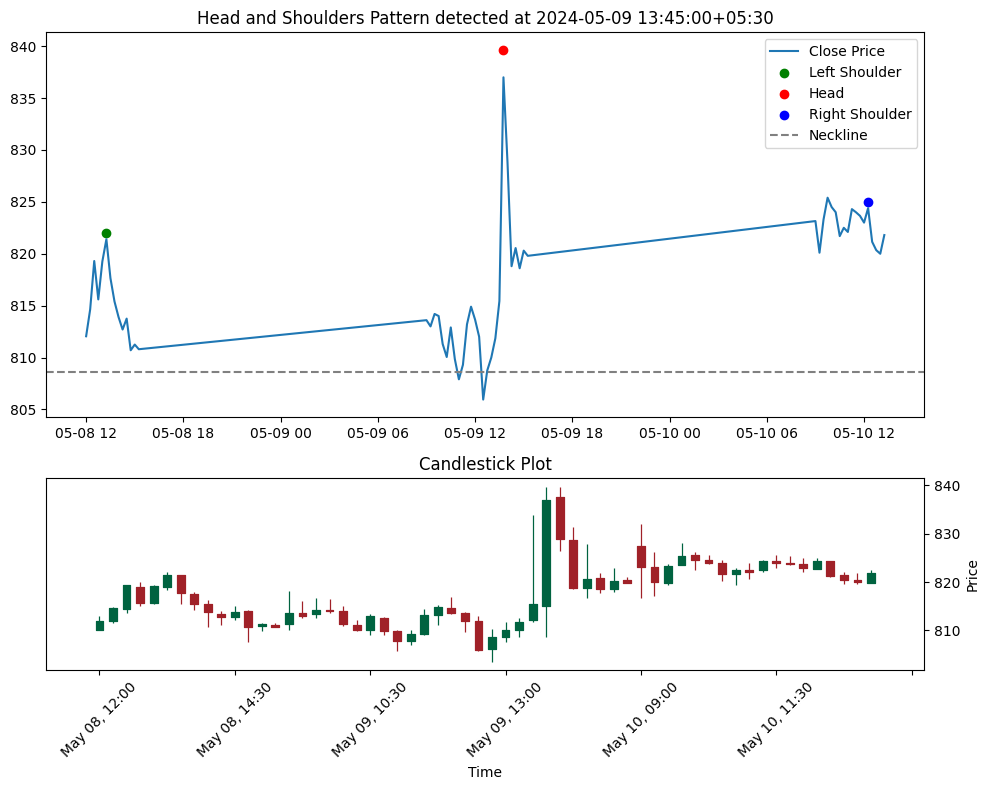

Left Shoulder: (806, Timestamp('2024-05-15 09:00:00+0530', tz='UTC+05:30'), 825.3), Head: (832, Timestamp('2024-05-16 09:00:00+0530', tz='UTC+05:30'), 826.15), Right Shoulder: (865, Timestamp('2024-05-17 10:45:00+0530', tz='UTC+05:30'), 821.65), Neckline Level: 819.05


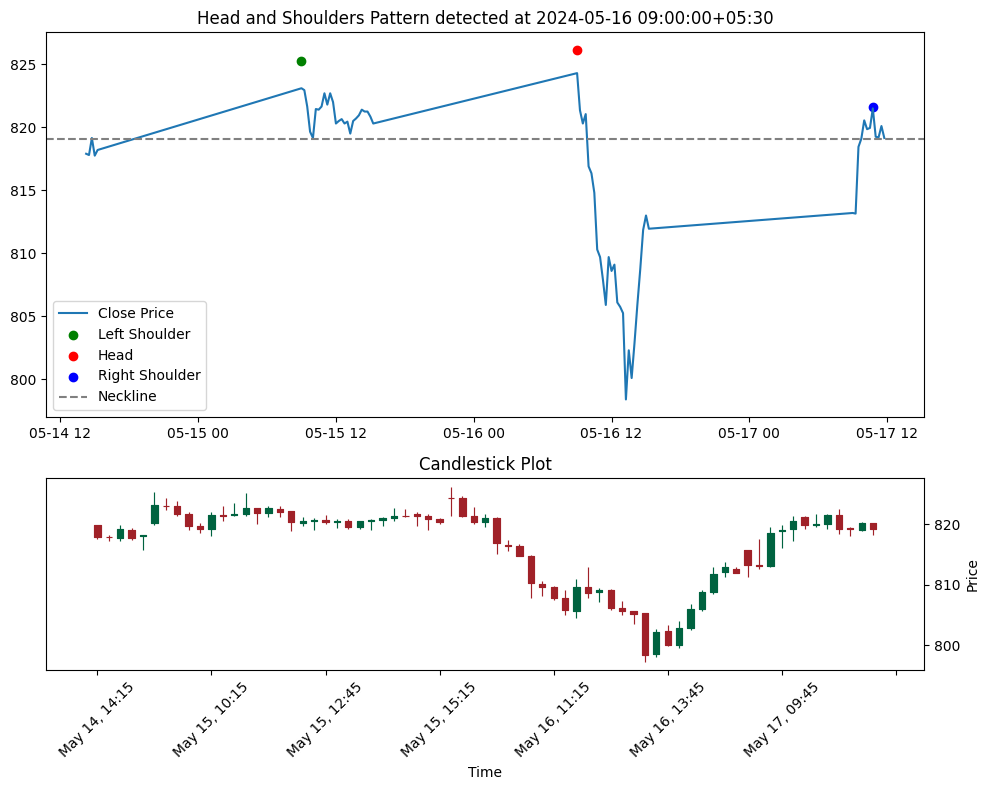

In [2]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import mplfinance as mpf
import peakutils

# Load the data
file_path = r"D:\AlgoT\stock-pattern-main\stock-pattern-main\banknifty data\sbin.csv"
data = pd.read_csv(file_path)
data['Datetime'] = pd.to_datetime(data['Datetime'])

# Resample to 15-minute intervals
data.set_index('Datetime', inplace=True)
data_15min = data.resample('15T').agg({
    'Open': 'first',
    'High': 'max',
    'Low': 'min',
    'Close': 'last'
}).dropna()

# Function to find peaks and troughs in the data
def find_peaks_and_troughs(data):
    close_prices = data['Close']
    peak_indexes = peakutils.indexes(np.array(close_prices), thres=0.5, min_dist=10)
    trough_indexes = peakutils.indexes(np.array(-close_prices), thres=0.5, min_dist=10)
    
    peaks = [(idx, data.index[idx], data['High'][idx]) for idx in peak_indexes]
    troughs = [(idx, data.index[idx], data['Low'][idx]) for idx in trough_indexes]
    return peaks, troughs

# Function to detect Head and Shoulders patterns
def detect_head_and_shoulders(peaks, troughs):
    patterns = []
    for i in range(1, len(peaks) - 1):
        left_shoulder = peaks[i-1]
        head = peaks[i]
        right_shoulder = peaks[i+1]
        
        # Calculate time duration between shoulders
        left_duration = (head[1] - left_shoulder[1]).total_seconds() / 3600  # in hours
        right_duration = (right_shoulder[1] - head[1]).total_seconds() / 3600  # in hours
        
        # Check if the durations are within the 1:1.5 ratio
        if min(left_duration, right_duration) * 1.5 < max(left_duration, right_duration):
            continue
        
        # Check if head is higher than shoulders and shoulders are approximately equal in height
        if left_shoulder[2] < head[2] and right_shoulder[2] < head[2] and \
           abs(left_shoulder[2] - right_shoulder[2]) < 0.01 * head[2]:  # Adjust tolerance as needed
            
            # Identify low prices around the head
            head_idx = head[0]
            low_prices_around_head = data_15min['Low'][head_idx-2:head_idx+3]  # Adjust range as needed
            
            # Choose the minimum low price as the neckline
            neckline_level = low_prices_around_head.min()
            
            patterns.append({
                'left_shoulder': left_shoulder,
                'head': head,
                'right_shoulder': right_shoulder,
                'neckline_level': neckline_level
            })
    return patterns

# Find peaks and troughs in 15-minute data
peaks, troughs = find_peaks_and_troughs(data_15min)

# Detect Head and Shoulders patterns in 15-minute data
patterns = detect_head_and_shoulders(peaks, troughs)

# Display detected patterns and plot the chart
for pattern in patterns:
    print(f"Left Shoulder: {pattern['left_shoulder']}, Head: {pattern['head']}, Right Shoulder: {pattern['right_shoulder']}, Neckline Level: {pattern['neckline_level']}")

    start_index = max(0, pattern['left_shoulder'][0] - 5)
    end_index = min(len(data_15min) - 1, pattern['right_shoulder'][0] + 5)
    pattern_data = data_15min.iloc[start_index:end_index]

    # Setup figure and subplots
    fig, (ax, ax2) = plt.subplots(2, 1, figsize=(10, 8), gridspec_kw={'height_ratios': [2, 1]})

    # First subplot for the pattern
    ax.plot(pattern_data.index, pattern_data['Close'], label='Close Price')
    ax.scatter(pattern['left_shoulder'][1], pattern['left_shoulder'][2], color='green', label='Left Shoulder')
    ax.scatter(pattern['head'][1], pattern['head'][2], color='red', label='Head')
    ax.scatter(pattern['right_shoulder'][1], pattern['right_shoulder'][2], color='blue', label='Right Shoulder')
    ax.axhline(y=pattern['neckline_level'], color='gray', linestyle='--', label='Neckline')
    ax.set_title(f"Head and Shoulders Pattern detected at {pattern['head'][1]}")
    ax.legend()

    # Second subplot for candlestick
    mpf.plot(pattern_data, type='candle', ax=ax2, style='charles')
    ax2.set_xlabel('Time')
    ax2.set_ylabel('Price')
    ax2.set_title('Candlestick Plot')

    plt.xticks(rotation=45)
    plt.tight_layout()
    plt.show()


C:\Users\Aviral Mishra\AppData\Local\Temp\ipykernel_19148\2923602802.py:14: FutureWarning: 'T' is deprecated and will be removed in a future version, please use 'min' instead.
  data_15min = data.resample('5T').agg({
C:\Users\Aviral Mishra\AppData\Local\Temp\ipykernel_19148\2923602802.py:27: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  peaks = [(idx, data.index[idx], data['High'][idx]) for idx in peak_indexes]
C:\Users\Aviral Mishra\AppData\Local\Temp\ipykernel_19148\2923602802.py:28: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  troughs = [(idx, data.index[idx], data['Low'][idx]) for idx in trough_indexes]
C:\Users

Left Shoulder: (157, Timestamp('2024-07-12 09:25:00+0530', tz='UTC+05:30'), 52510.75), Head: (173, Timestamp('2024-07-12 10:45:00+0530', tz='UTC+05:30'), 52752.2), Right Shoulder: (187, Timestamp('2024-07-12 11:55:00+0530', tz='UTC+05:30'), 52576.6), Neckline Level: 52253.8


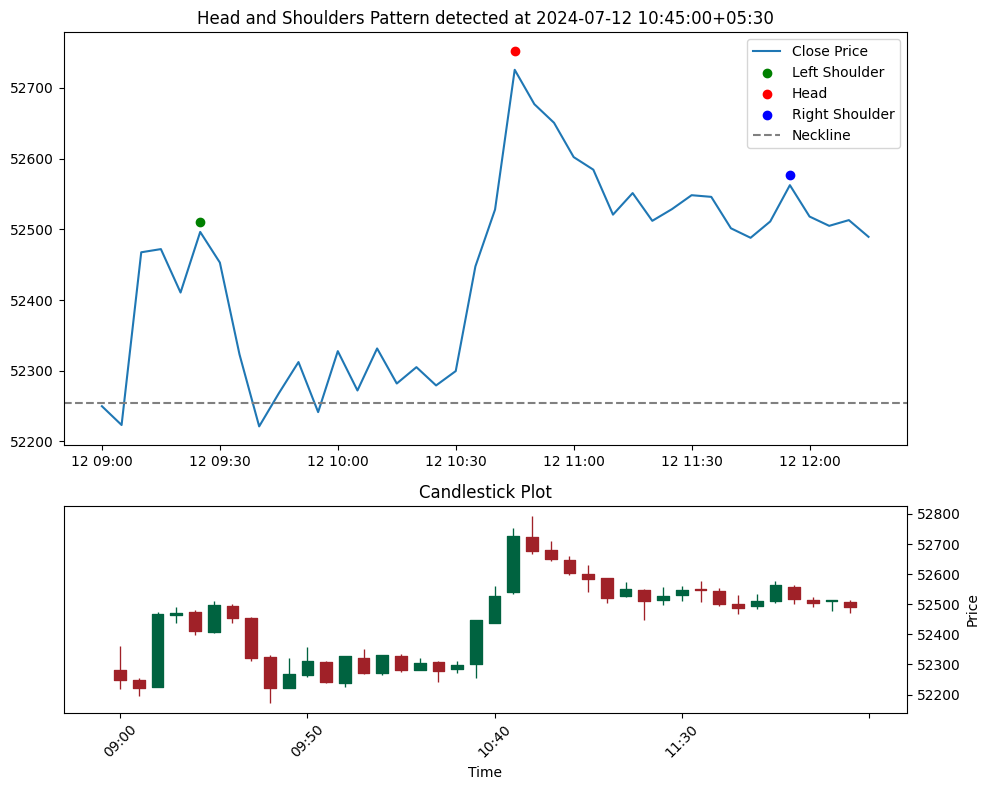

Left Shoulder: (187, Timestamp('2024-07-12 11:55:00+0530', tz='UTC+05:30'), 52576.6), Head: (203, Timestamp('2024-07-12 13:15:00+0530', tz='UTC+05:30'), 52616.7), Right Shoulder: (214, Timestamp('2024-07-12 14:10:00+0530', tz='UTC+05:30'), 52538.55), Neckline Level: 52537.0


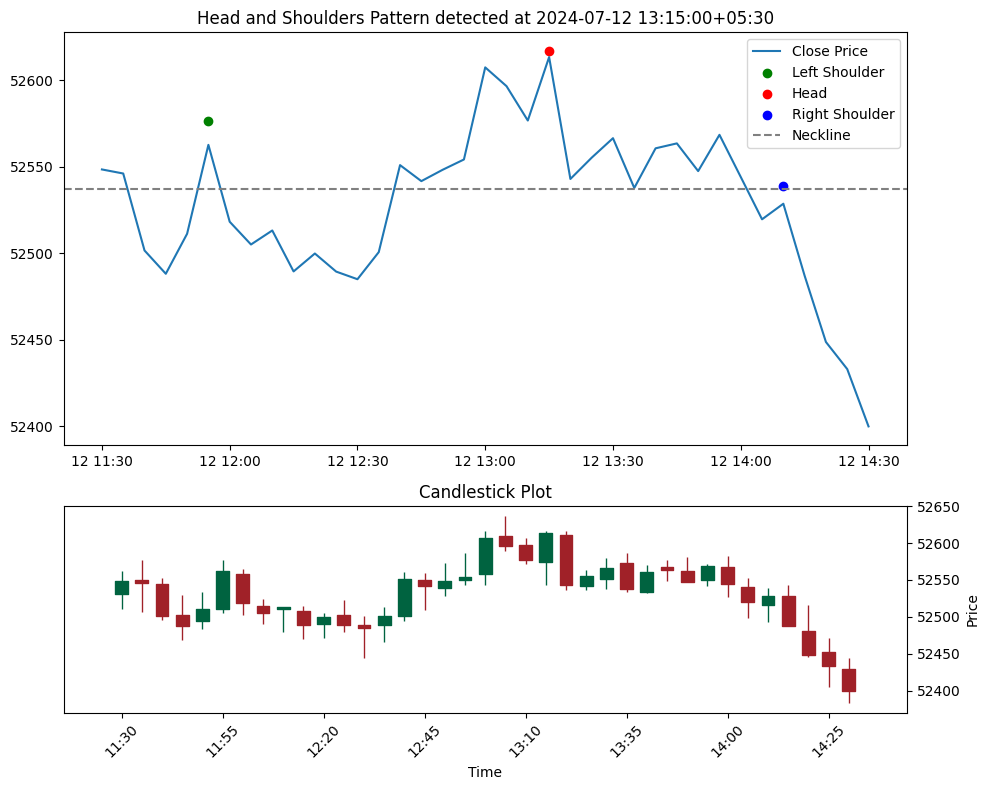

Left Shoulder: (230, Timestamp('2024-07-15 09:10:00+0530', tz='UTC+05:30'), 52409.45), Head: (245, Timestamp('2024-07-15 10:25:00+0530', tz='UTC+05:30'), 52516.4), Right Shoulder: (258, Timestamp('2024-07-15 11:30:00+0530', tz='UTC+05:30'), 52437.9), Neckline Level: 52249.2


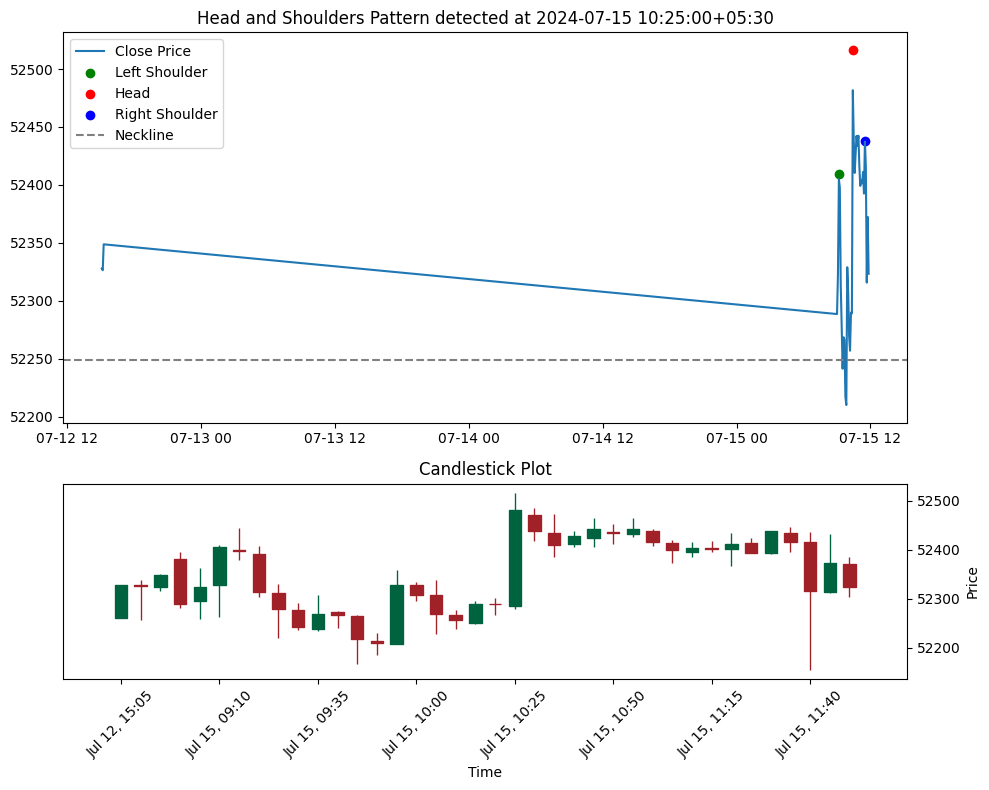

Left Shoulder: (270, Timestamp('2024-07-15 12:30:00+0530', tz='UTC+05:30'), 52330.25), Head: (282, Timestamp('2024-07-15 13:30:00+0530', tz='UTC+05:30'), 52662.25), Right Shoulder: (294, Timestamp('2024-07-15 14:30:00+0530', tz='UTC+05:30'), 52586.2), Neckline Level: 52543.3


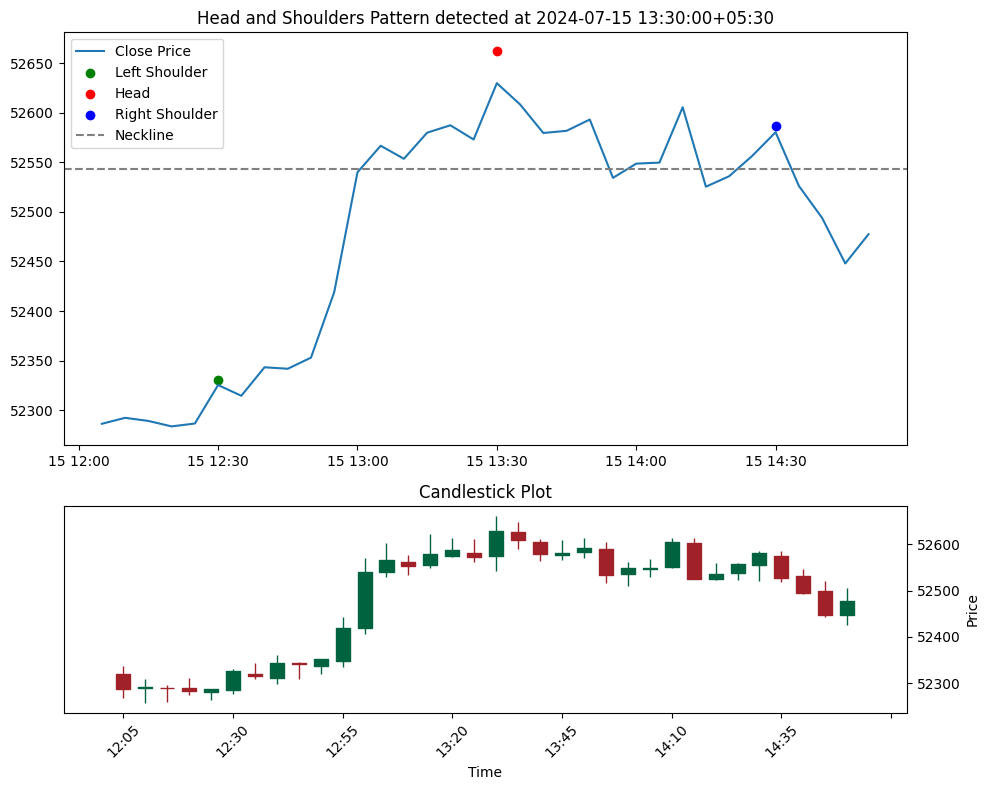

In [6]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import mplfinance as mpf
import peakutils

# Load the data
file_path = r"D:\AlgoT\stock-pattern-main\stock-pattern-main\banknifty data\bnf.csv"
data = pd.read_csv(file_path)
data['Datetime'] = pd.to_datetime(data['Datetime'])

# Resample to 5-minute intervals
data.set_index('Datetime', inplace=True)
data_15min = data.resample('5T').agg({
    'Open': 'first',
    'High': 'max',
    'Low': 'min',
    'Close': 'last'
}).dropna()

# Function to find peaks and troughs in the data
def find_peaks_and_troughs(data):
    close_prices = data['Close']
    peak_indexes = peakutils.indexes(np.array(close_prices), thres=0.5, min_dist=10)
    trough_indexes = peakutils.indexes(np.array(-close_prices), thres=0.5, min_dist=10)
    
    peaks = [(idx, data.index[idx], data['High'][idx]) for idx in peak_indexes]
    troughs = [(idx, data.index[idx], data['Low'][idx]) for idx in trough_indexes]
    return peaks, troughs

# Function to detect Head and Shoulders patterns
def detect_head_and_shoulders(peaks, troughs):
    patterns = []
    for i in range(1, len(peaks) - 1):
        left_shoulder = peaks[i-1]
        head = peaks[i]
        right_shoulder = peaks[i+1]
        
        # Calculate time duration between shoulders
        left_duration = (head[1] - left_shoulder[1]).total_seconds() / 3600  # in hours
        right_duration = (right_shoulder[1] - head[1]).total_seconds() / 3600  # in hours
        
        # Check if the durations are within the 1:1.5 ratio
        if min(left_duration, right_duration) * 1.5 < max(left_duration, right_duration):
            continue
        
        # Check if head is higher than shoulders and shoulders are approximately equal in height
        if left_shoulder[2] < head[2] and right_shoulder[2] < head[2] and \
           abs(left_shoulder[2] - right_shoulder[2]) < 0.01 * head[2]:  # Adjust tolerance as needed
            
            # Identify low prices around the head
            head_idx = head[0]
            low_prices_around_head = data_15min['Low'][head_idx-2:head_idx+3]  # Adjust range as needed
            
            # Choose the minimum low price as the neckline
            neckline_level = low_prices_around_head.min()
            
            # Calculate the size of the head (max - min price)
            head_size = data_15min['High'][head_idx] - data_15min['Low'][head_idx]
            
            # Check if the market falls more than the size of the head before the next shoulder forms
            pre_right_shoulder_low = data_15min['Low'][head_idx+1:right_shoulder[0]].min()
            if pre_right_shoulder_low < data_15min['Low'][head_idx] - head_size:
                continue
            
            patterns.append({
                'left_shoulder': left_shoulder,
                'head': head,
                'right_shoulder': right_shoulder,
                'neckline_level': neckline_level
            })
    return patterns

# Find peaks and troughs in 15-minute data
peaks, troughs = find_peaks_and_troughs(data_15min)

# Detect Head and Shoulders patterns in 15-minute data
patterns = detect_head_and_shoulders(peaks, troughs)

# Display detected patterns and plot the chart
for pattern in patterns:
    print(f"Left Shoulder: {pattern['left_shoulder']}, Head: {pattern['head']}, Right Shoulder: {pattern['right_shoulder']}, Neckline Level: {pattern['neckline_level']}")

    start_index = max(0, pattern['left_shoulder'][0] - 5)
    end_index = min(len(data_15min) - 1, pattern['right_shoulder'][0] + 5)
    pattern_data = data_15min.iloc[start_index:end_index]

    # Setup figure and subplots
    fig, (ax, ax2) = plt.subplots(2, 1, figsize=(10, 8), gridspec_kw={'height_ratios': [2, 1]})

    # First subplot for the pattern
    ax.plot(pattern_data.index, pattern_data['Close'], label='Close Price')
    ax.scatter(pattern['left_shoulder'][1], pattern['left_shoulder'][2], color='green', label='Left Shoulder')
    ax.scatter(pattern['head'][1], pattern['head'][2], color='red', label='Head')
    ax.scatter(pattern['right_shoulder'][1], pattern['right_shoulder'][2], color='blue', label='Right Shoulder')
    ax.axhline(y=pattern['neckline_level'], color='gray', linestyle='--', label='Neckline')
    ax.set_title(f"Head and Shoulders Pattern detected at {pattern['head'][1]}")
    ax.legend()

    # Second subplot for candlestick
    mpf.plot(pattern_data, type='candle', ax=ax2, style='charles')
    ax2.set_xlabel('Time')
    ax2.set_ylabel('Price')
    ax2.set_title('Candlestick Plot')

    plt.xticks(rotation=45)
    plt.tight_layout()
    plt.show()


In [2]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import mplfinance as mpf

def find_wedges(data, lookback=20):
    wedges = []
    for i in range(lookback, len(data)):
        max_high = data['High'][i-lookback:i].max()
        min_low = data['Low'][i-lookback:i].min()
        
        upper_line = np.polyfit(range(lookback), data['High'][i-lookback:i], 1)
        lower_line = np.polyfit(range(lookback), data['Low'][i-lookback:i], 1)
        
        upper_slope = upper_line[0]
        lower_slope = lower_line[0]
        
        if upper_slope < 0 and lower_slope < 0:
            if abs(upper_slope) < abs(lower_slope):
                wedges.append((data['Date'][i], 'Rising Wedge'))
            else:
                wedges.append((data['Date'][i], 'Falling Wedge'))
                
    return wedges

def plot_wedges(data, wedges, lookback=20):
    for date, pattern in wedges:
        end_idx = data[data['Date'] == date].index[0]
        start_idx = end_idx - lookback
        
        fig, ax = plt.subplots(1, 1, figsize=(14, 7))
        mpf.plot(data.iloc[start_idx:end_idx], type='candle', ax=ax)
        
        if pattern == 'Rising Wedge':
            color = 'red'
        else:
            color = 'blue'
        
        ax.plot(data['Date'][start_idx:end_idx], data['High'][start_idx:end_idx], color=color, linestyle='--', alpha=0.7)
        ax.plot(data['Date'][start_idx:end_idx], data['Low'][start_idx:end_idx], color=color, linestyle='--', alpha=0.7)
        
        ax.annotate(pattern, (data['Date'][end_idx-1], data['Close'][end_idx-1]), textcoords="offset points", xytext=(0,10), ha='center', fontsize=12, color=color)

        plt.title(f'{pattern} detected on {date.strftime("%Y-%m-%d")}')
        plt.show()

# Load your data
data_path = r"D:\AlgoT\stock-pattern-main\stock-pattern-main\banknifty data\sbin.csv"       
data = pd.read_csv(data_path, parse_dates=['Date'])
data['Date']=data['Datetime']

# Find wedges
wedges = find_wedges(data)

# Display results
for wedge in wedges:
    print(wedge)

# Plot wedges
plot_wedges(data, wedges)


ValueError: Missing column provided to 'parse_dates': 'Date'

C:\Users\Aviral Mishra\AppData\Local\Temp\ipykernel_19148\3324637670.py:19: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  peaks = [(idx, data.index[idx], data['High'][idx]) for idx in peak_indexes]
C:\Users\Aviral Mishra\AppData\Local\Temp\ipykernel_19148\3324637670.py:20: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  troughs = [(idx, data.index[idx], data['Low'][idx]) for idx in trough_indexes]
C:\Users\Aviral Mishra\AppData\Local\Temp\ipykernel_19148\3324637670.py:51: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consi

Left Shoulder: (7769, Timestamp('2024-04-29 13:30:00+0530', tz='UTC+05:30'), 829.0), Head: (7783, Timestamp('2024-04-29 13:44:00+0530', tz='UTC+05:30'), 830.95), Right Shoulder: (7798, Timestamp('2024-04-29 13:59:00+0530', tz='UTC+05:30'), 829.6), Neckline Level: 825.1


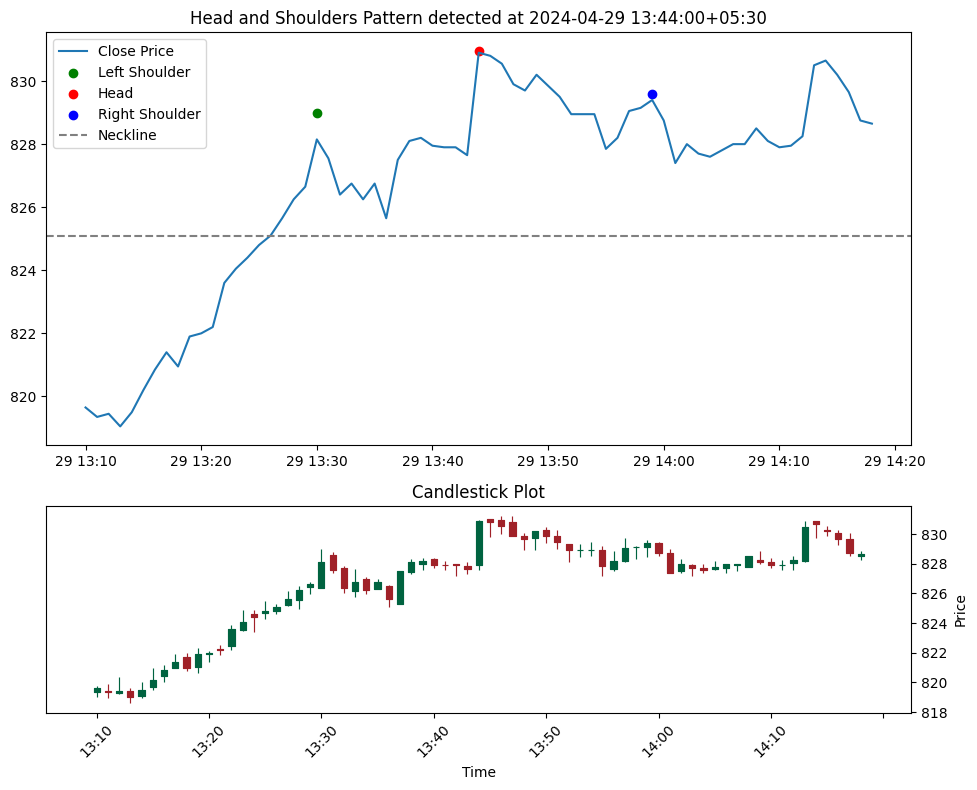

Left Shoulder: (8071, Timestamp('2024-04-30 12:17:00+0530', tz='UTC+05:30'), 827.95), Head: (8086, Timestamp('2024-04-30 12:32:00+0530', tz='UTC+05:30'), 829.35), Right Shoulder: (8097, Timestamp('2024-04-30 12:43:00+0530', tz='UTC+05:30'), 828.0), Neckline Level: 825.7


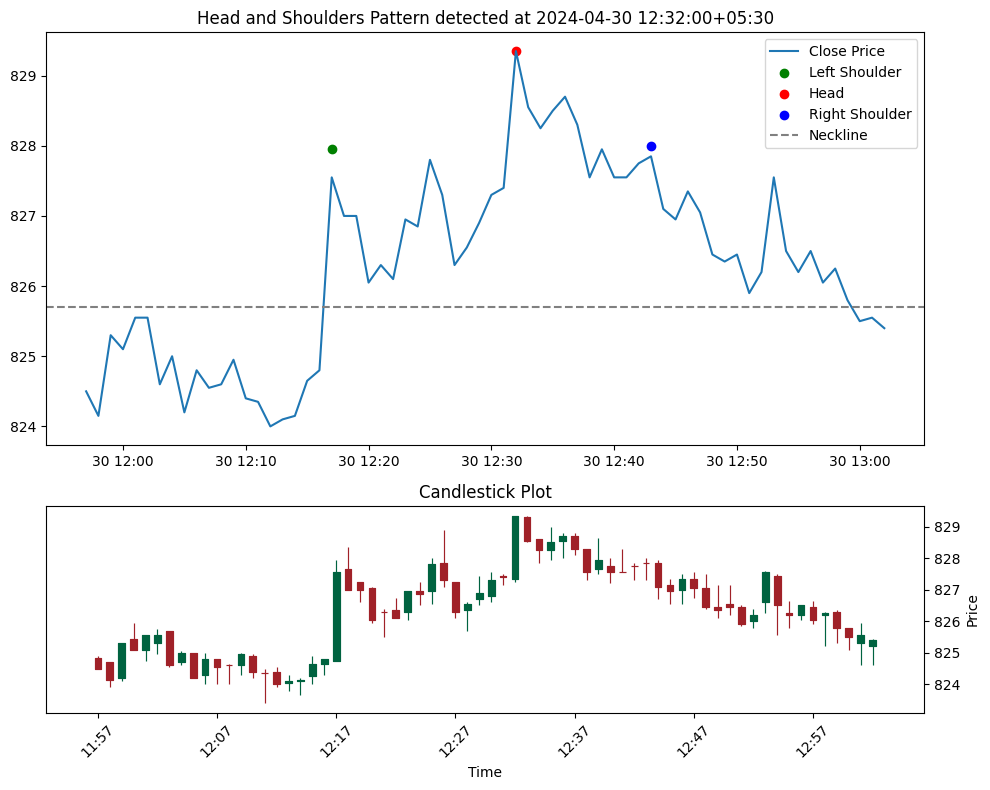

Left Shoulder: (8435, Timestamp('2024-05-02 12:06:00+0530', tz='UTC+05:30'), 830.4), Head: (8446, Timestamp('2024-05-02 12:17:00+0530', tz='UTC+05:30'), 831.4), Right Shoulder: (8460, Timestamp('2024-05-02 12:31:00+0530', tz='UTC+05:30'), 830.7), Neckline Level: 829.75


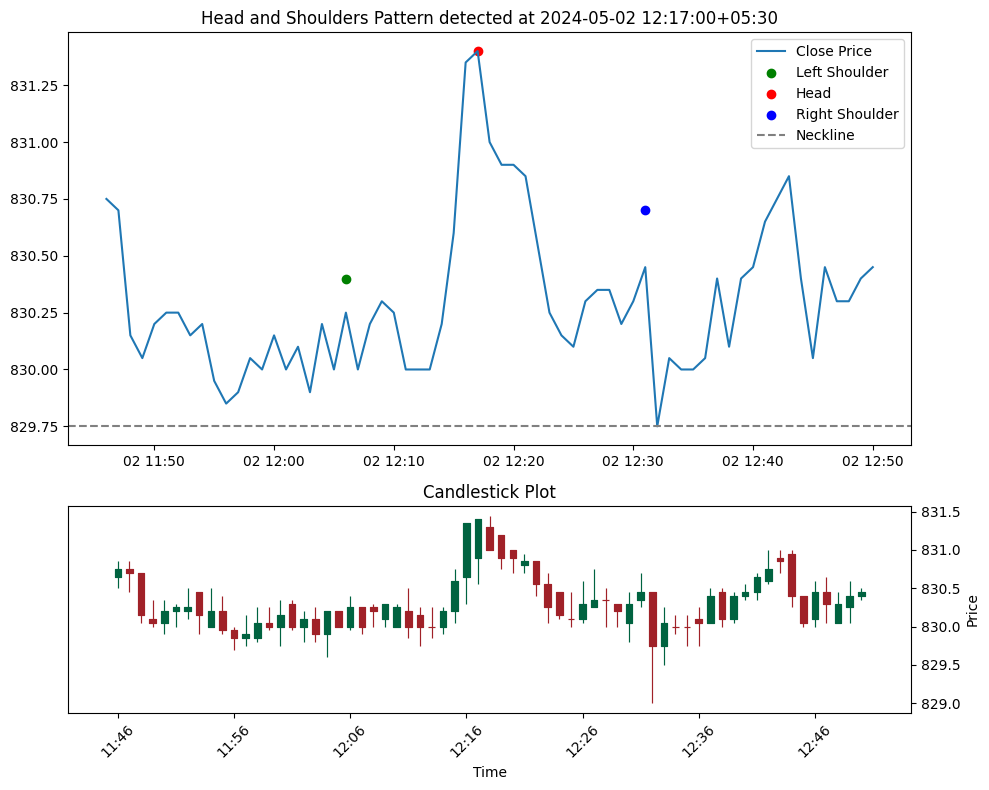

Left Shoulder: (8587, Timestamp('2024-05-02 14:38:00+0530', tz='UTC+05:30'), 830.35), Head: (8604, Timestamp('2024-05-02 14:55:00+0530', tz='UTC+05:30'), 830.5), Right Shoulder: (8618, Timestamp('2024-05-02 15:09:00+0530', tz='UTC+05:30'), 830.05), Neckline Level: 829.15


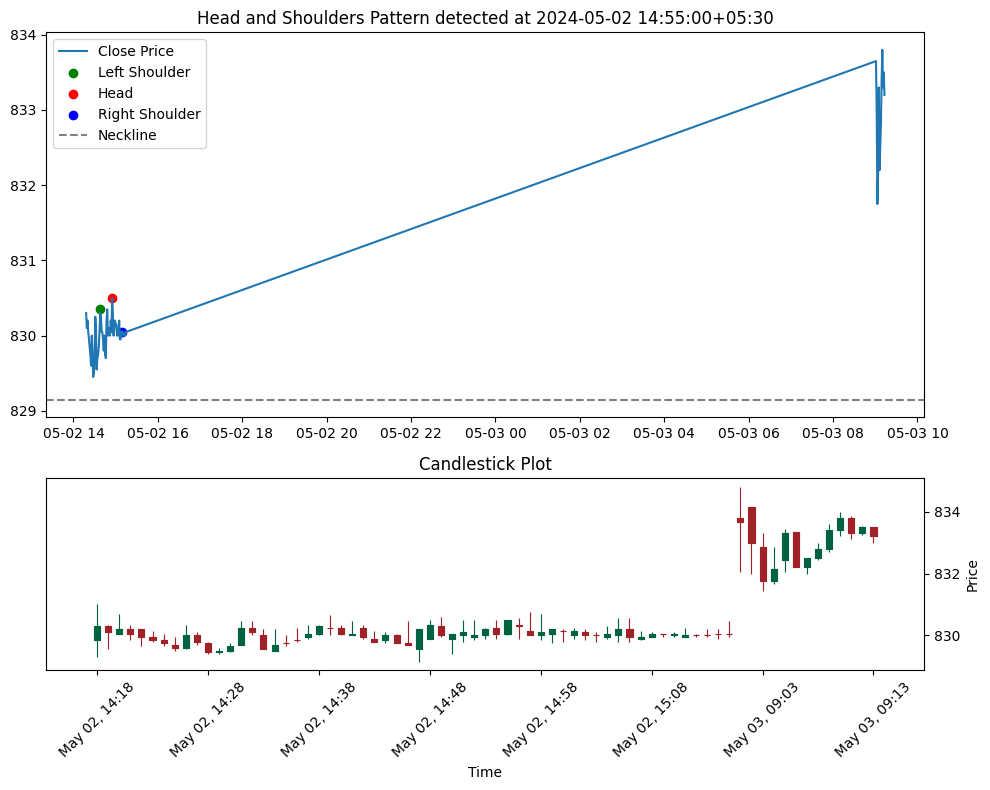

Left Shoulder: (11938, Timestamp('2024-05-15 14:14:00+0530', tz='UTC+05:30'), 821.0), Head: (11949, Timestamp('2024-05-15 14:25:00+0530', tz='UTC+05:30'), 822.7), Right Shoulder: (11961, Timestamp('2024-05-15 14:37:00+0530', tz='UTC+05:30'), 822.2), Neckline Level: 820.5


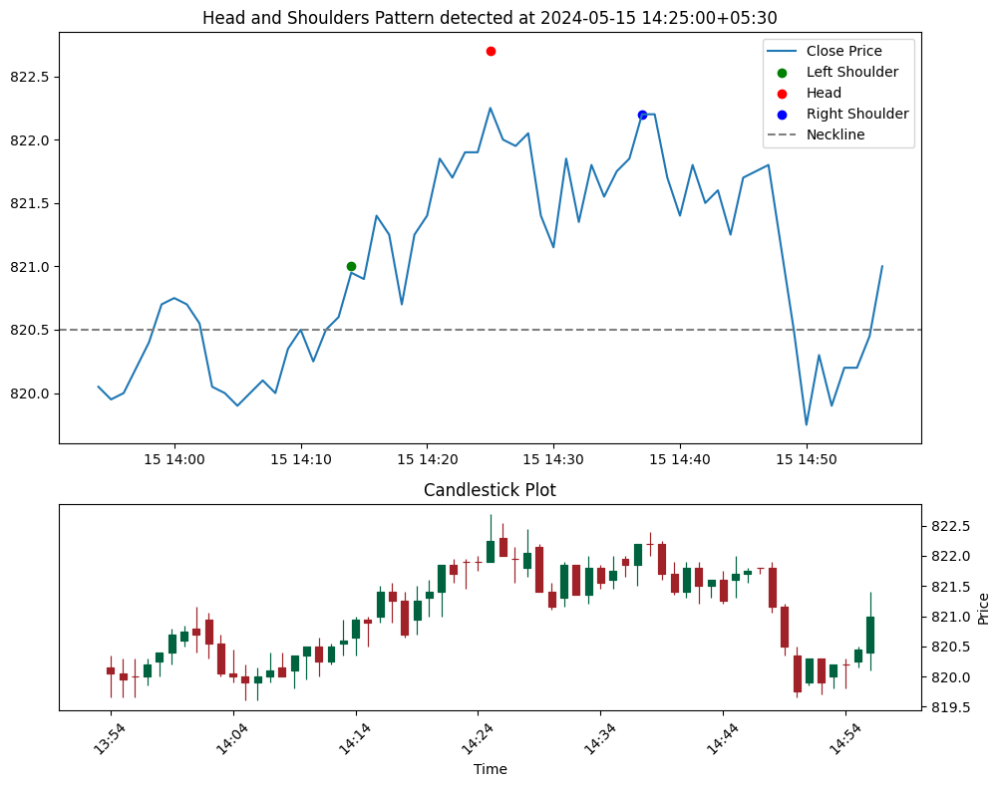

Left Shoulder: (14404, Timestamp('2024-05-27 11:35:00+0530', tz='UTC+05:30'), 830.75), Head: (14419, Timestamp('2024-05-27 11:50:00+0530', tz='UTC+05:30'), 836.55), Right Shoulder: (14432, Timestamp('2024-05-27 12:03:00+0530', tz='UTC+05:30'), 835.85), Neckline Level: 830.5


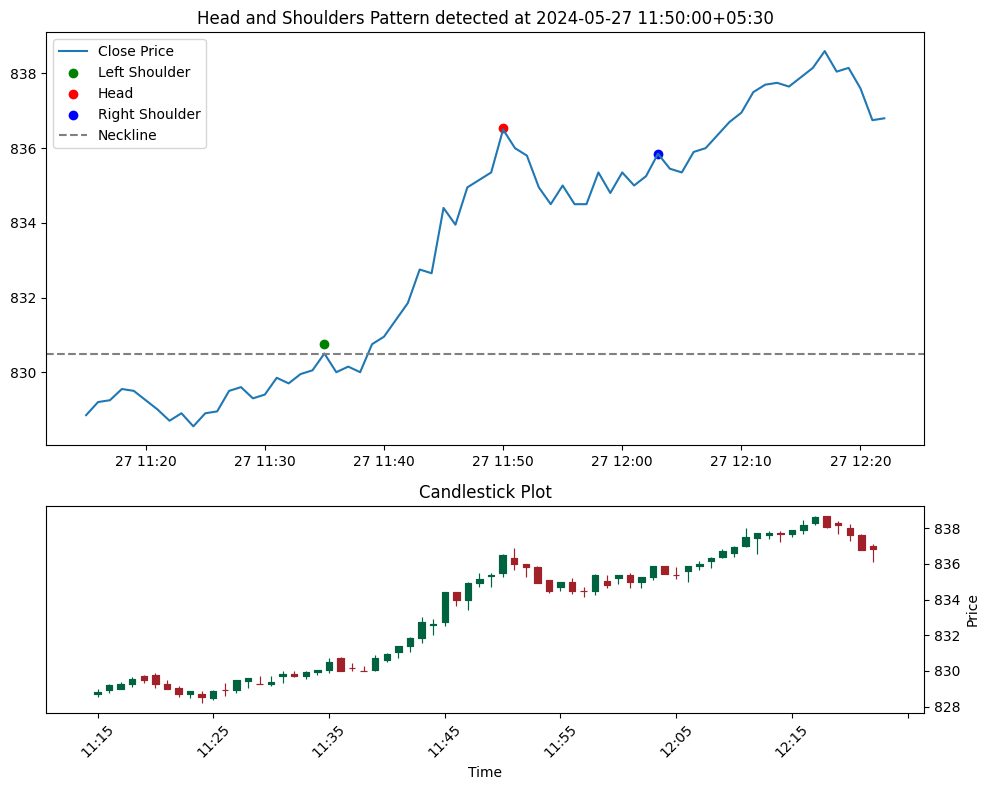

Left Shoulder: (14583, Timestamp('2024-05-27 14:34:00+0530', tz='UTC+05:30'), 835.8), Head: (14597, Timestamp('2024-05-27 14:48:00+0530', tz='UTC+05:30'), 836.0), Right Shoulder: (14615, Timestamp('2024-05-27 15:06:00+0530', tz='UTC+05:30'), 834.95), Neckline Level: 830.75


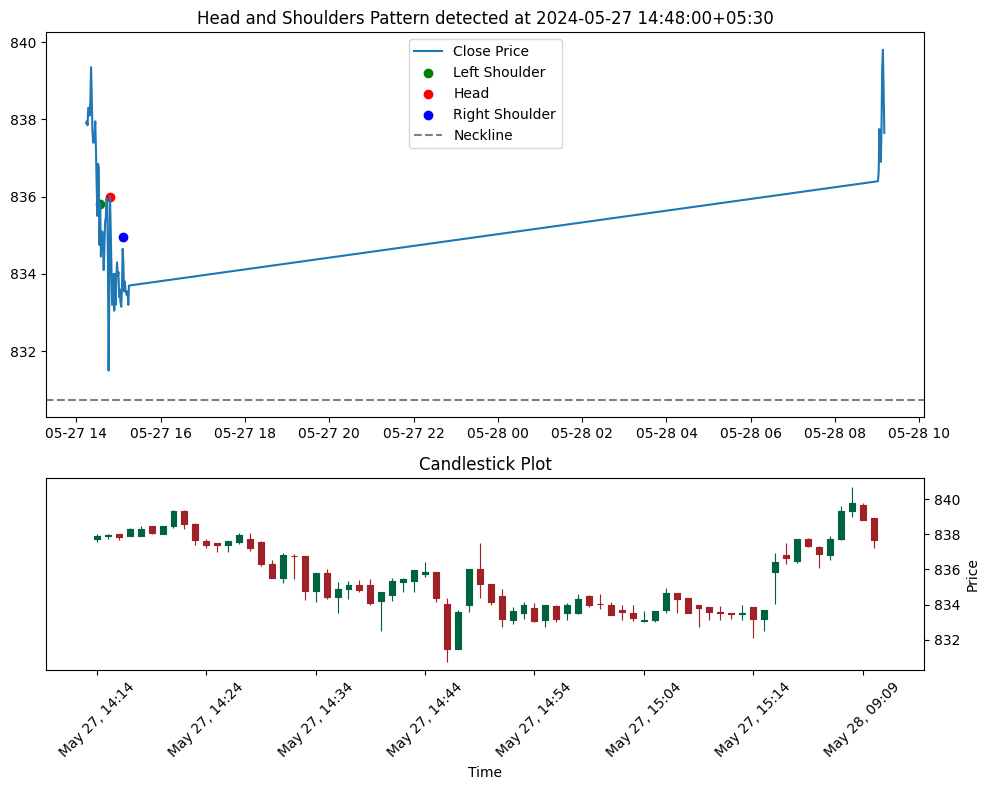

Left Shoulder: (15225, Timestamp('2024-05-29 12:46:00+0530', tz='UTC+05:30'), 826.2), Head: (15237, Timestamp('2024-05-29 12:58:00+0530', tz='UTC+05:30'), 826.95), Right Shoulder: (15248, Timestamp('2024-05-29 13:09:00+0530', tz='UTC+05:30'), 826.4), Neckline Level: 825.35


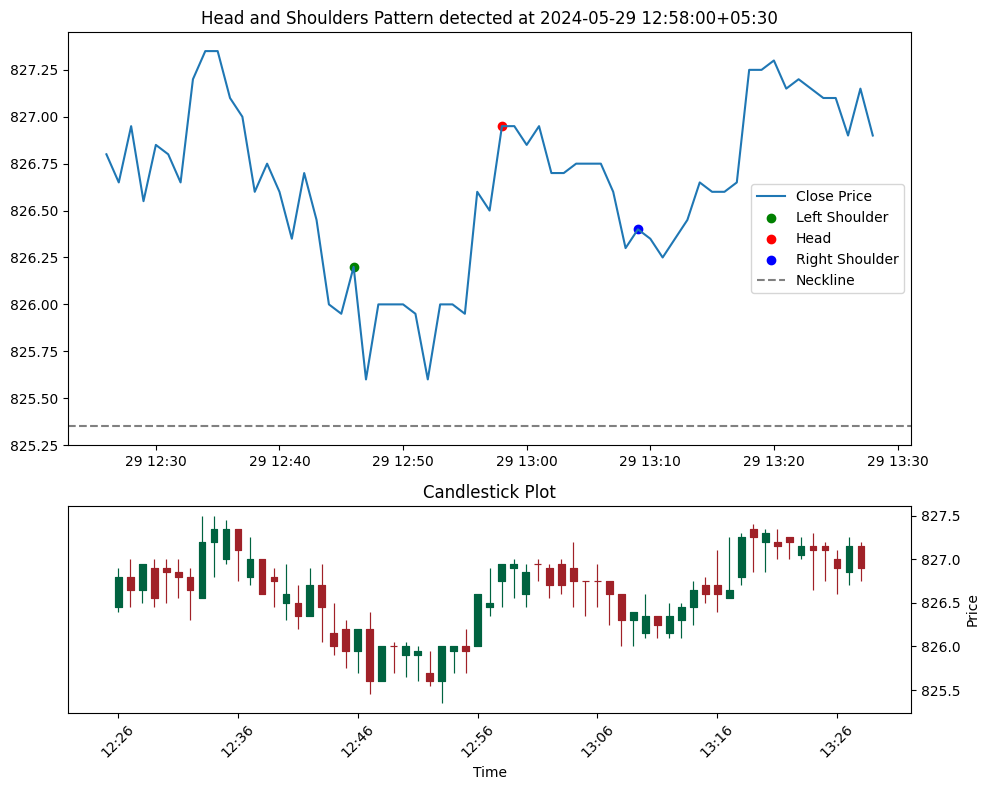

Left Shoulder: (15440, Timestamp('2024-05-30 10:06:00+0530', tz='UTC+05:30'), 828.25), Head: (15456, Timestamp('2024-05-30 10:22:00+0530', tz='UTC+05:30'), 828.6), Right Shoulder: (15473, Timestamp('2024-05-30 10:39:00+0530', tz='UTC+05:30'), 827.7), Neckline Level: 826.6


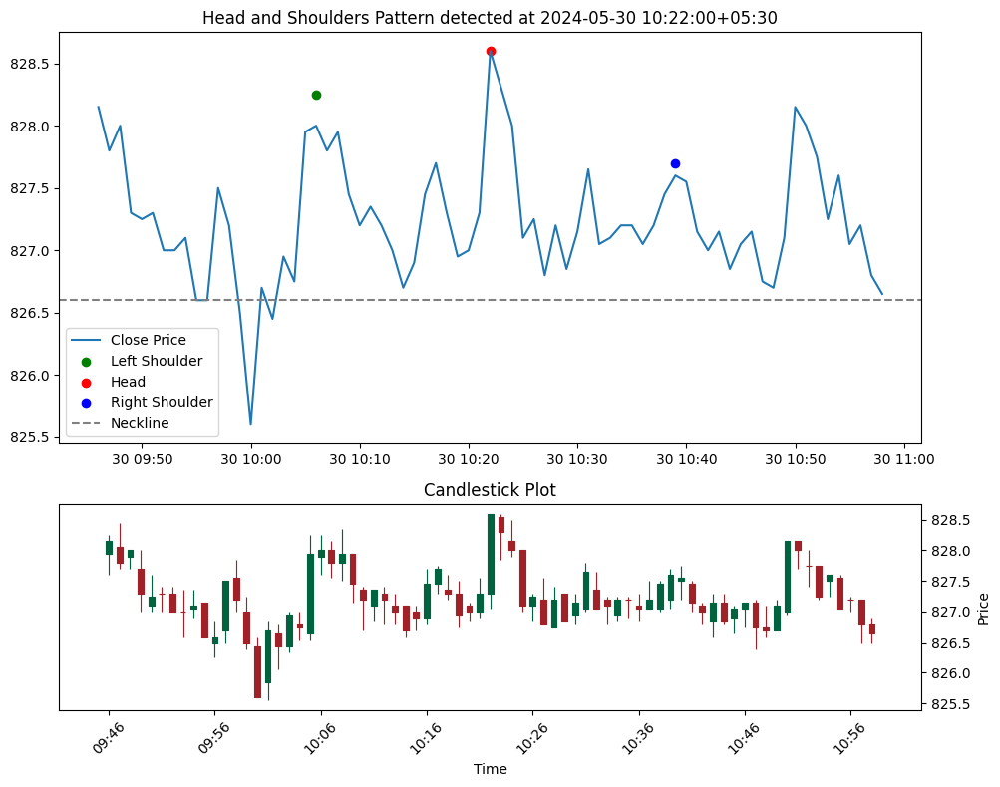

Left Shoulder: (17963, Timestamp('2024-06-07 14:39:00+0530', tz='UTC+05:30'), 828.15), Head: (17976, Timestamp('2024-06-07 14:52:00+0530', tz='UTC+05:30'), 830.8), Right Shoulder: (17991, Timestamp('2024-06-07 15:07:00+0530', tz='UTC+05:30'), 830.3), Neckline Level: 827.1


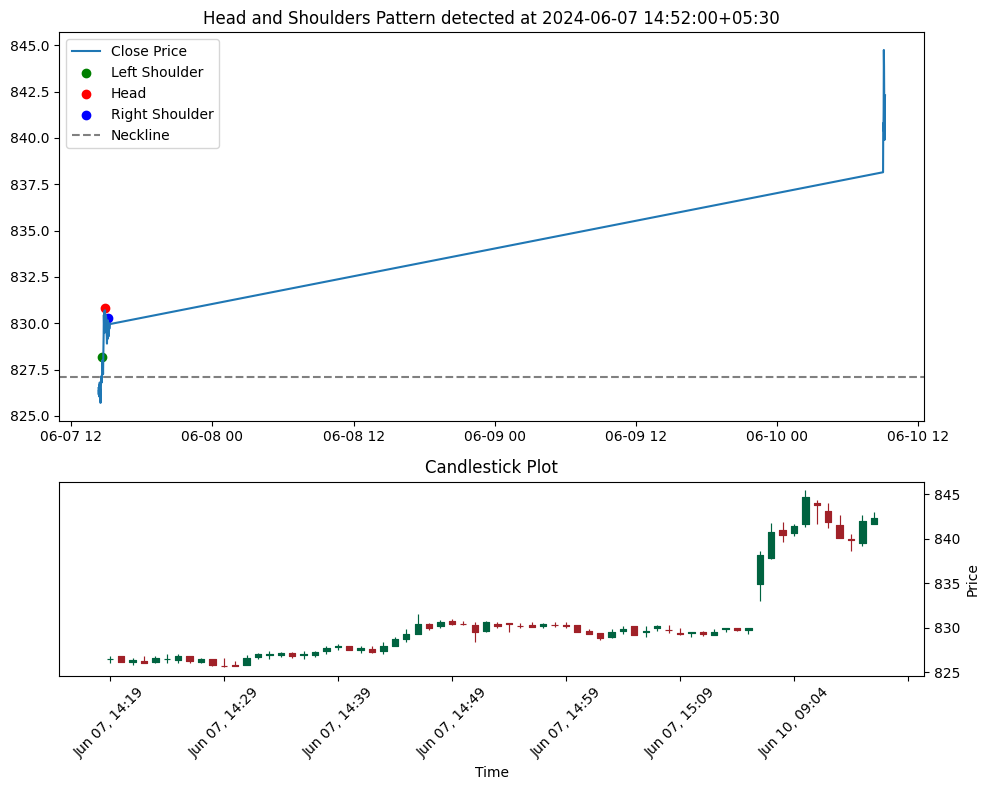

Left Shoulder: (18200, Timestamp('2024-06-10 12:21:00+0530', tz='UTC+05:30'), 836.25), Head: (18218, Timestamp('2024-06-10 12:39:00+0530', tz='UTC+05:30'), 838.0), Right Shoulder: (18230, Timestamp('2024-06-10 12:51:00+0530', tz='UTC+05:30'), 836.8), Neckline Level: 835.8


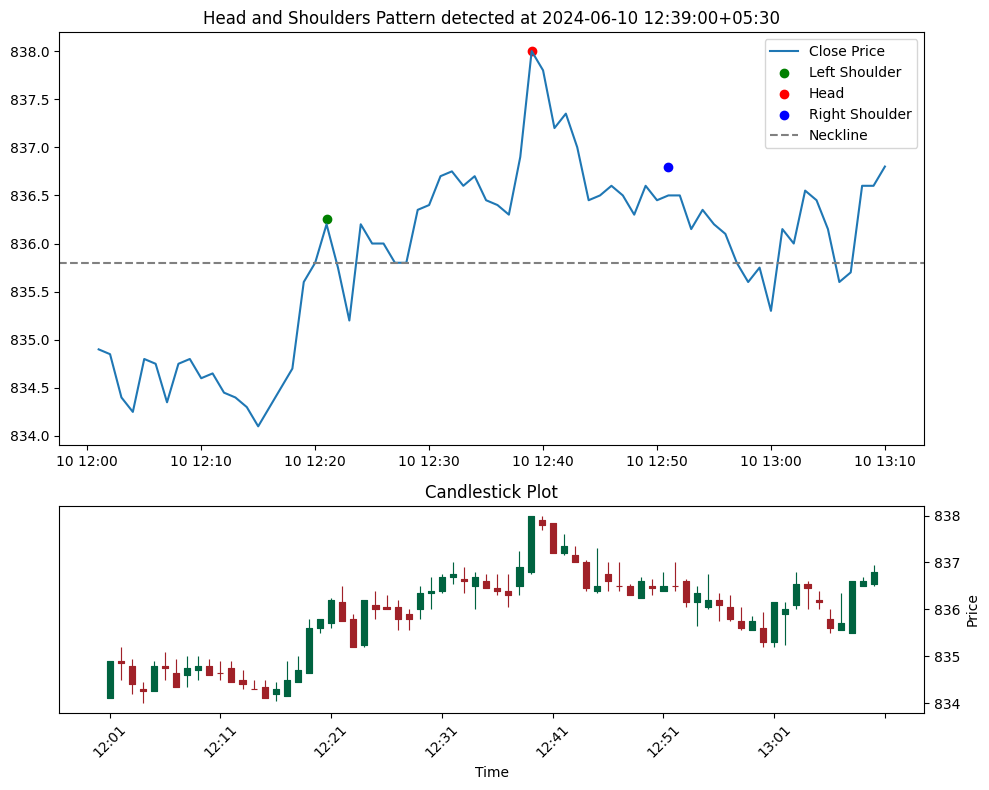

Left Shoulder: (18415, Timestamp('2024-06-11 09:41:00+0530', tz='UTC+05:30'), 835.0), Head: (18430, Timestamp('2024-06-11 09:56:00+0530', tz='UTC+05:30'), 837.3), Right Shoulder: (18448, Timestamp('2024-06-11 10:14:00+0530', tz='UTC+05:30'), 835.8), Neckline Level: 832.5


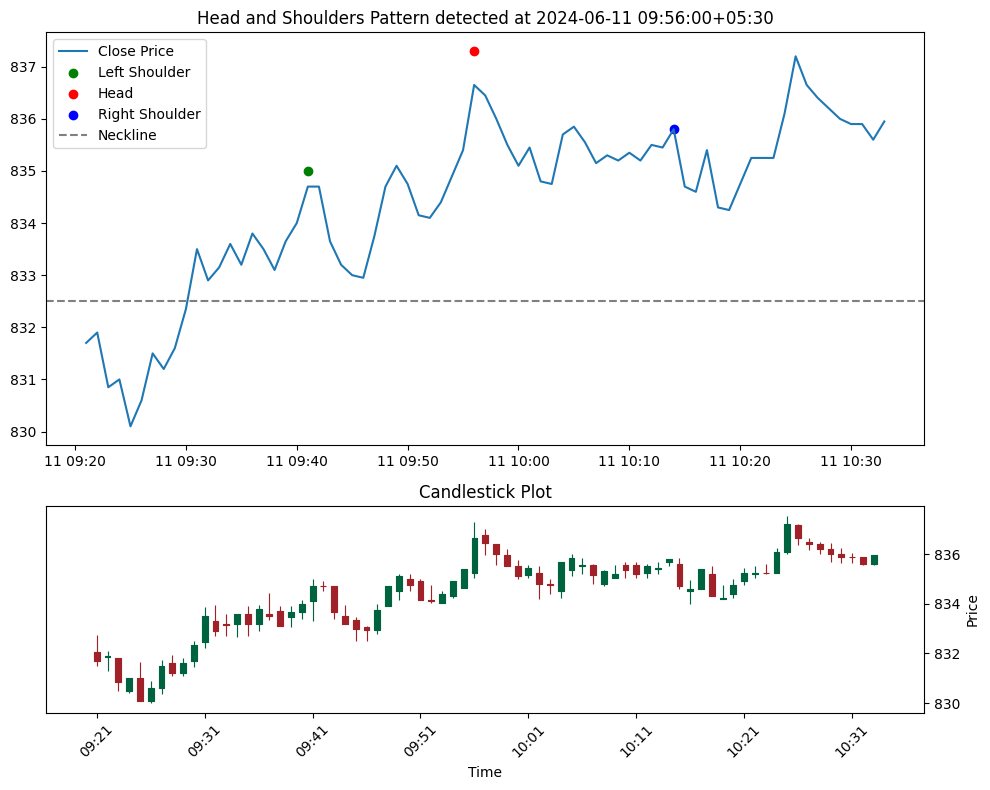

Left Shoulder: (18448, Timestamp('2024-06-11 10:14:00+0530', tz='UTC+05:30'), 835.8), Head: (18459, Timestamp('2024-06-11 10:25:00+0530', tz='UTC+05:30'), 837.55), Right Shoulder: (18472, Timestamp('2024-06-11 10:38:00+0530', tz='UTC+05:30'), 836.6), Neckline Level: 834.0


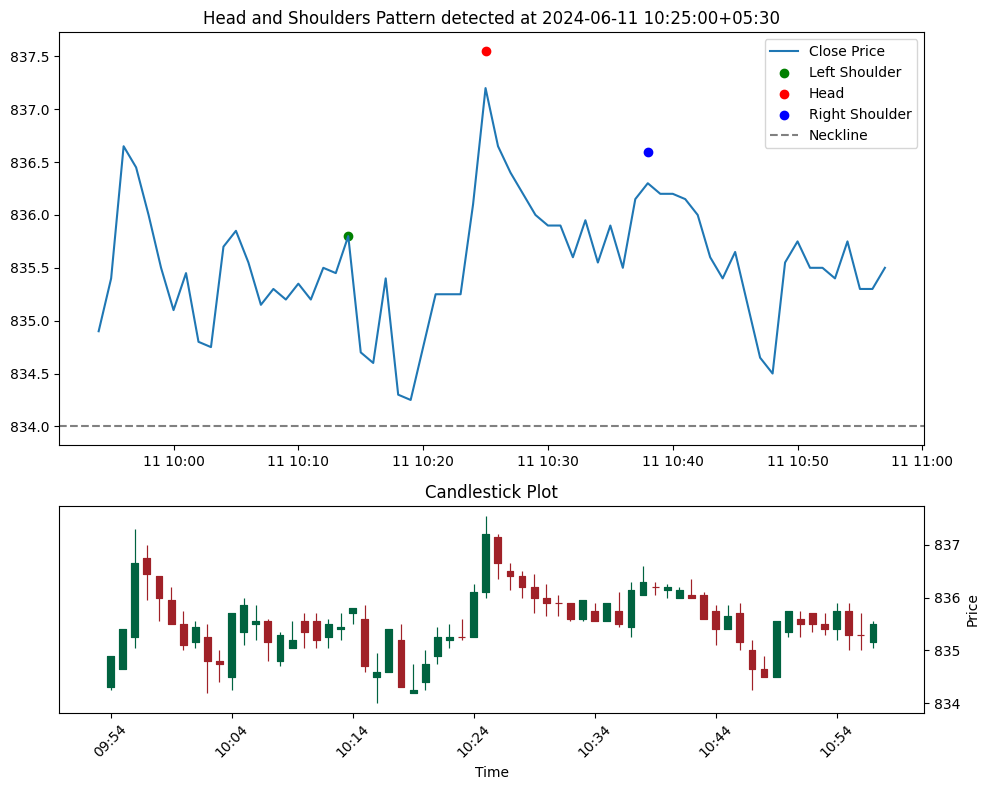

Left Shoulder: (18488, Timestamp('2024-06-11 10:54:00+0530', tz='UTC+05:30'), 835.9), Head: (18504, Timestamp('2024-06-11 11:10:00+0530', tz='UTC+05:30'), 836.5), Right Shoulder: (18526, Timestamp('2024-06-11 11:32:00+0530', tz='UTC+05:30'), 836.15), Neckline Level: 834.9


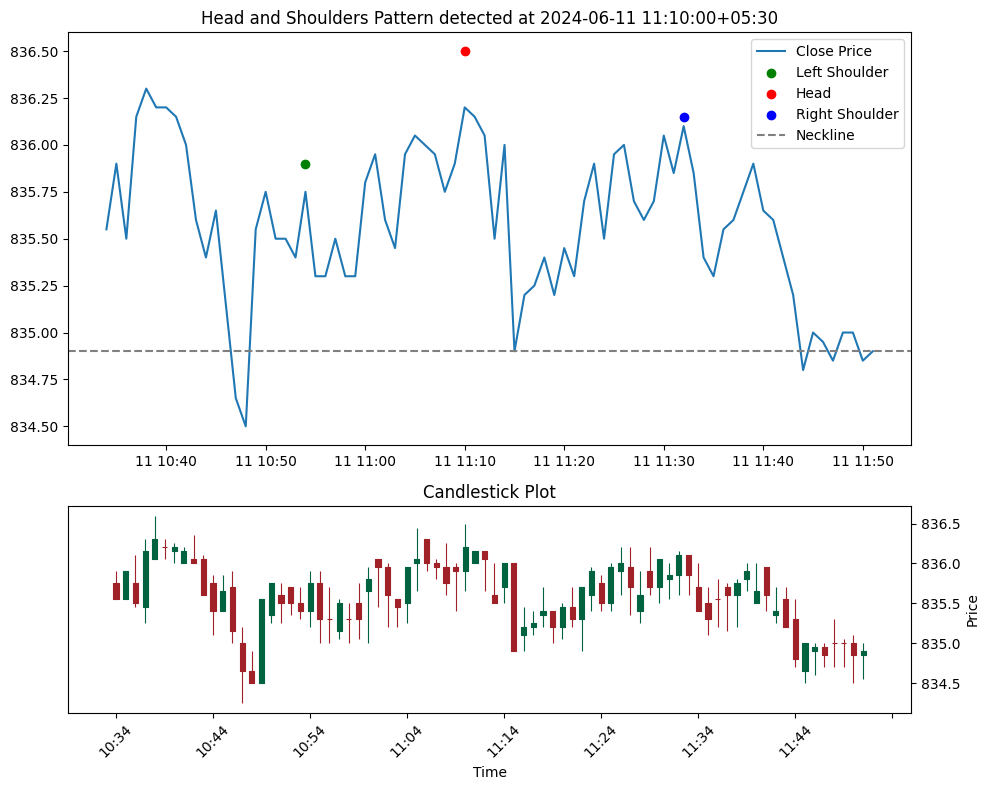

Left Shoulder: (19344, Timestamp('2024-06-13 12:40:00+0530', tz='UTC+05:30'), 842.8), Head: (19360, Timestamp('2024-06-13 12:56:00+0530', tz='UTC+05:30'), 842.95), Right Shoulder: (19377, Timestamp('2024-06-13 13:13:00+0530', tz='UTC+05:30'), 842.25), Neckline Level: 841.35


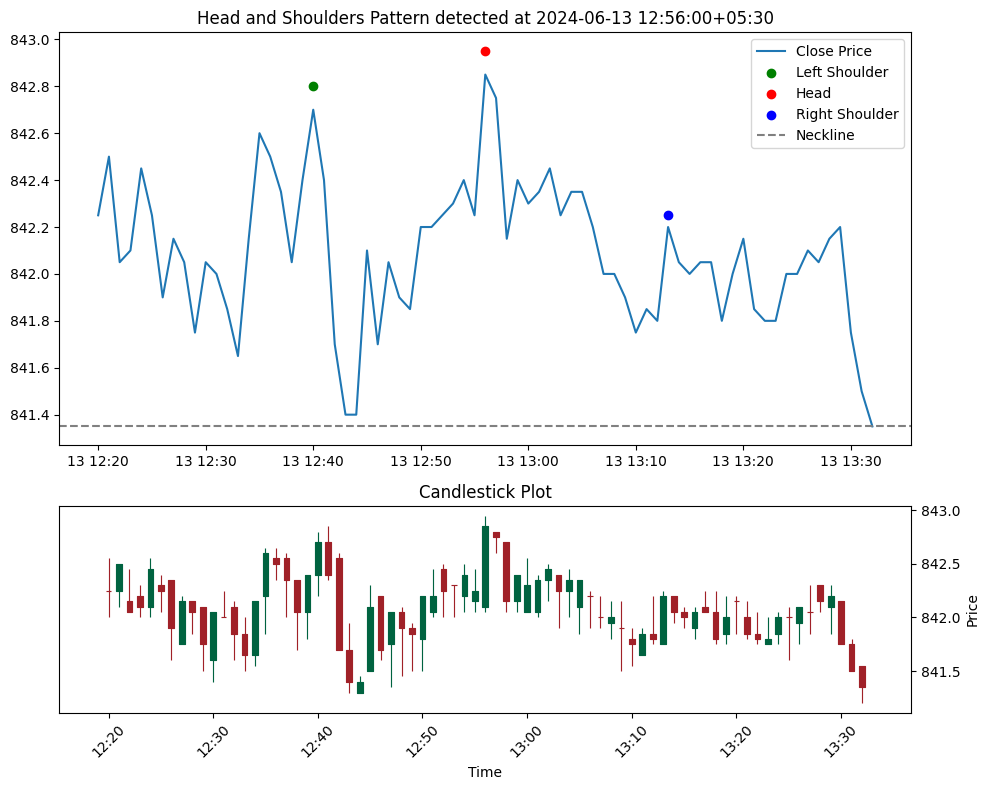

Left Shoulder: (19393, Timestamp('2024-06-13 13:29:00+0530', tz='UTC+05:30'), 842.3), Head: (19404, Timestamp('2024-06-13 13:40:00+0530', tz='UTC+05:30'), 842.85), Right Shoulder: (19417, Timestamp('2024-06-13 13:53:00+0530', tz='UTC+05:30'), 841.25), Neckline Level: 839.5


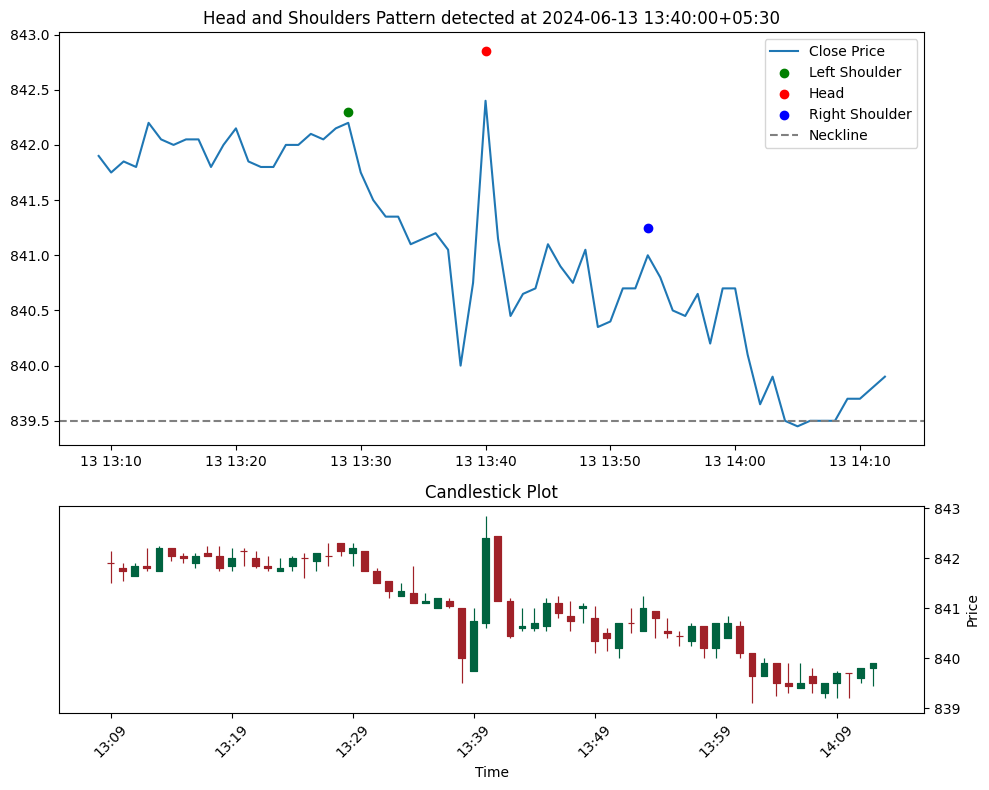

Left Shoulder: (19990, Timestamp('2024-06-18 10:56:00+0530', tz='UTC+05:30'), 849.0), Head: (20001, Timestamp('2024-06-18 11:07:00+0530', tz='UTC+05:30'), 850.35), Right Shoulder: (20013, Timestamp('2024-06-18 11:19:00+0530', tz='UTC+05:30'), 849.9), Neckline Level: 848.5


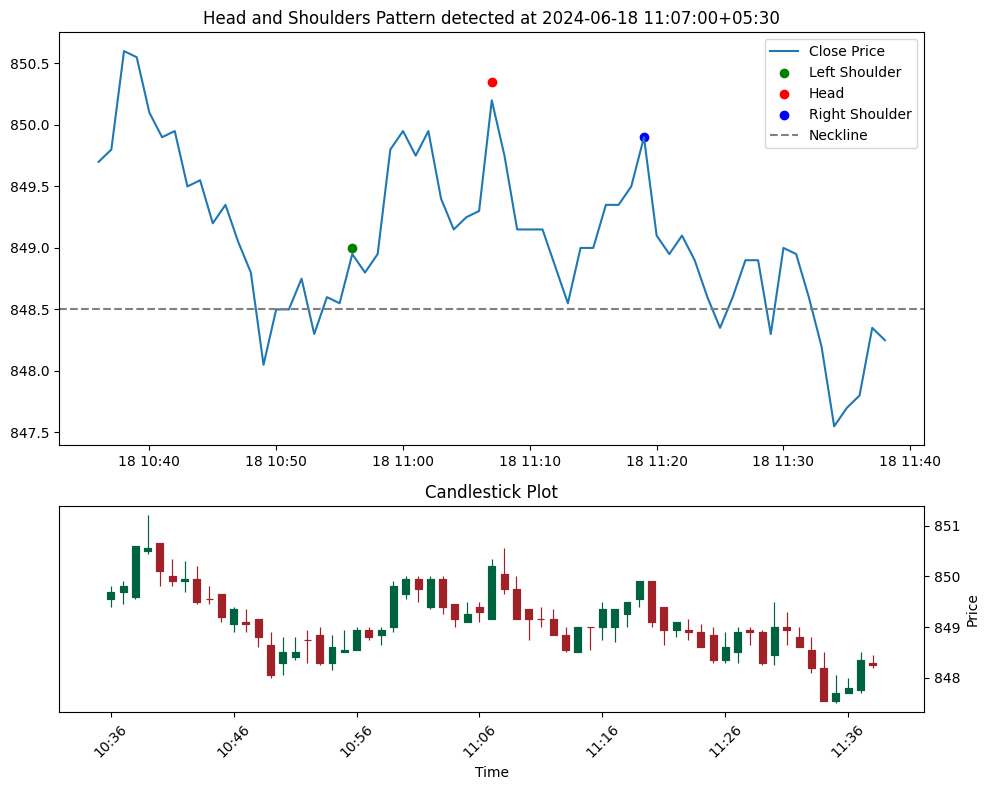

Left Shoulder: (20384, Timestamp('2024-06-19 11:15:00+0530', tz='UTC+05:30'), 845.8), Head: (20398, Timestamp('2024-06-19 11:29:00+0530', tz='UTC+05:30'), 850.0), Right Shoulder: (20411, Timestamp('2024-06-19 11:42:00+0530', tz='UTC+05:30'), 849.0), Neckline Level: 845.2


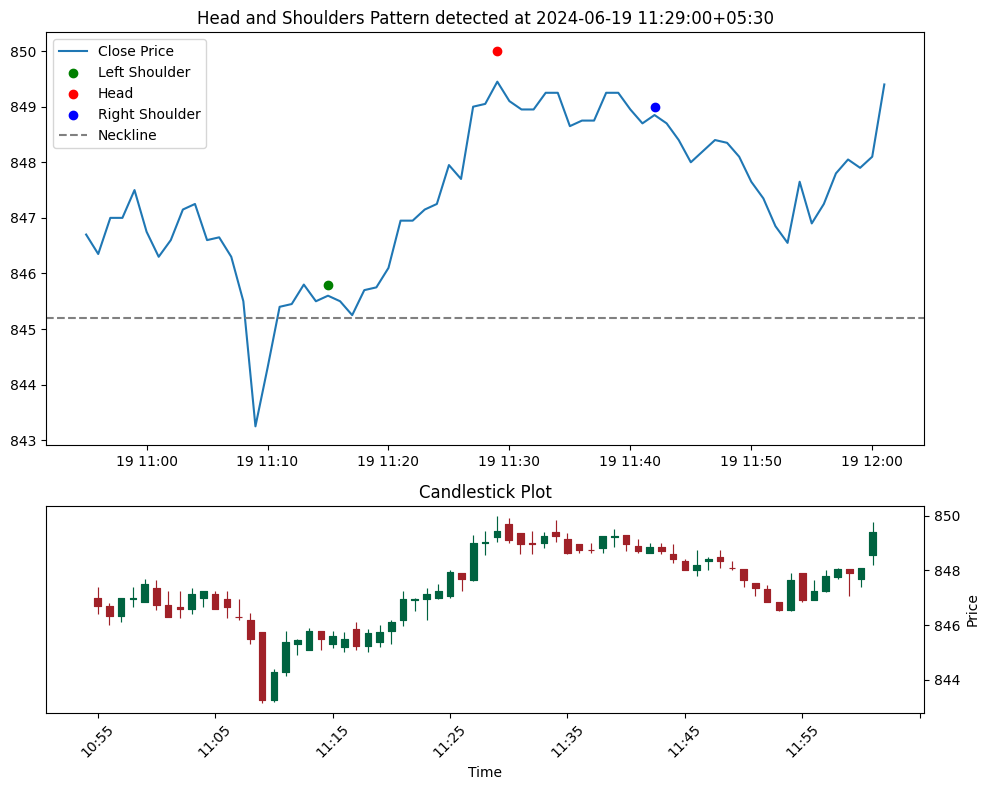

Left Shoulder: (21612, Timestamp('2024-06-24 12:58:00+0530', tz='UTC+05:30'), 835.1), Head: (21627, Timestamp('2024-06-24 13:13:00+0530', tz='UTC+05:30'), 836.0), Right Shoulder: (21647, Timestamp('2024-06-24 13:33:00+0530', tz='UTC+05:30'), 835.9), Neckline Level: 832.9


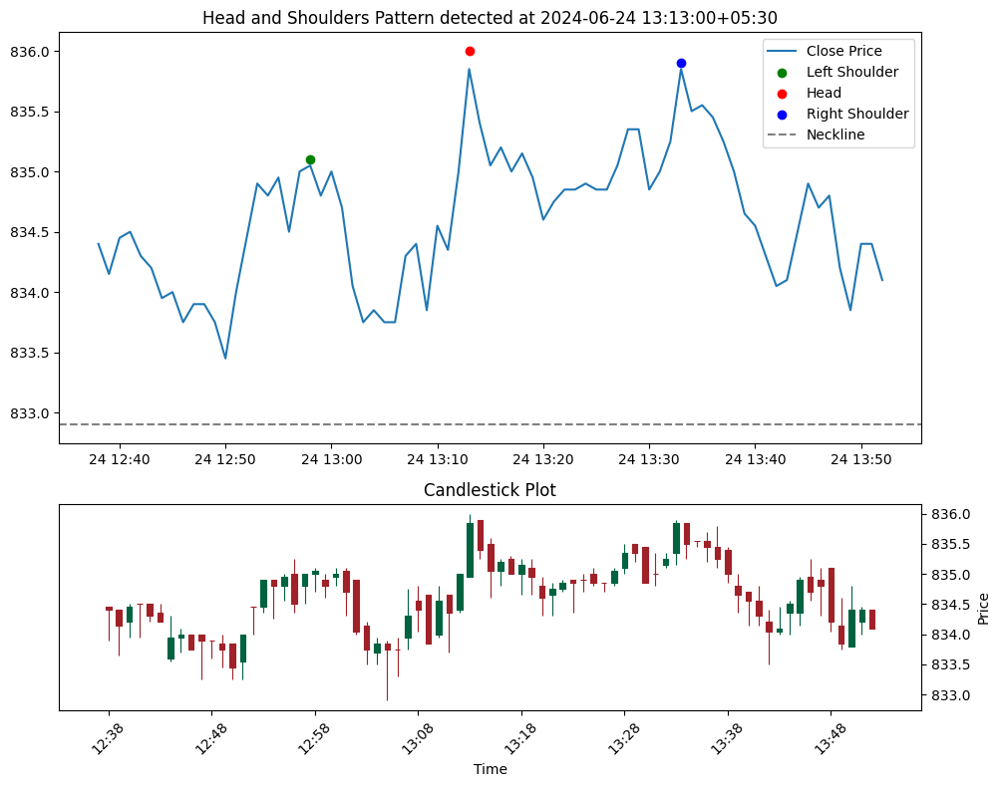

Left Shoulder: (22219, Timestamp('2024-06-26 10:35:00+0530', tz='UTC+05:30'), 839.9), Head: (22230, Timestamp('2024-06-26 10:46:00+0530', tz='UTC+05:30'), 842.9), Right Shoulder: (22241, Timestamp('2024-06-26 10:57:00+0530', tz='UTC+05:30'), 842.5), Neckline Level: 839.1


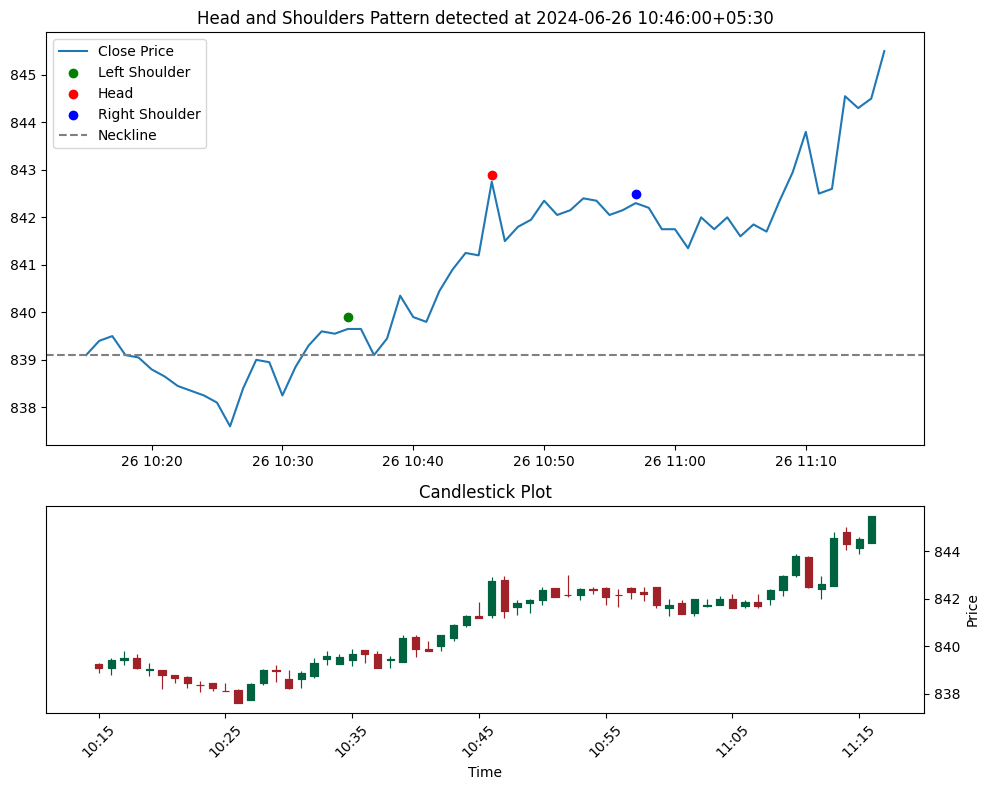

In [5]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import mplfinance as mpf
import peakutils

# Load the data
file_path = r"D:\AlgoT\stock-pattern-main\stock-pattern-main\banknifty data\sbin.csv"
data = pd.read_csv(file_path)
data['Datetime'] = pd.to_datetime(data['Datetime'])
data.set_index('Datetime', inplace=True)

# Function to find peaks and troughs in the data
def find_peaks_and_troughs(data):
    close_prices = data['Close']
    peak_indexes = peakutils.indexes(np.array(close_prices), thres=0.5, min_dist=10)
    trough_indexes = peakutils.indexes(np.array(-close_prices), thres=0.5, min_dist=10)
    
    peaks = [(idx, data.index[idx], data['High'][idx]) for idx in peak_indexes]
    troughs = [(idx, data.index[idx], data['Low'][idx]) for idx in trough_indexes]
    return peaks, troughs

# Function to detect Head and Shoulders patterns
def detect_head_and_shoulders(peaks, troughs, data):
    patterns = []
    for i in range(1, len(peaks) - 1):
        left_shoulder = peaks[i-1]
        head = peaks[i]
        right_shoulder = peaks[i+1]
        
        # Calculate time duration between shoulders
        left_duration = (head[1] - left_shoulder[1]).total_seconds() / 3600  # in hours
        right_duration = (right_shoulder[1] - head[1]).total_seconds() / 3600  # in hours
        
        # Check if the durations are within the 1:1.5 ratio
        if min(left_duration, right_duration) * 1.5 < max(left_duration, right_duration):
            continue
        
        # Check if head is higher than shoulders and shoulders are approximately equal in height
        if left_shoulder[2] < head[2] and right_shoulder[2] < head[2] and \
           abs(left_shoulder[2] - right_shoulder[2]) < 0.01 * head[2]:  # Adjust tolerance as needed
            
            # Identify low prices around the head
            head_idx = head[0]
            low_prices_around_head = data['Low'][head_idx-10:head_idx+11]  # Adjust range as needed
            
            # Choose the minimum low price as the neckline
            neckline_level = low_prices_around_head.min()
            
            # Calculate the size of the head (max - min price)
            head_size = data['High'][head_idx] - data['Low'][head_idx]
            
            # Check if the market falls more than the size of the head before the next shoulder forms
            pre_right_shoulder_low = data['Low'][head_idx+1:right_shoulder[0]].min()
            if pre_right_shoulder_low < data['Low'][head_idx] - head_size:
                continue
            
            patterns.append({
                'left_shoulder': left_shoulder,
                'head': head,
                'right_shoulder': right_shoulder,
                'neckline_level': neckline_level
            })
    return patterns

# Find peaks and troughs in 1-minute data
peaks, troughs = find_peaks_and_troughs(data)

# Detect Head and Shoulders patterns in 1-minute data
patterns = detect_head_and_shoulders(peaks, troughs, data)

# Display detected patterns and plot the chart
for pattern in patterns:
    print(f"Left Shoulder: {pattern['left_shoulder']}, Head: {pattern['head']}, Right Shoulder: {pattern['right_shoulder']}, Neckline Level: {pattern['neckline_level']}")

    start_index = max(0, pattern['left_shoulder'][0] - 20)
    end_index = min(len(data) - 1, pattern['right_shoulder'][0] + 20)
    pattern_data = data.iloc[start_index:end_index]

    # Setup figure and subplots
    fig, (ax, ax2) = plt.subplots(2, 1, figsize=(10, 8), gridspec_kw={'height_ratios': [2, 1]})

    # First subplot for the pattern
    ax.plot(pattern_data.index, pattern_data['Close'], label='Close Price')
    ax.scatter(pattern['left_shoulder'][1], pattern['left_shoulder'][2], color='green', label='Left Shoulder')
    ax.scatter(pattern['head'][1], pattern['head'][2], color='red', label='Head')
    ax.scatter(pattern['right_shoulder'][1], pattern['right_shoulder'][2], color='blue', label='Right Shoulder')
    ax.axhline(y=pattern['neckline_level'], color='gray', linestyle='--', label='Neckline')
    ax.set_title(f"Head and Shoulders Pattern detected at {pattern['head'][1]}")
    ax.legend()

    # Second subplot for candlestick
    mpf.plot(pattern_data, type='candle', ax=ax2, style='charles')
    ax2.set_xlabel('Time')
    ax2.set_ylabel('Price')
    ax2.set_title('Candlestick Plot')

    plt.xticks(rotation=45)
    plt.tight_layout()
    plt.show()



C:\Users\Aviral Mishra\AppData\Local\Temp\ipykernel_19148\316764369.py:15: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  peaks = [(idx, data.index[idx], data['High'][idx]) for idx in peak_indexes]
C:\Users\Aviral Mishra\AppData\Local\Temp\ipykernel_19148\316764369.py:16: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  troughs = [(idx, data.index[idx], data['Low'][idx]) for idx in trough_indexes]
C:\Users\Aviral Mishra\AppData\Local\Temp\ipykernel_19148\316764369.py:47: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consiste

File: D:\AlgoT\stock-pattern-main\stock-pattern-main\banknifty data\BANKNIFTYOptionsData-Jul2024-1min.csv
Left Shoulder: (7944, Timestamp('2024-07-15 13:16:00'), 1377.75), Head: (7959, Timestamp('2024-07-15 13:33:00'), 1400.0), Right Shoulder: (7971, Timestamp('2024-07-15 13:55:00'), 1376.7), Neckline Level: 1313.4


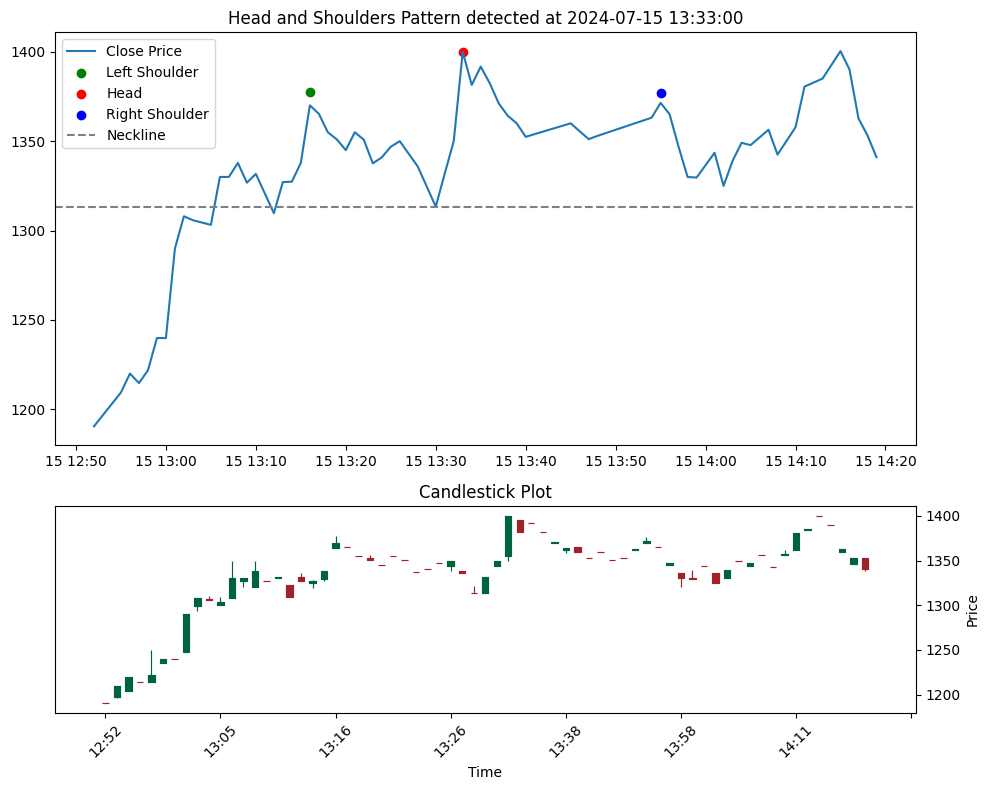

C:\Users\Aviral Mishra\AppData\Local\Temp\ipykernel_19148\316764369.py:15: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  peaks = [(idx, data.index[idx], data['High'][idx]) for idx in peak_indexes]
C:\Users\Aviral Mishra\AppData\Local\Temp\ipykernel_19148\316764369.py:16: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  troughs = [(idx, data.index[idx], data['Low'][idx]) for idx in trough_indexes]
C:\Users\Aviral Mishra\AppData\Local\Temp\ipykernel_19148\316764369.py:47: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consiste

File: D:\AlgoT\stock-pattern-main\stock-pattern-main\banknifty data\bnf.csv
Left Shoulder: (1380, Timestamp('2024-07-15 13:16:00+0530', tz='UTC+05:30'), 52622.85), Head: (1397, Timestamp('2024-07-15 13:33:00+0530', tz='UTC+05:30'), 52662.25), Right Shoulder: (1414, Timestamp('2024-07-15 13:50:00+0530', tz='UTC+05:30'), 52603.3), Neckline Level: 52543.3


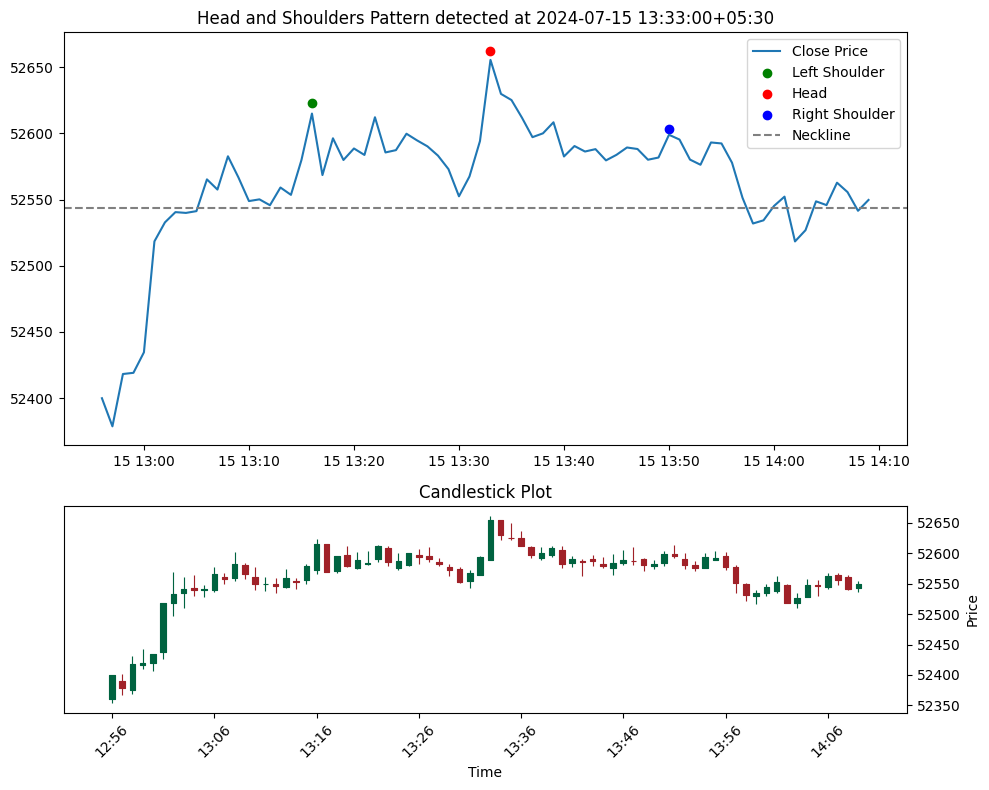

File: D:\AlgoT\stock-pattern-main\stock-pattern-main\banknifty data\bnf.csv
Left Shoulder: (1576, Timestamp('2024-07-16 10:17:00+0530', tz='UTC+05:30'), 52486.4), Head: (1587, Timestamp('2024-07-16 10:28:00+0530', tz='UTC+05:30'), 52526.4), Right Shoulder: (1598, Timestamp('2024-07-16 10:39:00+0530', tz='UTC+05:30'), 52505.95), Neckline Level: 52443.75


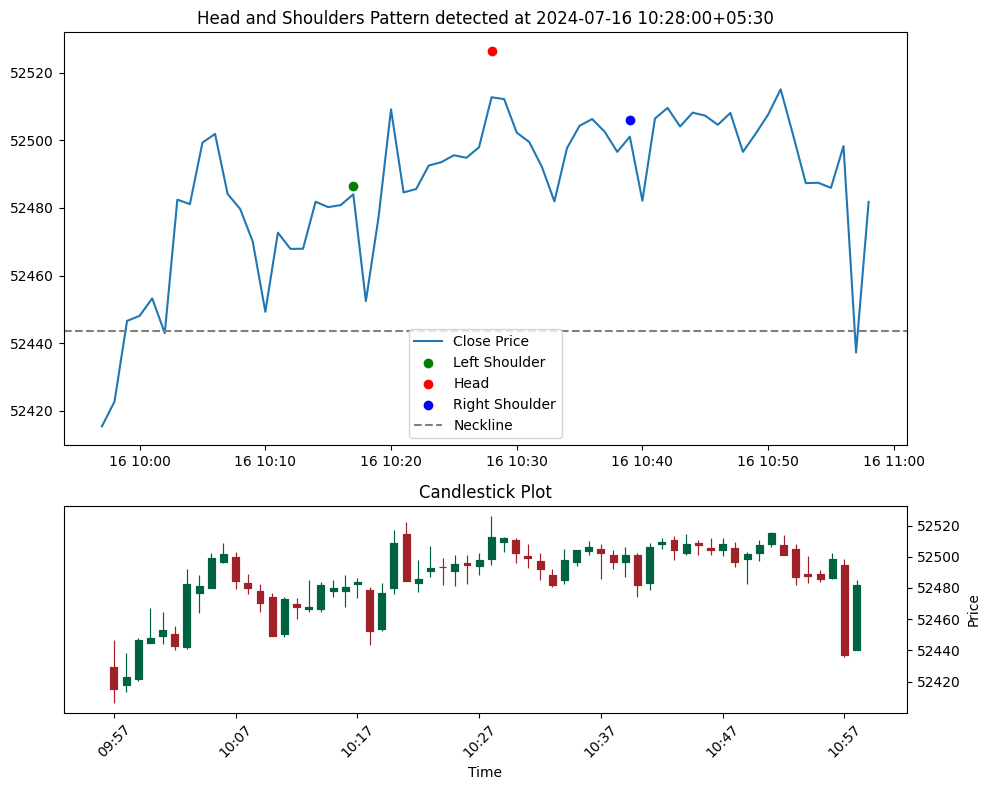

File: D:\AlgoT\stock-pattern-main\stock-pattern-main\banknifty data\bnf.csv
Left Shoulder: (1913, Timestamp('2024-07-18 09:39:00+0530', tz='UTC+05:30'), 52601.55), Head: (1930, Timestamp('2024-07-18 09:56:00+0530', tz='UTC+05:30'), 52651.0), Right Shoulder: (1945, Timestamp('2024-07-18 10:11:00+0530', tz='UTC+05:30'), 52586.95), Neckline Level: 52528.75


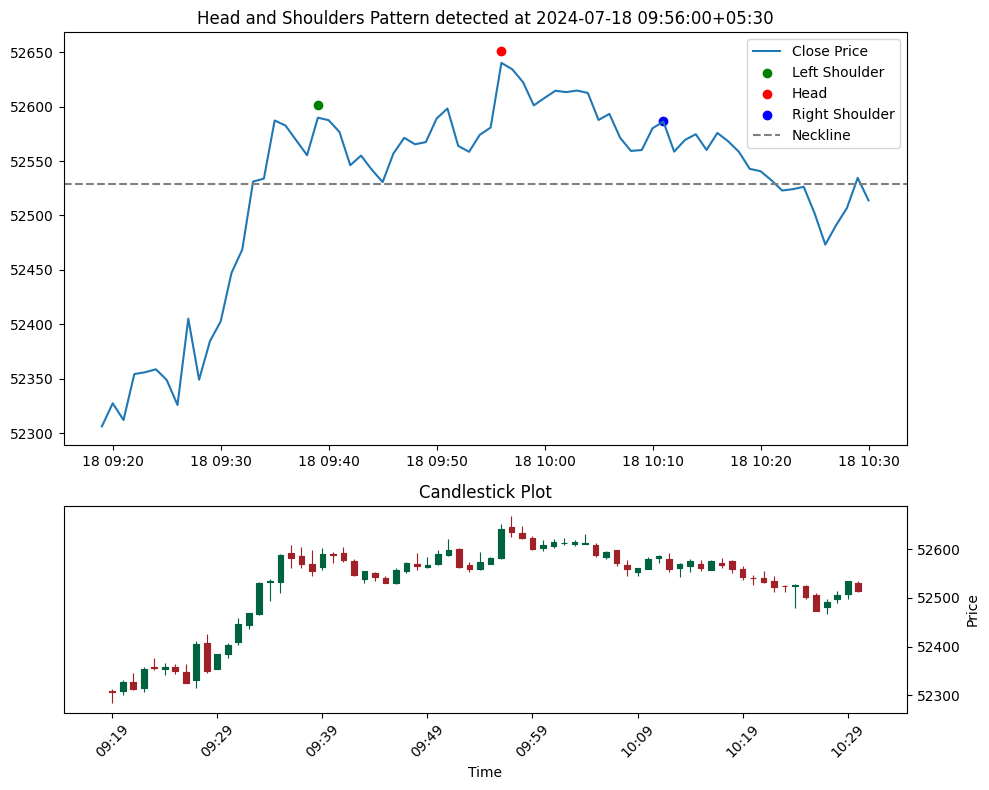

File: D:\AlgoT\stock-pattern-main\stock-pattern-main\banknifty data\bnf.csv
Left Shoulder: (2686, Timestamp('2024-07-22 10:02:00+0530', tz='UTC+05:30'), 52384.15), Head: (2703, Timestamp('2024-07-22 10:19:00+0530', tz='UTC+05:30'), 52424.8), Right Shoulder: (2720, Timestamp('2024-07-22 10:36:00+0530', tz='UTC+05:30'), 52415.0), Neckline Level: 52348.75


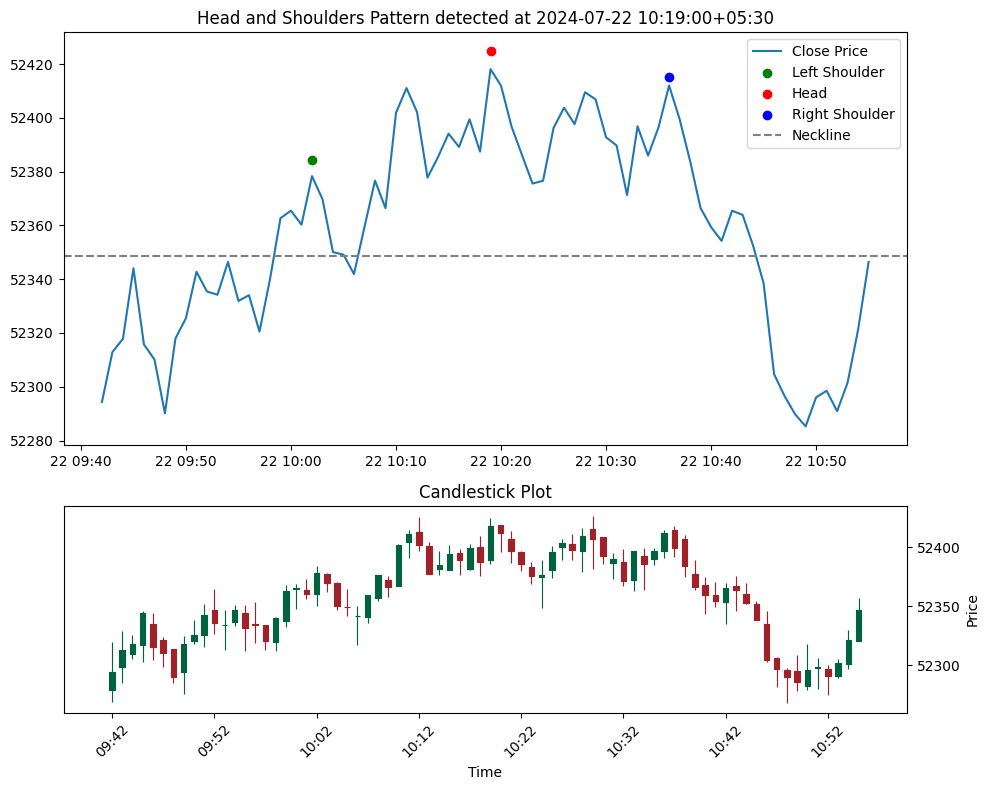

C:\Users\Aviral Mishra\AppData\Local\Temp\ipykernel_19148\316764369.py:15: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  peaks = [(idx, data.index[idx], data['High'][idx]) for idx in peak_indexes]
C:\Users\Aviral Mishra\AppData\Local\Temp\ipykernel_19148\316764369.py:16: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  troughs = [(idx, data.index[idx], data['Low'][idx]) for idx in trough_indexes]
C:\Users\Aviral Mishra\AppData\Local\Temp\ipykernel_19148\316764369.py:47: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consiste

File: D:\AlgoT\stock-pattern-main\stock-pattern-main\banknifty data\sbin.csv
Left Shoulder: (7769, Timestamp('2024-04-29 13:30:00+0530', tz='UTC+05:30'), 829.0), Head: (7783, Timestamp('2024-04-29 13:44:00+0530', tz='UTC+05:30'), 830.95), Right Shoulder: (7798, Timestamp('2024-04-29 13:59:00+0530', tz='UTC+05:30'), 829.6), Neckline Level: 825.1


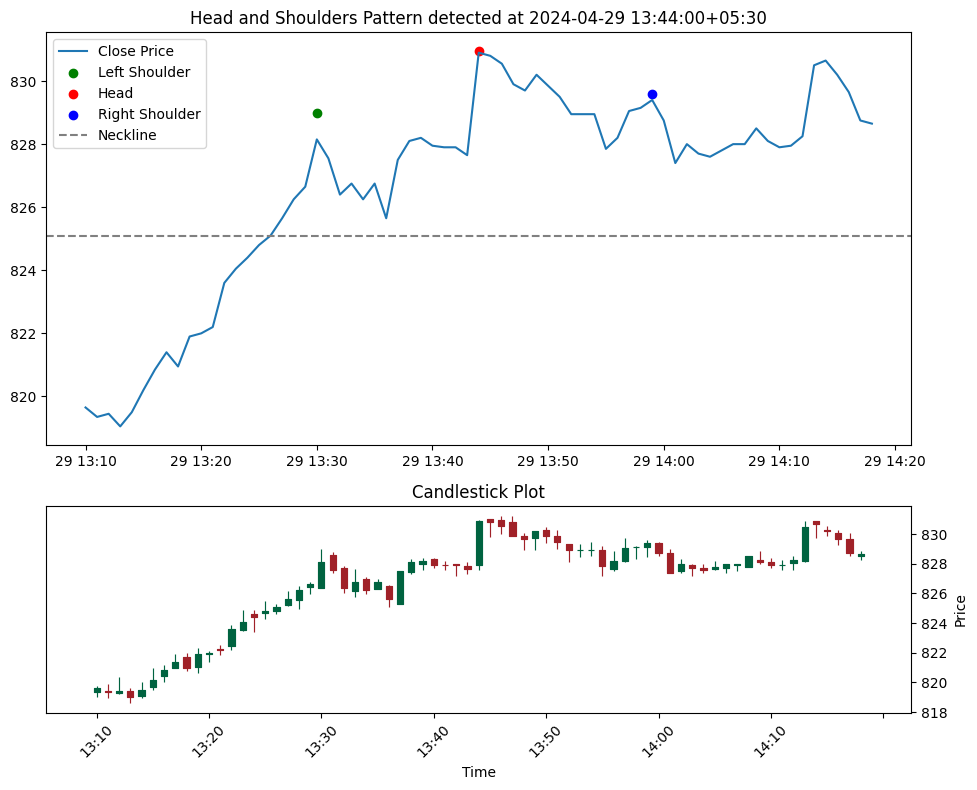

File: D:\AlgoT\stock-pattern-main\stock-pattern-main\banknifty data\sbin.csv
Left Shoulder: (8071, Timestamp('2024-04-30 12:17:00+0530', tz='UTC+05:30'), 827.95), Head: (8086, Timestamp('2024-04-30 12:32:00+0530', tz='UTC+05:30'), 829.35), Right Shoulder: (8097, Timestamp('2024-04-30 12:43:00+0530', tz='UTC+05:30'), 828.0), Neckline Level: 825.7


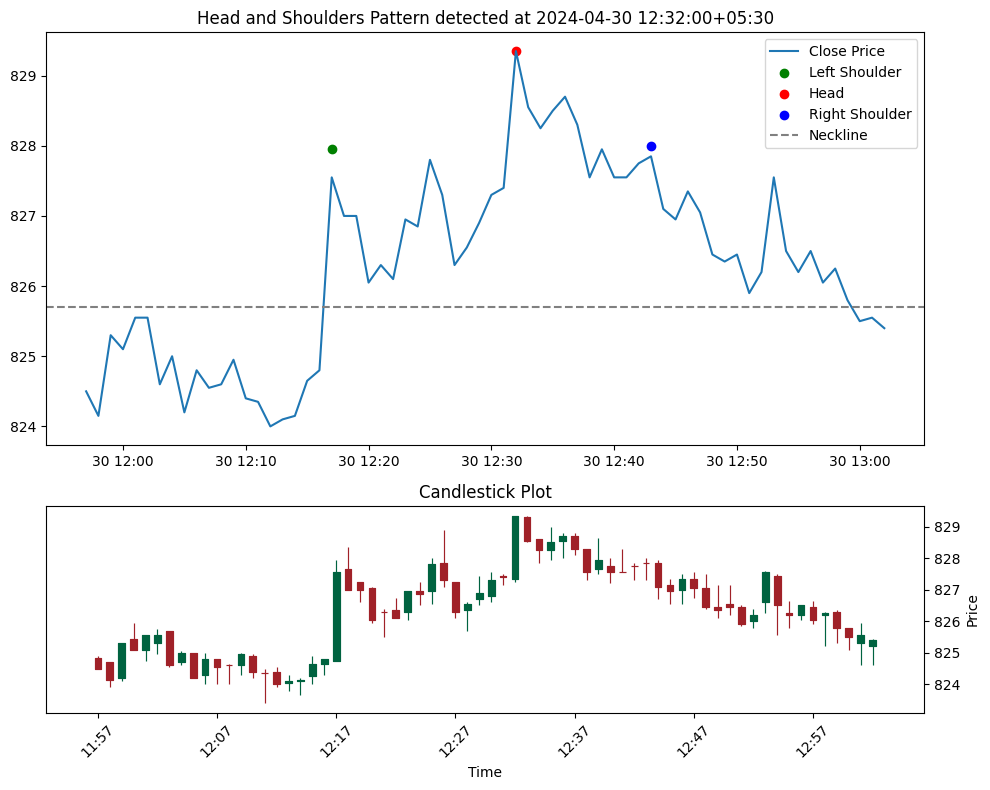

File: D:\AlgoT\stock-pattern-main\stock-pattern-main\banknifty data\sbin.csv
Left Shoulder: (8435, Timestamp('2024-05-02 12:06:00+0530', tz='UTC+05:30'), 830.4), Head: (8446, Timestamp('2024-05-02 12:17:00+0530', tz='UTC+05:30'), 831.4), Right Shoulder: (8460, Timestamp('2024-05-02 12:31:00+0530', tz='UTC+05:30'), 830.7), Neckline Level: 829.75


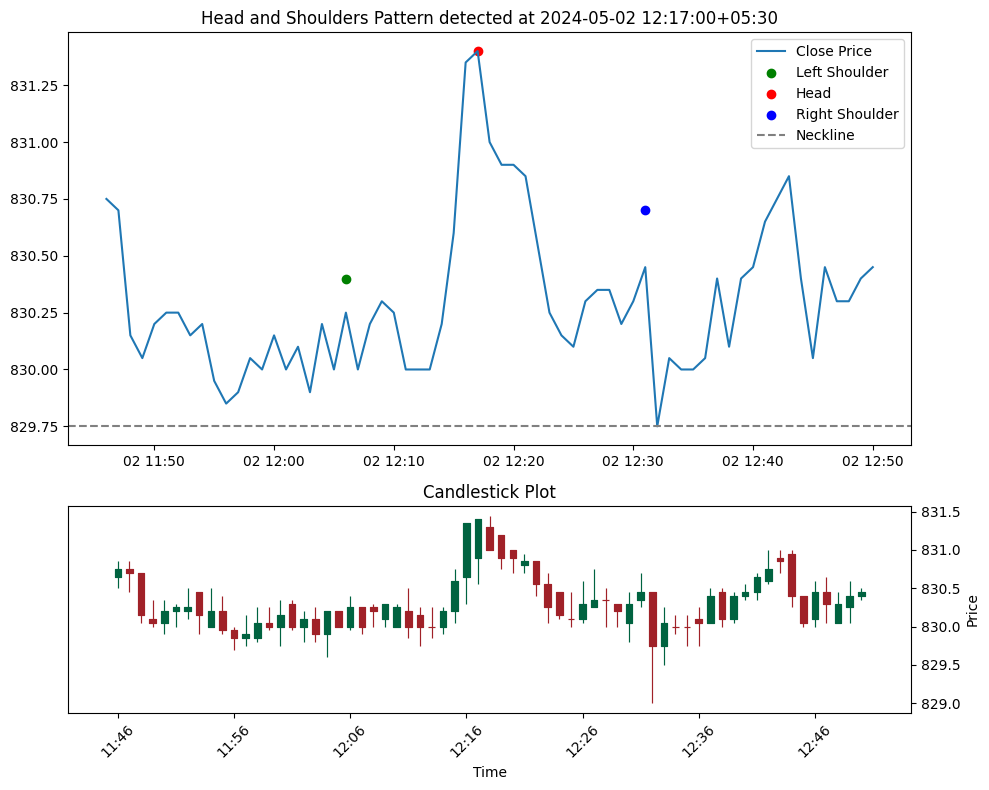

File: D:\AlgoT\stock-pattern-main\stock-pattern-main\banknifty data\sbin.csv
Left Shoulder: (8587, Timestamp('2024-05-02 14:38:00+0530', tz='UTC+05:30'), 830.35), Head: (8604, Timestamp('2024-05-02 14:55:00+0530', tz='UTC+05:30'), 830.5), Right Shoulder: (8618, Timestamp('2024-05-02 15:09:00+0530', tz='UTC+05:30'), 830.05), Neckline Level: 829.15


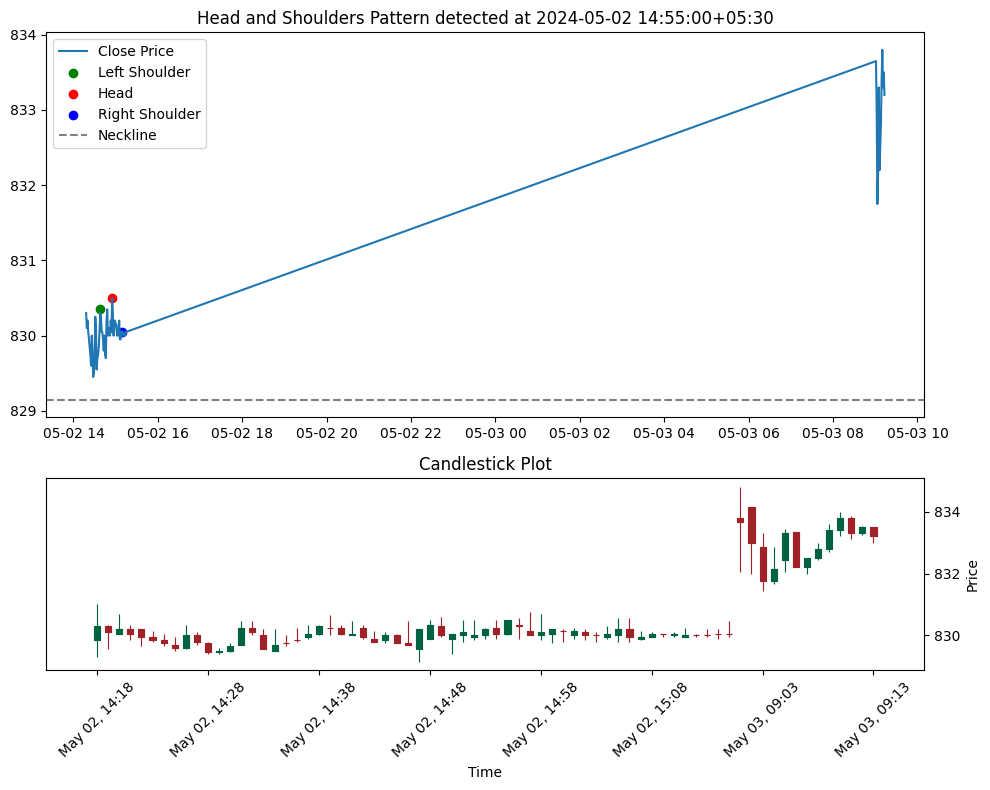

File: D:\AlgoT\stock-pattern-main\stock-pattern-main\banknifty data\sbin.csv
Left Shoulder: (11938, Timestamp('2024-05-15 14:14:00+0530', tz='UTC+05:30'), 821.0), Head: (11949, Timestamp('2024-05-15 14:25:00+0530', tz='UTC+05:30'), 822.7), Right Shoulder: (11961, Timestamp('2024-05-15 14:37:00+0530', tz='UTC+05:30'), 822.2), Neckline Level: 820.5


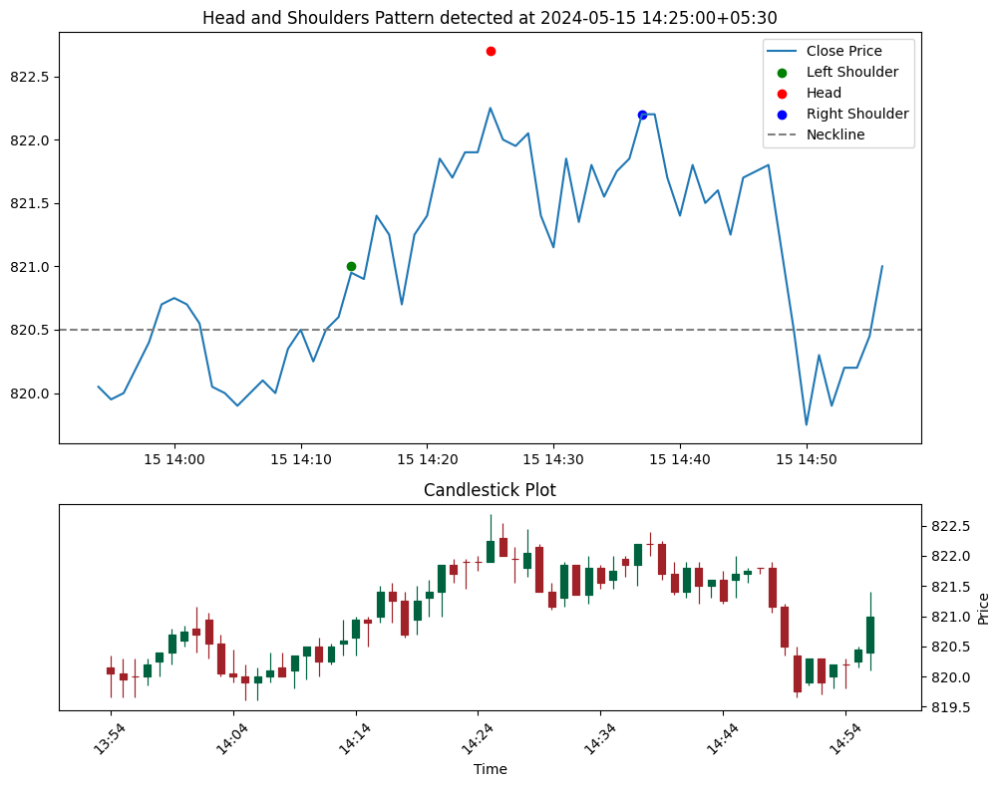

File: D:\AlgoT\stock-pattern-main\stock-pattern-main\banknifty data\sbin.csv
Left Shoulder: (14404, Timestamp('2024-05-27 11:35:00+0530', tz='UTC+05:30'), 830.75), Head: (14419, Timestamp('2024-05-27 11:50:00+0530', tz='UTC+05:30'), 836.55), Right Shoulder: (14432, Timestamp('2024-05-27 12:03:00+0530', tz='UTC+05:30'), 835.85), Neckline Level: 830.5


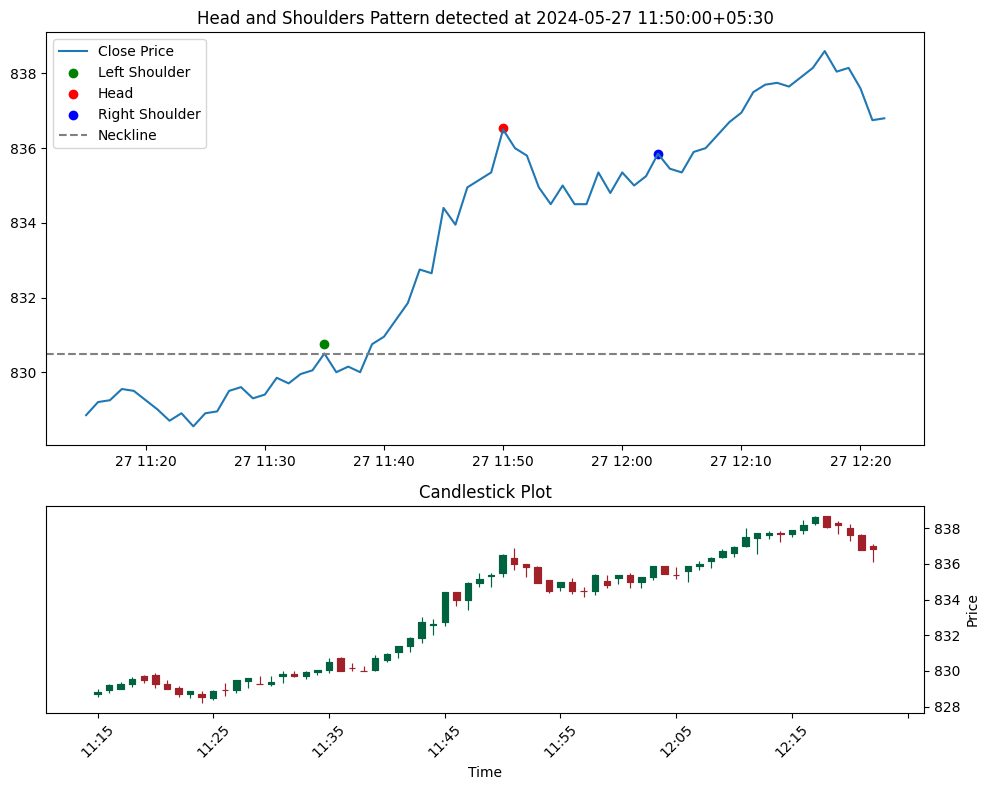

File: D:\AlgoT\stock-pattern-main\stock-pattern-main\banknifty data\sbin.csv
Left Shoulder: (14583, Timestamp('2024-05-27 14:34:00+0530', tz='UTC+05:30'), 835.8), Head: (14597, Timestamp('2024-05-27 14:48:00+0530', tz='UTC+05:30'), 836.0), Right Shoulder: (14615, Timestamp('2024-05-27 15:06:00+0530', tz='UTC+05:30'), 834.95), Neckline Level: 830.75


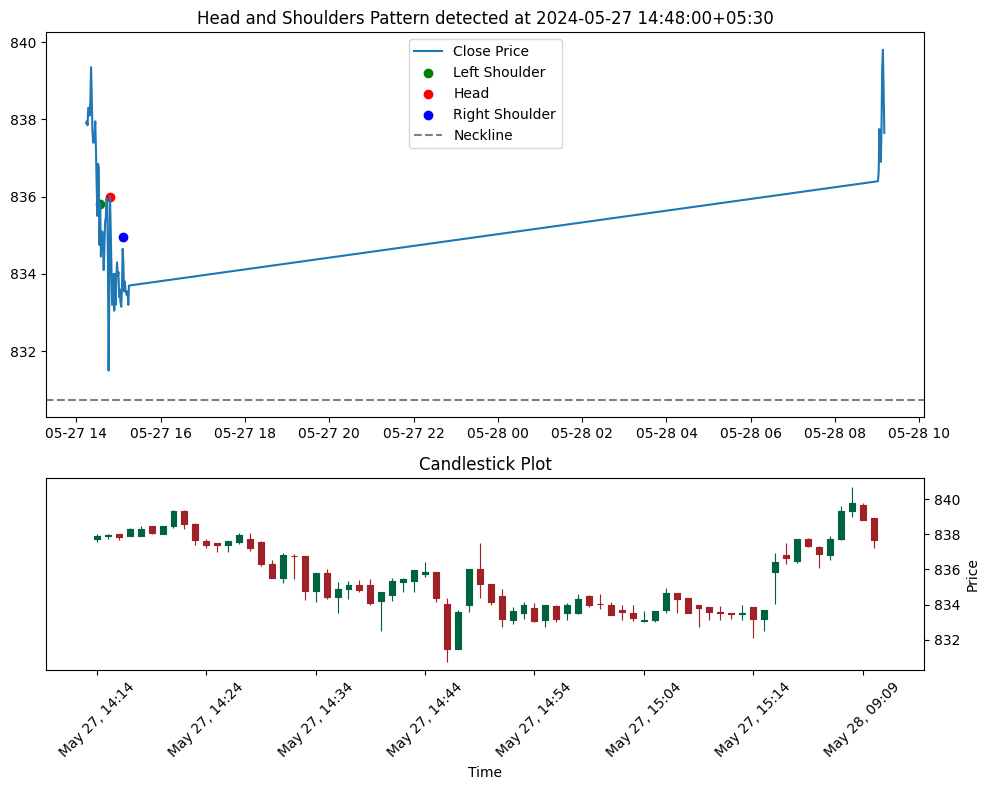

File: D:\AlgoT\stock-pattern-main\stock-pattern-main\banknifty data\sbin.csv
Left Shoulder: (15225, Timestamp('2024-05-29 12:46:00+0530', tz='UTC+05:30'), 826.2), Head: (15237, Timestamp('2024-05-29 12:58:00+0530', tz='UTC+05:30'), 826.95), Right Shoulder: (15248, Timestamp('2024-05-29 13:09:00+0530', tz='UTC+05:30'), 826.4), Neckline Level: 825.35


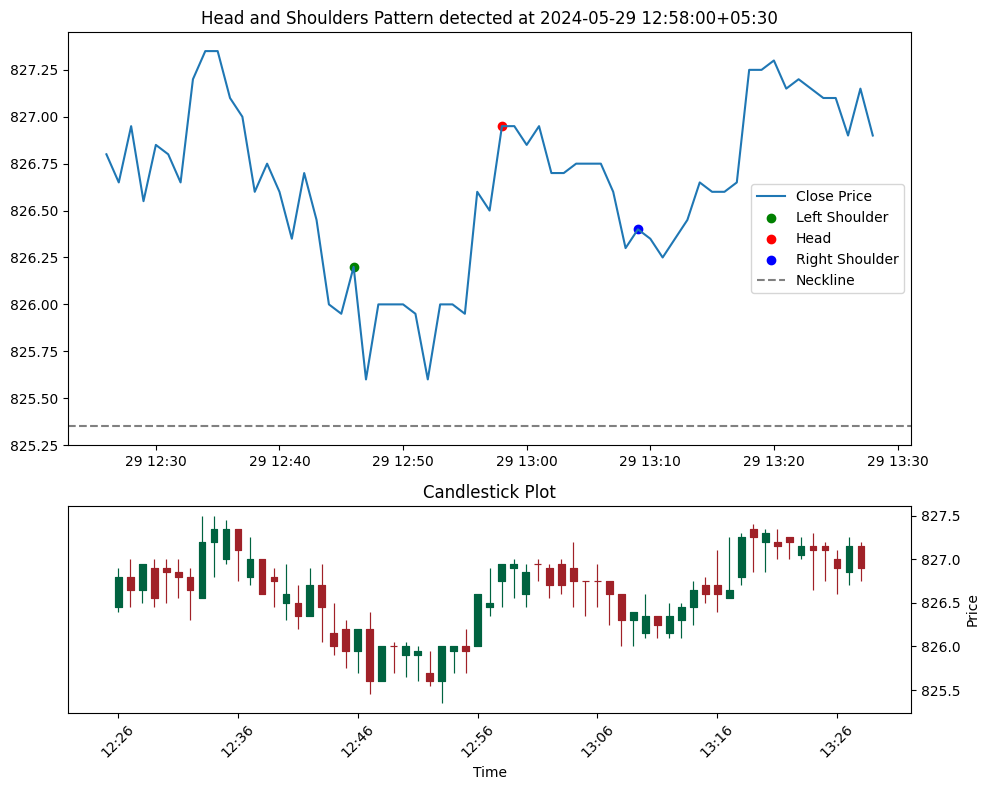

File: D:\AlgoT\stock-pattern-main\stock-pattern-main\banknifty data\sbin.csv
Left Shoulder: (15440, Timestamp('2024-05-30 10:06:00+0530', tz='UTC+05:30'), 828.25), Head: (15456, Timestamp('2024-05-30 10:22:00+0530', tz='UTC+05:30'), 828.6), Right Shoulder: (15473, Timestamp('2024-05-30 10:39:00+0530', tz='UTC+05:30'), 827.7), Neckline Level: 826.6


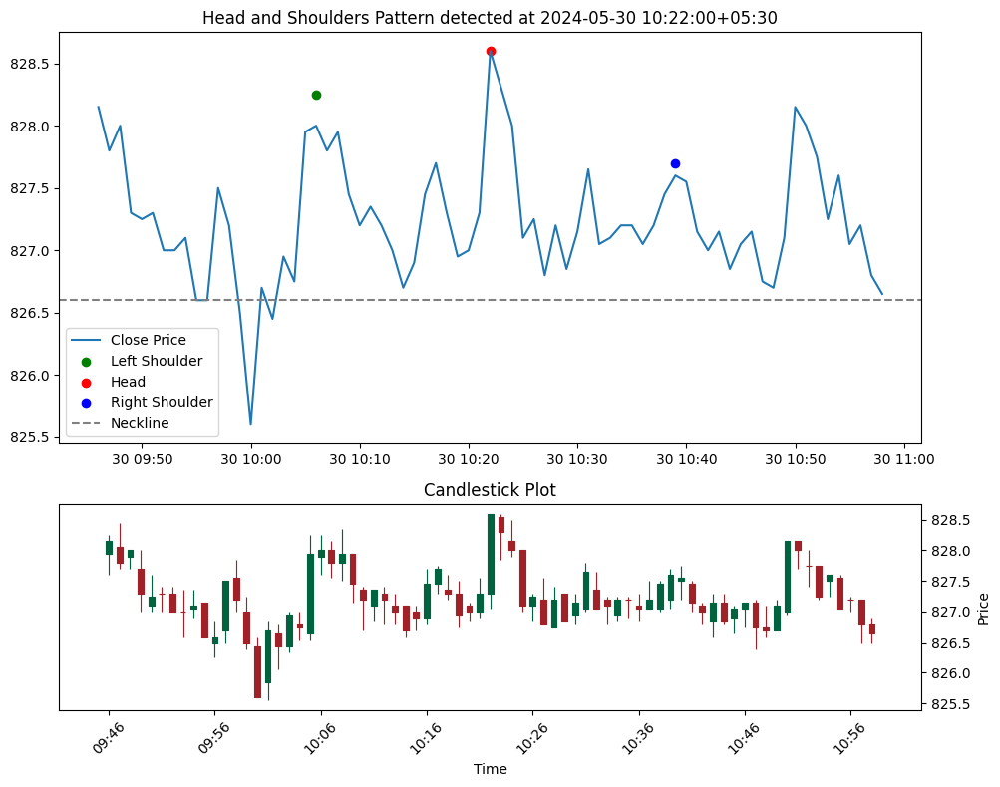

File: D:\AlgoT\stock-pattern-main\stock-pattern-main\banknifty data\sbin.csv
Left Shoulder: (17963, Timestamp('2024-06-07 14:39:00+0530', tz='UTC+05:30'), 828.15), Head: (17976, Timestamp('2024-06-07 14:52:00+0530', tz='UTC+05:30'), 830.8), Right Shoulder: (17991, Timestamp('2024-06-07 15:07:00+0530', tz='UTC+05:30'), 830.3), Neckline Level: 827.1


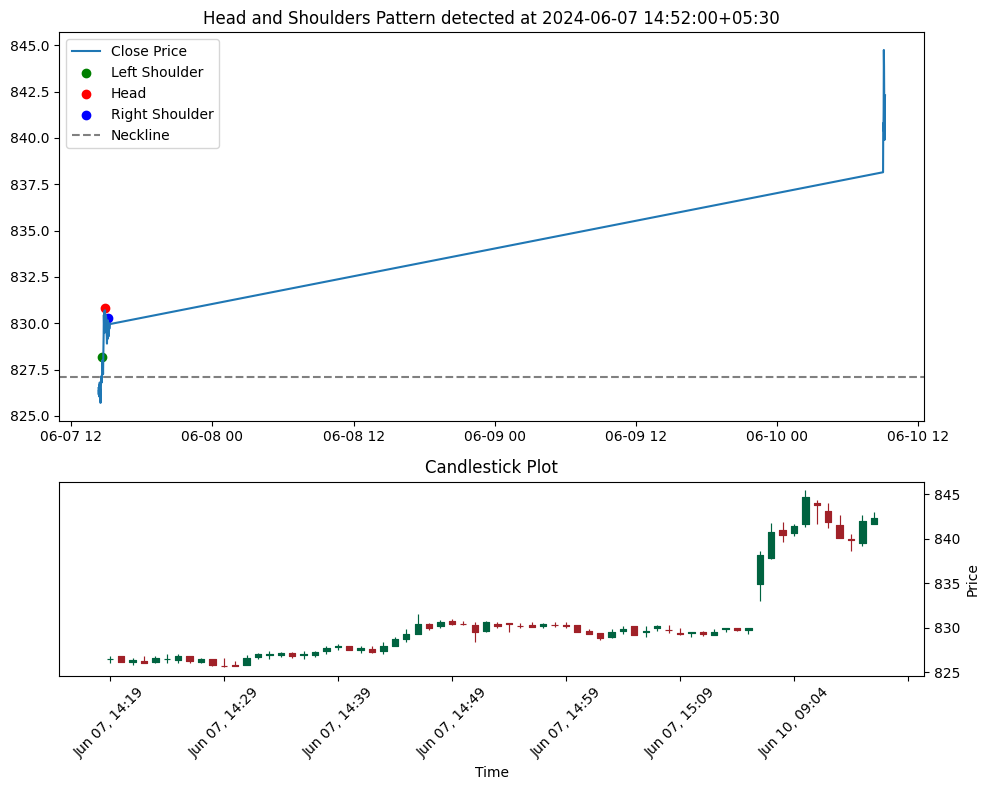

File: D:\AlgoT\stock-pattern-main\stock-pattern-main\banknifty data\sbin.csv
Left Shoulder: (18200, Timestamp('2024-06-10 12:21:00+0530', tz='UTC+05:30'), 836.25), Head: (18218, Timestamp('2024-06-10 12:39:00+0530', tz='UTC+05:30'), 838.0), Right Shoulder: (18230, Timestamp('2024-06-10 12:51:00+0530', tz='UTC+05:30'), 836.8), Neckline Level: 835.8


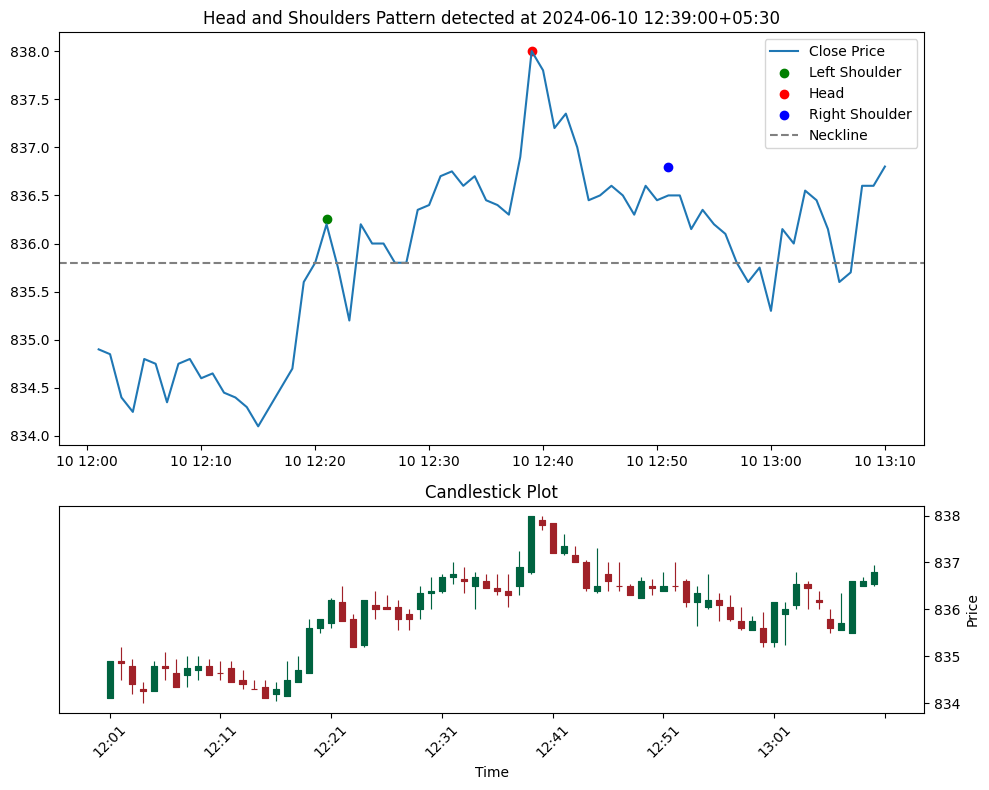

File: D:\AlgoT\stock-pattern-main\stock-pattern-main\banknifty data\sbin.csv
Left Shoulder: (18415, Timestamp('2024-06-11 09:41:00+0530', tz='UTC+05:30'), 835.0), Head: (18430, Timestamp('2024-06-11 09:56:00+0530', tz='UTC+05:30'), 837.3), Right Shoulder: (18448, Timestamp('2024-06-11 10:14:00+0530', tz='UTC+05:30'), 835.8), Neckline Level: 832.5


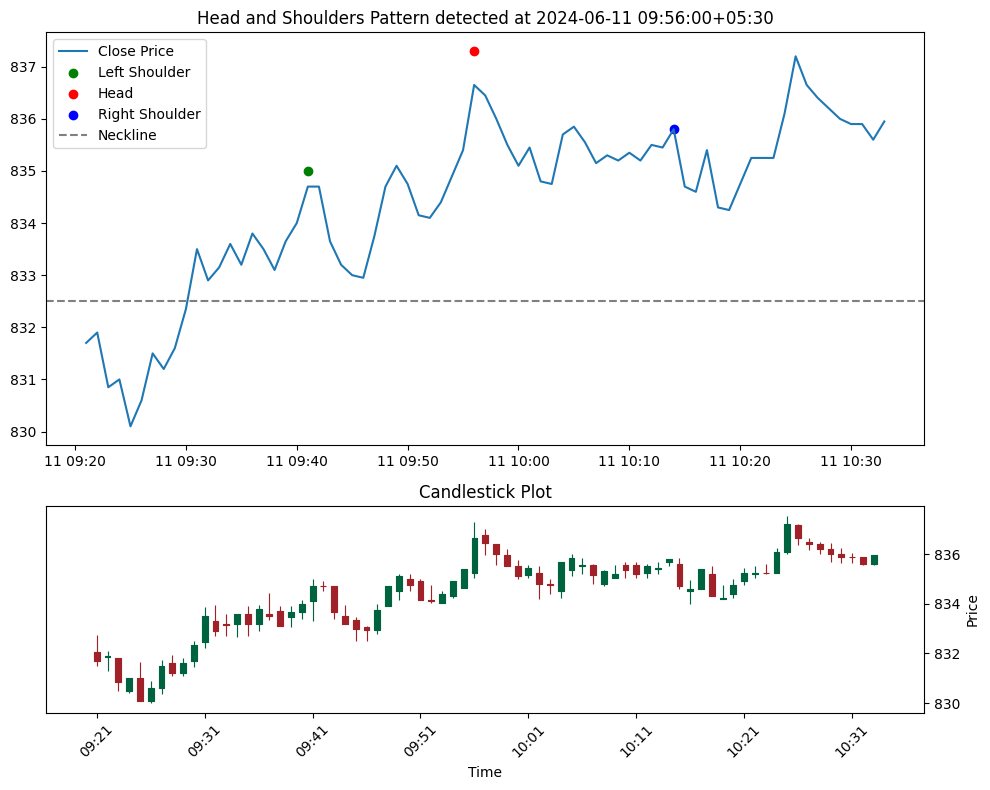

File: D:\AlgoT\stock-pattern-main\stock-pattern-main\banknifty data\sbin.csv
Left Shoulder: (18448, Timestamp('2024-06-11 10:14:00+0530', tz='UTC+05:30'), 835.8), Head: (18459, Timestamp('2024-06-11 10:25:00+0530', tz='UTC+05:30'), 837.55), Right Shoulder: (18472, Timestamp('2024-06-11 10:38:00+0530', tz='UTC+05:30'), 836.6), Neckline Level: 834.0


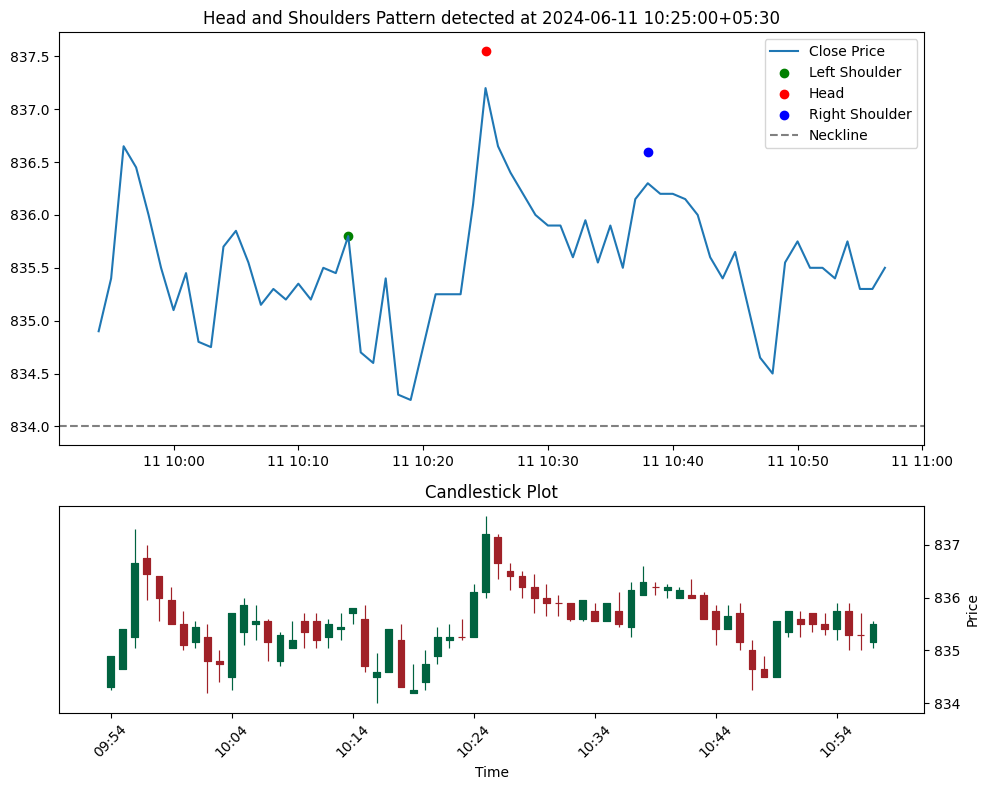

File: D:\AlgoT\stock-pattern-main\stock-pattern-main\banknifty data\sbin.csv
Left Shoulder: (18488, Timestamp('2024-06-11 10:54:00+0530', tz='UTC+05:30'), 835.9), Head: (18504, Timestamp('2024-06-11 11:10:00+0530', tz='UTC+05:30'), 836.5), Right Shoulder: (18526, Timestamp('2024-06-11 11:32:00+0530', tz='UTC+05:30'), 836.15), Neckline Level: 834.9


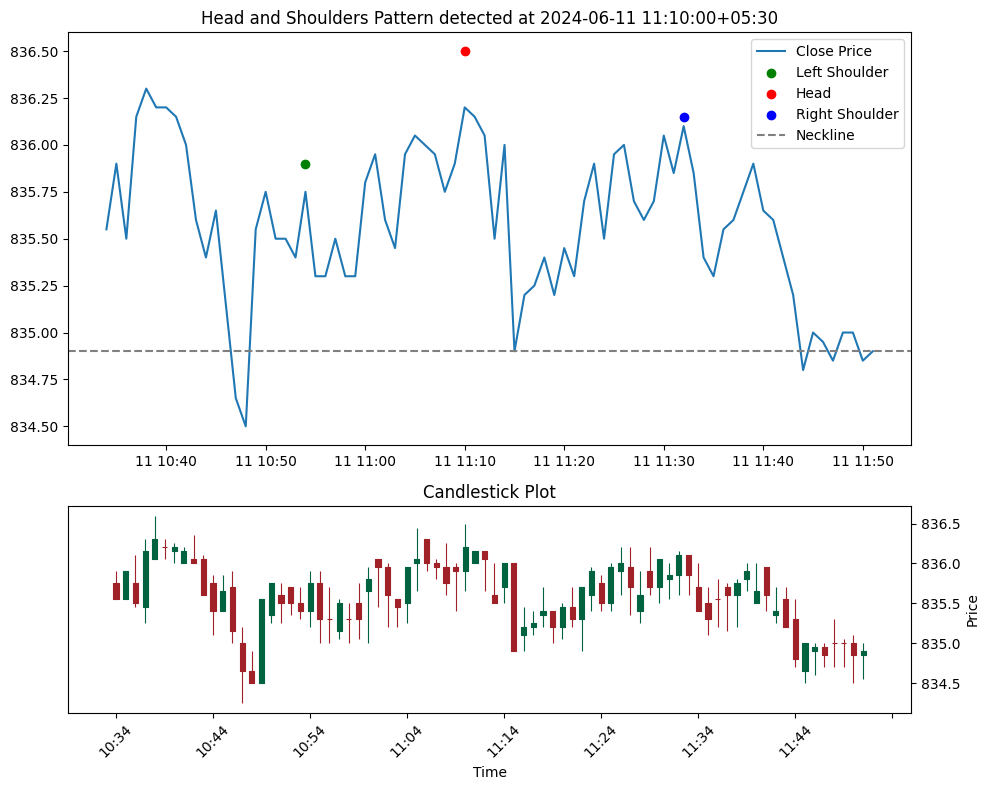

File: D:\AlgoT\stock-pattern-main\stock-pattern-main\banknifty data\sbin.csv
Left Shoulder: (19344, Timestamp('2024-06-13 12:40:00+0530', tz='UTC+05:30'), 842.8), Head: (19360, Timestamp('2024-06-13 12:56:00+0530', tz='UTC+05:30'), 842.95), Right Shoulder: (19377, Timestamp('2024-06-13 13:13:00+0530', tz='UTC+05:30'), 842.25), Neckline Level: 841.35


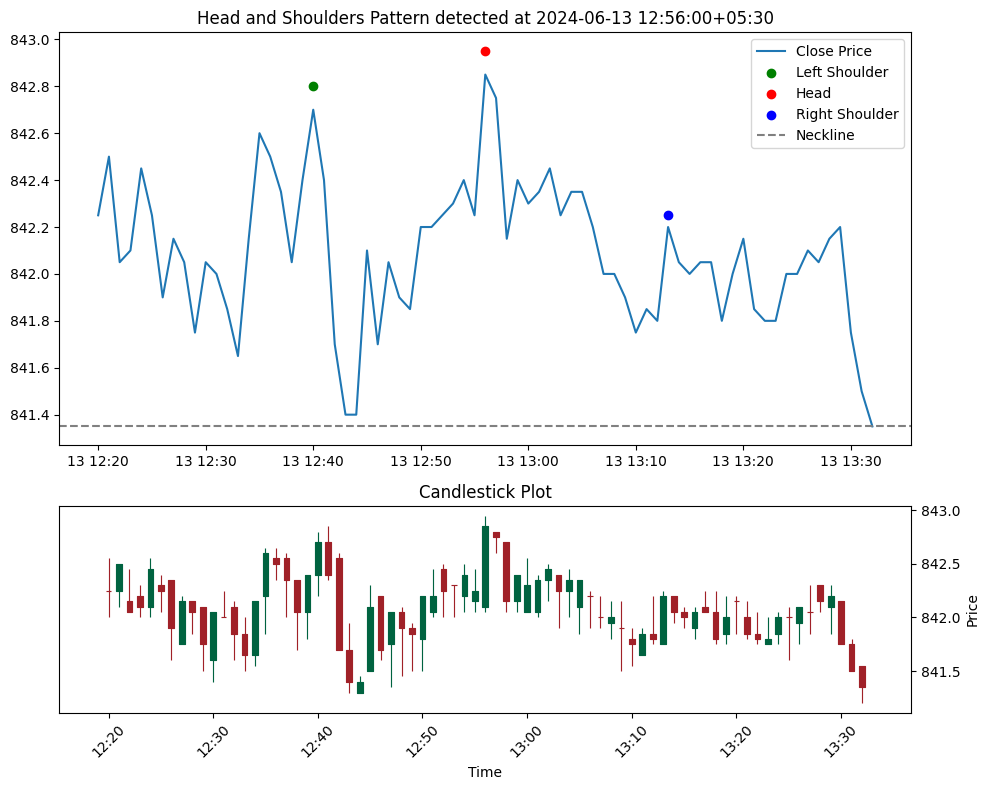

File: D:\AlgoT\stock-pattern-main\stock-pattern-main\banknifty data\sbin.csv
Left Shoulder: (19393, Timestamp('2024-06-13 13:29:00+0530', tz='UTC+05:30'), 842.3), Head: (19404, Timestamp('2024-06-13 13:40:00+0530', tz='UTC+05:30'), 842.85), Right Shoulder: (19417, Timestamp('2024-06-13 13:53:00+0530', tz='UTC+05:30'), 841.25), Neckline Level: 839.5


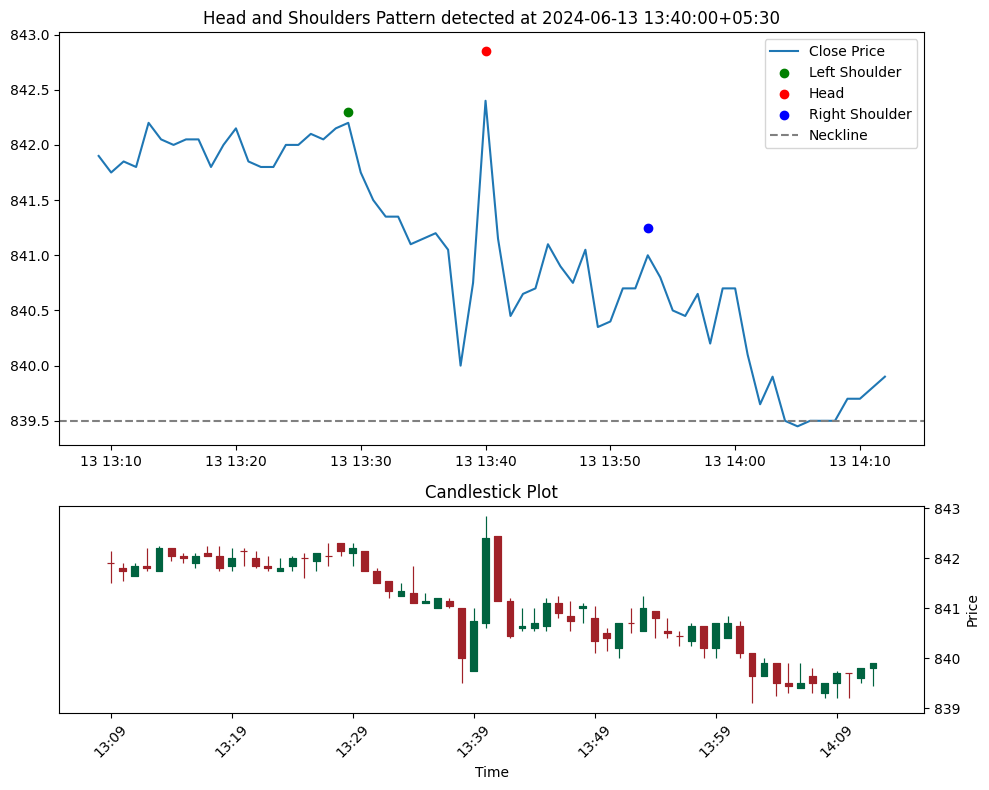

File: D:\AlgoT\stock-pattern-main\stock-pattern-main\banknifty data\sbin.csv
Left Shoulder: (19990, Timestamp('2024-06-18 10:56:00+0530', tz='UTC+05:30'), 849.0), Head: (20001, Timestamp('2024-06-18 11:07:00+0530', tz='UTC+05:30'), 850.35), Right Shoulder: (20013, Timestamp('2024-06-18 11:19:00+0530', tz='UTC+05:30'), 849.9), Neckline Level: 848.5


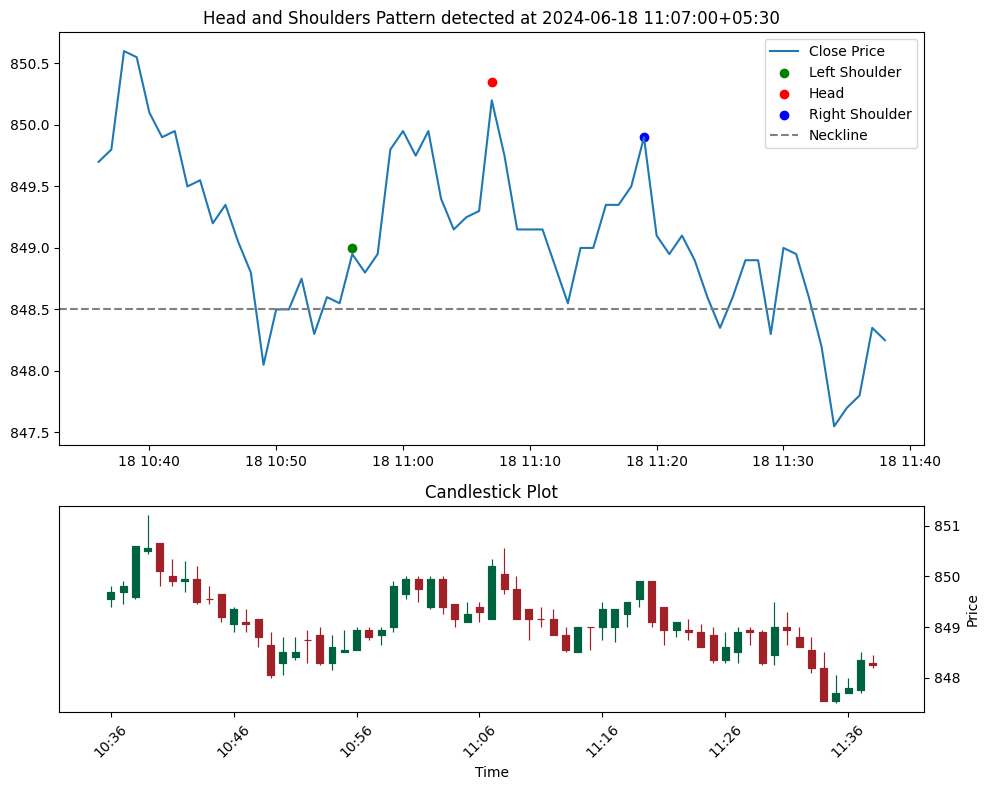

File: D:\AlgoT\stock-pattern-main\stock-pattern-main\banknifty data\sbin.csv
Left Shoulder: (20384, Timestamp('2024-06-19 11:15:00+0530', tz='UTC+05:30'), 845.8), Head: (20398, Timestamp('2024-06-19 11:29:00+0530', tz='UTC+05:30'), 850.0), Right Shoulder: (20411, Timestamp('2024-06-19 11:42:00+0530', tz='UTC+05:30'), 849.0), Neckline Level: 845.2


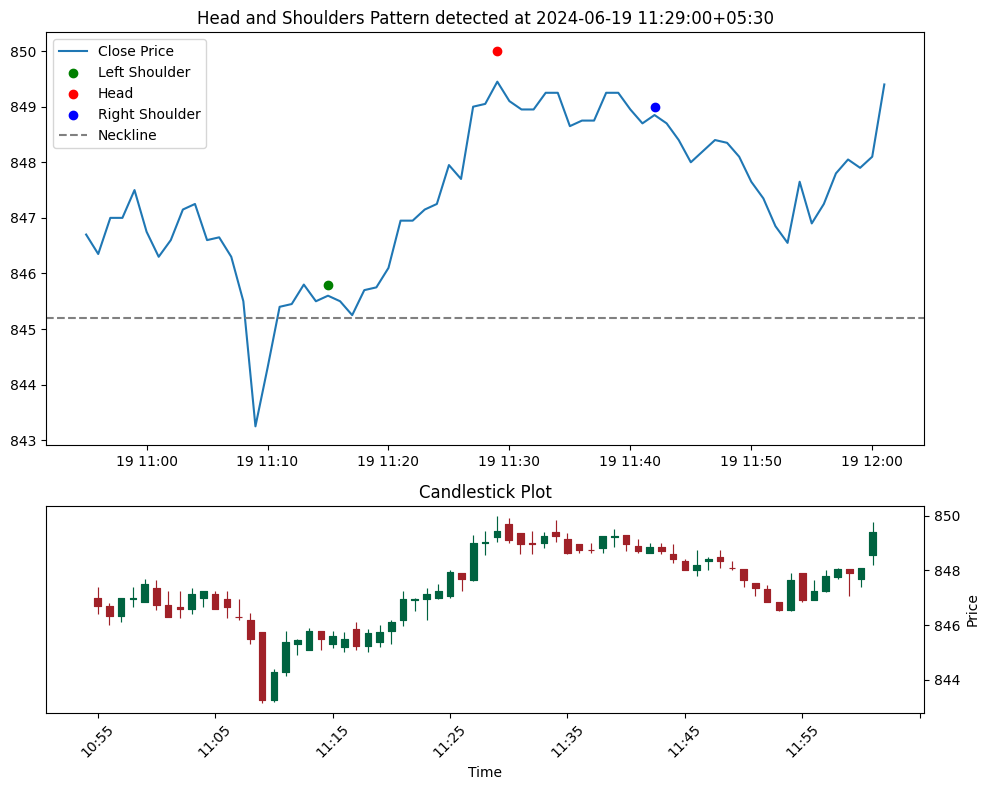

File: D:\AlgoT\stock-pattern-main\stock-pattern-main\banknifty data\sbin.csv
Left Shoulder: (21612, Timestamp('2024-06-24 12:58:00+0530', tz='UTC+05:30'), 835.1), Head: (21627, Timestamp('2024-06-24 13:13:00+0530', tz='UTC+05:30'), 836.0), Right Shoulder: (21647, Timestamp('2024-06-24 13:33:00+0530', tz='UTC+05:30'), 835.9), Neckline Level: 832.9


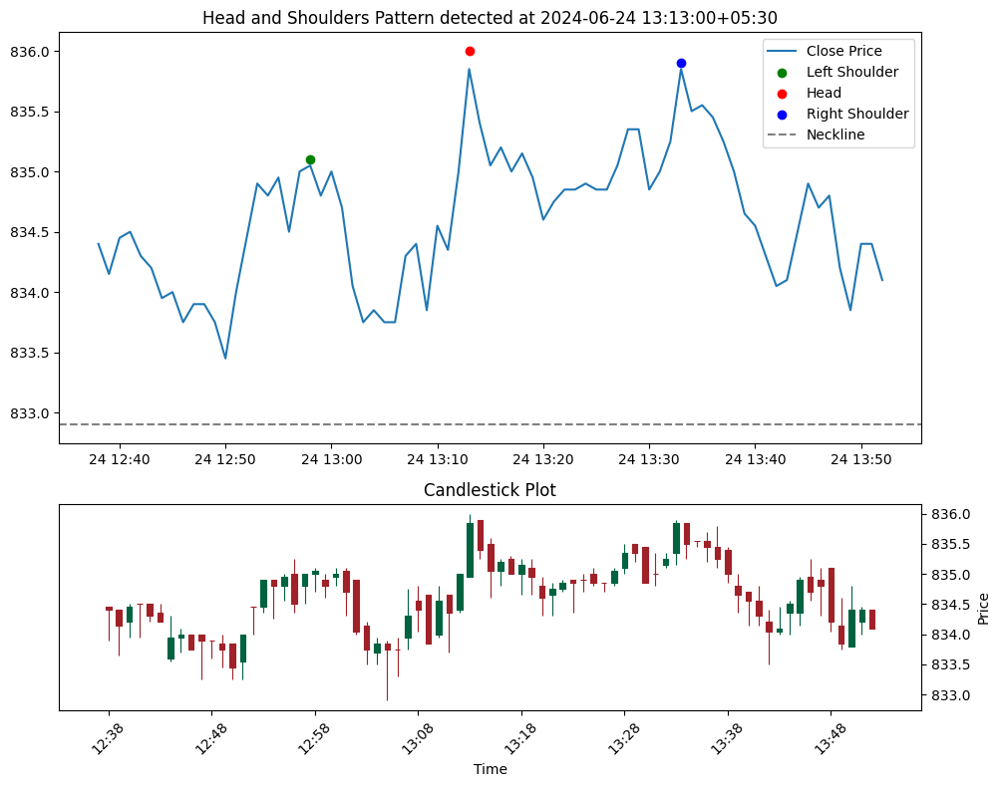

File: D:\AlgoT\stock-pattern-main\stock-pattern-main\banknifty data\sbin.csv
Left Shoulder: (22219, Timestamp('2024-06-26 10:35:00+0530', tz='UTC+05:30'), 839.9), Head: (22230, Timestamp('2024-06-26 10:46:00+0530', tz='UTC+05:30'), 842.9), Right Shoulder: (22241, Timestamp('2024-06-26 10:57:00+0530', tz='UTC+05:30'), 842.5), Neckline Level: 839.1


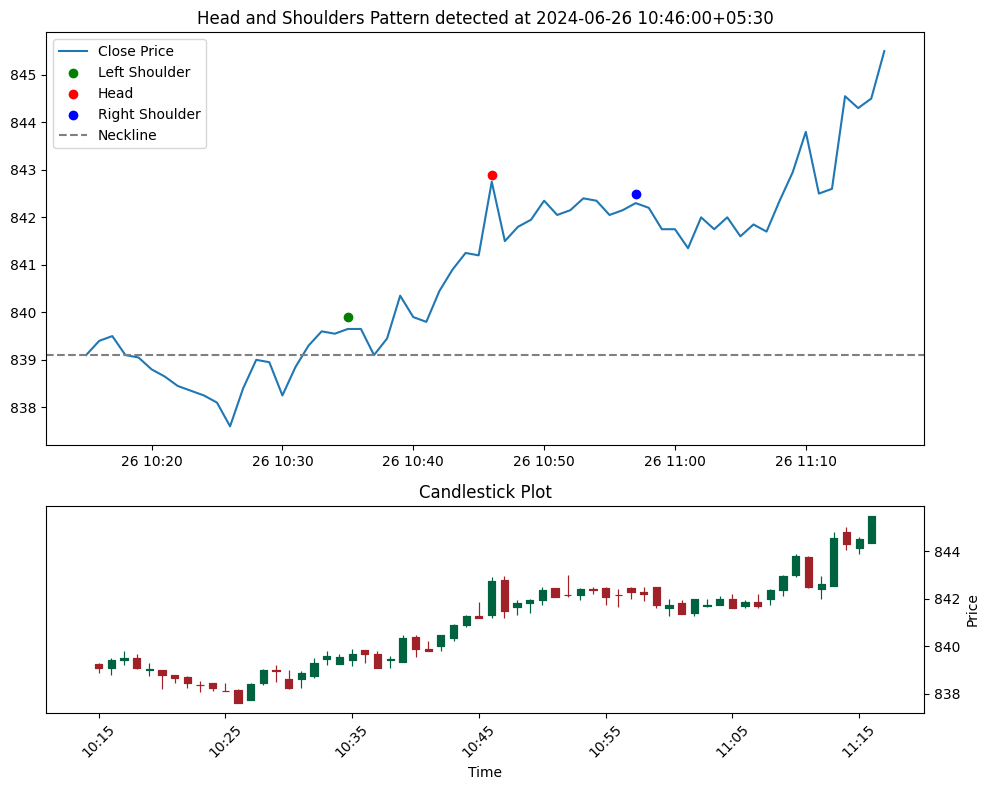

In [7]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import mplfinance as mpf
import peakutils
import os
import glob

# Function to find peaks and troughs in the data
def find_peaks_and_troughs(data):
    close_prices = data['Close']
    peak_indexes = peakutils.indexes(np.array(close_prices), thres=0.5, min_dist=10)
    trough_indexes = peakutils.indexes(np.array(-close_prices), thres=0.5, min_dist=10)
    
    peaks = [(idx, data.index[idx], data['High'][idx]) for idx in peak_indexes]
    troughs = [(idx, data.index[idx], data['Low'][idx]) for idx in trough_indexes]
    return peaks, troughs

# Function to detect Head and Shoulders patterns
def detect_head_and_shoulders(peaks, troughs, data):
    patterns = []
    for i in range(1, len(peaks) - 1):
        left_shoulder = peaks[i-1]
        head = peaks[i]
        right_shoulder = peaks[i+1]
        
        # Calculate time duration between shoulders
        left_duration = (head[1] - left_shoulder[1]).total_seconds() / 3600  # in hours
        right_duration = (right_shoulder[1] - head[1]).total_seconds() / 3600  # in hours
        
        # Check if the durations are within the 1:1.5 ratio
        if min(left_duration, right_duration) * 1.5 < max(left_duration, right_duration):
            continue
        
        # Check if head is higher than shoulders and shoulders are approximately equal in height
        if left_shoulder[2] < head[2] and right_shoulder[2] < head[2] and \
           abs(left_shoulder[2] - right_shoulder[2]) < 0.01 * head[2]:  # Adjust tolerance as needed
            
            # Identify low prices around the head
            head_idx = head[0]
            low_prices_around_head = data['Low'][head_idx-10:head_idx+11]  # Adjust range as needed
            
            # Choose the minimum low price as the neckline
            neckline_level = low_prices_around_head.min()
            
            # Calculate the size of the head (max - min price)
            head_size = data['High'][head_idx] - data['Low'][head_idx]
            
            # Check if the market falls more than the size of the head before the next shoulder forms
            pre_right_shoulder_low = data['Low'][head_idx+1:right_shoulder[0]].min()
            if pre_right_shoulder_low < data['Low'][head_idx] - head_size:
                continue
            
            patterns.append({
                'left_shoulder': left_shoulder,
                'head': head,
                'right_shoulder': right_shoulder,
                'neckline_level': neckline_level
            })
    return patterns

# Function to process a single CSV file
def process_csv_file(file_path):
    data = pd.read_csv(file_path)
    data['Datetime'] = pd.to_datetime(data['Datetime'])
    data.set_index('Datetime', inplace=True)
    
    # Find peaks and troughs in 1-minute data
    peaks, troughs = find_peaks_and_troughs(data)
    
    # Detect Head and Shoulders patterns in 1-minute data
    patterns = detect_head_and_shoulders(peaks, troughs, data)
    
    # Display detected patterns and plot the chart for each pattern
    for pattern in patterns:
        print(f"File: {file_path}")
        print(f"Left Shoulder: {pattern['left_shoulder']}, Head: {pattern['head']}, Right Shoulder: {pattern['right_shoulder']}, Neckline Level: {pattern['neckline_level']}")
        
        start_index = max(0, pattern['left_shoulder'][0] - 20)
        end_index = min(len(data) - 1, pattern['right_shoulder'][0] + 20)
        pattern_data = data.iloc[start_index:end_index]
        
        # Setup figure and subplots
        fig, (ax, ax2) = plt.subplots(2, 1, figsize=(10, 8), gridspec_kw={'height_ratios': [2, 1]})
        
        # First subplot for the pattern
        ax.plot(pattern_data.index, pattern_data['Close'], label='Close Price')
        ax.scatter(pattern['left_shoulder'][1], pattern['left_shoulder'][2], color='green', label='Left Shoulder')
        ax.scatter(pattern['head'][1], pattern['head'][2], color='red', label='Head')
        ax.scatter(pattern['right_shoulder'][1], pattern['right_shoulder'][2], color='blue', label='Right Shoulder')
        ax.axhline(y=pattern['neckline_level'], color='gray', linestyle='--', label='Neckline')
        ax.set_title(f"Head and Shoulders Pattern detected at {pattern['head'][1]}")
        ax.legend()
        
        # Second subplot for candlestick
        mpf.plot(pattern_data, type='candle', ax=ax2, style='charles')
        ax2.set_xlabel('Time')
        ax2.set_ylabel('Price')
        ax2.set_title('Candlestick Plot')
        
        plt.xticks(rotation=45)
        plt.tight_layout()
        plt.show()

# Main function to process all CSV files in a directory
def process_all_csv_files_in_directory(directory_path):
    csv_files = glob.glob(os.path.join(directory_path, "*.csv"))
    
    for file_path in csv_files:
        process_csv_file(file_path)

# Example usage
directory_path = r"D:\AlgoT\stock-pattern-main\stock-pattern-main\data"
process_all_csv_files_in_directory(directory_path)


In [8]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import mplfinance as mpf
import peakutils
import os
import glob

# Function to find peaks and troughs in the data
def find_peaks_and_troughs(data):
    close_prices = data['Close']
    peak_indexes = peakutils.indexes(np.array(close_prices), thres=0.5, min_dist=10)
    trough_indexes = peakutils.indexes(np.array(-close_prices), thres=0.5, min_dist=10)
    
    peaks = [(idx, data.index[idx], data['High'][idx]) for idx in peak_indexes]
    troughs = [(idx, data.index[idx], data['Low'][idx]) for idx in trough_indexes]
    return peaks, troughs

# Function to detect Inverse Head and Shoulders patterns
def detect_inverse_head_and_shoulders(troughs, data):
    patterns = []
    
    for i in range(1, len(troughs) - 1):
        left_shoulder = troughs[i-1]
        head = troughs[i]
        right_shoulder = troughs[i+1]
        
        # Calculate time duration between shoulders
        left_duration = (head[1] - left_shoulder[1]).total_seconds() / 3600  # in hours
        right_duration = (right_shoulder[1] - head[1]).total_seconds() / 3600  # in hours
        
        # Check if the durations are within the 1:1.5 ratio
        if min(left_duration, right_duration) * 1.5 < max(left_duration, right_duration):
            continue
        
        # Check if head is lower than shoulders and shoulders are approximately equal in height
        if left_shoulder[2] > head[2] and right_shoulder[2] > head[2] and \
           abs(left_shoulder[2] - right_shoulder[2]) < 0.01 * head[2]:  # Adjust tolerance as needed
            
            # Identify high prices around the head
            head_idx = head[0]
            high_prices_around_head = data['High'][head_idx-10:head_idx+11]  # Adjust range as needed
            
            # Choose the maximum high price as the neckline
            neckline_level = high_prices_around_head.max()
            
            # Calculate the size of the head (min - max price)
            head_size = data['Low'][head_idx] - data['High'][head_idx]
            
            # Check if the market rises more than the size of the head before the next shoulder forms
            pre_right_shoulder_high = data['High'][head_idx+1:right_shoulder[0]].max()
            if pre_right_shoulder_high > data['High'][head_idx] + head_size:
                continue
            
            patterns.append({
                'left_shoulder': left_shoulder,
                'head': head,
                'right_shoulder': right_shoulder,
                'neckline_level': neckline_level
            })
    
    return patterns

# Function to process a single CSV file
def process_csv_file(file_path):
    data = pd.read_csv(file_path)
    data['Datetime'] = pd.to_datetime(data['Datetime'])
    data.set_index('Datetime', inplace=True)
    
    # Resample to 5-minute and 15-minute intervals
    data_5min = data.resample('5T').agg({
        'Open': 'first',
        'High': 'max',
        'Low': 'min',
        'Close': 'last'
    }).dropna()

    data_15min = data.resample('15T').agg({
        'Open': 'first',
        'High': 'max',
        'Low': 'min',
        'Close': 'last'
    }).dropna()
    
    timeframes = {'1-minute': data, '5-minute': data_5min, '15-minute': data_15min}

    for timeframe, resampled_data in timeframes.items():
        # Find peaks and troughs in the data
        _, troughs = find_peaks_and_troughs(resampled_data)
        
        # Detect Inverse Head and Shoulders patterns
        patterns = detect_inverse_head_and_shoulders(troughs, resampled_data)
        
        # Display detected patterns and plot the chart for each pattern
        for pattern in patterns:
            print(f"File: {file_path}, Timeframe: {timeframe}")
            print(f"Left Shoulder: {pattern['left_shoulder']}, Head: {pattern['head']}, Right Shoulder: {pattern['right_shoulder']}, Neckline Level: {pattern['neckline_level']}")
            
            start_index = max(0, pattern['left_shoulder'][0] - 20)
            end_index = min(len(resampled_data) - 1, pattern['right_shoulder'][0] + 20)
            pattern_data = resampled_data.iloc[start_index:end_index]
            
            # Setup figure and subplots
            fig, (ax, ax2) = plt.subplots(2, 1, figsize=(10, 8), gridspec_kw={'height_ratios': [2, 1]})
            
            # First subplot for the pattern
            ax.plot(pattern_data.index, pattern_data['Close'], label='Close Price')
            ax.scatter(pattern['left_shoulder'][1], pattern['left_shoulder'][2], color='purple', label='Left Shoulder')
            ax.scatter(pattern['head'][1], pattern['head'][2], color='orange', label='Head')
            ax.scatter(pattern['right_shoulder'][1], pattern['right_shoulder'][2], color='cyan', label='Right Shoulder')
            ax.axhline(y=pattern['neckline_level'], color='gray', linestyle='--', label='Neckline')
            ax.set_title(f"Inverse Head and Shoulders detected at {pattern['head'][1]}")
            ax.legend()
            
            # Add file name and timeframe text
            ax.text(0.02, 0.95, f'File: {os.path.basename(file_path)}\nTimeframe: {timeframe}', transform=ax.transAxes, fontsize=10, verticalalignment='top', bbox=dict(facecolor='white', alpha=0.5))
            
            # Second subplot for candlestick
            mpf.plot(pattern_data, type='candle', ax=ax2, style='charles')
            ax2.set_xlabel('Time')
            ax2.set_ylabel('Price')
            ax2.set_title('Candlestick Plot')
            
            plt.xticks(rotation=45)
            plt.tight_layout()
            plt.show()

# Main function to process all CSV files in a directory
def process_all_csv_files_in_directory(directory_path):
    csv_files = glob.glob(os.path.join(directory_path, "*.csv"))
    
    for file_path in csv_files:
        process_csv_file(file_path)

# Example usage
directory_path = r"D:\AlgoT\stock-pattern-main\stock-pattern-main\banknifty data"
process_all_csv_files_in_directory(directory_path)


C:\Users\Aviral Mishra\AppData\Local\Temp\ipykernel_19148\4114186953.py:71: FutureWarning: 'T' is deprecated and will be removed in a future version, please use 'min' instead.
  data_5min = data.resample('5T').agg({
C:\Users\Aviral Mishra\AppData\Local\Temp\ipykernel_19148\4114186953.py:78: FutureWarning: 'T' is deprecated and will be removed in a future version, please use 'min' instead.
  data_15min = data.resample('15T').agg({
C:\Users\Aviral Mishra\AppData\Local\Temp\ipykernel_19148\4114186953.py:15: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  peaks = [(idx, data.index[idx], data['High'][idx]) for idx in peak_indexes]
C:\Users\Aviral Mishra\AppData\Local\Temp\ipykernel_19148\4114186953.py:16: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer

In [9]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import mplfinance as mpf
import peakutils
import os
import glob

# Function to find peaks and troughs in the data
def find_peaks_and_troughs(data):
    close_prices = data['Close']
    peak_indexes = peakutils.indexes(np.array(close_prices), thres=0.5, min_dist=10)
    trough_indexes = peakutils.indexes(np.array(-close_prices), thres=0.5, min_dist=10)
    
    peaks = [(idx, data.index[idx], data['High'][idx]) for idx in peak_indexes]
    troughs = [(idx, data.index[idx], data['Low'][idx]) for idx in trough_indexes]
    return peaks, troughs

# Function to detect Head and Shoulders patterns
def detect_head_and_shoulders(peaks, data):
    patterns = []
    for i in range(1, len(peaks) - 1):
        for j in range(i + 1, len(peaks)):
            for k in range(j + 1, len(peaks)):
                left_shoulder = peaks[i - 1]
                head = peaks[j]
                right_shoulder = peaks[k]
                
                # Calculate time durations between shoulders and head
                left_duration = head[0] - left_shoulder[0]
                right_duration = right_shoulder[0] - head[0]
                
                # Check if the durations are within the 1:1.5 ratio
                if min(left_duration, right_duration) * 1.5 < max(left_duration, right_duration):
                    continue
                
                # Check if head is higher than shoulders and shoulders are approximately equal in height
                if left_shoulder[2] < head[2] and right_shoulder[2] < head[2] and \
                   abs(left_shoulder[2] - right_shoulder[2]) < 0.01 * head[2]:  # Adjust tolerance as needed
                    
                    # Identify low prices around the head
                    head_idx = head[0]
                    low_prices_around_head = data['Low'][head_idx - 10:head_idx + 11]  # Adjust range as needed
                    
                    # Choose the minimum low price as the neckline
                    neckline_level = low_prices_around_head.min()
                    
                    # Calculate the size of the head (max - min price)
                    head_size = data['High'][head_idx] - data['Low'][head_idx]
                    
                    # Check if the market falls more than the size of the head before the next shoulder forms
                    pre_right_shoulder_low = data['Low'][head_idx + 1:right_shoulder[0]].min()
                    if pre_right_shoulder_low < data['Low'][head_idx] - head_size:
                        continue
                    
                    patterns.append({
                        'left_shoulder': left_shoulder,
                        'head': head,
                        'right_shoulder': right_shoulder,
                        'neckline_level': neckline_level
                    })
    return patterns

# Function to process a single CSV file
def process_csv_file(file_path):
    data = pd.read_csv(file_path)
    data['Datetime'] = pd.to_datetime(data['Datetime'])
    data.set_index('Datetime', inplace=True)
    
    # Resample to daily intervals
    data_daily = data.resample('D').agg({
        'Open': 'first',
        'High': 'max',
        'Low': 'min',
        'Close': 'last'
    }).dropna()
    
    # Find peaks and troughs in daily data
    peaks, _ = find_peaks_and_troughs(data_daily)
    
    # Detect Head and Shoulders patterns in daily data
    patterns = detect_head_and_shoulders(peaks, data_daily)
    
    # Display detected patterns and plot the chart for each pattern
    for pattern in patterns:
        print(f"File: {file_path}")
        print(f"Left Shoulder: {pattern['left_shoulder']}, Head: {pattern['head']}, Right Shoulder: {pattern['right_shoulder']}, Neckline Level: {pattern['neckline_level']}")
        
        start_index = max(0, pattern['left_shoulder'][0] - 20)
        end_index = min(len(data_daily) - 1, pattern['right_shoulder'][0] + 20)
        pattern_data = data_daily.iloc[start_index:end_index]
        
        # Setup figure and subplots
        fig, (ax, ax2) = plt.subplots(2, 1, figsize=(10, 8), gridspec_kw={'height_ratios': [2, 1]})
        
        # First subplot for the pattern
        ax.plot(pattern_data.index, pattern_data['Close'], label='Close Price')
        ax.scatter(pattern['left_shoulder'][1], pattern['left_shoulder'][2], color='green', label='Left Shoulder')
        ax.scatter(pattern['head'][1], pattern['head'][2], color='red', label='Head')
        ax.scatter(pattern['right_shoulder'][1], pattern['right_shoulder'][2], color='blue', label='Right Shoulder')
        ax.axhline(y=pattern['neckline_level'], color='gray', linestyle='--', label='Neckline')
        ax.set_title(f"Head and Shoulders Pattern detected at {pattern['head'][1]}")
        ax.legend()
        
        # Add file name and timeframe text
        ax.text(0.02, 0.95, f'File: {os.path.basename(file_path)}\nTimeframe: Daily', transform=ax.transAxes, fontsize=10, verticalalignment='top', bbox=dict(facecolor='white', alpha=0.5))
        
        # Second subplot for candlestick
        mpf.plot(pattern_data, type='candle', ax=ax2, style='charles')
        ax2.set_xlabel('Time')
        ax2.set_ylabel('Price')
        ax2.set_title('Candlestick Plot')
        
        plt.xticks(rotation=45)
        plt.tight_layout()
        plt.show()

# Main function to process all CSV files in a directory
def process_all_csv_files_in_directory(directory_path):
    csv_files = glob.glob(os.path.join(directory_path, "*.csv"))
    
    for file_path in csv_files:
        process_csv_file(file_path)

# Example usage
directory_path = r"D:\AlgoT\stock-pattern-main\stock-pattern-main\banknifty data"
process_all_csv_files_in_directory(directory_path)


C:\Users\Aviral Mishra\AppData\Local\Temp\ipykernel_19148\1897674243.py:15: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  peaks = [(idx, data.index[idx], data['High'][idx]) for idx in peak_indexes]
C:\Users\Aviral Mishra\AppData\Local\Temp\ipykernel_19148\1897674243.py:16: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  troughs = [(idx, data.index[idx], data['Low'][idx]) for idx in trough_indexes]
C:\Users\Aviral Mishra\AppData\Local\Temp\ipykernel_19148\1897674243.py:15: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consi

In [2]:
import yfinance as yf
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import mplfinance as mpf
import peakutils
import os

# List of Nifty 50 stock symbols
# nifty50_stocks = [
#     "RELIANCE.NS", "TCS.NS", "HDFCBANK.NS", "INFY.NS", "HINDUNILVR.NS",
#     "ICICIBANK.NS", "KOTAKBANK.NS", "SBIN.NS", "BHARTIARTL.NS", "HCLTECH.NS",
#     "ITC.NS", "ASIANPAINT.NS", "BAJFINANCE.NS", "ADANIGREEN.NS", "AXISBANK.NS",
#     "ADANIPORTS.NS", "WIPRO.NS", "MARUTI.NS", "SUNPHARMA.NS", "TITAN.NS",
#     "LT.NS", "ULTRACEMCO.NS", "NESTLEIND.NS", "JSWSTEEL.NS", "BAJAJ-AUTO.NS",
#     "HINDALCO.NS", "DIVISLAB.NS", "HDFCLIFE.NS", "POWERGRID.NS", "TECHM.NS",
#     "TATAMOTORS.NS", "COALINDIA.NS", "GRASIM.NS", "ONGC.NS", "BRITANNIA.NS",
#     "HEROMOTOCO.NS", "NTPC.NS", "CIPLA.NS", "BPCL.NS", "DRREDDY.NS",
#     "ADANIENT.NS", "SHREECEM.NS", "EICHERMOT.NS", "UPL.NS", "TATASTEEL.NS",
#     "M&M.NS", "SBILIFE.NS", "BAJAJFINSV.NS", "INDUSINDBK.NS", "APOLLOHOSP.NS"
# ]

nifty50_stocks = ["TCS.NS"]

# Function to find peaks and troughs in the data
def find_peaks_and_troughs(data):
    if data.empty or len(data) < 2:
        return [], []
    close_prices = data['Close']
    peak_indexes = peakutils.indexes(np.array(close_prices), thres=0.5, min_dist=10)
    trough_indexes = peakutils.indexes(np.array(-close_prices), thres=0.5, min_dist=10)
    
    peaks = [(idx, data.index[idx], data['High'][idx]) for idx in peak_indexes]
    troughs = [(idx, data.index[idx], data['Low'][idx]) for idx in trough_indexes]
    return peaks, troughs

# Function to detect Head and Shoulders patterns
def detect_head_and_shoulders(peaks, data):
    patterns = []
    for i in range(1, len(peaks) - 1):
        for j in range(i + 1, len(peaks)):
            for k in range(j + 1, len(peaks)):
                left_shoulder = peaks[i - 1]
                head = peaks[j]
                right_shoulder = peaks[k]
                
                # Calculate time durations between shoulders and head
                left_duration = head[0] - left_shoulder[0]
                right_duration = right_shoulder[0] - head[0]
                
                # Check if the durations are within the 1:1.5 ratio
                if min(left_duration, right_duration) * 1.5 < max(left_duration, right_duration):
                    continue
                
                # Check if head is higher than shoulders and shoulders are approximately equal in height
                if left_shoulder[2] < head[2] and right_shoulder[2] < head[2] and \
                   abs(left_shoulder[2] - right_shoulder[2]) < 0.01 * head[2]:  # Adjust tolerance as needed
                    
                    # Identify low prices around the head
                    head_idx = head[0]
                    low_prices_around_head = data['Low'][head_idx - 10:head_idx + 11]  # Adjust range as needed
                    
                    # Choose the minimum low price as the neckline
                    neckline_level = low_prices_around_head.min()
                    
                    # Calculate the size of the head (max - min price)
                    head_size = data['High'][head_idx] - data['Low'][head_idx]
                    
                    # Check if the market falls more than the size of the head before the next shoulder forms
                    pre_right_shoulder_low = data['Low'][head_idx + 1:right_shoulder[0]].min()
                    if pre_right_shoulder_low < data['Low'][head_idx] - head_size:
                        continue
                    
                    patterns.append({
                        'left_shoulder': left_shoulder,
                        'head': head,
                        'right_shoulder': right_shoulder,
                        'neckline_level': neckline_level
                    })
    return patterns

# Function to process a single stock symbol
def process_stock_symbol(symbol):
    try:
        data = yf.download(symbol, period="1y")
    except Exception as e:
        print(f"Failed to fetch data for {symbol}: {e}")
        return
    
    if data.empty:
        print(f"No data fetched for symbol: {symbol}")
        return
    
    data.reset_index(inplace=True)
    data['Datetime'] = pd.to_datetime(data['Date'])
    data.set_index('Datetime', inplace=True)
    
    # Resample to daily intervals
    data_daily = data.resample('D').agg({
        'Open': 'first',
        'High': 'max',
        'Low': 'min',
        'Close': 'last'
    }).dropna()
    
    if data_daily.empty:
        print(f"No daily data available after resampling for symbol: {symbol}")
        return
    
    # Find peaks and troughs in daily data
    peaks, _ = find_peaks_and_troughs(data_daily)
    
    # Detect Head and Shoulders patterns in daily data
    patterns = detect_head_and_shoulders(peaks, data_daily)
    
    # Display detected patterns and plot the chart for each pattern
    for pattern in patterns:
        print(f"Symbol: {symbol}")
        print(f"Left Shoulder: {pattern['left_shoulder']}, Head: {pattern['head']}, Right Shoulder: {pattern['right_shoulder']}, Neckline Level: {pattern['neckline_level']}")
        
        start_index = max(0, pattern['left_shoulder'][0] - 20)
        end_index = min(len(data_daily) - 1, pattern['right_shoulder'][0] + 20)
        pattern_data = data_daily.iloc[start_index:end_index]
        
        # Setup figure and subplots
        fig, (ax, ax2) = plt.subplots(2, 1, figsize=(10, 8), gridspec_kw={'height_ratios': [2, 1]})
        
        # First subplot for the pattern
        ax.plot(pattern_data.index, pattern_data['Close'], label='Close Price')
        ax.scatter(pattern['left_shoulder'][1], pattern['left_shoulder'][2], color='green', label='Left Shoulder')
        ax.scatter(pattern['head'][1], pattern['head'][2], color='red', label='Head')
        ax.scatter(pattern['right_shoulder'][1], pattern['right_shoulder'][2], color='blue', label='Right Shoulder')
        ax.axhline(y=pattern['neckline_level'], color='gray', linestyle='--', label='Neckline')
        ax.set_title(f"Head and Shoulders Pattern detected at {pattern['head'][1]}")
        ax.legend()
        
        # Add symbol and timeframe text
        ax.text(0.02, 0.95, f'Symbol: {symbol}\nTimeframe: Daily', transform=ax.transAxes, fontsize=10, verticalalignment='top', bbox=dict(facecolor='white', alpha=0.5))
        
        # Second subplot for candlestick
        mpf.plot(pattern_data, type='candle', ax=ax2, style='charles')
        ax2.set_xlabel('Time')
        ax2.set_ylabel('Price')
        ax2.set_title('Candlestick Plot')
        
        plt.xticks(rotation=45)
        plt.tight_layout()
        plt.show()

# Main function to process all Nifty 50 stocks
def process_nifty50_stocks(stock_symbols):
    for symbol in stock_symbols:
        process_stock_symbol(symbol)

# Example usage
process_nifty50_stocks(nifty50_stocks)


Failed to get ticker 'TCS.NS' reason: ('Connection aborted.', ConnectionResetError(10054, 'An existing connection was forcibly closed by the remote host', None, 10054, None))
[*********************100%%**********************]  1 of 1 completed

1 Failed download:
['TCS.NS']: ConnectionError(ProtocolError('Connection aborted.', ConnectionResetError(10054, 'An existing connection was forcibly closed by the remote host', None, 10054, None)))


No data fetched for symbol: TCS.NS


Skipping D:\AlgoT\yfinanceData\detected_patterns.csv: No columns to parse from file
Skipping D:\AlgoT\yfinanceData\HDFC.NS_OHLC_2023.csv: Empty or missing 'Close' data.
File: D:\AlgoT\yfinanceData\KOTAKBANK.NS_OHLC_2023.csv, Timeframe: 1-Day, Type: Symmetrical Triangle


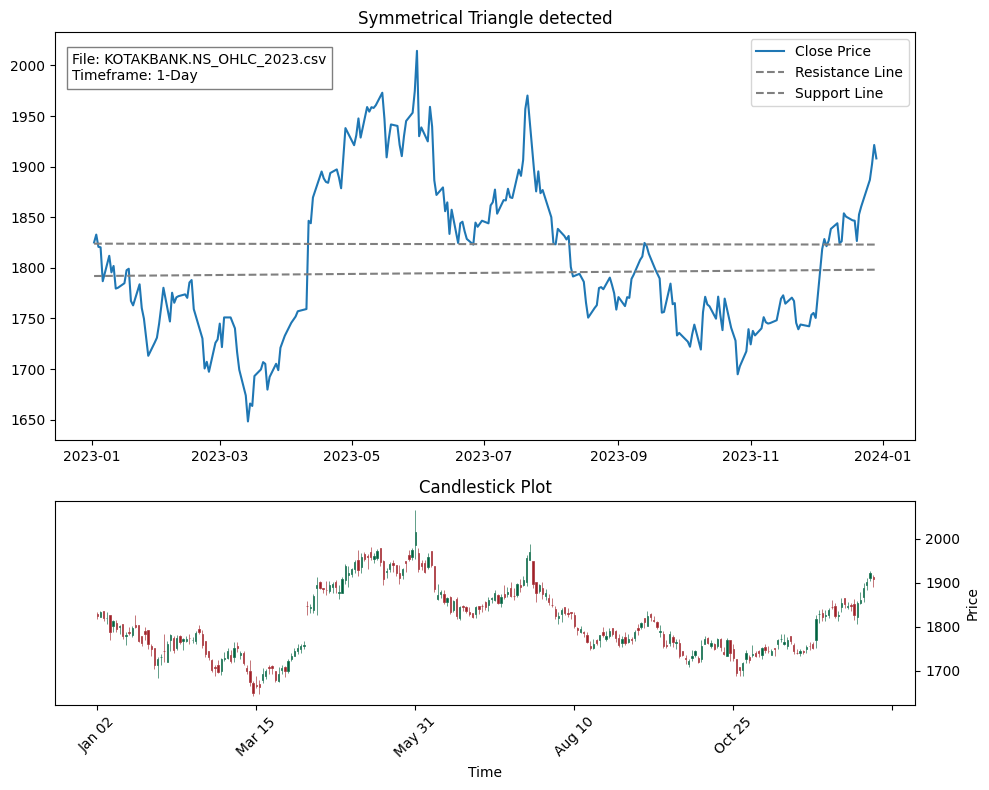

File: D:\AlgoT\yfinanceData\processed_KOTAKBANK.NS_OHLC_2023.csv, Timeframe: 1-Day, Type: Symmetrical Triangle


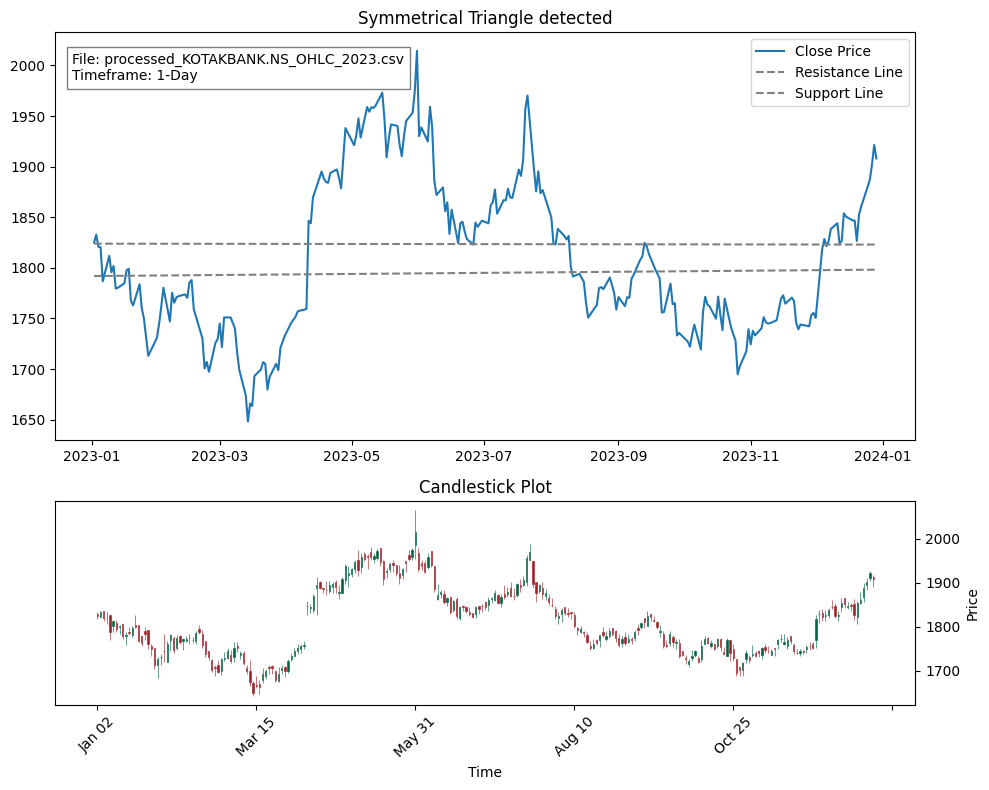

In [7]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import mplfinance as mpf
import os
import glob
from scipy.stats import linregress

# Function to count the number of touches for a trendline
def count_touches(prices, indices, slope, intercept, tolerance=3):
    count = 0
    for i in indices:
        expected_price = slope * i + intercept
        actual_price = prices.iloc[i]
        if abs(actual_price - expected_price) <= tolerance:
            count += 1
    return count

# Function to detect triangle patterns
def detect_triangle_patterns(data):
    patterns = []
    indices = np.arange(len(data))
    
    # Get high and low prices
    highs = data['High']
    lows = data['Low']
    
    # Linear regression for highs and lows
    high_slope, high_intercept, _, _, _ = linregress(indices, highs)
    low_slope, low_intercept, _, _, _ = linregress(indices, lows)
    
    # Count touches for both trendlines
    high_touches = count_touches(highs, indices, high_slope, high_intercept)
    low_touches = count_touches(lows, indices, low_slope, low_intercept)
    
    # Check for convergence and sufficient touches
    if high_slope < 0 and low_slope > 0 and high_touches >= 3 and low_touches >= 3:
        patterns.append({
            'type': 'Symmetrical Triangle',
            'high_slope': high_slope,
            'high_intercept': high_intercept,
            'low_slope': low_slope,
            'low_intercept': low_intercept
        })
    elif high_slope == 0 and low_slope > 0 and high_touches >= 3 and low_touches >= 3:
        patterns.append({
            'type': 'Ascending Triangle',
            'high_slope': high_slope,
            'high_intercept': high_intercept,
            'low_slope': low_slope,
            'low_intercept': low_intercept
        })
    elif high_slope < 0 and low_slope == 0 and high_touches >= 3 and low_touches >= 3:
        patterns.append({
            'type': 'Descending Triangle',
            'high_slope': high_slope,
            'high_intercept': high_intercept,
            'low_slope': low_slope,
            'low_intercept': low_intercept
        })
    
    return patterns

# Function to process a single CSV file
def process_csv_file(file_path, patterns_list):
    try:
        data = pd.read_csv(file_path)
        if data.empty or 'Close' not in data.columns:
            print(f"Skipping {file_path}: Empty or missing 'Close' data.")
            return
        data['Date'] = pd.to_datetime(data['Date'])
        data.set_index('Date', inplace=True)
    except (pd.errors.EmptyDataError, pd.errors.ParserError) as e:
        print(f"Skipping {file_path}: {e}")
        return
    
    timeframes = {'1-Day': data}

    for timeframe, resampled_data in timeframes.items():
        # Detect triangle patterns
        patterns = detect_triangle_patterns(resampled_data)
        
        # Display detected patterns and plot the chart for each pattern
        for pattern in patterns:
            print(f"File: {file_path}, Timeframe: {timeframe}, Type: {pattern['type']}")
            
            patterns_list.append({
                'file': os.path.basename(file_path),
                'timeframe': timeframe,
                'type': pattern['type'],
                'date': resampled_data.index[-1],  # Use the last date in the range
            })
            
            start_index = 0
            end_index = len(resampled_data) - 1
            pattern_data = resampled_data.iloc[start_index:end_index+1]
            
            # Setup figure and subplots
            fig, (ax, ax2) = plt.subplots(2, 1, figsize=(10, 8), gridspec_kw={'height_ratios': [2, 1]})
            
            # First subplot for the pattern
            ax.plot(pattern_data.index, pattern_data['Close'], label='Close Price')
            
            # Plot trendlines for the triangle pattern
            trendline_x = np.array([start_index, end_index])
            high_trendline_y = pattern['high_slope'] * trendline_x + pattern['high_intercept']
            low_trendline_y = pattern['low_slope'] * trendline_x + pattern['low_intercept']
            ax.plot(pattern_data.index[trendline_x], high_trendline_y, color='gray', linestyle='--', label='Resistance Line')
            ax.plot(pattern_data.index[trendline_x], low_trendline_y, color='gray', linestyle='--', label='Support Line')
            
            ax.set_title(f"{pattern['type']} detected")
            ax.legend()
            
            # Add file name and timeframe text
            ax.text(0.02, 0.95, f'File: {os.path.basename(file_path)}\nTimeframe: {timeframe}', transform=ax.transAxes, fontsize=10, verticalalignment='top', bbox=dict(facecolor='white', alpha=0.5))
            
            # Second subplot for candlestick
            mpf.plot(pattern_data, type='candle', ax=ax2, style='charles')
            ax2.set_xlabel('Time')
            ax2.set_ylabel('Price')
            ax2.set_title('Candlestick Plot')
            
            plt.xticks(rotation=45)
            plt.tight_layout()
            plt.show()

# Main function to process all CSV files in a directory
def process_all_csv_files_in_directory(directory_path):
    csv_files = glob.glob(os.path.join(directory_path, "*.csv"))
    patterns_list = []
    
    for file_path in csv_files:
        process_csv_file(file_path, patterns_list)
    
    # Create DataFrame from patterns_list and save to CSV
    patterns_df = pd.DataFrame(patterns_list)
    patterns_df.to_csv(os.path.join(directory_path, "detected_patterns.csv"), index=False)

# Example usage
directory_path = r"D:\AlgoT\yfinanceData"
process_all_csv_files_in_directory(directory_path)
